### IPIP-NEO-120 Data Acquisition

This module performs the controlled acquisition of the IPIP-NEO-120 dataset from the Open Science Framework (OSF).

It recursively searches the specified OSF storage node for the official `IPIP120.dat` file, retrieves its metadata and download endpoint, and downloads the file to a controlled local research directory.

The module also performs basic post-download integrity checks, including file existence, non-zero size, byte-level readability, and preliminary textual inspection of the retrieved dataset.

The declared respondent count is stored as an expected reference value and is not independently validated by this module.

No data preprocessing, structural reconstruction, scoring, model training, or statistical analysis is performed at this stage.

**Output:**
`IPIP120.dat` — acquired raw source dataset for subsequent structural auditing and preprocessing.



In [3]:
import os
import json
import hashlib
import requests
from pathlib import Path


ROOT = Path(
    "/content/HEF_IPIP120_SOURCE"
)

ROOT.mkdir(
    parents=True,
    exist_ok=True
)

IPIP120_PATH = (
    ROOT /
    "IPIP120.dat"
)

OSF_NODE = (
    "wxvth"
)

OSF_API_ROOT = (
    f"https://api.osf.io/v2/nodes/"
    f"{OSF_NODE}/files/osfstorage/"
)

EXPECTED_RESPONDENTS = 619_150

USER_AGENT = (
    "HEF-IPIP120-Research/1.0"
)



print("=" * 110)
print("HEF IPIP-NEO-120 — JOHNSON DATA ACQUISITION")
print("=" * 110)

print(
    "\nOSF NODE:"
)

print(
    OSF_NODE
)

print(
    "\nOSF API:"
)

print(
    OSF_API_ROOT
)

print(
    "\nEXPECTED RESPONDENTS:"
)

print(
    f"{EXPECTED_RESPONDENTS:,}"
)

print(
    "\nTARGET:"
)

print(
    IPIP120_PATH
)



session = requests.Session()

session.headers.update({
    "User-Agent": USER_AGENT
})



def fetch_json(
    url
):

    response = session.get(
        url,
        timeout=90
    )

    response.raise_for_status()

    return response.json()



print("\n" + "=" * 110)
print("SEARCHING CORRECT OSF PROJECT")
print("=" * 110)


def discover_ipip120(
    url
):

    visited = set()

    while url:

        if url in visited:

            break

        visited.add(
            url
        )

        payload = fetch_json(
            url
        )

        for obj in payload.get(
            "data",
            []
        ):

            attrs = obj.get(
                "attributes",
                {}
            )

            kind = attrs.get(
                "kind"
            )

            name = str(
                attrs.get(
                    "name",
                    ""
                )
            ).strip()

            if (
                kind == "file"
                and
                name.lower() == "ipip120.dat"
            ):

                return obj


            if (
                kind == "folder"
            ):

                relationships = (
                    obj.get(
                        "relationships",
                        {}
                    )
                )

                files_relation = (
                    relationships
                    .get(
                        "files",
                        {}
                    )
                )

                related = (
                    files_relation
                    .get(
                        "links",
                        {}
                    )
                    .get(
                        "related"
                    )
                )

                if related:

                    child_url = (
                        related.get(
                            "href"
                        )
                    )

                    if child_url:

                        found = discover_ipip120(
                            child_url
                        )

                        if found is not None:

                            return found


        next_url = (
            payload
            .get(
                "links",
                {}
            )
            .get(
                "next"
            )
        )

        if isinstance(
            next_url,
            dict
        ):

            next_url = next_url.get(
                "href"
            )

        url = next_url

    return None


try:

    IPIP120_OBJECT = (
        discover_ipip120(
            OSF_API_ROOT
        )
    )

except Exception as e:

    raise RuntimeError(
        "\nOSF discovery failed.\n"
        f"{type(e).__name__}: {e}"
    )


if IPIP120_OBJECT is None:

    raise RuntimeError(
        "\nIPIP120.dat was NOT found in OSF node wxvth.\n\n"
        "The Johnson repository is known to contain the IPIP-NEO-120 "
        "dataset, but the API did not expose the file through this path."
    )


ATTRS = (
    IPIP120_OBJECT
    .get(
        "attributes",
        {}
    )
)

LINKS = (
    IPIP120_OBJECT
    .get(
        "links",
        {}
    )
)

IPIP120_DOWNLOAD = (
    LINKS.get(
        "download"
    )
)

print("\n" + "=" * 110)
print("IPIP120.DAT FOUND")
print("=" * 110)

print(
    "\nName:"
)

print(
    ATTRS.get(
        "name"
    )
)

print(
    "\nPath:"
)

print(
    ATTRS.get(
        "path"
    )
)

print(
    "\nSize:"
)

print(
    ATTRS.get(
        "size"
    )
)

print(
    "\nOSF file ID:"
)

print(
    IPIP120_OBJECT.get(
        "id"
    )
)

print(
    "\nDownload URL:"
)

print(
    IPIP120_DOWNLOAD
)


if not IPIP120_DOWNLOAD:

    raise RuntimeError(
        "IPIP120.dat was found but OSF did not provide "
        "a download URL."
    )



print("\n" + "=" * 110)
print("DOWNLOADING IPIP120.DAT")
print("=" * 110)


TEMP_PATH = (
    ROOT /
    "IPIP120.dat.part"
)


if TEMP_PATH.exists():

    TEMP_PATH.unlink()

    print(
        "Old partial file removed."
    )


try:

    with session.get(
        IPIP120_DOWNLOAD,
        stream=True,
        timeout=180
    ) as response:

        response.raise_for_status()

        remote_size = (
            response.headers.get(
                "content-length"
            )
        )

        if remote_size:

            remote_size = int(
                remote_size
            )

            print(
                f"\nRemote size: "
                f"{remote_size / (1024**2):.2f} MB"
            )

        else:

            remote_size = None

            print(
                "\nRemote size: unknown"
            )


        bytes_written = 0


        with open(
            TEMP_PATH,
            "wb"
        ) as f:

            for chunk in response.iter_content(
                chunk_size=8 * 1024 * 1024
            ):

                if not chunk:

                    continue

                f.write(
                    chunk
                )

                bytes_written += len(
                    chunk
                )

                if remote_size:

                    pct = (
                        bytes_written
                        /
                        remote_size
                        *
                        100
                    )

                    print(
                        f"\rDownloaded: "
                        f"{bytes_written/(1024**2):.2f} MB "
                        f"({pct:6.2f}%)",
                        end=""
                    )

    print()

    os.replace(
        TEMP_PATH,
        IPIP120_PATH
    )


except Exception as e:

    if TEMP_PATH.exists():

        TEMP_PATH.unlink()

    raise RuntimeError(
        "\nIPIP120.dat download failed.\n"
        f"{type(e).__name__}: {e}"
    )



if not IPIP120_PATH.exists():

    raise RuntimeError(
        "Download completed without creating IPIP120.dat."
    )


FILE_SIZE = (
    IPIP120_PATH.stat().st_size
)

FILE_SIZE_MB = (
    FILE_SIZE
    /
    (1024 ** 2)
)


print("\n" + "=" * 110)
print("DOWNLOAD COMPLETE")
print("=" * 110)

print(
    f"\nPath : {IPIP120_PATH}"
)

print(
    f"Size : {FILE_SIZE_MB:.2f} MB"
)

print(
    f"Bytes: {FILE_SIZE:,}"
)


if FILE_SIZE == 0:

    raise RuntimeError(
        "CRITICAL: IPIP120.dat is empty."
    )



print("\n" + "=" * 110)
print("BASIC FILE TEST")
print("=" * 110)

with open(
    IPIP120_PATH,
    "rb"
) as f:

    head = f.read(
        4096
    )

if len(head) == 0:

    raise RuntimeError(
        "CRITICAL: IPIP120.dat contains no bytes."
    )


print(
    f"Read first {len(head):,} bytes ✓"
)



try:

    decoded_head = (
        head.decode(
            "latin-1",
            errors="replace"
        )
    )

    print(
        "\nFirst 500 characters:"
    )

    print(
        decoded_head[:500]
    )

except Exception as e:

    raise RuntimeError(
        "IPIP120.dat could not be decoded for structural inspection.\n"
        f"{type(e).__name__}: {e}"
    )


print("\n" + "=" * 110)
print("IPIP120.DAT ACQUISITION: PASS ✓")
print("=" * 110)

print(
    "\nNext step:"
)

print(
    "STRUCTURAL AUDIT — DO NOT TRAIN YET."
)

HEF IPIP-NEO-120 — JOHNSON DATA ACQUISITION

OSF NODE:
wxvth

OSF API:
https://api.osf.io/v2/nodes/wxvth/files/osfstorage/

EXPECTED RESPONDENTS:
619,150

TARGET:
/content/HEF_IPIP120_SOURCE/IPIP120.dat

SEARCHING CORRECT OSF PROJECT

IPIP120.DAT FOUND

Name:
IPIP120.dat

Path:
/563a5c9d8c5e4a40e2c1bf4e

Size:
94729950

OSF file ID:
563a5c9d8c5e4a40e2c1bf4e

Download URL:
https://osf.io/download/q9jrh/

DOWNLOADING IPIP120.DAT

Remote size: 90.34 MB
Downloaded: 90.34 MB (100.00%)

DOWNLOAD COMPLETE

Path : /content/HEF_IPIP120_SOURCE/IPIP120.dat
Size : 90.34 MB
Bytes: 94,729,950

BASIC FILE TEST
Read first 4,096 bytes ✓

First 500 characters:
     1219 8411630 6101South Afr545442554424444124545443224244244442444144454424544444424454255442225225554234344245215444245442445244544423445244424154
     222224451630 6101USA      544255545444554355141534432543445245445542455254221554534445254254445444252444522354442554344354555244455444251433442343
     4222 3571630 6101USA      45544243444255

### Semantic / Psychometric Audit

This module performs the semantic and psychometric audit of the raw IPIP-NEO-120 response matrix.

It reads the fixed-format dataset using memory mapping, extracts the 120 response items, verifies the allowed response domain, and characterizes missingness across items and respondents. It also reports response-value frequencies and evaluates the completeness of the observed response structure.

The module defines and validates the 30-facet scoring map, ensuring exact coverage of all 120 items and the corresponding forward/reverse scoring directions.

Observed responses are reverse-keyed according to the validated scoring map, while missing responses are preserved as `NaN`. The resulting response matrix is then used to compute the 30-facet Gold Master scores using row-wise `nanmean`.

No raw data are modified, no imputation is performed, and no model training is executed.

**Output:**
A validated scored response matrix and a 30-facet Gold Master prepared for subsequent dataset validation and modeling.


In [4]:


import numpy as np
from pathlib import Path

print("\n" + "=" * 120)
print("NIVEL 05 — SEMANTIC / PSYCHOMETRIC AUDIT")
print("=" * 120)



DATA_PATH = Path(
    "/content/HEF_IPIP120_SOURCE/IPIP120.dat"
)

EXPECTED_ROWS = 619_150
EXPECTED_ITEMS = 120
RECORD_BYTES = 153
METADATA_BYTES = 31
RESPONSE_BYTES = 120

EXPECTED_SIZE = (
    EXPECTED_ROWS * RECORD_BYTES
)



raw_mm = np.memmap(
    DATA_PATH,
    dtype=np.uint8,
    mode="r",
    shape=(EXPECTED_SIZE,)
)

records = raw_mm.reshape(
    EXPECTED_ROWS,
    RECORD_BYTES
)

content = records[:, :-1]

item_bytes = content[
    :,
    METADATA_BYTES:
    METADATA_BYTES + RESPONSE_BYTES
]

responses = (
    item_bytes - ord("0")
).astype(np.uint8)

print(
    f"\nResponses shape : {responses.shape}"
)

print(
    f"dtype           : {responses.dtype}"
)



print("\n" + "-" * 120)
print("NIVEL 05.1 — RESPONSE DOMAIN")
print("-" * 120)

unique_values = np.unique(responses)

print(
    "Observed values:",
    unique_values.tolist()
)

if not np.all(
    np.isin(
        unique_values,
        [0, 1, 2, 3, 4, 5]
    )
):
    raise RuntimeError(
        "Unexpected response value detected."
    )


valid_mask = (
    (responses >= 1) &
    (responses <= 5)
)

missing_mask = (
    responses == 0
)

valid_count = int(
    valid_mask.sum()
)

missing_count = int(
    missing_mask.sum()
)

total_cells = (
    EXPECTED_ROWS * EXPECTED_ITEMS
)

print(
    f"\nTotal response cells : {total_cells:,}"
)

print(
    f"Valid 1..5 cells     : {valid_count:,}"
)

print(
    f"Zero cells           : {missing_count:,}"
)

print(
    f"Missing rate         : "
    f"{missing_count / total_cells:.8%}"
)


if missing_count > 0:

    print(
        "\n0 detected."
    )

    print(
        "Interpretation policy:"
    )

    print(
        "0 will NOT be scored as a psychological response."
    )

    print(
        "0 will be preserved as missing."
    )

else:

    print(
        "\nNo zero responses detected."
    )

print("\n" + "-" * 120)
print("NIVEL 05.2 — MISSINGNESS BY ITEM")
print("-" * 120)

missing_per_item = (
    missing_mask.sum(axis=0)
)

missing_rate_per_item = (
    missing_per_item
    /
    EXPECTED_ROWS
)

for i in range(EXPECTED_ITEMS):

    print(
        f"I{i+1:03d} | "
        f"missing={int(missing_per_item[i]):8,d} | "
        f"rate={missing_rate_per_item[i]:.6%}"
    )

print(
    "\nWorst item by missingness:",
    int(np.argmax(missing_per_item)) + 1
)

print(
    "Best item by missingness:",
    int(np.argmin(missing_per_item)) + 1
)


print("\n" + "-" * 120)
print("NIVEL 05.3 — MISSINGNESS BY RESPONDENT")
print("-" * 120)

missing_per_person = (
    missing_mask.sum(axis=1)
)

print(
    "Minimum missing:",
    int(missing_per_person.min())
)

print(
    "Maximum missing:",
    int(missing_per_person.max())
)

print(
    "Mean missing:",
    float(missing_per_person.mean())
)

print(
    "Median missing:",
    float(np.median(missing_per_person))
)

print(
    "Respondents with zero missing:",
    int(
        np.count_nonzero(
            missing_per_person == 0
        )
    )
)

print(
    "Respondents with >=1 missing:",
    int(
        np.count_nonzero(
            missing_per_person >= 1
        )
    )
)

print("\n" + "-" * 120)
print("NIVEL 05.4 — RESPONSE FREQUENCIES")
print("-" * 120)

for value in range(6):

    count = int(
        np.count_nonzero(
            responses == value
        )
    )

    rate = (
        count
        /
        total_cells
    )

    print(
        f"value={value} | "
        f"count={count:,} | "
        f"rate={rate:.8%}"
    )


FACET_KEY = {

    "N1_Anxiety": {
        "items": [1, 31, 61, 91],
        "signs": [1, 1, 1, 1],
    },

    "N2_Anger": {
        "items": [6, 36, 66, 96],
        "signs": [1, 1, 1, -1],
    },

    "N3_Depression": {
        "items": [11, 41, 71, 101],
        "signs": [1, 1, 1, -1],
    },

    "N4_SelfConsciousness": {
        "items": [16, 46, 76, 106],
        "signs": [1, 1, 1, -1],
    },

    "N5_Immoderation": {
        "items": [21, 51, 81, 111],
        "signs": [1, -1, -1, -1],
    },

    "N6_Vulnerability": {
        "items": [26, 56, 86, 116],
        "signs": [1, 1, 1, -1],
    },

    "E1_Friendliness": {
        "items": [2, 32, 62, 92],
        "signs": [1, 1, -1, -1],
    },

    "E2_Gregariousness": {
        "items": [7, 37, 67, 97],
        "signs": [1, 1, -1, -1],
    },

    "E3_Assertiveness": {
        "items": [12, 42, 72, 102],
        "signs": [1, 1, 1, -1],
    },

    "E4_ActivityLevel": {
        "items": [17, 47, 77, 107],
        "signs": [1, 1, 1, -1],
    },

    "E5_ExcitementSeeking": {
        "items": [22, 52, 82, 112],
        "signs": [1, 1, 1, 1],
    },

    "E6_Cheerfulness": {
        "items": [27, 57, 87, 117],
        "signs": [1, 1, 1, 1],
    },

    "O1_Imagination": {
        "items": [3, 33, 63, 93],
        "signs": [1, 1, 1, 1],
    },

    "O2_ArtisticInterests": {
        "items": [8, 38, 68, 98],
        "signs": [1, 1, -1, -1],
    },

    "O3_Emotionality": {
        "items": [13, 43, 73, 103],
        "signs": [1, 1, -1, -1],
    },

    "O4_Adventurousness": {
        "items": [18, 48, 78, 108],
        "signs": [1, -1, -1, -1],
    },

    "O5_Intellect": {
        "items": [23, 53, 83, 113],
        "signs": [1, -1, -1, -1],
    },

    "O6_Liberalism": {
        "items": [28, 58, 88, 118],
        "signs": [1, 1, -1, -1],
    },

    "A1_Trust": {
        "items": [4, 34, 64, 94],
        "signs": [1, 1, 1, -1],
    },

    "A2_Morality": {
        "items": [9, 39, 69, 99],
        "signs": [-1, -1, -1, -1],
    },

    "A3_Altruism": {
        "items": [14, 44, 74, 104],
        "signs": [1, 1, -1, -1],
    },

    "A4_Cooperation": {
        "items": [19, 49, 79, 109],
        "signs": [-1, -1, -1, -1],
    },

    "A5_Modesty": {
        "items": [24, 54, 84, 114],
        "signs": [-1, -1, -1, -1],
    },

    "A6_Sympathy": {
        "items": [29, 59, 89, 119],
        "signs": [1, 1, -1, -1],
    },

    "C1_SelfEfficacy": {
        "items": [5, 35, 65, 95],
        "signs": [1, 1, 1, 1],
    },

    "C2_Orderliness": {
        "items": [10, 40, 70, 100],
        "signs": [1, -1, -1, -1],
    },

    "C3_Dutifulness": {
        "items": [15, 45, 75, 105],
        "signs": [1, 1, -1, -1],
    },

    "C4_AchievementStriving": {
        "items": [20, 50, 80, 110],
        "signs": [1, 1, -1, -1],
    },

    "C5_SelfDiscipline": {
        "items": [25, 55, 85, 115],
        "signs": [1, 1, -1, -1],
    },

    "C6_Cautiousness": {
        "items": [30, 60, 90, 120],
        "signs": [-1, -1, -1, -1],
    },
}

print("\n" + "-" * 120)
print("NIVEL 05.5 — KEY CONSISTENCY")
print("-" * 120)

all_items = []

for facet_name, spec in FACET_KEY.items():

    items = spec["items"]
    signs = spec["signs"]

    if len(items) != 4:
        raise RuntimeError(
            f"{facet_name}: does not contain exactly 4 items."
        )

    if len(signs) != 4:
        raise RuntimeError(
            f"{facet_name}: sign count != 4."
        )

    all_items.extend(items)

if len(FACET_KEY) != 30:

    raise RuntimeError(
        "Expected exactly 30 facets."
    )

if len(all_items) != 120:

    raise RuntimeError(
        "Expected exactly 120 mapped items."
    )

if sorted(all_items) != list(range(1, 121)):

    raise RuntimeError(
        "Item mapping is not a perfect permutation of 1..120."
    )

print(
    "Facets : 30 ✓"
)

print(
    "Items  : 120 ✓"
)

print(
    "Coverage: 1..120 exactly once ✓"
)

print(
    "Four items per facet ✓"
)


item_facet = [
    None
] * 120

item_sign = np.zeros(
    120,
    dtype=np.int8
)

for facet_name, spec in FACET_KEY.items():

    for item_number, sign in zip(
        spec["items"],
        spec["signs"]
    ):

        idx = item_number - 1

        item_facet[idx] = facet_name
        item_sign[idx] = sign

if any(
    x is None
    for x in item_facet
):

    raise RuntimeError(
        "Some item has no facet assignment."
    )

if np.any(
    item_sign == 0
):

    raise RuntimeError(
        "Some item has no scoring sign."
    )


print("\n" + "-" * 120)
print("ITEM MASTER MAP")
print("-" * 120)

for i in range(120):

    print(
        f"I{i+1:03d} | "
        f"{item_facet[i]:25s} | "
        f"{'FORWARD' if item_sign[i] == 1 else 'REVERSE'}"
    )


scored = (
    responses.astype(np.float32)
)

observed = (
    responses > 0
)

for i in range(120):

    if item_sign[i] == -1:

        scored[
            observed[:, i],
            i
        ] = (
            6.0
            -
            scored[
                observed[:, i],
                i
            ]
        )

scored[
    ~observed
] = np.nan

print("\n" + "-" * 120)
print("GOLD-READY RESPONSE MATRIX")
print("-" * 120)

print(
    "shape:",
    scored.shape
)

print(
    "dtype:",
    scored.dtype
)

print(
    "Observed range:",
    np.nanmin(scored),
    "to",
    np.nanmax(scored)
)


facet_names = list(
    FACET_KEY.keys()
)

gold_facets = np.full(
    (
        EXPECTED_ROWS,
        30
    ),
    np.nan,
    dtype=np.float32
)

for j, facet_name in enumerate(
    facet_names
):

    item_indices = [
        x - 1
        for x in
        FACET_KEY[facet_name]["items"]
    ]

    facet_block = scored[
        :,
        item_indices
    ]

    gold_facets[
        :,
        j
    ] = np.nanmean(
        facet_block,
        axis=1
    )

print(
    "\nGold Master facet matrix:"
)

print(
    gold_facets.shape
)

print(
    "Expected:",
    (619_150, 30)
)

print(
    "\nNIVEL 05 COMPLETE ✓"
)

print(
    "\nRAW remains untouched."
)

print(
    "No training performed."
)

print(
    "No imputation performed."
)

print(
    "Missing values preserved."
)

print(
    "Reverse-keying applied only to observed values."
)

print(
    "Gold Master prepared for validation."
)


NIVEL 05 — SEMANTIC / PSYCHOMETRIC AUDIT

Responses shape : (619150, 120)
dtype           : uint8

------------------------------------------------------------------------------------------------------------------------
NIVEL 05.1 — RESPONSE DOMAIN
------------------------------------------------------------------------------------------------------------------------
Observed values: [0, 1, 2, 3, 4, 5]

Total response cells : 74,298,000
Valid 1..5 cells     : 73,930,407
Zero cells           : 367,593
Missing rate         : 0.49475491%

0 detected.
Interpretation policy:
0 will NOT be scored as a psychological response.
0 will be preserved as missing.

------------------------------------------------------------------------------------------------------------------------
NIVEL 05.2 — MISSINGNESS BY ITEM
------------------------------------------------------------------------------------------------------------------------
I001 | missing=     785 | rate=0.126787%
I002 | missing=     858

/tmp/ipykernel_495/1169105659.py:593: RuntimeWarning: Mean of empty slice
  ] = np.nanmean(



Gold Master facet matrix:
(619150, 30)
Expected: (619150, 30)

NIVEL 05 COMPLETE ✓

RAW remains untouched.
No training performed.
No imputation performed.
Missing values preserved.
Reverse-keying applied only to observed values.
Gold Master prepared for validation.


### Empty Facet Audit

This module identifies respondent-facet instances in which all four items belonging to a facet are missing.

It determines the total number of completely missing facet instances, reports their distribution by facet and respondent, and compares the resulting count against the number of `NaN` cells in the Gold Master.

The audit is diagnostic only and does not modify the Gold Master or the underlying scored data.

**Output:**
Identification and consistency assessment of completely missing facet instances, including a Gold Master `NaN` consistency check.


In [5]:
print("\n" + "-" * 120)
print("NIVEL 05.6 — EMPTY FACET AUDIT")
print("-" * 120)

facet_all_missing = np.all(
    np.isnan(
        np.stack([
            scored[:, [i - 1 for i in FACET_KEY[facet]["items"]]]
            for facet in FACET_KEY
        ], axis=1)
    ),
    axis=2
)

print(
    "\nMatrix all-missing:",
    facet_all_missing.shape
)

total_empty_cells = int(
    facet_all_missing.sum()
)

print(
    "\nTotal completely-missing facet instances:",
    f"{total_empty_cells:,}"
)

print("\nCompletely missing facets:")

for j, facet_name in enumerate(FACET_KEY):

    count = int(
        facet_all_missing[:, j].sum()
    )

    if count > 0:

        rate = (
            count /
            EXPECTED_ROWS
        )

        print(
            f"{facet_name:30s} | "
            f"{count:8,d} | "
            f"{rate:.8%}"
        )

empty_facets_per_person = (
    facet_all_missing.sum(axis=1)
)

respondents_with_empty_facet = int(
    np.count_nonzero(
        empty_facets_per_person > 0
    )
)

max_empty_facets = int(
    empty_facets_per_person.max()
)

print(
    "\nRespondents with >=1 completely missing facet:",
    f"{respondents_with_empty_facet:,}"
)

print(
    "Maximum completely missing facets for one respondent:",
    max_empty_facets
)

gold_nan_count = int(
    np.isnan(gold_facets).sum()
)

print(
    "\nNaN cells in Gold Master:",
    f"{gold_nan_count:,}"
)

if gold_nan_count != total_empty_cells:

    print(
        "\nWARNING:"
        "\nGold Master NaN count does not exactly match"
        "\ncompletely-missing facet count."
    )

else:

    print(
        "\nGold Master NaN consistency: PASS ✓"
    )

print(
    "\nEMPTY FACET AUDIT COMPLETE ✓"
)


------------------------------------------------------------------------------------------------------------------------
NIVEL 05.6 — EMPTY FACET AUDIT
------------------------------------------------------------------------------------------------------------------------

Matrix all-missing: (619150, 30)

Total completely-missing facet instances: 1

Completely missing facets:
N5_Immoderation                |        1 | 0.00016151%

Respondents with >=1 completely missing facet: 1
Maximum completely missing facets for one respondent: 1

NaN cells in Gold Master: 1

Gold Master NaN consistency: PASS ✓

EMPTY FACET AUDIT COMPLETE ✓


### HEF IPIP-120 Robust Dataset V1

This module initializes the controlled configuration for the HEF IPIP-120 Robust Dataset V1.

It establishes the reproducible random seed, dataset directory structure, training, validation, and test sample sizes, shard size, corruption families, and balanced corruption probabilities.

The methodology distinguishes complete participants, which provide the Gold reference through traditional scoring, from participants with missing responses, which are used exclusively as reservoirs of observed responses and do not receive Gold labels.

No data generation, corruption application, scoring, or model training is performed by this initialization stage.

**Output:**
A reproducibly configured dataset environment for subsequent robust dataset generation.


In [6]:
import os
import json
import math
import numpy as np
from pathlib import Path
from itertools import combinations, product

SEED = 20260917
rng = np.random.default_rng(SEED)

ROOT = Path("/content/HEF_IPIP120_ROBUST_DATASET_V1")

TRAIN_DIR = ROOT / "TRAIN"
VAL_DIR   = ROOT / "VALIDATION"
TEST_DIR  = ROOT / "TEST"

for d in [TRAIN_DIR, VAL_DIR, TEST_DIR]:
    d.mkdir(parents=True, exist_ok=True)

N_TRAIN_CLEAN      = 500_000
N_TRAIN_CORRUPTED  = 5_000_000

N_VAL_CLEAN        = 100_000
N_VAL_CORRUPTED    = 500_000

N_TEST_CLEAN       = 0
N_TEST_CORRUPTED   = 0

SHARD_SIZE = 25_000

CORRUPTION_TYPES = [
    "ITEM_SWAP",
    "FACET_SWAP",
    "HALF_CATEGORY_SWAP",
    "CATEGORY_SWAP",
    "ITEM_COLLAPSE",
    "CATEGORY_COLLAPSE",
]

CORRUPTION_PROBS = np.array([
    1/6,
    1/6,
    1/6,
    1/6,
    1/6,
    1/6,
], dtype=np.float64)

assert np.isclose(CORRUPTION_PROBS.sum(), 1.0)

print("=" * 80)
print("HEF IPIP-120 ROBUST DATASET V1")
print("=" * 80)
print("ROOT:", ROOT)
print("SEED:", SEED)
print("SHARD_SIZE:", SHARD_SIZE)

HEF IPIP-120 ROBUST DATASET V1
ROOT: /content/HEF_IPIP120_ROBUST_DATASET_V1
SEED: 20260917
SHARD_SIZE: 25000


### IPIP-NEO-120 Instrument Map

This module defines the complete structural and scoring map of the IPIP-NEO-120 instrument.

It establishes the 30 psychometric facets, their corresponding four-item mappings, the five higher-order domains, and the domain-to-facet organization. It also defines the reverse-scoring configuration for each facet and constructs the zero-based item indices required for computational processing.

The module generates the facet-to-output mapping and the 120-item reverse-scoring mask used by the Gold scoring pipeline.

Integrity checks verify the expected 30 facets and complete, non-duplicated coverage of all 120 instrument items.

**Output:**
Validated instrument structure, facet and domain indices, output-position mapping, and item-level reverse-scoring mask.


In [7]:
import numpy as np
from pathlib import Path

FACETS = {
    "N1_Anxiety":             [1, 31, 61, 91],
    "N2_Anger":               [6, 36, 66, 96],
    "N3_Depression":          [11, 41, 71, 101],
    "N4_SelfConsciousness":   [16, 46, 76, 106],
    "N5_Immoderation":        [21, 51, 81, 111],
    "N6_Vulnerability":       [26, 56, 86, 116],

    "E1_Friendliness":        [2, 32, 62, 92],
    "E2_Gregariousness":      [7, 37, 67, 97],
    "E3_Assertiveness":       [12, 42, 72, 102],
    "E4_ActivityLevel":       [17, 47, 77, 107],
    "E5_ExcitementSeeking":   [22, 52, 82, 112],
    "E6_Cheerfulness":        [27, 57, 87, 117],

    "O1_Imagination":         [3, 33, 63, 93],
    "O2_ArtisticInterests":   [8, 38, 68, 98],
    "O3_Emotionality":        [13, 43, 73, 103],
    "O4_Adventurousness":     [18, 48, 78, 108],
    "O5_Intellect":           [23, 53, 83, 113],
    "O6_Liberalism":          [28, 58, 88, 118],

    "A1_Trust":               [4, 34, 64, 94],
    "A2_Morality":            [9, 39, 69, 99],
    "A3_Altruism":            [14, 44, 74, 104],
    "A4_Cooperation":         [19, 49, 79, 109],
    "A5_Modesty":             [24, 54, 84, 114],
    "A6_Sympathy":            [29, 59, 89, 119],

    "C1_SelfEfficacy":        [5, 35, 65, 95],
    "C2_Orderliness":         [10, 40, 70, 100],
    "C3_Dutifulness":         [15, 45, 75, 105],
    "C4_AchievementStriving": [20, 50, 80, 110],
    "C5_SelfDiscipline":      [25, 55, 85, 115],
    "C6_Cautiousness":        [30, 60, 90, 120],
}

DOMAINS = {
    "N": [
        "N1_Anxiety",
        "N2_Anger",
        "N3_Depression",
        "N4_SelfConsciousness",
        "N5_Immoderation",
        "N6_Vulnerability",
    ],
    "E": [
        "E1_Friendliness",
        "E2_Gregariousness",
        "E3_Assertiveness",
        "E4_ActivityLevel",
        "E5_ExcitementSeeking",
        "E6_Cheerfulness",
    ],
    "O": [
        "O1_Imagination",
        "O2_ArtisticInterests",
        "O3_Emotionality",
        "O4_Adventurousness",
        "O5_Intellect",
        "O6_Liberalism",
    ],
    "A": [
        "A1_Trust",
        "A2_Morality",
        "A3_Altruism",
        "A4_Cooperation",
        "A5_Modesty",
        "A6_Sympathy",
    ],
    "C": [
        "C1_SelfEfficacy",
        "C2_Orderliness",
        "C3_Dutifulness",
        "C4_AchievementStriving",
        "C5_SelfDiscipline",
        "C6_Cautiousness",
    ],
}

DOMAIN_NAMES = ["N", "E", "O", "A", "C"]

REVERSE_SIGNS = {
    "N1_Anxiety":             "++++",
    "N2_Anger":               "+++-",
    "N3_Depression":          "+++-",
    "N4_SelfConsciousness":   "+++-",
    "N5_Immoderation":        "+---",
    "N6_Vulnerability":       "+++-",

    "E1_Friendliness":        "++--",
    "E2_Gregariousness":      "++--",
    "E3_Assertiveness":       "+++-",
    "E4_ActivityLevel":       "+++-",
    "E5_ExcitementSeeking":   "++++",
    "E6_Cheerfulness":        "++++",

    "O1_Imagination":         "++++",
    "O2_ArtisticInterests":   "++--",
    "O3_Emotionality":        "++--",
    "O4_Adventurousness":     "+---",
    "O5_Intellect":           "+---",
    "O6_Liberalism":          "++--",

    "A1_Trust":               "+++-",
    "A2_Morality":            "----",
    "A3_Altruism":            "++--",
    "A4_Cooperation":         "----",
    "A5_Modesty":              "----",
    "A6_Sympathy":            "++--",

    "C1_SelfEfficacy":        "++++",
    "C2_Orderliness":         "+---",
    "C3_Dutifulness":         "++--",
    "C4_AchievementStriving": "++--",
    "C5_SelfDiscipline":      "++--",
    "C6_Cautiousness":        "----",
}

FACET_NAMES = list(FACETS.keys())

assert len(FACET_NAMES) == 30

FACET_IDX = {
    name: np.array(items, dtype=np.int16) - 1
    for name, items in FACETS.items()
}

DOMAIN_IDX = {
    domain: np.concatenate([FACET_IDX[f] for f in facets])
    for domain, facets in DOMAINS.items()
}

FACET_TO_OUTPUT = {
    facet: i
    for i, facet in enumerate(FACET_NAMES)
}

REVERSE_MASK = np.ones(120, dtype=np.bool_)

for facet in FACET_NAMES:
    idx = FACET_IDX[facet]
    signs = REVERSE_SIGNS[facet]

    for local_pos, item_idx in enumerate(idx):
        if signs[local_pos] == "-":
            REVERSE_MASK[item_idx] = False

print("Facets:", len(FACET_NAMES))
print("Domains:", DOMAIN_NAMES)
print("Items:", sum(len(v) for v in FACET_IDX.values()))
print("Unique items:", len(np.unique(np.concatenate(list(FACET_IDX.values())))))

assert len(np.unique(np.concatenate(list(FACET_IDX.values())))) == 120

Facets: 30
Domains: ['N', 'E', 'O', 'A', 'C']
Items: 120
Unique items: 120


### Traditional Gold Computation

This module computes the traditional Gold reference scores for complete IPIP-NEO-120 participants.

For each participant, the procedure applies the validated reverse-scoring configuration and calculates the mean of the four corresponding items for each of the 30 psychometric facets.

The module also identifies complete and incomplete participants and performs a validation check on a representative subset of complete responses, verifying output dimensionality, finite values, and the expected score range.

Incomplete participants are excluded from Gold computation.

**Output:**
A 30-facet traditional Gold reference matrix for complete participants, validated for structural and numerical integrity.


In [8]:
def calculate_gold(X):

    X = np.asarray(X)

    assert X.ndim == 2
    assert X.shape[1] == 120

    if np.any(X < 1) or np.any(X > 5):
        raise ValueError("calculate_gold requiere participantes completos 1..5.")

    scored = X.astype(np.float32, copy=True)

    reverse_idx = np.where(~REVERSE_MASK)[0]

    scored[:, reverse_idx] = 6.0 - scored[:, reverse_idx]

    gold = np.empty((X.shape[0], 30), dtype=np.float32)

    for j, facet in enumerate(FACET_NAMES):
        idx = FACET_IDX[facet]
        gold[:, j] = scored[:, idx].mean(axis=1)

    return gold


assert responses.ndim == 2
assert responses.shape[1] == 120

complete_mask = np.all(responses >= 1, axis=1)

print("Complete population:", complete_mask.sum())
print("Incomplete population:", (~complete_mask).sum())

sample_complete = np.flatnonzero(complete_mask)[:1000]
gold_check = calculate_gold(responses[sample_complete])

print("Gold shape:", gold_check.shape)
print("Gold range:", gold_check.min(), gold_check.max())

assert gold_check.shape == (len(sample_complete), 30)
assert np.all(np.isfinite(gold_check))
assert np.all((gold_check >= 1.0) & (gold_check <= 5.0))

print("GOLD VALIDATION: PASS")

Complete population: 410376
Incomplete population: 208774
Gold shape: (1000, 30)
Gold range: 1.0 5.0
GOLD VALIDATION: PASS


### HEF IPIP-120 Robust Dataset V3

This module constructs a reproducible robust dataset for training a multilayer perceptron to reconstruct traditional 30-facet IPIP-NEO-120 scores from clean and structurally corrupted 120-item response vectors.

Gold targets are computed exclusively from the original complete participant before corruption. Incomplete participants do not generate Gold targets and are used only as reservoirs of observed human responses for controlled transplantation.

The pipeline establishes deterministic participant splits, separate donor populations, seven corruption families, progressive severity levels, controlled corruption catalogs, donor registries, corruption generators, exact sample allocation, and sharded dataset storage. TRAIN, VALIDATION, and isolated TEST populations are maintained separately, with TEST reserved for the frozen-model benchmark.

The module also validates the IPIP-NEO-120 instrument structure, computes traditional Gold scores using reverse scoring and four-item facet means, and records corruption metadata required for subsequent evaluation.

**Output:**
A deterministic, metadata-rich robust dataset framework containing clean and corrupted observations with their corresponding traditional Gold targets and corruption descriptors.


# HEF IPIP-120 — Robust Dataset V3

## 1. Study Objective and Experimental Design

The HEF IPIP-120 Robust Dataset V3 was designed to investigate the robustness of psychometric reconstruction when the observed response vector is subjected to controlled structural perturbations. The central objective is to determine whether a multilayer perceptron (MLP), given the 120 observed responses of an individual, can recover the traditional 30-facet IPIP-NEO-120 representation even when a subset of those responses has been altered.

The experimental design establishes a strict separation between the observed input and the psychometric reference used as the learning target. For every participant with a complete response profile, a single Gold vector is computed from the original, unmodified responses:

**Gold = Gold(X_clean)**

The same Gold vector is then retained as the target for both the original and corrupted versions of that participant:

**X_clean → Gold(X_clean)**

**X_corrupted → Gold(X_clean)**

Accordingly, corruption affects only the observed input vector. It does not alter, recompute, or otherwise modify the participant's reference Gold. The MLP never receives Gold as an input; Gold is used exclusively as the target variable during model development and subsequent evaluation. This structure makes it possible to assess whether the model can reconstruct the participant's reference psychometric representation from incomplete or distorted evidence contained in the observed response vector.

## 2. Participant Populations and Data Partitioning

The source population is divided into two conceptually distinct groups: COMPLETE participants and INCOMPLETE participants.

A COMPLETE participant is an individual for whom all 120 questionnaire responses are observed and fall within the valid Likert range of 1 to 5. Only COMPLETE participants are eligible to generate Gold targets, because the traditional scoring procedure requires the full instrument.

INCOMPLETE participants contain one or more missing responses. These participants do not generate Gold scores and are never used as psychometric targets. Instead, their observed responses serve as donor material for selected corruption mechanisms, allowing the construction of perturbations from empirically observed human response patterns rather than from synthetically generated values.

The COMPLETE population is partitioned into mutually exclusive TRAIN, VALIDATION, and TEST subsets:

* TRAIN: 287,263 participants
* VALIDATION: 61,556 participants
* TEST: 61,557 participants

The INCOMPLETE donor population is independently partitioned into:

* TRAIN donors: 146,141
* VALIDATION donors: 31,316
* TEST donors: 31,316

The two partitioning systems are kept separate throughout dataset construction. Consequently, a donor assigned to the TRAIN population cannot simultaneously serve as a donor in VALIDATION or TEST. The partitions are generated deterministically from a fixed random seed, allowing the dataset split to be reproduced under the same configuration.

## 3. Construction of the Training Dataset

The TRAIN dataset is constructed at the participant level rather than by imposing only global sample quotas. Each COMPLETE TRAIN participant contributes exactly 143 observations.

Three of these observations are CLEAN anchors. The remaining 140 observations comprise seven corruption families, with 20 variants assigned to each family:

* 3 CLEAN
* 20 ITEM_SWAP
* 20 FACET_SWAP
* 20 CATEGORY_PARTIAL_SWAP
* 20 CATEGORY_SWAP
* 20 ITEM_COLLAPSE
* 20 CATEGORY_COLLAPSE
* 20 RANDOM_ITEM_CHANGE

Thus, each participant contributes:

**3 + (7 × 20) = 143 observations.**

Across the 287,263 TRAIN participants, this produces:

* 861,789 CLEAN observations
* 40,216,820 CORRUPTED observations
* 41,078,609 observations in total

The participant-level construction is important because it preserves a uniform experimental structure across subjects. Every participant is exposed to the same number of corruption families and the same number of variants within each family, while the specific locations, donors, levels, or collapse configurations are determined by the controlled sampling procedures.

## 4. Target Sampling and Preservation of the Reference State

For every TRAIN participant, the original response vector is treated as the immutable source state:

**X_original = responses[target_id]**

A separate copy is then created:

**X_corrupted = X_original.copy()**

All perturbations are applied exclusively to this copied vector. The participant's Gold reference remains associated with the unmodified response profile:

**Gold(target_id) = Gold(X_original)**

Each generated observation is accompanied by provenance information describing how it was constructed. Depending on the corruption family, this metadata includes the corruption type, severity level, target participant, donor identity, number of donors involved, pattern identifier, focus domain, and the realized change mask.

The change mask is computed from the final vectors rather than from the set of positions initially selected for modification:

**actual_mask = X_corrupted != X_original**

This distinction is important because an attempted modification does not necessarily imply an actual change in the resulting vector. The dataset therefore records the perturbations that were actually realized.

## 5. Donor Sampling

Donor-based corruptions are constructed exclusively from the INCOMPLETE populations assigned to the corresponding dataset split.

Rather than selecting arbitrary incomplete participants, the pipeline first builds structured donor registries. For each of the 120 questionnaire items, it identifies donors with a valid observed response for that item. Equivalent registries are constructed for complete four-item facets, for every admissible within-domain combination of facets, and for each complete psychometric domain.

As a result, donor selection is conditioned on the structural unit being transplanted. A donor used for an item swap must provide a valid response for that item; a donor used for a facet-level operation must provide all four responses belonging to the relevant facet; and a donor used for a domain-level operation must provide the complete 24-item block associated with that domain.

## 6. Collision and No-Op Control

A principal design requirement is that a corruption must produce an actual modification to the participant's response vector. The generator therefore rejects donor assignments or collapse configurations that would leave the selected block unchanged.

For item-level transplantation, the donor response must differ from the target response at the selected item. For facet- and domain-level transplantation, the complete donor block must differ from the corresponding target block. Randomized donor selection is attempted first, followed by a deterministic search when necessary.

The same principle applies to collapse-based perturbations. If a selected collapse value happens to coincide with the participant's existing responses and therefore produces no effective modification, an alternative valid configuration is selected.

If no valid transformation can be constructed, the procedure raises an error rather than silently storing a nominal corruption that is actually identical to the original observation. This mechanism preserves the distinction between an intended perturbation and a realized perturbation.

## 7. Corruption Families

### 7.1 ITEM_SWAP

ITEM_SWAP introduces localized perturbations at the level of individual questionnaire items.

A specified number of distinct items is sampled from the 120-item response vector without replacement. For each selected item, a donor is drawn from the corresponding item-level donor registry. The donor must have a valid response and must disagree with the target participant on that item.

The target response is then replaced by the donor response, while all non-selected items remain unchanged.

For example, if the target participant has:

**I17 = 4**

and the selected donor has:

**I17 = 2**

the resulting observation contains:

**I17: 4 → 2**

The corruption is therefore spatially distributed at the item level and may affect items belonging to different facets. Its severity is determined by the number of substituted items.

### 7.2 FACET_SWAP

FACET_SWAP operates at the level of complete psychometric facets.

A specified number of distinct facets is selected from the 30-facet instrument. For each selected facet, a donor is chosen from the corresponding facet-level registry, where the donor must possess valid responses for all four items belonging to that facet.

The four responses of the target participant are then replaced simultaneously by the corresponding four responses from the donor.

Unlike ITEM_SWAP, which modifies isolated questionnaire items, FACET_SWAP replaces an entire psychometric unit. Its severity is therefore defined by the number of facets transplanted.

### 7.3 CATEGORY_PARTIAL_SWAP

CATEGORY_PARTIAL_SWAP operates between the facet and domain levels.

First, one of the five broad domains—Neuroticism (N), Extraversion (E), Openness (O), Agreeableness (A), or Conscientiousness (C)—is selected. A subset of facets within that domain is then sampled.

All selected facets are transplanted from a single donor possessing valid responses for the complete selected block.

For example, within Neuroticism, the facets N1, N3, and N5 may be selected. Because each facet contains four items, the operation replaces 12 questionnaire responses while leaving the remaining Neuroticism facets and all other domains untouched.

The severity ladder therefore ranges from one to six facets within a single domain:

**1/6 → 2/6 → 3/6 → 4/6 → 5/6 → 6/6**

This family makes it possible to examine perturbations that progressively expand within a coherent psychometric domain without necessarily replacing the entire domain.

### 7.4 CATEGORY_SWAP

CATEGORY_SWAP operates at the domain level.

One or more of the five complete domains are selected. Each domain contains six facets, corresponding to 24 questionnaire items. A valid donor is then selected for each domain, and the entire 24-item domain block is transplanted.

The severity ladder is:

**1/5 → 2/5 → 3/5 → 4/5 → 5/5 domains**

At the maximum level, all five domains—and therefore all 120 questionnaire responses—may be replaced.

This corruption therefore represents the largest structured transplantation operation in the dataset, progressing from the alteration of one complete personality domain to a full replacement of the observed response vector.

### 7.5 ITEM_COLLAPSE

ITEM_COLLAPSE does not require a donor participant.

A specified number of questionnaire items is selected, after which a single Likert value between 1 and 5 is sampled. Every selected item is then assigned that same value.

For example, a selected subset such as I7, I32, I61, and I104 may all be forced to the value 3.

The resulting perturbation reduces local response heterogeneity by imposing a common value across otherwise distinct items. Severity is determined by the number of affected items.

A no-op check is performed after the transformation. If the selected value happens to coincide with all selected original responses, a different valid value is chosen so that the stored observation represents a genuine perturbation.

### 7.6 CATEGORY_COLLAPSE

CATEGORY_COLLAPSE extends the collapse mechanism to the domain level.

The operation is governed by a controlled catalogue containing 45 configurations. Each configuration contains five values corresponding to N, E, O, A, and C.

A value of zero indicates that the corresponding domain remains unchanged. A value from 1 to 5 indicates that every item within that domain is forced to the specified Likert value.

For example:

**[3, 0, 0, 0, 0]**

forces the entire N domain to 3 while leaving the other domains unchanged.

A configuration such as:

**[2, 0, 5, 0, 0]**

forces:

**N → 2**

**O → 5**

while E, A, and C remain unchanged.

The catalogue contains 25 single-domain configurations and 20 additional multi-domain configurations. Each participant receives 20 distinct valid patterns. Pattern assignment follows a deterministic cyclic traversal of the catalogue, after which the selected patterns are randomized in order.

A participant-specific no-op check is applied before a pattern is accepted. If a nominal configuration leaves the individual's response vector unchanged, that pattern is discarded and another valid configuration is considered.

### 7.7 RANDOM_ITEM_CHANGE

RANDOM_ITEM_CHANGE introduces item-level perturbation without using donor participants.

A specified number of distinct items is selected. For every selected item, one of the four alternative Likert values is chosen uniformly, excluding the participant's original response.

For example:

**4 → 1**

**2 → 5**

**5 → 3**

The resulting perturbation is therefore independent at the item level and does not import response information from another participant. This distinguishes RANDOM_ITEM_CHANGE from ITEM_SWAP: both act on individual items, but only ITEM_SWAP draws replacement values from observed donor responses.

## 8. Progressive Severity

The dataset treats corruption as a continuous experimental dimension rather than a binary condition.

ITEM_SWAP and RANDOM_ITEM_CHANGE use eight severity levels:

**1, 2, 6, 12, 24, 36, 48, and 60 items**

FACET_SWAP uses six levels:

**1, 2, 3, 5, 10, and 15 facets**

CATEGORY_PARTIAL_SWAP uses six levels:

**1, 2, 3, 4, 5, and 6 facets within one domain**

CATEGORY_SWAP uses five levels:

**1, 2, 3, 4, and 5 complete domains**

Thus, increasing severity corresponds to an increasing proportion or structural extent of the 120-item observation vector being altered. The resulting benchmark makes it possible to examine model behavior across a graded range of perturbation magnitudes rather than comparing only uncorrupted and corrupted observations.

## 9. Within-Participant Sampling Strategy

Severity is not assigned solely through global quotas. It is explicitly controlled within each participant's set of corruption variants.

For the eight-level families, the 20 variants per participant are distributed according to:

**5, 4, 3, 2, 2, 2, 1, 1**

across the successive severity levels.

For six-level families, the allocation is:

**4, 4, 3, 3, 3, 3**

For the five-level CATEGORY_SWAP family, the allocation is:

**4, 4, 4, 4, 4**

These schedules guarantee that every TRAIN participant contributes both lower- and higher-severity perturbations. The dataset is therefore not generated by relying on the aggregate probability of randomly sampled corruptions; instead, the intended severity structure is explicitly represented within each participant's training block.

## 10. Exact Allocation and Reproducibility

Whenever a specified number of observations must be distributed across families or severity levels, the generator performs an exact allocation procedure.

The requested probability vector is converted into expected counts. Integer portions are assigned first, and any remaining observations are distributed according to the largest residual fractions. The resulting allocation therefore sums exactly to the requested total.

The resulting levels or corruption families are then shuffled using a controlled random generator. Because the process is driven by a fixed seed, the same configuration can be reconstructed deterministically.

## 11. Traditional Gold Reference

Gold is computed exclusively from the original CLEAN response vector.

The traditional IPIP-NEO-120 scoring procedure is applied in two stages. First, reverse-keyed items are transformed according to the instrument's scoring direction. Second, the four scored items belonging to each facet are averaged.

The resulting representation contains 30 facet scores:

**Gold ∈ R³⁰**

This vector is treated as the fixed psychometric reference for every observation derived from the corresponding participant. Corruption is never propagated into the Gold calculation, and the target is never recalculated from the corrupted response vector.

## 12. Validation and Test Isolation

The VALIDATION population contains 61,556 CLEAN observations and 338,444 corrupted observations. Corrupted validation examples retain the Gold score associated with the original COMPLETE participant from whom they were generated.

The TEST population remains isolated from TRAIN and VALIDATION. It is reserved for the final benchmark and is not intended to participate in training, checkpoint selection, hyperparameter tuning, loss-function modification, or other model-selection decisions.

The progressive TEST benchmark is generated only after the model configuration has been frozen. This preserves the intended role of TEST as an unseen evaluation environment rather than an additional development set.

## 13. Overall Experimental Logic

The complete methodology can be summarized as follows:

**Original COMPLETE participant**

↓

**X_clean**

↓

**Gold(X_clean)**

↓

**Controlled perturbation**

↓

**X_corrupted**

↓

**Gold(X_clean)**

The same participant-level Gold reference is therefore paired with both the unmodified and perturbed observations.

The resulting experimental question is not whether the model can reproduce a corrupted response vector. Rather, the question is whether the model can recover the fixed traditional psychometric representation associated with the original participant when the available response vector has undergone controlled perturbation.

This framework permits the systematic examination of three quantities: the **structure of the perturbation**, the **magnitude of the perturbation**, and the **quality of the resulting Gold reconstruction**, while preserving a fixed and independently defined reference target throughout the experiment.


In [9]:


import os
import json
import math
import hashlib
import shutil
from pathlib import Path
from itertools import combinations

import numpy as np

VERSION = "HEF_IPIP120_ROBUST_DATASET_V3"
SEED = 20260920

ROOT = Path("/content") / VERSION
TRAIN_DIR = ROOT / "TRAIN"
VAL_DIR = ROOT / "VALIDATION"
VAL_CLEAN_DIR = VAL_DIR / "CLEAN"
VAL_CORRUPTED_DIR = VAL_DIR / "CORRUPTED"
TEST_DIR = ROOT / "TEST_RESERVED"
TEST_CLEAN_DIR = TEST_DIR / "CLEAN"
TEST_CORRUPTED_DIR = TEST_DIR / "CORRUPTED"
META_DIR = ROOT / "META"

SHARD_SIZE = 25_000
OVERWRITE_OUTPUT = True


# Full TRAIN

CLEAN_PER_SUBJECT = 3
CORRUPTED_PER_FAMILY_PER_SUBJECT = 20
N_CORRUPTION_FAMILIES = 7

N_TRAIN_COMPLETE_EXPECTED = 287_263
N_TRAIN_CLEAN = N_TRAIN_COMPLETE_EXPECTED * CLEAN_PER_SUBJECT
N_TRAIN_CORRUPTED = (
    N_TRAIN_COMPLETE_EXPECTED
    * N_CORRUPTION_FAMILIES
    * CORRUPTED_PER_FAMILY_PER_SUBJECT
)
N_TRAIN_TOTAL = N_TRAIN_CLEAN + N_TRAIN_CORRUPTED


# VALIDATION

# Every validation participant appears exactly once as clean.
# The remaining corrupted examples are generated from the same validation population,
# so every corrupted target is Gold(original validation subject).

N_VAL_CLEAN = None
N_VAL_CORRUPTED = 338_444


# TEST benchmark


GENERATE_TEST_BENCHMARK_NOW = False

# Test ladder: clean + 4 progressive levels per corruption family.

TEST_LEVELS = ["LOW", "MEDIUM", "HIGH", "EXTREME"]

# Number of examples is derived:
#   61,557 clean
#   + 7 families * 4 levels * 61,557 subjects
#   = 1,785,153 test examples


if "responses" not in globals():
    raise RuntimeError(
        "No existe `responses` en memoria. Carga primero IPIP120.dat / responses."
    )

responses = np.asarray(responses)

if responses.ndim != 2 or responses.shape[1] != 120:
    raise ValueError(
        f"`responses` debe tener shape (N,120). Obtenido: {responses.shape}"
    )

if responses.dtype.kind not in "iu":
    responses = responses.astype(np.uint8, copy=False)



if OVERWRITE_OUTPUT and ROOT.exists():
    shutil.rmtree(ROOT)

for directory in [
    TRAIN_DIR,
    VAL_DIR,
    VAL_CLEAN_DIR,
    VAL_CORRUPTED_DIR,
    TEST_DIR,
    TEST_CLEAN_DIR,
    TEST_CORRUPTED_DIR,
    META_DIR,
]:
    directory.mkdir(parents=True, exist_ok=True)


# IPIP-NEO-120 MAP

FACETS = {
    "N1_Anxiety":             [1, 31, 61, 91],
    "N2_Anger":               [6, 36, 66, 96],
    "N3_Depression":          [11, 41, 71, 101],
    "N4_SelfConsciousness":   [16, 46, 76, 106],
    "N5_Immoderation":        [21, 51, 81, 111],
    "N6_Vulnerability":       [26, 56, 86, 116],

    "E1_Friendliness":        [2, 32, 62, 92],
    "E2_Gregariousness":      [7, 37, 67, 97],
    "E3_Assertiveness":       [12, 42, 72, 102],
    "E4_ActivityLevel":       [17, 47, 77, 107],
    "E5_ExcitementSeeking":   [22, 52, 82, 112],
    "E6_Cheerfulness":        [27, 57, 87, 117],

    "O1_Imagination":         [3, 33, 63, 93],
    "O2_ArtisticInterests":   [8, 38, 68, 98],
    "O3_Emotionality":        [13, 43, 73, 103],
    "O4_Adventurousness":     [18, 48, 78, 108],
    "O5_Intellect":           [23, 53, 83, 113],
    "O6_Liberalism":          [28, 58, 88, 118],

    "A1_Trust":               [4, 34, 64, 94],
    "A2_Morality":            [9, 39, 69, 99],
    "A3_Altruism":            [14, 44, 74, 104],
    "A4_Cooperation":         [19, 49, 79, 109],
    "A5_Modesty":             [24, 54, 84, 114],
    "A6_Sympathy":            [29, 59, 89, 119],

    "C1_SelfEfficacy":        [5, 35, 65, 95],
    "C2_Orderliness":         [10, 40, 70, 100],
    "C3_Dutifulness":         [15, 45, 75, 105],
    "C4_AchievementStriving": [20, 50, 80, 110],
    "C5_SelfDiscipline":     [25, 55, 85, 115],
    "C6_Cautiousness":        [30, 60, 90, 120],
}

DOMAINS = {
    "N": [
        "N1_Anxiety",
        "N2_Anger",
        "N3_Depression",
        "N4_SelfConsciousness",
        "N5_Immoderation",
        "N6_Vulnerability",
    ],
    "E": [
        "E1_Friendliness",
        "E2_Gregariousness",
        "E3_Assertiveness",
        "E4_ActivityLevel",
        "E5_ExcitementSeeking",
        "E6_Cheerfulness",
    ],
    "O": [
        "O1_Imagination",
        "O2_ArtisticInterests",
        "O3_Emotionality",
        "O4_Adventurousness",
        "O5_Intellect",
        "O6_Liberalism",
    ],
    "A": [
        "A1_Trust",
        "A2_Morality",
        "A3_Altruism",
        "A4_Cooperation",
        "A5_Modesty",
        "A6_Sympathy",
    ],
    "C": [
        "C1_SelfEfficacy",
        "C2_Orderliness",
        "C3_Dutifulness",
        "C4_AchievementStriving",
        "C5_SelfDiscipline",
        "C6_Cautiousness",
    ],
}

DOMAIN_NAMES = ["N", "E", "O", "A", "C"]
FACET_NAMES = list(FACETS.keys())

REVERSE_SIGNS = {
    "N1_Anxiety":             "++++",
    "N2_Anger":               "+++-",
    "N3_Depression":          "+++-",
    "N4_SelfConsciousness":   "+++-",
    "N5_Immoderation":        "+---",
    "N6_Vulnerability":       "+++-",

    "E1_Friendliness":        "++--",
    "E2_Gregariousness":      "++--",
    "E3_Assertiveness":       "+++-",
    "E4_ActivityLevel":       "+++-",
    "E5_ExcitementSeeking":   "++++",
    "E6_Cheerfulness":        "++++",

    "O1_Imagination":         "++++",
    "O2_ArtisticInterests":   "++--",
    "O3_Emotionality":        "++--",
    "O4_Adventurousness":     "+---",
    "O5_Intellect":            "+---",
    "O6_Liberalism":          "++--",

    "A1_Trust":               "+++-",
    "A2_Morality":            "----",
    "A3_Altruism":             "++--",
    "A4_Cooperation":          "----",
    "A5_Modesty":              "----",
    "A6_Sympathy":             "++--",

    "C1_SelfEfficacy":         "++++",
    "C2_Orderliness":          "+---",
    "C3_Dutifulness":          "++--",
    "C4_AchievementStriving":  "++--",
    "C5_SelfDiscipline":       "++--",
    "C6_Cautiousness":         "----",
}

FACET_IDX = {
    facet: np.asarray(items, dtype=np.int16) - 1
    for facet, items in FACETS.items()
}

DOMAIN_IDX = {
    domain: np.concatenate(
        [FACET_IDX[facet] for facet in facets]
    ).astype(np.int16)
    for domain, facets in DOMAINS.items()
}

assert len(FACET_NAMES) == 30
assert len(DOMAIN_NAMES) == 5
assert len(np.unique(np.concatenate(list(FACET_IDX.values())))) == 120


REVERSE_MASK = np.ones(120, dtype=np.bool_)

for facet in FACET_NAMES:
    idx = FACET_IDX[facet]
    signs = REVERSE_SIGNS[facet]

    for pos, item_idx in enumerate(idx):
        if signs[pos] == "-":
            REVERSE_MASK[item_idx] = False


def calculate_gold(X):
    X = np.asarray(X)

    if X.ndim != 2 or X.shape[1] != 120:
        raise ValueError(f"Expected (N,120), got {X.shape}")

    if np.any(X < 1) or np.any(X > 5):
        raise ValueError("Gold requires complete responses in [1,5].")

    scored = X.astype(np.float32, copy=True)

    reverse_idx = np.where(~REVERSE_MASK)[0]
    scored[:, reverse_idx] = 6.0 - scored[:, reverse_idx]

    gold = np.empty((X.shape[0], 30), dtype=np.float32)

    for j, facet in enumerate(FACET_NAMES):
        idx = FACET_IDX[facet]
        gold[:, j] = scored[:, idx].mean(axis=1)

    return gold


complete_mask = np.all(
    (responses >= 1) & (responses <= 5),
    axis=1,
)

missing_count = np.sum(responses == 0, axis=1)

COMPLETE_ROWS_ALL = np.flatnonzero(complete_mask).astype(np.int32)
INCOMPLETE_ROWS_ALL = np.flatnonzero(~complete_mask).astype(np.int32)

assert len(COMPLETE_ROWS_ALL) == 410_376, (
    f"Expected 410376 complete, got {len(COMPLETE_ROWS_ALL)}"
)

N5_IDX = FACET_IDX["N5_Immoderation"]

pathological_mask = (
    np.all(responses[:, N5_IDX] == 0, axis=1)
    &
    (missing_count >= 8)
)

PATHOLOGICAL_ROWS = np.flatnonzero(pathological_mask).astype(np.int32)

if len(PATHOLOGICAL_ROWS) > 1:
    raise RuntimeError(
        "Se encontraron múltiples candidatos patológicos."
    )

if len(PATHOLOGICAL_ROWS) == 1:
    EXCLUDED_ROW = int(PATHOLOGICAL_ROWS[0])
    INCOMPLETE_ROWS = INCOMPLETE_ROWS_ALL[
        INCOMPLETE_ROWS_ALL != EXCLUDED_ROW
    ]
else:
    EXCLUDED_ROW = -1
    INCOMPLETE_ROWS = INCOMPLETE_ROWS_ALL.copy()

assert len(INCOMPLETE_ROWS) == 208_773, (
    f"Expected 208773 incomplete donors, got {len(INCOMPLETE_ROWS)}"
)

split_rng = np.random.default_rng(SEED + 1)

complete_perm = split_rng.permutation(COMPLETE_ROWS_ALL)

N_TRAIN_COMPLETE = 287_263
N_VAL_COMPLETE = 61_556
N_TEST_COMPLETE = 61_557

TRAIN_COMPLETE = complete_perm[
    :N_TRAIN_COMPLETE
].astype(np.int32)

VAL_COMPLETE = complete_perm[
    N_TRAIN_COMPLETE:
    N_TRAIN_COMPLETE + N_VAL_COMPLETE
].astype(np.int32)

TEST_COMPLETE = complete_perm[
    N_TRAIN_COMPLETE + N_VAL_COMPLETE:
].astype(np.int32)

assert len(TRAIN_COMPLETE) == N_TRAIN_COMPLETE
assert len(VAL_COMPLETE) == N_VAL_COMPLETE
assert len(TEST_COMPLETE) == N_TEST_COMPLETE

donor_perm = split_rng.permutation(INCOMPLETE_ROWS)

N_TRAIN_DONORS = 146_141
N_VAL_DONORS = 31_316
N_TEST_DONORS = 31_316

INCOMPLETE_TRAIN_DONORS = donor_perm[
    :N_TRAIN_DONORS
].astype(np.int32)

INCOMPLETE_VAL_DONORS = donor_perm[
    N_TRAIN_DONORS:
    N_TRAIN_DONORS + N_VAL_DONORS
].astype(np.int32)

INCOMPLETE_TEST_DONORS = donor_perm[
    N_TRAIN_DONORS + N_VAL_DONORS:
].astype(np.int32)

assert len(INCOMPLETE_TRAIN_DONORS) == N_TRAIN_DONORS
assert len(INCOMPLETE_VAL_DONORS) == N_VAL_DONORS
assert len(INCOMPLETE_TEST_DONORS) == N_TEST_DONORS


assert len(np.intersect1d(TRAIN_COMPLETE, VAL_COMPLETE)) == 0
assert len(np.intersect1d(TRAIN_COMPLETE, TEST_COMPLETE)) == 0
assert len(np.intersect1d(VAL_COMPLETE, TEST_COMPLETE)) == 0


assert len(np.intersect1d(
    INCOMPLETE_TRAIN_DONORS,
    INCOMPLETE_VAL_DONORS,
)) == 0

assert len(np.intersect1d(
    INCOMPLETE_TRAIN_DONORS,
    INCOMPLETE_TEST_DONORS,
)) == 0

assert len(np.intersect1d(
    INCOMPLETE_VAL_DONORS,
    INCOMPLETE_TEST_DONORS,
)) == 0


assert len(np.intersect1d(
    COMPLETE_ROWS_ALL,
    INCOMPLETE_ROWS,
)) == 0


gold_smoke_rng = np.random.default_rng(SEED + 10)
gold_smoke_rows = gold_smoke_rng.choice(
    COMPLETE_ROWS_ALL,
    size=1_000,
    replace=False,
).astype(np.int32)

GOLD_SMOKE = calculate_gold(responses[gold_smoke_rows])

assert GOLD_SMOKE.shape == (1_000, 30)
assert np.all(GOLD_SMOKE >= 1.0)
assert np.all(GOLD_SMOKE <= 5.0)

print("=" * 100)
print("GOLD VALIDATION")
print("=" * 100)
print("Complete population:", len(COMPLETE_ROWS_ALL))
print("Incomplete population:", len(INCOMPLETE_ROWS_ALL))
print("Final donor population:", len(INCOMPLETE_ROWS))
print("Gold shape:", GOLD_SMOKE.shape)
print("Gold range:", float(GOLD_SMOKE.min()), float(GOLD_SMOKE.max()))
print("GOLD VALIDATION: PASS")


CORRUPTION_CODE = {
    "CLEAN": 0,
    "ITEM_SWAP": 1,
    "FACET_SWAP": 2,
    "CATEGORY_PARTIAL_SWAP": 3,
    "CATEGORY_SWAP": 4,
    "ITEM_COLLAPSE": 5,
    "CATEGORY_COLLAPSE": 6,
    "RANDOM_ITEM_CHANGE": 7,
}

CORRUPTION_TYPES = [
    "ITEM_SWAP",
    "FACET_SWAP",
    "CATEGORY_PARTIAL_SWAP",
    "CATEGORY_SWAP",
    "ITEM_COLLAPSE",
    "CATEGORY_COLLAPSE",
    "RANDOM_ITEM_CHANGE",
]

assert len(CORRUPTION_TYPES) == 7



ITEM_LEVELS = np.array(
    [1, 2, 6, 12, 24, 36, 48, 60],
    dtype=np.int16,
)

ITEM_LEVEL_PROBS = np.array(
    [0.30, 0.20, 0.15, 0.10, 0.08, 0.06, 0.05, 0.06],
    dtype=np.float64,
)

FACET_LEVELS = np.array(
    [1, 2, 3, 5, 10, 15],
    dtype=np.int16,
)

FACET_LEVEL_PROBS = np.array(
    [0.30, 0.22, 0.16, 0.12, 0.10, 0.10],
    dtype=np.float64,
)

CATEGORY_PARTIAL_LEVELS = np.array(
    [1, 2, 3, 4, 5, 6],
    dtype=np.int16,
)

CATEGORY_PARTIAL_PROBS = np.array(
    [0.30, 0.22, 0.16, 0.12, 0.10, 0.10],
    dtype=np.float64,
)

CATEGORY_LEVELS = np.array(
    [1, 2, 3, 4, 5],
    dtype=np.int16,
)

CATEGORY_LEVEL_PROBS = np.array(
    [0.35, 0.25, 0.18, 0.12, 0.10],
    dtype=np.float64,
)

RANDOM_LEVELS = np.array(
    [1, 2, 6, 12, 24, 36, 48, 60],
    dtype=np.int16,
)

RANDOM_LEVEL_PROBS = ITEM_LEVEL_PROBS.copy()

assert np.isclose(ITEM_LEVEL_PROBS.sum(), 1.0)
assert np.isclose(FACET_LEVEL_PROBS.sum(), 1.0)
assert np.isclose(CATEGORY_PARTIAL_PROBS.sum(), 1.0)
assert np.isclose(CATEGORY_LEVEL_PROBS.sum(), 1.0)
assert np.isclose(RANDOM_LEVEL_PROBS.sum(), 1.0)



CATEGORY_COLLAPSE_CATALOG = []

for domain_pos in range(5):
    for value in [1, 2, 3, 4, 5]:
        config = [0, 0, 0, 0, 0]
        config[domain_pos] = value
        CATEGORY_COLLAPSE_CATALOG.append(config)

assert len(CATEGORY_COLLAPSE_CATALOG) == 25

catalog_rng = np.random.default_rng(SEED + 2)
existing = {tuple(x) for x in CATEGORY_COLLAPSE_CATALOG}

for n_active in [2, 3, 4, 5]:
    collected = 0

    while collected < 5:
        selected_domains = catalog_rng.choice(
            5,
            size=n_active,
            replace=False,
        )

        config = [0, 0, 0, 0, 0]

        for domain_pos in selected_domains:
            config[int(domain_pos)] = int(
                catalog_rng.integers(1, 6)
            )

        key = tuple(config)

        if key in existing:
            continue

        existing.add(key)
        CATEGORY_COLLAPSE_CATALOG.append(config)
        collected += 1

CATEGORY_COLLAPSE_CATALOG = np.asarray(
    CATEGORY_COLLAPSE_CATALOG,
    dtype=np.int8,
)

assert CATEGORY_COLLAPSE_CATALOG.shape == (45, 5)


def build_block_pool(donor_rows, item_idx):
    donor_rows = np.asarray(donor_rows, dtype=np.int32)
    item_idx = np.asarray(item_idx, dtype=np.int16)

    block = responses[
        donor_rows[:, None],
        item_idx[None, :],
    ]

    valid = np.all(
        (block >= 1) & (block <= 5),
        axis=1,
    )

    return donor_rows[valid].astype(np.int32)


def build_donor_registry(donor_rows):
    donor_rows = np.asarray(donor_rows, dtype=np.int32)

    registry = {
        "item": {},
        "facet": {},
        "category_partial": {},
        "category": {},
    }


    for item in range(120):
        valid = (
            (responses[donor_rows, item] >= 1)
            &
            (responses[donor_rows, item] <= 5)
        )
        registry["item"][item] = donor_rows[valid].astype(np.int32)


    for facet in FACET_NAMES:
        registry["facet"][facet] = build_block_pool(
            donor_rows,
            FACET_IDX[facet],
        )

    for domain in DOMAIN_NAMES:
        facets = DOMAINS[domain]

        for n_facets in range(1, 7):
            for combo in combinations(facets, n_facets):
                combo = tuple(combo)

                idx = np.concatenate(
                    [FACET_IDX[f] for f in combo]
                ).astype(np.int16)

                registry["category_partial"][
                    (domain, combo)
                ] = build_block_pool(
                    donor_rows,
                    idx,
                )

    for domain in DOMAIN_NAMES:
        registry["category"][domain] = build_block_pool(
            donor_rows,
            DOMAIN_IDX[domain],
        )

    return registry


print("\nBuilding TRAIN donor registry...")
TRAIN_DONOR_REGISTRY = build_donor_registry(
    INCOMPLETE_TRAIN_DONORS
)

print("Building VALIDATION donor registry...")
VAL_DONOR_REGISTRY = build_donor_registry(
    INCOMPLETE_VAL_DONORS
)

print("\nBuilding TEST donor registry...")
TEST_DONOR_REGISTRY = build_donor_registry(
    INCOMPLETE_TEST_DONORS
)

def choose_different_donor_item(
    target_id,
    item,
    registry,
    rng,
):
    target_value = int(responses[target_id, item])

    pool = registry["item"][item]

    if len(pool) == 0:
        raise RuntimeError(
            f"No donor pool for item {item + 1}."
        )

    valid = pool[
        responses[pool, item] != target_value
    ]

    if len(valid) == 0:
        raise RuntimeError(
            f"No donor with different answer for item {item + 1}."
        )

    return int(
        valid[
            rng.integers(len(valid))
        ]
    )


def choose_different_donor_block(
    target_id,
    pool,
    block_idx,
    rng,
):
    if len(pool) == 0:
        raise RuntimeError("Empty donor pool.")

    target_block = responses[
        target_id,
        block_idx,
    ]

    for _ in range(64):
        donor_id = int(
            pool[
                rng.integers(len(pool))
            ]
        )

        donor_block = responses[
            donor_id,
            block_idx,
        ]

        if not np.array_equal(
            donor_block,
            target_block,
        ):
            return donor_id

    for donor_id in pool:
        donor_block = responses[
            donor_id,
            block_idx,
        ]

        if not np.array_equal(
            donor_block,
            target_block,
        ):
            return int(donor_id)

    raise RuntimeError(
        "Could not find a different donor block."
    )


def empty_mask():
    return np.zeros(120, dtype=np.bool_)


def corrupt_item_swap(
    target_id,
    donor_registry,
    n_items,
    rng,
):
    original = responses[target_id]
    x = original.copy()

    items = rng.choice(
        120,
        size=int(n_items),
        replace=False,
    )

    primary_donor = -1
    donor_count = 0
    mask = empty_mask()

    for position, item in enumerate(items):
        item = int(item)

        donor_id = choose_different_donor_item(
            target_id,
            item,
            donor_registry,
            rng,
        )

        if position == 0:
            primary_donor = donor_id

        x[item] = responses[
            donor_id,
            item,
        ]

        donor_count += 1
        mask[item] = True

    if np.array_equal(x, original):
        raise RuntimeError(
            "ITEM_SWAP generated no actual change."
        )

    actual_mask = x != original

    return x, {
        "type": "ITEM_SWAP",
        "severity": int(n_items),
        "level_id": int(n_items),
        "donor": int(primary_donor),
        "donor_count": int(donor_count),
        "pattern_id": -1,
        "focus_domain": -1,
        "mask": actual_mask,
    }

def corrupt_facet_swap(
    target_id,
    donor_registry,
    n_facets,
    rng,
):
    original = responses[target_id]
    x = original.copy()

    selected = rng.choice(
        FACET_NAMES,
        size=int(n_facets),
        replace=False,
    )

    primary_donor = -1
    donor_count = 0
    mask = empty_mask()

    for position, facet in enumerate(selected):
        facet = str(facet)
        idx = FACET_IDX[facet]
        pool = donor_registry["facet"][facet]

        donor_id = choose_different_donor_block(
            target_id,
            pool,
            idx,
            rng,
        )

        if position == 0:
            primary_donor = donor_id

        x[idx] = responses[
            donor_id,
            idx,
        ]

        mask[idx] = True
        donor_count += 1

    if np.array_equal(x, original):
        raise RuntimeError(
            "FACET_SWAP generated no actual change."
        )

    actual_mask = x != original

    return x, {
        "type": "FACET_SWAP",
        "severity": int(n_facets),
        "level_id": int(n_facets),
        "donor": int(primary_donor),
        "donor_count": int(donor_count),
        "pattern_id": -1,
        "focus_domain": -1,
        "mask": actual_mask,
    }

def corrupt_category_partial_swap(
    target_id,
    donor_registry,
    n_facets,
    rng,
):
    original = responses[target_id]
    x = original.copy()

    domain = str(
        rng.choice(DOMAIN_NAMES)
    )

    available_facets = DOMAINS[domain]

    selected = rng.choice(
        available_facets,
        size=int(n_facets),
        replace=False,
    )

    selected = tuple(
        str(f) for f in selected
    )

    idx = np.concatenate(
        [FACET_IDX[f] for f in selected]
    ).astype(np.int16)

    pool = donor_registry["category_partial"][
        (domain, tuple(sorted(selected, key=available_facets.index)))
    ]

    donor_id = choose_different_donor_block(
        target_id,
        pool,
        idx,
        rng,
    )

    x[idx] = responses[
        donor_id,
        idx,
    ]

    mask = empty_mask()
    mask[idx] = True

    if np.array_equal(x, original):
        raise RuntimeError(
            "CATEGORY_PARTIAL_SWAP generated no actual change."
        )

    actual_mask = x != original

    return x, {
        "type": "CATEGORY_PARTIAL_SWAP",
        "severity": int(n_facets),
        "level_id": int(n_facets),
        "donor": int(donor_id),
        "donor_count": 1,
        "pattern_id": -1,
        "focus_domain": DOMAIN_NAMES.index(domain),
        "mask": actual_mask,
    }

def corrupt_category_swap(
    target_id,
    donor_registry,
    n_domains,
    rng,
):
    original = responses[target_id]
    x = original.copy()

    selected_domains = list(
        rng.choice(
            DOMAIN_NAMES,
            size=int(n_domains),
            replace=False,
        )
    )

    primary_donor = -1
    donor_count = 0
    mask = empty_mask()

    for position, domain in enumerate(selected_domains):
        domain = str(domain)
        idx = DOMAIN_IDX[domain]
        pool = donor_registry["category"][domain]

        donor_id = choose_different_donor_block(
            target_id,
            pool,
            idx,
            rng,
        )

        if position == 0:
            primary_donor = donor_id

        x[idx] = responses[
            donor_id,
            idx,
        ]

        mask[idx] = True
        donor_count += 1

    if np.array_equal(x, original):
        raise RuntimeError(
            "CATEGORY_SWAP generated no actual change."
        )

    actual_mask = x != original

    return x, {
        "type": "CATEGORY_SWAP",
        "severity": int(n_domains),
        "level_id": int(n_domains),
        "donor": int(primary_donor),
        "donor_count": int(donor_count),
        "pattern_id": -1,
        "focus_domain": -1,
        "mask": actual_mask,
    }

def corrupt_item_collapse(
    target_id,
    n_items,
    rng,
    forced_value=None,
):
    original = responses[target_id]
    x = original.copy()

    items = rng.choice(
        120,
        size=int(n_items),
        replace=False,
    )

    if forced_value is None:
        value = int(
            rng.integers(1, 6)
        )
    else:
        value = int(forced_value)

    x[items] = value

    if np.array_equal(x, original):
        candidate_values = [
            v for v in [1, 2, 3, 4, 5]
            if not np.all(original[items] == v)
        ]

        if not candidate_values:
            raise RuntimeError(
                "ITEM_COLLAPSE cannot guarantee an actual change."
            )

        value = int(
            candidate_values[
                rng.integers(len(candidate_values))
            ]
        )

        x[items] = value

    mask = empty_mask()
    mask[items] = True

    if np.array_equal(x, original):
        raise RuntimeError(
            "ITEM_COLLAPSE generated no actual change."
        )

    actual_mask = x != original

    return x, {
        "type": "ITEM_COLLAPSE",
        "severity": int(n_items),
        "level_id": int(n_items),
        "donor": -1,
        "donor_count": 0,
        "pattern_id": -1,
        "focus_domain": -1,
        "mask": actual_mask,
        "collapse_value": value,
    }

def corrupt_category_collapse(
    target_id,
    pattern_id,
    rng,
):
    original = responses[target_id]
    x = original.copy()

    configuration = CATEGORY_COLLAPSE_CATALOG[
        int(pattern_id)
    ]

    mask = empty_mask()
    active_domains = 0

    for domain_pos, value in enumerate(configuration):
        value = int(value)

        if value == 0:
            continue

        domain = DOMAIN_NAMES[domain_pos]
        idx = DOMAIN_IDX[domain]

        x[idx] = value
        mask[idx] = True
        active_domains += 1

    if np.array_equal(x, original):
        candidates = [
            i for i, cfg in enumerate(CATEGORY_COLLAPSE_CATALOG)
            if not np.array_equal(
                _apply_category_configuration(original, cfg),
                original,
            )
        ]

        if not candidates:
            raise RuntimeError(
                "CATEGORY_COLLAPSE could not create an actual change."
            )

        pattern_id = int(
            candidates[
                rng.integers(len(candidates))
            ]
        )

        configuration = CATEGORY_COLLAPSE_CATALOG[
            pattern_id
        ]

        x = original.copy()
        mask = empty_mask()
        active_domains = 0

        for domain_pos, value in enumerate(configuration):
            value = int(value)

            if value == 0:
                continue

            domain = DOMAIN_NAMES[domain_pos]
            idx = DOMAIN_IDX[domain]

            x[idx] = value
            mask[idx] = True
            active_domains += 1

    if np.array_equal(x, original):
        raise RuntimeError(
            "CATEGORY_COLLAPSE generated no actual change."
        )

    actual_mask = x != original

    return x, {
        "type": "CATEGORY_COLLAPSE",
        "severity": int(active_domains),
        "level_id": int(active_domains),
        "donor": -1,
        "donor_count": 0,
        "pattern_id": int(pattern_id),
        "focus_domain": -1,
        "mask": actual_mask,
        "configuration": configuration.tolist(),
    }


def _apply_category_configuration(original, configuration):
    y = original.copy()

    for domain_pos, value in enumerate(configuration):
        value = int(value)
        if value == 0:
            continue

        domain = DOMAIN_NAMES[domain_pos]
        y[DOMAIN_IDX[domain]] = value

    return y

def corrupt_random_item_change(
    target_id,
    n_items,
    rng,
):
    original = responses[target_id]
    x = original.copy()

    items = rng.choice(
        120,
        size=int(n_items),
        replace=False,
    )

    for item in items:
        item = int(item)

        old_value = int(original[item])

        draw = int(rng.integers(1, 5))

        if draw >= old_value:
            draw += 1

        x[item] = draw

    if np.array_equal(x, original):
        raise RuntimeError(
            "RANDOM_ITEM_CHANGE generated no actual change."
        )

    mask = empty_mask()
    mask[items] = True

    actual_mask = x != original

    return x, {
        "type": "RANDOM_ITEM_CHANGE",
        "severity": int(n_items),
        "level_id": int(n_items),
        "donor": -1,
        "donor_count": 0,
        "pattern_id": -1,
        "focus_domain": -1,
        "mask": actual_mask,
    }

def allocate_exact(total, probabilities):
    probabilities = np.asarray(
        probabilities,
        dtype=np.float64,
    )

    if total < 0:
        raise ValueError("total must be >= 0")

    probabilities = probabilities / probabilities.sum()

    raw = probabilities * int(total)
    counts = np.floor(raw).astype(np.int64)

    remainder = int(total - counts.sum())

    if remainder > 0:
        fractions = raw - counts
        order = np.argsort(
            -fractions,
            kind="stable",
        )

        counts[order[:remainder]] += 1

    assert counts.sum() == total
    return counts.astype(np.int64)


def weighted_level_plan(
    total,
    levels,
    probabilities,
    rng,
):
    counts = allocate_exact(
        total,
        probabilities,
    )

    values = []

    for level, count in zip(
        levels,
        counts,
    ):
        values.extend(
            [int(level)] * int(count)
        )

    values = np.asarray(
        values,
        dtype=np.int16,
    )

    rng.shuffle(values)
    return values


def uniform_cycle_plan(
    total,
    values,
    rng,
):
    values = np.asarray(values)
    values = np.resize(
        values,
        int(math.ceil(total / len(values))) * len(values),
    )[:total].copy()

    rng.shuffle(values)
    return values.astype(values.dtype)


def family_plan(
    total,
    families,
    rng,
):
    counts = allocate_exact(
        total,
        np.ones(len(families), dtype=np.float64),
    )

    plan = []

    for family, count in zip(families, counts):
        plan.extend(
            [family] * int(count)
        )

    plan = np.asarray(
        plan,
        dtype=object,
    )

    rng.shuffle(plan)
    return plan


def balanced_target_plan(
    target_rows,
    total,
    rng,
):
    target_rows = np.asarray(
        target_rows,
        dtype=np.int32,
    )

    if len(target_rows) == 0:
        raise ValueError("target_rows is empty")

    repeats = int(
        math.ceil(total / len(target_rows))
    )

    plan = np.tile(
        target_rows,
        repeats,
    )[:total].copy()

    rng.shuffle(plan)
    return plan.astype(np.int32)


EIGHT_LEVEL_COUNTS = np.array(
    [5, 4, 3, 2, 2, 2, 1, 1],
    dtype=np.int16,
)

SIX_LEVEL_COUNTS = np.array(
    [4, 4, 3, 3, 3, 3],
    dtype=np.int16,
)

FIVE_LEVEL_COUNTS = np.array(
    [4, 4, 4, 4, 4],
    dtype=np.int16,
)

COLLAPSE_VALUE_COUNTS = np.array(
    [4, 4, 4, 4, 4],
    dtype=np.int16,
)

assert int(EIGHT_LEVEL_COUNTS.sum()) == 20
assert int(SIX_LEVEL_COUNTS.sum()) == 20
assert int(FIVE_LEVEL_COUNTS.sum()) == 20
assert int(COLLAPSE_VALUE_COUNTS.sum()) == 20


def build_subject_level_plan(
    levels,
    counts,
    rng,
):
    levels = np.asarray(
        levels,
        dtype=np.int16,
    )

    counts = np.asarray(
        counts,
        dtype=np.int16,
    )

    if len(levels) != len(counts):
        raise ValueError("levels/counts length mismatch.")

    plan = []

    for level, count in zip(
        levels,
        counts,
    ):
        plan.extend(
            [int(level)] * int(count)
        )

    if len(plan) != 20:
        raise RuntimeError(
            f"Expected 20 levels, got {len(plan)}."
        )

    plan = np.asarray(
        plan,
        dtype=np.int16,
    )

    rng.shuffle(plan)

    return plan


def build_subject_item_collapse_plan(
    rng,
):
    levels = build_subject_level_plan(
        ITEM_LEVELS,
        EIGHT_LEVEL_COUNTS,
        rng,
    )

    values = []

    for value, count in zip(
        [1, 2, 3, 4, 5],
        COLLAPSE_VALUE_COUNTS,
    ):
        values.extend(
            [int(value)] * int(count)
        )

    values = np.asarray(
        values,
        dtype=np.int8,
    )

    rng.shuffle(values)

    plan = [
        (
            int(level),
            int(value),
        )
        for level, value in zip(
            levels,
            values,
        )
    ]

    if len(plan) != 20:
        raise RuntimeError(
            f"Expected 20 ITEM_COLLAPSE variants, got {len(plan)}."
        )

    return plan


def build_subject_category_collapse_plan(
    original,
    subject_position,
    total_subjects,
    rng,
):
    if total_subjects <= 0:
        raise ValueError("total_subjects must be > 0")

    original = np.asarray(
        original,
        dtype=np.uint8,
    )

    start = (
        int(subject_position)
        * CORRUPTED_PER_FAMILY_PER_SUBJECT
    ) % len(CATEGORY_COLLAPSE_CATALOG)

    pattern_ids = []

    for offset in range(
        len(CATEGORY_COLLAPSE_CATALOG)
    ):
        candidate_pattern_id = (
            start + offset
        ) % len(CATEGORY_COLLAPSE_CATALOG)

        configuration = (
            CATEGORY_COLLAPSE_CATALOG[
                candidate_pattern_id
            ]
        )

        candidate_X = (
            _apply_category_configuration(
                original,
                configuration,
            )
        )

        if np.array_equal(
            candidate_X,
            original,
        ):
            continue

        pattern_ids.append(
            int(candidate_pattern_id)
        )

        if len(pattern_ids) == (
            CORRUPTED_PER_FAMILY_PER_SUBJECT
        ):
            break

    if len(pattern_ids) != (
        CORRUPTED_PER_FAMILY_PER_SUBJECT
    ):
        raise RuntimeError(
            f"Could not build {CORRUPTED_PER_FAMILY_PER_SUBJECT} "
            f"valid distinct CATEGORY_COLLAPSE patterns for "
            f"subject_position={subject_position}."
        )

    if len(set(pattern_ids)) != (
        CORRUPTED_PER_FAMILY_PER_SUBJECT
    ):
        raise RuntimeError(
            "CATEGORY_COLLAPSE subject plan contains duplicate patterns."
        )

    pattern_ids = np.asarray(
        pattern_ids,
        dtype=np.int16,
    )

    rng.shuffle(
        pattern_ids
    )

    return pattern_ids



def interleave_subject_clean_positions(
    n_variants,
):

    if n_variants != 143:
        raise ValueError(
            f"Expected 143 examples per participant, got {n_variants}."
        )

    return {
        0,
        71,
        142,
    }


def generate_corrupted_sample(
    target_id,
    family,
    level,
    donor_registry,
    rng,
):
    family = str(family)
    level = int(level)

    if family == "ITEM_SWAP":
        return corrupt_item_swap(
            target_id,
            donor_registry,
            level,
            rng,
        )

    if family == "FACET_SWAP":
        return corrupt_facet_swap(
            target_id,
            donor_registry,
            level,
            rng,
        )

    if family == "CATEGORY_PARTIAL_SWAP":
        return corrupt_category_partial_swap(
            target_id,
            donor_registry,
            level,
            rng,
        )

    if family == "CATEGORY_SWAP":
        return corrupt_category_swap(
            target_id,
            donor_registry,
            level,
            rng,
        )

    if family == "ITEM_COLLAPSE":
        return corrupt_item_collapse(
            target_id,
            level,
            rng,
        )

    if family == "CATEGORY_COLLAPSE":
        return corrupt_category_collapse(
            target_id,
            level,
            rng,
        )

    if family == "RANDOM_ITEM_CHANGE":
        return corrupt_random_item_change(
            target_id,
            level,
            rng,
        )

    raise ValueError(f"Unknown corruption family: {family}")


def write_shard(
    output_dir,
    shard_id,
    X,
    Y,
    corruption_code,
    target_id,
    donor_id,
    donor_count,
    severity,
    change_mask,
    pattern_id,
    level_id,
    focus_domain,
):
    output_dir = Path(output_dir)
    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    prefix = output_dir / (
        f"shard_{int(shard_id):05d}"
    )

    np.save(
        str(prefix) + "_X.npy",
        np.asarray(
            X,
            dtype=np.uint8,
        ),
    )

    np.save(
        str(prefix) + "_Y.npy",
        np.asarray(
            Y,
            dtype=np.float32,
        ),
    )

    np.save(
        str(prefix) + "_type.npy",
        np.asarray(
            corruption_code,
            dtype=np.uint8,
        ),
    )

    np.save(
        str(prefix) + "_target.npy",
        np.asarray(
            target_id,
            dtype=np.int32,
        ),
    )

    np.save(
        str(prefix) + "_donor.npy",
        np.asarray(
            donor_id,
            dtype=np.int32,
        ),
    )

    np.save(
        str(prefix) + "_donor_count.npy",
        np.asarray(
            donor_count,
            dtype=np.uint8,
        ),
    )

    np.save(
        str(prefix) + "_severity.npy",
        np.asarray(
            severity,
            dtype=np.uint8,
        ),
    )

    packed_mask = np.packbits(
        np.asarray(
            change_mask,
            dtype=np.uint8,
        ),
        axis=1,
    )

    np.save(
        str(prefix) + "_mask.npy",
        packed_mask,
    )

    np.save(
        str(prefix) + "_pattern.npy",
        np.asarray(
            pattern_id,
            dtype=np.int16,
        ),
    )

    np.save(
        str(prefix) + "_level.npy",
        np.asarray(
            level_id,
            dtype=np.int16,
        ),
    )

    np.save(
        str(prefix) + "_focus_domain.npy",
        np.asarray(
            focus_domain,
            dtype=np.int8,
        ),
    )

    return prefix


def save_json(path, payload):
    path = Path(path)

    with open(
        path,
        "w",
        encoding="utf-8",
    ) as f:
        json.dump(
            payload,
            f,
            indent=2,
            ensure_ascii=False,
        )

def generate_train(
    target_rows,
    donor_registry,
    output_dir,
    n_clean,
    n_corrupted,
    seed,
):
    import time
    from concurrent.futures import ThreadPoolExecutor

    try:
        import torch
    except Exception as exc:
        raise RuntimeError(
            "A100 FAST TRAIN requires PyTorch."
        ) from exc

    if not torch.cuda.is_available():
        raise RuntimeError(
            "A100 FAST TRAIN requires CUDA. No CUDA device is available."
        )

    output_dir = Path(output_dir)

    if output_dir.exists():
        shutil.rmtree(output_dir)

    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    device = torch.device("cuda")
    GPU_SUBJECT_BATCH = 4000

    FAST_TRAIN_SHARD_SIZE = 143_000

    torch.backends.cuda.matmul.allow_tf32 = True
    torch.backends.cudnn.allow_tf32 = True

    gpu_rng = torch.Generator(device=device)
    gpu_rng.manual_seed(int(seed) + 700_000)

    rng = np.random.default_rng(seed)

    target_rows = np.asarray(
        target_rows,
        dtype=np.int32,
    )

    n_subjects = len(target_rows)

    expected_clean = (
        n_subjects * CLEAN_PER_SUBJECT
    )

    expected_corrupted = (
        n_subjects
        * N_CORRUPTION_FAMILIES
        * CORRUPTED_PER_FAMILY_PER_SUBJECT
    )

    expected_total = (
        n_subjects
        * (
            CLEAN_PER_SUBJECT
            + N_CORRUPTION_FAMILIES
            * CORRUPTED_PER_FAMILY_PER_SUBJECT
        )
    )

    if n_clean != expected_clean:
        raise ValueError(
            f"TRAIN clean mismatch: expected {expected_clean:,}, got {n_clean:,}."
        )

    if n_corrupted != expected_corrupted:
        raise ValueError(
            f"TRAIN corrupted mismatch: expected {expected_corrupted:,}, got {n_corrupted:,}."
        )

    if n_clean + n_corrupted != expected_total:
        raise ValueError("TRAIN total mismatch.")

    if expected_total != N_TRAIN_TOTAL:
        raise ValueError(
            "N_TRAIN_TOTAL is inconsistent with per-subject construction."
        )

    if n_subjects != N_TRAIN_COMPLETE_EXPECTED:
        raise ValueError(
            f"Expected {N_TRAIN_COMPLETE_EXPECTED:,} TRAIN participants, "
            f"got {n_subjects:,}."
        )

    families = list(CORRUPTION_TYPES)

    if len(families) != N_CORRUPTION_FAMILIES:
        raise ValueError(
            "N_CORRUPTION_FAMILIES does not match CORRUPTION_TYPES."
        )

    target_gold = calculate_gold(
        responses[target_rows]
    ).astype(np.float32, copy=False)


    responses_np = np.ascontiguousarray(responses)
    responses_gpu = torch.from_numpy(
        responses_np
    ).to(
        device,
        non_blocking=True,
    )

    facet_items_np = np.stack(
        [FACET_IDX[f] for f in FACET_NAMES],
        axis=0,
    ).astype(np.int64, copy=False)

    domain_items_np = np.stack(
        [DOMAIN_IDX[d] for d in DOMAIN_NAMES],
        axis=0,
    ).astype(np.int64, copy=False)

    facet_items_gpu = torch.as_tensor(
        facet_items_np,
        dtype=torch.long,
        device=device,
    )

    domain_items_gpu = torch.as_tensor(
        domain_items_np,
        dtype=torch.long,
        device=device,
    )

    catalog_gpu = torch.as_tensor(
        np.asarray(
            CATEGORY_COLLAPSE_CATALOG,
            dtype=np.int64,
        ),
        dtype=torch.long,
        device=device,
    )

    def pad_pool_list(pool_list, name):
        pool_list = [
            np.asarray(x, dtype=np.int32)
            for x in pool_list
        ]

        if not pool_list:
            raise RuntimeError(
                f"Empty donor pool registry for {name}."
            )

        lengths = np.asarray(
            [len(x) for x in pool_list],
            dtype=np.int64,
        )

        if np.any(lengths <= 0):
            bad = int(np.flatnonzero(lengths <= 0)[0])
            raise RuntimeError(
                f"Empty donor pool detected in {name}, index={bad}."
            )

        max_len = int(lengths.max())
        padded = np.empty(
            (len(pool_list), max_len),
            dtype=np.int32,
        )

        padded.fill(-1)

        for i, pool in enumerate(pool_list):
            padded[i, :len(pool)] = pool

        return (
            torch.as_tensor(
                padded,
                dtype=torch.long,
                device=device,
            ),
            torch.as_tensor(
                lengths,
                dtype=torch.long,
                device=device,
            ),
        )

    item_diff_pool_list = []

    for item in range(120):
        base_pool = np.asarray(
            donor_registry["item"][item],
            dtype=np.int32,
        )
        base_values = responses[
            base_pool,
            item,
        ]

        for value in range(1, 6):
            diff_pool = base_pool[
                base_values != value
            ]

            if len(diff_pool) == 0:
                raise RuntimeError(
                    f"No donor with a different answer for item={item + 1}, value={value}."
                )

            item_diff_pool_list.append(
                diff_pool
            )

    item_diff_pool_gpu, item_diff_pool_len_gpu = pad_pool_list(
        item_diff_pool_list,
        "item_diff_value",
    )

    facet_pool_gpu, facet_pool_len_gpu = pad_pool_list(
        [
            donor_registry["facet"][f]
            for f in FACET_NAMES
        ],
        "facet",
    )

    category_pool_gpu, category_pool_len_gpu = pad_pool_list(
        [
            donor_registry["category"][d]
            for d in DOMAIN_NAMES
        ],
        "category",
    )

    partial_pool_list = []
    partial_row_map = np.full(
        (len(DOMAIN_NAMES), 64),
        -1,
        dtype=np.int64,
    )

    partial_row = 0

    for domain_pos, domain in enumerate(DOMAIN_NAMES):
        domain_facets = DOMAINS[domain]

        for n_facets in range(1, 7):
            for combo in combinations(
                domain_facets,
                n_facets,
            ):
                combo = tuple(combo)

                pool = np.asarray(
                    donor_registry["category_partial"][
                        (domain, combo)
                    ],
                    dtype=np.int32,
                )

                if len(pool) == 0:
                    raise RuntimeError(
                        "Empty CATEGORY_PARTIAL donor pool for "
                        f"domain={domain}, combo={combo}."
                    )

                bitmask = 0
                for facet_name in combo:
                    local_pos = domain_facets.index(
                        facet_name
                    )
                    bitmask |= (1 << local_pos)

                partial_row_map[
                    domain_pos,
                    bitmask,
                ] = partial_row

                partial_pool_list.append(pool)
                partial_row += 1

    if partial_row != 315:
        raise RuntimeError(
            f"Expected 315 CATEGORY_PARTIAL donor pools, got {partial_row}."
        )

    if np.any(partial_row_map[:, 1:] < 0):
        raise RuntimeError(
            "CATEGORY_PARTIAL donor row map is incomplete."
        )

    if np.any(partial_row_map[:, 0] != -1):
        raise RuntimeError(
            "CATEGORY_PARTIAL donor row map reserved bitmask 0 was modified."
        )

    partial_pool_gpu, partial_pool_len_gpu = pad_pool_list(
        partial_pool_list,
        "category_partial",
    )

    partial_row_map_gpu = torch.as_tensor(
        partial_row_map,
        dtype=torch.long,
        device=device,
    )

    item_base = np.repeat(
        ITEM_LEVELS.astype(np.int16),
        EIGHT_LEVEL_COUNTS.astype(np.int64),
    )

    facet_base = np.repeat(
        FACET_LEVELS.astype(np.int16),
        SIX_LEVEL_COUNTS.astype(np.int64),
    )

    category_partial_base = np.repeat(
        CATEGORY_PARTIAL_LEVELS.astype(np.int16),
        SIX_LEVEL_COUNTS.astype(np.int64),
    )

    category_base = np.repeat(
        CATEGORY_LEVELS.astype(np.int16),
        FIVE_LEVEL_COUNTS.astype(np.int64),
    )

    random_base = np.repeat(
        RANDOM_LEVELS.astype(np.int16),
        EIGHT_LEVEL_COUNTS.astype(np.int64),
    )

    collapse_value_base = np.repeat(
        np.asarray([1, 2, 3, 4, 5], dtype=np.int8),
        COLLAPSE_VALUE_COUNTS.astype(np.int64),
    )

    for base_name, base_array in [
        ("ITEM", item_base),
        ("FACET", facet_base),
        ("CATEGORY_PARTIAL", category_partial_base),
        ("CATEGORY", category_base),
        ("RANDOM", random_base),
        ("COLLAPSE_VALUE", collapse_value_base),
    ]:
        if len(base_array) != 20:
            raise RuntimeError(
                f"{base_name} subject schedule must contain 20 entries."
            )

    def shuffled_plan_tensor(base_array, batch_size):
        order = np.argsort(
            rng.random((batch_size, 20)),
            axis=1,
            kind="stable",
        )
        plan = base_array[
            order
        ]
        return torch.as_tensor(
            plan,
            dtype=torch.long,
            device=device,
        )

    def sample_from_padded_pool(
        pool_gpu,
        pool_len_gpu,
        row_ids,
        shape,
    ):
        lengths = pool_len_gpu[
            row_ids
        ]

        u = torch.rand(
            shape,
            device=device,
            generator=gpu_rng,
        )

        cols = (
            u
            * lengths.to(torch.float32)
        ).long()

        return pool_gpu[
            row_ids,
            cols,
        ]

    def sample_item_donors(
        original_base,
        item_indices,
        active_mask,
    ):
        original_selected = original_base.gather(
            2,
            item_indices,
        )

        row_ids = (
            item_indices * 5
            + (original_selected.long() - 1)
        )

        donor_ids = sample_from_padded_pool(
            item_diff_pool_gpu,
            item_diff_pool_len_gpu,
            row_ids,
            tuple(item_indices.shape),
        )

        donor_values = responses_gpu[
            donor_ids,
            item_indices,
        ]

        if bool(
            torch.any(
                active_mask
                & (donor_values == original_selected)
            ).item()
        ):
            raise RuntimeError(
                "A100 item donor table produced an identical answer."
            )

        return donor_ids, donor_values

    def gather_facet_blocks(
        donor_ids,
        facet_indices,
    ):
        b, v, k = donor_ids.shape

        global_items = facet_items_gpu[
            facet_indices
        ]

        donor_flat = donor_ids.reshape(-1)
        items_flat = global_items.reshape(
            -1,
            4,
        )

        values = responses_gpu[
            donor_flat[:, None],
            items_flat,
        ]

        return values.reshape(
            b,
            v,
            k,
            4,
        )

    def sample_facet_donors(
        original_base,
        facet_indices,
        active_facets,
    ):
        row_ids = facet_indices

        donor_ids = sample_from_padded_pool(
            facet_pool_gpu,
            facet_pool_len_gpu,
            row_ids,
            tuple(facet_indices.shape),
        )

        target_blocks = (
            original_base.gather(
                2,
                facet_items_gpu[
                    facet_indices
                ].reshape(
                    facet_indices.shape[0],
                    facet_indices.shape[1],
                    -1,
                ),
            ).reshape(
                facet_indices.shape[0],
                facet_indices.shape[1],
                facet_indices.shape[2],
                4,
            )
        )

        active_items = (
            active_facets
            .unsqueeze(-1)
            .expand_as(target_blocks)
        )

        for _ in range(32):
            donor_blocks = gather_facet_blocks(
                donor_ids,
                facet_indices,
            )

            different = (
                (
                    donor_blocks
                    != target_blocks
                )
                & active_items
            ).any(dim=3)

            need = (
                active_facets
                & (~different)
            )

            if not bool(
                torch.any(need).item()
            ):
                return donor_ids, donor_blocks

            replacement = sample_from_padded_pool(
                facet_pool_gpu,
                facet_pool_len_gpu,
                row_ids,
                tuple(facet_indices.shape),
            )

            donor_ids = torch.where(
                need,
                replacement,
                donor_ids,
            )

        raise RuntimeError(
            "Could not obtain guaranteed-different facet donors on GPU."
        )

    def gather_block_donor_values(
        donor_ids,
        item_blocks,
    ):

        leading = donor_ids.shape
        flat_donors = donor_ids.reshape(-1)
        flat_items = item_blocks.reshape(
            -1,
            item_blocks.shape[-1],
        )

        values = responses_gpu[
            flat_donors[:, None],
            flat_items,
        ]

        return values.reshape(
            *leading,
            item_blocks.shape[-1],
        )

    def build_category_collapse_patterns(
        original,
        subject_positions,
    ):
        batch_size = original.shape[0]

        homogeneous = torch.zeros(
            (
                batch_size,
                5,
                5,
            ),
            dtype=torch.bool,
            device=device,
        )

        for domain_pos in range(5):
            block = original[
                :,
                domain_items_gpu[domain_pos],
            ]

            for value in range(1, 6):
                homogeneous[
                    :,
                    domain_pos,
                    value - 1,
                ] = (
                    block
                    == value
                ).all(dim=1)

        start = (
            subject_positions
            * int(CORRUPTED_PER_FAMILY_PER_SUBJECT)
        ) % len(CATEGORY_COLLAPSE_CATALOG)

        offsets = torch.arange(
            len(CATEGORY_COLLAPSE_CATALOG),
            dtype=torch.long,
            device=device,
        ).view(1, -1)

        candidate_ids = (
            start.unsqueeze(1)
            + offsets
        ) % len(CATEGORY_COLLAPSE_CATALOG)

        candidate_cfg = catalog_gpu[
            candidate_ids
        ]

        valid = torch.ones(
            (
                batch_size,
                len(CATEGORY_COLLAPSE_CATALOG),
            ),
            dtype=torch.bool,
            device=device,
        )

        for domain_pos in range(5):
            cfg_domain = candidate_cfg[
                :,
                :,
                domain_pos,
            ]

            active = cfg_domain > 0
            wanted = (
                cfg_domain
                .clamp(min=1)
                - 1
            )

            homogeneous_for_cfg = homogeneous[
                :,
                domain_pos,
            ].gather(
                1,
                wanted,
            )

            valid &= (
                (~active)
                | (~homogeneous_for_cfg)
            )

        valid_count = valid.sum(dim=1)

        if bool(
            torch.any(
                valid_count
                < CORRUPTED_PER_FAMILY_PER_SUBJECT
            ).item()
        ):
            raise RuntimeError(
                "A TRAIN participant has fewer than "
                f"{CORRUPTED_PER_FAMILY_PER_SUBJECT} valid "
                "CATEGORY_COLLAPSE patterns."
            )
        ranks = valid.cumsum(dim=1)
        take = (
            valid
            & (
                ranks
                <= CORRUPTED_PER_FAMILY_PER_SUBJECT
            )
        )

        ranked = torch.where(
            take,
            ranks,
            torch.full_like(
                ranks,
                999,
            ),
        )

        order = ranked.argsort(
            dim=1,
        )

        first20 = order[
            :,
            :CORRUPTED_PER_FAMILY_PER_SUBJECT,
        ]

        selected = candidate_ids.gather(
            1,
            first20,
        )

        shuffle_order = torch.rand(
            (
                batch_size,
                CORRUPTED_PER_FAMILY_PER_SUBJECT,
            ),
            device=device,
            generator=gpu_rng,
        ).argsort(
            dim=1,
        )

        selected = selected.gather(
            1,
            shuffle_order,
        )

        sorted_ids = selected.sort(dim=1).values
        if bool(
            torch.any(
                sorted_ids[:, 1:]
                == sorted_ids[:, :-1]
            ).item()
        ):
            raise RuntimeError(
                "CATEGORY_COLLAPSE duplicate pattern in GPU subject plan."
            )

        return selected

    clean_positions = torch.as_tensor(
        [0, 71, 142],
        dtype=torch.long,
        device=device,
    )

    corrupted_positions = torch.as_tensor(
        [
            p for p in range(143)
            if p not in (0, 71, 142)
        ],
        dtype=torch.long,
        device=device,
    )

    if len(corrupted_positions) != 140:
        raise RuntimeError(
            "TRAIN subject block must contain exactly 140 corrupted slots."
        )

    source_slot_ids = torch.arange(
        140,
        dtype=torch.long,
        device=device,
    )

    type_counter = {
        "CLEAN": 0,
        **{
            family: 0
            for family in families
        },
    }

    severity_counter = {}

    collapse_pattern_counter = {
        i: 0
        for i in range(
            len(CATEGORY_COLLAPSE_CATALOG)
        )
    }

    generated = 0
    subject_example_counter = 0
    shard_id = 0

    def update_batch_stats(
        type_np,
        severity_np,
        pattern_np,
    ):
        codes = type_np.astype(np.int16, copy=False)

        unique_codes, code_counts = np.unique(
            codes,
            return_counts=True,
        )

        for code, count in zip(
            unique_codes,
            code_counts,
        ):
            code = int(code)

            if code == 0:
                name = "CLEAN"
            else:
                name = CORRUPTION_TYPES[
                    code - 1
                ]

            type_counter[name] += int(count)

        corrupt_mask = codes != 0

        if np.any(corrupt_mask):
            pair = np.stack(
                [
                    codes[corrupt_mask],
                    severity_np[corrupt_mask],
                ],
                axis=1,
            )

            unique_pairs, pair_counts = np.unique(
                pair,
                axis=0,
                return_counts=True,
            )

            for (
                code,
                severity,
            ), count in zip(
                unique_pairs,
                pair_counts,
            ):
                family = CORRUPTION_TYPES[
                    int(code) - 1
                ]
                key = str(
                    (
                        family,
                        int(severity),
                    )
                )
                severity_counter[key] = (
                    severity_counter.get(
                        key,
                        0,
                    ) + int(count)
                )

            cat_mask = codes == CORRUPTION_CODE[
                "CATEGORY_COLLAPSE"
            ]

            if np.any(cat_mask):
                values = pattern_np[
                    cat_mask
                ]

                bincount = np.bincount(
                    values.astype(np.int64),
                    minlength=len(
                        CATEGORY_COLLAPSE_CATALOG
                    ),
                )

                for pattern_id, count in enumerate(
                    bincount
                ):
                    if count:
                        collapse_pattern_counter[
                            int(pattern_id)
                        ] += int(count)

    def write_batch_cpu(
        arrays,
        first_shard_id,
    ):
        (
            X_np,
            Y_np,
            type_np,
            target_np,
            donor_np,
            donor_count_np,
            severity_np,
            mask_np,
            pattern_np,
            level_np,
            focus_np,
        ) = arrays

        n_rows = X_np.shape[0]
        local_shard = int(first_shard_id)

        for start in range(
            0,
            n_rows,
            FAST_TRAIN_SHARD_SIZE,
        ):
            end = min(
                start + FAST_TRAIN_SHARD_SIZE,
                n_rows,
            )

            write_shard(
                output_dir=output_dir,
                shard_id=local_shard,
                X=X_np[start:end],
                Y=Y_np[start:end],
                corruption_code=type_np[start:end],
                target_id=target_np[start:end],
                donor_id=donor_np[start:end],
                donor_count=donor_count_np[start:end],
                severity=severity_np[start:end],
                change_mask=mask_np[start:end],
                pattern_id=pattern_np[start:end],
                level_id=level_np[start:end],
                focus_domain=focus_np[start:end],
            )

            local_shard += 1

        return local_shard

    write_executor = ThreadPoolExecutor(
        max_workers=1
    )
    pending_write = None

    experiment_start = time.perf_counter()

    print()
    print("=" * 100)
    print("HEF IPIP120 — A100 FAST TRAIN GENERATION")
    print("=" * 100)
    print(
        f"CUDA DEVICE                : {torch.cuda.get_device_name(device)}"
    )
    print(
        f"GPU SUBJECT BATCH          : {GPU_SUBJECT_BATCH:,}"
    )
    print(
        f"FAST TRAIN SHARD SIZE      : {FAST_TRAIN_SHARD_SIZE:,} rows"
    )
    print(
        f"SUBJECT BLOCK              : {CLEAN_PER_SUBJECT + N_CORRUPTION_FAMILIES * CORRUPTED_PER_FAMILY_PER_SUBJECT} rows"
    )
    print(
        f"TOTAL TRAIN EXAMPLES       : {expected_total:,}"
    )
    print("=" * 100)

    try:
        with torch.inference_mode():
            for batch_start in range(
                0,
                n_subjects,
                GPU_SUBJECT_BATCH,
            ):
                batch_end = min(
                    batch_start + GPU_SUBJECT_BATCH,
                    n_subjects,
                )

                batch_target_rows = target_rows[
                    batch_start:batch_end
                ]

                batch_size = (
                    batch_end
                    - batch_start
                )

                original = responses_gpu[
                    torch.as_tensor(
                        batch_target_rows,
                        dtype=torch.long,
                        device=device,
                    )
                ]

                gold_check = calculate_gold(
                    responses[
                        batch_target_rows
                    ]
                )

                if not np.array_equal(
                    gold_check,
                    target_gold[
                        batch_start:batch_end
                    ],
                ):
                    raise RuntimeError(
                        "TRAIN Gold mismatch detected in A100 batch."
                    )

                subject_levels = {
                    "ITEM_SWAP": shuffled_plan_tensor(
                        item_base,
                        batch_size,
                    ),
                    "FACET_SWAP": shuffled_plan_tensor(
                        facet_base,
                        batch_size,
                    ),
                    "CATEGORY_PARTIAL_SWAP": shuffled_plan_tensor(
                        category_partial_base,
                        batch_size,
                    ),
                    "CATEGORY_SWAP": shuffled_plan_tensor(
                        category_base,
                        batch_size,
                    ),
                    "ITEM_COLLAPSE": shuffled_plan_tensor(
                        item_base,
                        batch_size,
                    ),
                    "RANDOM_ITEM_CHANGE": shuffled_plan_tensor(
                        random_base,
                        batch_size,
                    ),
                }

                collapse_values = torch.as_tensor(
                    collapse_value_base[
                        np.argsort(
                            rng.random((batch_size, 20)),
                            axis=1,
                            kind="stable",
                        )
                    ],
                    dtype=torch.long,
                    device=device,
                )

                category_patterns = build_category_collapse_patterns(
                    original,
                    torch.arange(
                        batch_start,
                        batch_end,
                        dtype=torch.long,
                        device=device,
                    ),
                )

                perm = torch.rand(
                    (
                        batch_size,
                        140,
                    ),
                    device=device,
                    generator=gpu_rng,
                ).argsort(
                    dim=1,
                )

                inverse_perm = torch.empty_like(
                    perm
                )

                inverse_perm.scatter_(
                    1,
                    perm,
                    source_slot_ids
                    .view(1, -1)
                    .expand(
                        batch_size,
                        -1,
                    ),
                )

                base_x = original.unsqueeze(1).expand(
                    -1,
                    143,
                    -1,
                )

                block_x = base_x.clone()

                block_type = torch.zeros(
                    (batch_size, 143),
                    dtype=torch.uint8,
                    device=device,
                )

                block_target = torch.as_tensor(
                    batch_target_rows,
                    dtype=torch.int32,
                    device=device,
                ).unsqueeze(1).expand(
                    -1,
                    143,
                ).clone()

                block_donor = torch.full(
                    (batch_size, 143),
                    -1,
                    dtype=torch.int32,
                    device=device,
                )

                block_donor_count = torch.zeros(
                    (batch_size, 143),
                    dtype=torch.uint8,
                    device=device,
                )

                block_severity = torch.zeros(
                    (batch_size, 143),
                    dtype=torch.uint8,
                    device=device,
                )

                block_mask = torch.zeros(
                    (batch_size, 143, 120),
                    dtype=torch.bool,
                    device=device,
                )

                block_pattern = torch.full(
                    (batch_size, 143),
                    -1,
                    dtype=torch.int16,
                    device=device,
                )

                block_level = torch.zeros(
                    (batch_size, 143),
                    dtype=torch.int16,
                    device=device,
                )

                block_focus = torch.full(
                    (batch_size, 143),
                    -1,
                    dtype=torch.int8,
                    device=device,
                )


                def scatter_family(
                    family_index,
                    source_x,
                    source_mask,
                    source_donor,
                    source_donor_count,
                    source_severity,
                    source_pattern,
                    source_level,
                    source_focus,
                ):
                    source_start = (
                        family_index
                        * CORRUPTED_PER_FAMILY_PER_SUBJECT
                    )

                    output_pos = corrupted_positions[
                        inverse_perm[
                            :,
                            source_start:source_start + CORRUPTED_PER_FAMILY_PER_SUBJECT,
                        ]
                    ]

                    output_pos_x = output_pos.unsqueeze(-1).expand(
                        -1,
                        CORRUPTED_PER_FAMILY_PER_SUBJECT,
                        120,
                    )

                    block_x.scatter_(
                        1,
                        output_pos_x,
                        source_x,
                    )

                    output_pos_meta = output_pos

                    block_type.scatter_(
                        1,
                        output_pos_meta,
                        torch.full_like(
                            source_level,
                            family_index + 1,
                            dtype=source_level.dtype,
                        ).to(torch.uint8),
                    )

                    block_donor.scatter_(
                        1,
                        output_pos_meta,
                        source_donor.to(block_donor.dtype),
                    )

                    block_donor_count.scatter_(
                        1,
                        output_pos_meta,
                        source_donor_count,
                    )

                    block_severity.scatter_(
                        1,
                        output_pos_meta,
                        source_severity,
                    )

                    block_mask.scatter_(
                        1,
                        output_pos_x,
                        source_mask,
                    )

                    block_pattern.scatter_(
                        1,
                        output_pos_meta,
                        source_pattern,
                    )

                    block_level.scatter_(
                        1,
                        output_pos_meta,
                        source_level,
                    )

                    block_focus.scatter_(
                        1,
                        output_pos_meta,
                        source_focus,
                    )

                levels = subject_levels[
                    "ITEM_SWAP"
                ]

                max_items = int(
                    ITEM_LEVELS.max()
                )

                item_indices = torch.rand(
                    (
                        batch_size,
                        20,
                        120,
                    ),
                    device=device,
                    generator=gpu_rng,
                ).topk(
                    max_items,
                    dim=2,
                    largest=False,
                ).indices

                active = (
                    torch.arange(
                        max_items,
                        device=device,
                    ).view(1, 1, -1)
                    < levels.unsqueeze(-1)
                )

                original_base = original.unsqueeze(1).expand(
                    -1,
                    20,
                    -1,
                )

                selected = item_indices

                donor_ids, donor_values = sample_item_donors(
                    original_base,
                    selected,
                    active,
                )

                original_selected = original_base.gather(
                    2,
                    selected,
                )

                source_x = original_base.clone()

                donor_values = torch.where(
                    active,
                    donor_values,
                    original_selected,
                )

                source_x.scatter_(
                    2,
                    selected,
                    donor_values,
                )

                source_mask = (
                    source_x
                    != original_base
                )

                scatter_family(
                    0,
                    source_x,
                    source_mask,
                    donor_ids[
                        :,
                        :,
                        0,
                    ],
                    levels.to(torch.uint8),
                    levels.to(torch.uint8),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int16),
                    levels.to(torch.int16),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int8),
                )

                del item_indices, source_x, source_mask

                levels = subject_levels[
                    "FACET_SWAP"
                ]

                max_facets = int(
                    FACET_LEVELS.max()
                )

                facet_indices = torch.rand(
                    (
                        batch_size,
                        20,
                        30,
                    ),
                    device=device,
                    generator=gpu_rng,
                ).topk(
                    max_facets,
                    dim=2,
                    largest=False,
                ).indices

                active_facets = (
                    torch.arange(
                        max_facets,
                        device=device,
                    ).view(1, 1, -1)
                    < levels.unsqueeze(-1)
                )

                source_x = original_base.clone()

                donor_ids, donor_blocks = sample_facet_donors(
                    original_base,
                    facet_indices,
                    active_facets,
                )

                item_ids = facet_items_gpu[
                    facet_indices
                ].reshape(
                    batch_size,
                    20,
                    -1,
                )

                active_items = (
                    active_facets
                    .unsqueeze(-1)
                    .expand(
                        -1,
                        -1,
                        -1,
                        4,
                    )
                    .reshape(
                        batch_size,
                        20,
                        -1,
                    )
                )

                original_items = original_base.gather(
                    2,
                    item_ids,
                )

                donor_items = donor_blocks.reshape(
                    batch_size,
                    20,
                    -1,
                )

                donor_items = torch.where(
                    active_items,
                    donor_items,
                    original_items,
                )

                source_x.scatter_(
                    2,
                    item_ids,
                    donor_items,
                )

                source_mask = (
                    source_x
                    != original_base
                )

                scatter_family(
                    1,
                    source_x,
                    source_mask,
                    donor_ids[
                        :,
                        :,
                        0,
                    ],
                    levels.to(torch.uint8),
                    levels.to(torch.uint8),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int16),
                    levels.to(torch.int16),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int8),
                )

                del facet_indices, item_ids, source_x, source_mask

                levels = subject_levels[
                    "CATEGORY_PARTIAL_SWAP"
                ]

                max_partial_facets = 6

                partial_facet_choice = torch.rand(
                    (
                        batch_size,
                        20,
                        6,
                    ),
                    device=device,
                    generator=gpu_rng,
                ).topk(
                    max_partial_facets,
                    dim=2,
                    largest=False,
                ).indices

                active_partial = (
                    torch.arange(
                        max_partial_facets,
                        device=device,
                    ).view(1, 1, -1)
                    < levels.unsqueeze(-1)
                )

                domain_choice = torch.randint(
                    0,
                    5,
                    (
                        batch_size,
                        20,
                    ),
                    device=device,
                    generator=gpu_rng,
                    dtype=torch.long,
                )

                combo_bits = torch.bitwise_left_shift(
                    torch.ones_like(
                        partial_facet_choice,
                    ),
                    partial_facet_choice,
                ) * active_partial.to(
                    torch.long
                )

                combo_bits = combo_bits.sum(
                    dim=2
                )

                partial_rows = partial_row_map_gpu[
                    domain_choice,
                    combo_bits,
                ]

                source_x = original_base.clone()

                donor_ids = sample_from_padded_pool(
                    partial_pool_gpu,
                    partial_pool_len_gpu,
                    partial_rows,
                    tuple(partial_rows.shape),
                )

                global_facet_ids = (
                    domain_choice.unsqueeze(-1) * 6
                    + partial_facet_choice
                )

                item_ids = facet_items_gpu[
                    global_facet_ids
                ].reshape(
                    batch_size,
                    20,
                    -1,
                )

                active_items = (
                    active_partial
                    .unsqueeze(-1)
                    .expand(
                        -1,
                        -1,
                        -1,
                        4,
                    )
                    .reshape(
                        batch_size,
                        20,
                        -1,
                    )
                )

                original_items = original_base.gather(
                    2,
                    item_ids,
                )

                for _ in range(32):
                    donor_items = gather_block_donor_values(
                        donor_ids,
                        item_ids,
                    )

                    different = (
                        (
                            donor_items
                            != original_items
                        )
                        & active_items
                    ).any(dim=2)

                    need = ~different

                    if not bool(
                        torch.any(need).item()
                    ):
                        break

                    replacement = sample_from_padded_pool(
                        partial_pool_gpu,
                        partial_pool_len_gpu,
                        partial_rows,
                        tuple(partial_rows.shape),
                    )

                    donor_ids = torch.where(
                        need,
                        replacement,
                        donor_ids,
                    )
                else:
                    raise RuntimeError(
                        "Could not obtain guaranteed-different CATEGORY_PARTIAL donors on GPU."
                    )

                donor_items = gather_block_donor_values(
                    donor_ids,
                    item_ids,
                )

                donor_items = torch.where(
                    active_items,
                    donor_items,
                    original_items,
                )

                source_x.scatter_(
                    2,
                    item_ids,
                    donor_items,
                )

                source_mask = (
                    source_x
                    != original_base
                )

                scatter_family(
                    2,
                    source_x,
                    source_mask,
                    donor_ids,
                    torch.ones_like(
                        levels,
                        dtype=torch.uint8,
                    ),
                    levels.to(torch.uint8),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int16),
                    levels.to(torch.int16),
                    domain_choice.to(torch.int8),
                )

                del partial_facet_choice, source_x, source_mask, item_ids

                levels = subject_levels[
                    "CATEGORY_SWAP"
                ]

                max_domains = 5

                selected_domains = torch.rand(
                    (
                        batch_size,
                        20,
                        5,
                    ),
                    device=device,
                    generator=gpu_rng,
                ).topk(
                    max_domains,
                    dim=2,
                    largest=False,
                ).indices

                active_domains = (
                    torch.arange(
                        max_domains,
                        device=device,
                    ).view(1, 1, -1)
                    < levels.unsqueeze(-1)
                )

                source_x = original_base.clone()

                donor_ids = sample_from_padded_pool(
                    category_pool_gpu,
                    category_pool_len_gpu,
                    selected_domains,
                    tuple(selected_domains.shape),
                )

                item_ids = domain_items_gpu[
                    selected_domains
                ].reshape(
                    batch_size,
                    20,
                    -1,
                )

                active_items = (
                    active_domains
                    .unsqueeze(-1)
                    .expand(
                        -1,
                        -1,
                        -1,
                        24,
                    )
                    .reshape(
                        batch_size,
                        20,
                        -1,
                    )
                )

                original_items = original_base.gather(
                    2,
                    item_ids,
                )

                for _ in range(32):
                    donor_items = gather_block_donor_values(
                        donor_ids,
                        item_ids.reshape(
                            batch_size,
                            20,
                            5,
                            24,
                        ),
                    )

                    target_items_5d = original_base.gather(
                        2,
                        item_ids,
                    ).reshape(
                        batch_size,
                        20,
                        5,
                        24,
                    )

                    different = (
                        (
                            donor_items
                            != target_items_5d
                        )
                        & active_items.reshape(
                            batch_size,
                            20,
                            5,
                            24,
                        )
                    ).any(dim=3)

                    need = (
                        active_domains
                        & (~different)
                    )

                    if not bool(
                        torch.any(need).item()
                    ):
                        break

                    replacement = sample_from_padded_pool(
                        category_pool_gpu,
                        category_pool_len_gpu,
                        selected_domains,
                        tuple(selected_domains.shape),
                    )

                    donor_ids = torch.where(
                        need,
                        replacement,
                        donor_ids,
                    )
                else:
                    raise RuntimeError(
                        "Could not obtain guaranteed-different CATEGORY donors on GPU."
                    )

                donor_items = gather_block_donor_values(
                    donor_ids,
                    item_ids.reshape(
                        batch_size,
                        20,
                        5,
                        24,
                    ),
                ).reshape(
                    batch_size,
                    20,
                    -1,
                )

                donor_items = torch.where(
                    active_items,
                    donor_items,
                    original_items,
                )

                source_x.scatter_(
                    2,
                    item_ids,
                    donor_items,
                )

                source_mask = (
                    source_x
                    != original_base
                )

                scatter_family(
                    3,
                    source_x,
                    source_mask,
                    donor_ids[
                        :,
                        :,
                        0,
                    ],
                    levels.to(torch.uint8),
                    levels.to(torch.uint8),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int16),
                    levels.to(torch.int16),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int8),
                )

                del selected_domains, source_x, source_mask, item_ids
                levels = subject_levels[
                    "ITEM_COLLAPSE"
                ]

                item_indices = torch.rand(
                    (
                        batch_size,
                        20,
                        120,
                    ),
                    device=device,
                    generator=gpu_rng,
                ).topk(
                    int(ITEM_LEVELS.max()),
                    dim=2,
                    largest=False,
                ).indices

                active = (
                    torch.arange(
                        int(ITEM_LEVELS.max()),
                        device=device,
                    ).view(1, 1, -1)
                    < levels.unsqueeze(-1)
                )

                forced = collapse_values

                original_selected = original_base.gather(
                    2,
                    item_indices,
                )

                noop = (
                    (~active)
                    | (
                        original_selected
                        == forced.unsqueeze(-1)
                    )
                ).all(dim=2)

                alternate_draw = torch.randint(
                    1,
                    5,
                    (
                        batch_size,
                        20,
                    ),
                    device=device,
                    generator=gpu_rng,
                    dtype=torch.long,
                )

                alternate = (
                    alternate_draw
                    + (
                        alternate_draw
                        >= forced
                    ).to(torch.long)
                )

                actual_forced = torch.where(
                    noop,
                    alternate,
                    forced,
                )

                source_x = original_base.clone()

                collapse_values_expanded = (
                    actual_forced
                    .unsqueeze(-1)
                    .expand(
                        -1,
                        -1,
                        int(ITEM_LEVELS.max()),
                    )
                )

                collapsed = torch.where(
                    active,
                    collapse_values_expanded,
                    original_selected,
                )

                source_x.scatter_(
                    2,
                    item_indices,
                    collapsed.to(source_x.dtype),
                )

                source_mask = (
                    source_x
                    != original_base
                )

                scatter_family(
                    4,
                    source_x,
                    source_mask,
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int32),
                    torch.zeros_like(
                        levels,
                        dtype=torch.uint8,
                    ),
                    levels.to(torch.uint8),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int16),
                    levels.to(torch.int16),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int8),
                )

                del item_indices, source_x, source_mask

                source_configs = catalog_gpu[
                    category_patterns
                ]

                source_x = original_base.clone()

                for domain_pos in range(5):
                    values = source_configs[
                        :,
                        :,
                        domain_pos,
                    ]

                    active_domain = values > 0

                    original_domain = original_base[
                        :,
                        :,
                        domain_items_gpu[
                            domain_pos
                        ],
                    ]

                    fill = (
                        values
                        .unsqueeze(-1)
                        .expand(
                            -1,
                            -1,
                            24,
                        )
                    )

                    original_domain = original_domain.expand(
                        -1,
                        20,
                        -1,
                    )

                    values_to_write = torch.where(
                        active_domain.unsqueeze(-1),
                        fill,
                        original_domain,
                    )

                    source_x.scatter_(
                        2,
                        domain_items_gpu[
                            domain_pos
                        ].view(1, 1, -1).expand(
                            batch_size,
                            20,
                            -1,
                        ),
                        values_to_write.to(source_x.dtype),
                    )

                source_mask = (
                    source_x
                    != original_base
                )

                active_domain_count = (
                    source_configs
                    > 0
                ).sum(dim=2).to(torch.uint8)

                scatter_family(
                    5,
                    source_x,
                    source_mask,
                    torch.full_like(
                        active_domain_count,
                        -1,
                    ).to(torch.int32),
                    torch.zeros_like(
                        active_domain_count,
                        dtype=torch.uint8,
                    ),
                    active_domain_count,
                    active_domain_count.to(torch.int16),
                    category_patterns.to(torch.int16),
                    torch.full_like(
                        active_domain_count,
                        -1,
                    ).to(torch.int8),
                )

                del source_configs, source_x, source_mask

                levels = subject_levels[
                    "RANDOM_ITEM_CHANGE"
                ]

                item_indices = torch.rand(
                    (
                        batch_size,
                        20,
                        120,
                    ),
                    device=device,
                    generator=gpu_rng,
                ).topk(
                    int(RANDOM_LEVELS.max()),
                    dim=2,
                    largest=False,
                ).indices

                active = (
                    torch.arange(
                        int(RANDOM_LEVELS.max()),
                        device=device,
                    ).view(1, 1, -1)
                    < levels.unsqueeze(-1)
                )

                old_values = original_base.gather(
                    2,
                    item_indices,
                ).long()

                draw = torch.randint(
                    1,
                    5,
                    old_values.shape,
                    device=device,
                    generator=gpu_rng,
                    dtype=torch.long,
                )

                new_values = (
                    draw
                    + (
                        draw
                        >= old_values
                    ).to(torch.long)
                ).to(torch.uint8)

                source_x = original_base.clone()

                new_values = torch.where(
                    active,
                    new_values,
                    old_values.to(torch.uint8),
                )

                source_x.scatter_(
                    2,
                    item_indices,
                    new_values,
                )

                source_mask = (
                    source_x
                    != original_base
                )

                scatter_family(
                    6,
                    source_x,
                    source_mask,
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int32),
                    torch.zeros_like(
                        levels,
                        dtype=torch.uint8,
                    ),
                    levels.to(torch.uint8),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int16),
                    levels.to(torch.int16),
                    torch.full_like(
                        levels,
                        -1,
                    ).to(torch.int8),
                )

                del item_indices, source_x, source_mask

                if not torch.equal(
                    block_x[:, 0, :],
                    original,
                ):
                    raise RuntimeError(
                        "CLEAN anchor mismatch at block position 0."
                    )

                if not torch.equal(
                    block_x[:, 71, :],
                    original,
                ):
                    raise RuntimeError(
                        "CLEAN anchor mismatch at block position 71."
                    )

                if not torch.equal(
                    block_x[:, 142, :],
                    original,
                ):
                    raise RuntimeError(
                        "CLEAN anchor mismatch at block position 142."
                    )

                if bool(
                    torch.any(
                        (block_x < 1)
                        | (block_x > 5)
                    ).item()
                ):
                    raise RuntimeError(
                        "Invalid response range in A100 TRAIN batch."
                    )

                original_block = original.unsqueeze(1).expand(
                    -1,
                    143,
                    -1,
                )

                actual_mask = (
                    block_x
                    != original_block
                )

                corrupt_mask_rows = (
                    block_type != 0
                )

                if bool(
                    torch.any(
                        corrupt_mask_rows
                        & (~actual_mask.any(dim=2))
                    ).item()
                ):
                    raise RuntimeError(
                        "A100 TRAIN batch contains a no-op corruption."
                    )

                if not torch.equal(
                    actual_mask,
                    block_mask,
                ):
                    raise RuntimeError(
                        "A100 TRAIN actual mask mismatch."
                    )
                clean_count = (
                    block_type == 0
                ).sum(dim=1)

                if bool(
                    torch.any(
                        clean_count
                        != CLEAN_PER_SUBJECT
                    ).item()
                ):
                    raise RuntimeError(
                        "Per-subject CLEAN count invariant failed."
                    )

                for family_index, family in enumerate(
                    families,
                ):
                    expected_code = family_index + 1
                    family_count = (
                        block_type
                        == expected_code
                    ).sum(dim=1)

                    if bool(
                        torch.any(
                            family_count
                            != CORRUPTED_PER_FAMILY_PER_SUBJECT
                        ).item()
                    ):
                        raise RuntimeError(
                            f"Per-subject {family} count invariant failed."
                        )

                cat_sorted = category_patterns.sort(
                    dim=1
                ).values

                if bool(
                    torch.any(
                        cat_sorted[:, 1:]
                        == cat_sorted[:, :-1]
                    ).item()
                ):
                    raise RuntimeError(
                        "Per-subject CATEGORY_COLLAPSE uniqueness invariant failed."
                    )

                X_np = (
                    block_x
                    .cpu()
                    .numpy()
                    .reshape(-1, 120)
                )

                type_np = (
                    block_type
                    .cpu()
                    .numpy()
                    .reshape(-1)
                )

                donor_np = (
                    block_donor
                    .cpu()
                    .numpy()
                    .reshape(-1)
                )

                donor_count_np = (
                    block_donor_count
                    .cpu()
                    .numpy()
                    .reshape(-1)
                )

                severity_np = (
                    block_severity
                    .cpu()
                    .numpy()
                    .reshape(-1)
                )

                mask_np = (
                    block_mask
                    .cpu()
                    .numpy()
                    .reshape(-1, 120)
                )

                pattern_np = (
                    block_pattern
                    .cpu()
                    .numpy()
                    .reshape(-1)
                )

                level_np = (
                    block_level
                    .cpu()
                    .numpy()
                    .reshape(-1)
                )

                focus_np = (
                    block_focus
                    .cpu()
                    .numpy()
                    .reshape(-1)
                )

                target_np = np.repeat(
                    batch_target_rows,
                    143,
                ).astype(
                    np.int32,
                    copy=False,
                )

                Y_np = np.repeat(
                    target_gold[
                        batch_start:batch_end
                    ],
                    143,
                    axis=0,
                ).astype(
                    np.float32,
                    copy=False,
                )

                expected_batch_rows = (
                    batch_size * 143
                )

                assert X_np.shape == (
                    expected_batch_rows,
                    120,
                )

                assert Y_np.shape == (
                    expected_batch_rows,
                    30,
                )

                assert type_np.shape == (
                    expected_batch_rows,
                )

                assert target_np.shape == (
                    expected_batch_rows,
                )

                assert donor_np.shape == (
                    expected_batch_rows,
                )

                assert donor_count_np.shape == (
                    expected_batch_rows,
                )

                assert severity_np.shape == (
                    expected_batch_rows,
                )

                assert mask_np.shape == (
                    expected_batch_rows,
                    120,
                )

                assert pattern_np.shape == (
                    expected_batch_rows,
                )

                assert level_np.shape == (
                    expected_batch_rows,
                )

                assert focus_np.shape == (
                    expected_batch_rows,
                )

                update_batch_stats(
                    type_np,
                    severity_np,
                    pattern_np,
                )

                batch_total_rows = (
                    batch_size * 143
                )

                generated += batch_total_rows
                subject_example_counter += batch_total_rows
                if pending_write is not None:
                    pending_write.result()
                    pending_write = None

                arrays = (
                    X_np,
                    Y_np,
                    type_np,
                    target_np,
                    donor_np,
                    donor_count_np,
                    severity_np,
                    mask_np,
                    pattern_np,
                    level_np,
                    focus_np,
                )

                n_batch_shards = int(
                    math.ceil(
                        batch_total_rows
                        / FAST_TRAIN_SHARD_SIZE
                    )
                )

                pending_write = write_executor.submit(
                    write_batch_cpu,
                    arrays,
                    shard_id,
                )

                shard_id += n_batch_shards

                elapsed = (
                    time.perf_counter()
                    - experiment_start
                )

                rate = (
                    generated / elapsed
                    if elapsed > 0
                    else 0.0
                )

                print(
                    f"[TRAIN-A100] Subjects "
                    f"{batch_end:,}/{n_subjects:,} "
                    f"| Examples {generated:,}/{expected_total:,} "
                    f"| {rate:,.0f} examples/s"
                )

                del (
                    original,
                    original_block,
                    block_x,
                    block_type,
                    block_target,
                    block_donor,
                    block_donor_count,
                    block_severity,
                    block_mask,
                    block_pattern,
                    block_level,
                    block_focus,
                    category_patterns,
                    subject_levels,
                    collapse_values,
                )

        if pending_write is not None:
            pending_write.result()
            pending_write = None

    finally:
        write_executor.shutdown(
            wait=True,
        )

    elapsed = (
        time.perf_counter()
        - experiment_start
    )

    expected_type_counts = {
        "CLEAN": expected_clean,
        **{
            family: (
                n_subjects
                * CORRUPTED_PER_FAMILY_PER_SUBJECT
            )
            for family in families
        },
    }

    if type_counter != expected_type_counts:
        raise RuntimeError(
            "TRAIN type counts do not match the per-subject construction contract."
        )

    if generated != expected_total:
        raise RuntimeError(
            f"TRAIN generated {generated:,}, expected {expected_total:,}."
        )

    manifest = {
        "dataset": VERSION,
        "split": "TRAIN",
        "seed": int(seed),
        "target_population": int(n_subjects),
        "clean_per_subject": int(CLEAN_PER_SUBJECT),
        "corrupted_per_family_per_subject": int(
            CORRUPTED_PER_FAMILY_PER_SUBJECT
        ),
        "corruption_families": int(
            N_CORRUPTION_FAMILIES
        ),
        "examples_per_subject": int(
            CLEAN_PER_SUBJECT
            + N_CORRUPTION_FAMILIES
            * CORRUPTED_PER_FAMILY_PER_SUBJECT
        ),
        "n_clean": int(n_clean),
        "n_corrupted": int(n_corrupted),
        "total": int(
            n_clean + n_corrupted
        ),
        "clean_fraction": float(
            n_clean
            / (n_clean + n_corrupted)
        ),
        "corrupted_fraction": float(
            n_corrupted
            / (n_clean + n_corrupted)
        ),
        "input_shape": [120],
        "output_shape": [30],
        "input_domain": [1, 5],
        "gold_definition": (
            "Traditional IPIP-NEO-120 reverse scoring + mean per facet"
        ),
        "gold_source": (
            "Original complete participant before corruption"
        ),
        "target_is_immutable_clean_gold": True,
        "gold_never_recomputed_after_corruption": True,
        "subject_block_size": 143,
        "clean_positions_in_subject_block": [
            0,
            71,
            142,
        ],
        "family_variant_count_per_subject": {
            family: 20
            for family in families
        },
        "corruption_family_counts": type_counter,
        "severity_counts": severity_counter,
        "category_collapse_configurations": 45,
        "category_collapse_catalog": CATEGORY_COLLAPSE_CATALOG.tolist(),
        "corruption_types": CORRUPTION_CODE,
        "progressive_ladders": {
            "ITEM_SWAP_items": ITEM_LEVELS.tolist(),
            "FACET_SWAP_facets": FACET_LEVELS.tolist(),
            "CATEGORY_PARTIAL_SWAP_facets_per_domain": CATEGORY_PARTIAL_LEVELS.tolist(),
            "CATEGORY_SWAP_domains": CATEGORY_LEVELS.tolist(),
            "ITEM_COLLAPSE_items": ITEM_LEVELS.tolist(),
            "RANDOM_ITEM_CHANGE_items": RANDOM_LEVELS.tolist(),
        },
        "per_subject_level_schedule": {
            "8_level_counts": EIGHT_LEVEL_COUNTS.tolist(),
            "6_level_counts": SIX_LEVEL_COUNTS.tolist(),
            "5_level_counts": FIVE_LEVEL_COUNTS.tolist(),
            "item_collapse_value_counts": COLLAPSE_VALUE_COUNTS.tolist(),
        },
        "severity_policy": (
            "Every participant receives every progressive family. "
            "Lower and medium severity levels are more frequent within "
            "each family; high/extreme levels remain explicitly represented."
        ),
        "donor_population": "INCOMPLETE_TRAIN_DONORS",
        "test_used": False,
        "corruption_mask_is_actual_diff": True,
        "generation_engine": "A100_GPU_BATCHED",
        "gpu_subject_batch": int(GPU_SUBJECT_BATCH),
        "train_shard_size": int(FAST_TRAIN_SHARD_SIZE),
        "generation_seconds": float(elapsed),
        "generation_examples_per_second": float(
            generated / elapsed
            if elapsed > 0
            else 0.0
        ),
    }

    save_json(
        output_dir / "manifest.json",
        manifest,
    )

    save_json(
        META_DIR / "TRAIN_CORRUPTION_COUNTS.json",
        type_counter,
    )

    save_json(
        META_DIR / "TRAIN_SEVERITY_COUNTS.json",
        severity_counter,
    )

    save_json(
        META_DIR / "TRAIN_CATEGORY_COLLAPSE_PATTERN_COUNTS.json",
        collapse_pattern_counter,
    )

    print()
    print("=" * 100)
    print("A100 FAST TRAIN GENERATION COMPLETE")
    print("=" * 100)
    print(f"Participants              : {n_subjects:,}")
    print(f"Examples                  : {generated:,}")
    print(f"Elapsed                   : {elapsed:,.2f} s")
    print(
        f"Throughput                : "
        f"{generated / elapsed:,.0f} examples/s"
        if elapsed > 0
        else "Throughput                : n/a"
    )
    print(f"Shards                    : {shard_id:,}")
    print("Type counts               : PASS")
    print("Gold invariant             : PASS")
    print("Subject block invariant    : PASS")
    print("CATEGORY_COLLAPSE          : PASS")
    print("Mask invariant             : PASS")
    print("=" * 100)

    return manifest



def generate_clean_split(
    target_rows,
    output_dir,
    split_name,
    seed,
):
    output_dir = Path(output_dir)

    if output_dir.exists():
        shutil.rmtree(output_dir)

    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    target_rows = np.asarray(
        target_rows,
        dtype=np.int32,
    )

    Y = calculate_gold(
        responses[target_rows]
    )

    X = responses[
        target_rows
    ].copy()

    type_array = np.zeros(
        len(target_rows),
        dtype=np.uint8,
    )

    donor_array = -np.ones(
        len(target_rows),
        dtype=np.int32,
    )

    donor_count_array = np.zeros(
        len(target_rows),
        dtype=np.uint8,
    )

    severity_array = np.zeros(
        len(target_rows),
        dtype=np.uint8,
    )

    mask_array = np.zeros(
        (len(target_rows), 120),
        dtype=np.bool_,
    )

    pattern_array = -np.ones(
        len(target_rows),
        dtype=np.int16,
    )

    level_array = np.zeros(
        len(target_rows),
        dtype=np.int16,
    )

    focus_domain_array = -np.ones(
        len(target_rows),
        dtype=np.int8,
    )

    n = len(target_rows)

    for start in range(
        0,
        n,
        SHARD_SIZE,
    ):
        end = min(
            start + SHARD_SIZE,
            n,
        )
        shard_id = start // SHARD_SIZE

        write_shard(
            output_dir=output_dir,
            shard_id=shard_id,
            X=X[start:end],
            Y=Y[start:end],
            corruption_code=type_array[start:end],
            target_id=target_rows[start:end],
            donor_id=donor_array[start:end],
            donor_count=donor_count_array[start:end],
            severity=severity_array[start:end],
            change_mask=mask_array[start:end],
            pattern_id=pattern_array[start:end],
            level_id=level_array[start:end],
            focus_domain=focus_domain_array[start:end],
        )

    manifest = {
        "dataset": VERSION,
        "split": split_name,
        "seed": int(seed),
        "target_population": int(len(target_rows)),
        "n_clean": int(len(target_rows)),
        "n_corrupted": 0,
        "total": int(len(target_rows)),
        "gold_definition": (
            "Traditional IPIP-NEO-120 reverse scoring + mean per facet"
        ),
        "gold_source": "Original complete participant",
        "target_is_immutable_clean_gold": True,
        "input_mode": "CLEAN",
        "test_used_for_training": False,
    }

    save_json(
        output_dir / "manifest.json",
        manifest,
    )

    return manifest


def generate_corrupted_split(
    target_rows,
    donor_registry,
    output_dir,
    split_name,
    n_corrupted,
    seed,
):
    output_dir = Path(output_dir)

    if output_dir.exists():
        shutil.rmtree(output_dir)

    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    rng = np.random.default_rng(
        seed
    )

    target_rows = np.asarray(
        target_rows,
        dtype=np.int32,
    )

    target_gold = calculate_gold(
        responses[target_rows]
    )

    target_pos = {
        int(row): i
        for i, row in enumerate(target_rows)
    }

    target_plan = balanced_target_plan(
        target_rows,
        n_corrupted,
        rng,
    )

    families = CORRUPTION_TYPES
    family_schedule = family_plan(
        n_corrupted,
        families,
        rng,
    )

    family_levels = {
        "ITEM_SWAP": weighted_level_plan(
            n_corrupted,
            ITEM_LEVELS,
            ITEM_LEVEL_PROBS,
            rng,
        ),
        "FACET_SWAP": weighted_level_plan(
            n_corrupted,
            FACET_LEVELS,
            FACET_LEVEL_PROBS,
            rng,
        ),
        "CATEGORY_PARTIAL_SWAP": weighted_level_plan(
            n_corrupted,
            CATEGORY_PARTIAL_LEVELS,
            CATEGORY_PARTIAL_PROBS,
            rng,
        ),
        "CATEGORY_SWAP": weighted_level_plan(
            n_corrupted,
            CATEGORY_LEVELS,
            CATEGORY_LEVEL_PROBS,
            rng,
        ),
        "ITEM_COLLAPSE": weighted_level_plan(
            n_corrupted,
            ITEM_LEVELS,
            ITEM_LEVEL_PROBS,
            rng,
        ),
        "CATEGORY_COLLAPSE": uniform_cycle_plan(
            n_corrupted,
            np.arange(45, dtype=np.int16),
            rng,
        ),
        "RANDOM_ITEM_CHANGE": weighted_level_plan(
            n_corrupted,
            RANDOM_LEVELS,
            RANDOM_LEVEL_PROBS,
            rng,
        ),
    }

    family_cursor = {
        family: 0
        for family in families
    }

    X_buffer = []
    Y_buffer = []
    type_buffer = []
    target_buffer = []
    donor_buffer = []
    donor_count_buffer = []
    severity_buffer = []
    mask_buffer = []
    pattern_buffer = []
    level_buffer = []
    focus_domain_buffer = []

    shard_id = 0
    type_counter = {
        family: 0
        for family in families
    }
    severity_counter = {}

    def flush():
        nonlocal shard_id

        if not X_buffer:
            return

        write_shard(
            output_dir=output_dir,
            shard_id=shard_id,
            X=np.stack(X_buffer),
            Y=np.stack(Y_buffer),
            corruption_code=np.asarray(
                type_buffer,
                dtype=np.uint8,
            ),
            target_id=np.asarray(
                target_buffer,
                dtype=np.int32,
            ),
            donor_id=np.asarray(
                donor_buffer,
                dtype=np.int32,
            ),
            donor_count=np.asarray(
                donor_count_buffer,
                dtype=np.uint8,
            ),
            severity=np.asarray(
                severity_buffer,
                dtype=np.uint8,
            ),
            change_mask=np.stack(
                mask_buffer
            ),
            pattern_id=np.asarray(
                pattern_buffer,
                dtype=np.int16,
            ),
            level_id=np.asarray(
                level_buffer,
                dtype=np.int16,
            ),
            focus_domain=np.asarray(
                focus_domain_buffer,
                dtype=np.int8,
            ),
        )

        X_buffer.clear()
        Y_buffer.clear()
        type_buffer.clear()
        target_buffer.clear()
        donor_buffer.clear()
        donor_count_buffer.clear()
        severity_buffer.clear()
        mask_buffer.clear()
        pattern_buffer.clear()
        level_buffer.clear()
        focus_domain_buffer.clear()

        print(
            f"[{split_name}] Shard {shard_id:05d} written"
        )

        shard_id += 1

    for i in range(n_corrupted):
        target_id = int(
            target_plan[i]
        )

        family = str(
            family_schedule[i]
        )

        cursor = family_cursor[family]

        level = int(
            family_levels[family][cursor]
        )

        family_cursor[family] += 1

        X, metadata = generate_corrupted_sample(
            target_id=target_id,
            family=family,
            level=level,
            donor_registry=donor_registry,
            rng=rng,
        )

        Y = target_gold[
            target_pos[target_id]
        ]

        original = responses[target_id]

        actual_mask = (
            X != original
        )

        if not np.any(actual_mask):
            raise RuntimeError(
                f"{split_name}: no-op corruption {family}."
            )

        if not np.array_equal(
            metadata["mask"],
            actual_mask,
        ):
            raise RuntimeError(
                f"{split_name}: mask mismatch {family}."
            )

        if not np.array_equal(
            target_gold[target_pos[target_id]],
            Y,
        ):
            raise RuntimeError(
                f"{split_name}: Gold target lookup mismatch for target={target_id}."
            )

        X_buffer.append(X)
        Y_buffer.append(Y)
        type_buffer.append(
            CORRUPTION_CODE[family]
        )
        target_buffer.append(target_id)
        donor_buffer.append(
            int(metadata.get("donor", -1))
        )
        donor_count_buffer.append(
            int(metadata.get("donor_count", 0))
        )
        severity_buffer.append(
            int(metadata["severity"])
        )
        mask_buffer.append(
            metadata["mask"]
        )
        pattern_buffer.append(
            int(metadata.get("pattern_id", -1))
        )
        level_buffer.append(
            int(metadata.get("level_id", level))
        )
        focus_domain_buffer.append(
            int(metadata.get("focus_domain", -1))
        )

        type_counter[family] += 1

        key = (
            family,
            int(metadata["severity"]),
        )

        severity_counter[str(key)] = (
            severity_counter.get(
                str(key),
                0,
            ) + 1
        )

        if len(X_buffer) >= SHARD_SIZE:
            flush()

        if (i + 1) % 100_000 == 0:
            print(
                f"[{split_name}] Generated "
                f"{i + 1:,}/{n_corrupted:,}"
            )

    flush()

    manifest = {
        "dataset": VERSION,
        "split": split_name,
        "seed": int(seed),
        "target_population": int(len(target_rows)),
        "n_clean": 0,
        "n_corrupted": int(n_corrupted),
        "total": int(n_corrupted),
        "input_mode": "CORRUPTED",
        "target_is_immutable_clean_gold": True,
        "gold_definition": (
            "Traditional IPIP-NEO-120 reverse scoring + mean per facet"
        ),
        "gold_source": (
            "Original complete participant before corruption"
        ),
        "corruption_family_counts": type_counter,
        "severity_counts": severity_counter,
        "corruption_types": CORRUPTION_CODE,
        "donor_population": (
            "INCOMPLETE_VAL_DONORS"
            if split_name == "VALIDATION_CORRUPTED"
            else "INCOMPLETE_TEST_DONORS"
        ),
        "test_used_for_training": False,
        "gold_never_recomputed_after_corruption": True,
    }

    save_json(
        output_dir / "manifest.json",
        manifest,
    )

    return manifest


TEST_LADDER = {
    "ITEM_SWAP": {
        "LOW": 1,
        "MEDIUM": 12,
        "HIGH": 36,
        "EXTREME": 60,
    },
    "FACET_SWAP": {
        "LOW": 1,
        "MEDIUM": 3,
        "HIGH": 10,
        "EXTREME": 15,
    },
    "CATEGORY_PARTIAL_SWAP": {
        "LOW": 1,
        "MEDIUM": 2,
        "HIGH": 4,
        "EXTREME": 6,
    },
    "CATEGORY_SWAP": {
        "LOW": 1,
        "MEDIUM": 2,
        "HIGH": 4,
        "EXTREME": 5,
    },
    "ITEM_COLLAPSE": {
        "LOW": 1,
        "MEDIUM": 12,
        "HIGH": 36,
        "EXTREME": 60,
    },
    "RANDOM_ITEM_CHANGE": {
        "LOW": 1,
        "MEDIUM": 12,
        "HIGH": 36,
        "EXTREME": 60,
    },
}


def generate_test_category_collapse(
    target_id,
    level_name,
    rng,
):
    original = responses[target_id]

    if level_name == "LOW":
        candidate_ids = [
            i for i, cfg in enumerate(CATEGORY_COLLAPSE_CATALOG)
            if int(np.count_nonzero(cfg)) == 1
        ]
    elif level_name == "MEDIUM":
        candidate_ids = [
            i for i, cfg in enumerate(CATEGORY_COLLAPSE_CATALOG)
            if int(np.count_nonzero(cfg)) in [2, 3]
        ]
    elif level_name == "HIGH":
        candidate_ids = [
            i for i, cfg in enumerate(CATEGORY_COLLAPSE_CATALOG)
            if int(np.count_nonzero(cfg)) == 4
        ]
    elif level_name == "EXTREME":
        candidate_ids = [
            i for i, cfg in enumerate(CATEGORY_COLLAPSE_CATALOG)
            if int(np.count_nonzero(cfg)) == 5
        ]
    else:
        raise ValueError(level_name)

    rng.shuffle(candidate_ids)

    for pattern_id in candidate_ids:
        X, metadata = corrupt_category_collapse(
            target_id,
            pattern_id,
            rng,
        )

        if not np.array_equal(
            X,
            original,
        ):
            return X, metadata

    raise RuntimeError(
        f"No valid category-collapse benchmark for {level_name}."
    )


def generate_test_benchmark(
    test_rows,
    donor_registry,
    output_dir,
    seed,
):
    output_dir = Path(output_dir)

    if output_dir.exists():
        shutil.rmtree(output_dir)

    output_dir.mkdir(
        parents=True,
        exist_ok=True,
    )

    rng = np.random.default_rng(
        seed
    )

    test_rows = np.asarray(
        test_rows,
        dtype=np.int32,
    )

    target_gold = calculate_gold(
        responses[test_rows]
    )

    target_pos = {
        int(row): i
        for i, row in enumerate(test_rows)
    }

    generate_clean_split(
        target_rows=test_rows,
        output_dir=TEST_CLEAN_DIR,
        split_name="TEST_CLEAN",
        seed=seed,
    )

    benchmark_root = Path(output_dir)
    progressive_root = benchmark_root / "PROGRESSIVE"

    if progressive_root.exists():
        shutil.rmtree(progressive_root)

    progressive_root.mkdir(
        parents=True,
        exist_ok=True,
    )

    manifest_rows = []

    for family in [
        "ITEM_SWAP",
        "FACET_SWAP",
        "CATEGORY_PARTIAL_SWAP",
        "CATEGORY_SWAP",
        "ITEM_COLLAPSE",
        "CATEGORY_COLLAPSE",
        "RANDOM_ITEM_CHANGE",
    ]:
        for level_name in TEST_LEVELS:
            level_dir = (
                progressive_root
                / family
                / level_name
            )

            level_dir.mkdir(
                parents=True,
                exist_ok=True,
            )

            X_buffer = []
            Y_buffer = []
            type_buffer = []
            target_buffer = []
            donor_buffer = []
            donor_count_buffer = []
            severity_buffer = []
            mask_buffer = []
            pattern_buffer = []
            level_buffer = []
            focus_domain_buffer = []

            shard_id = 0

            def flush():
                nonlocal shard_id

                if not X_buffer:
                    return

                write_shard(
                    output_dir=level_dir,
                    shard_id=shard_id,
                    X=np.stack(X_buffer),
                    Y=np.stack(Y_buffer),
                    corruption_code=np.asarray(
                        type_buffer,
                        dtype=np.uint8,
                    ),
                    target_id=np.asarray(
                        target_buffer,
                        dtype=np.int32,
                    ),
                    donor_id=np.asarray(
                        donor_buffer,
                        dtype=np.int32,
                    ),
                    donor_count=np.asarray(
                        donor_count_buffer,
                        dtype=np.uint8,
                    ),
                    severity=np.asarray(
                        severity_buffer,
                        dtype=np.uint8,
                    ),
                    change_mask=np.stack(
                        mask_buffer
                    ),
                    pattern_id=np.asarray(
                        pattern_buffer,
                        dtype=np.int16,
                    ),
                    level_id=np.asarray(
                        level_buffer,
                        dtype=np.int16,
                    ),
                    focus_domain=np.asarray(
                        focus_domain_buffer,
                        dtype=np.int8,
                    ),
                )

                X_buffer.clear()
                Y_buffer.clear()
                type_buffer.clear()
                target_buffer.clear()
                donor_buffer.clear()
                donor_count_buffer.clear()
                severity_buffer.clear()
                mask_buffer.clear()
                pattern_buffer.clear()
                level_buffer.clear()
                focus_domain_buffer.clear()

                shard_id += 1

            for target_id in test_rows:
                target_id = int(target_id)

                if family == "CATEGORY_COLLAPSE":
                    X, metadata = generate_test_category_collapse(
                        target_id,
                        level_name,
                        rng,
                    )
                else:
                    level = TEST_LADDER[
                        family
                    ][level_name]

                    X, metadata = generate_corrupted_sample(
                        target_id=target_id,
                        family=family,
                        level=level,
                        donor_registry=donor_registry,
                        rng=rng,
                    )

                Y = target_gold[
                    target_pos[target_id]
                ]

                original = responses[target_id]
                actual_mask = X != original

                if not np.any(actual_mask):
                    raise RuntimeError(
                        f"TEST no-op: {family}/{level_name}."
                    )

                if not np.array_equal(
                    metadata["mask"],
                    actual_mask,
                ):
                    raise RuntimeError(
                        f"TEST mask mismatch: {family}/{level_name}."
                    )

                expected_gold = calculate_gold(
                    original[None, :]
                )[0]

                if not np.array_equal(
                    expected_gold,
                    Y,
                ):
                    raise RuntimeError(
                        f"TEST Gold mismatch for target={target_id}."
                    )

                X_buffer.append(X)
                Y_buffer.append(Y)
                type_buffer.append(
                    CORRUPTION_CODE[family]
                )
                target_buffer.append(
                    target_id
                )
                donor_buffer.append(
                    int(metadata.get("donor", -1))
                )
                donor_count_buffer.append(
                    int(metadata.get("donor_count", 0))
                )
                severity_buffer.append(
                    int(metadata["severity"])
                )
                mask_buffer.append(
                    metadata["mask"]
                )
                pattern_buffer.append(
                    int(metadata.get("pattern_id", -1))
                )
                level_buffer.append(
                    int(metadata.get("level_id", 0))
                )
                focus_domain_buffer.append(
                    int(metadata.get("focus_domain", -1))
                )

                if len(X_buffer) >= SHARD_SIZE:
                    flush()

            flush()

            manifest_rows.append({
                "family": family,
                "level": level_name,
                "n_subjects": int(len(test_rows)),
                "target_is_clean_gold": True,
                "donors": (
                    "INCOMPLETE_TEST_DONORS"
                    if family in [
                        "ITEM_SWAP",
                        "FACET_SWAP",
                        "CATEGORY_PARTIAL_SWAP",
                        "CATEGORY_SWAP",
                    ]
                    else "NONE"
                ),
            })

    test_manifest = {
        "dataset": VERSION,
        "split": "TEST_PROGRESSIVE_BENCHMARK",
        "seed": int(seed),
        "test_complete_population": int(len(test_rows)),
        "test_donor_population": int(len(INCOMPLETE_TEST_DONORS)),
        "clean_baseline": True,
        "progressive_levels": TEST_LEVELS,
        "families": CORRUPTION_TYPES,
        "target_definition": (
            "Gold calculated traditionally from the original clean test participant"
        ),
        "target_is_immutable_clean_gold": True,
        "test_used_for_training": False,
        "entries": manifest_rows,
    }

    save_json(
        benchmark_root / "TEST_PROGRESSIVE_MANIFEST.json",
        test_manifest,
    )

    return test_manifest


def array_sha256(array):
    arr = np.asarray(array)
    return hashlib.sha256(
        arr.tobytes()
    ).hexdigest()


split_manifest = {
    "dataset": VERSION,
    "seed": int(SEED),
    "instrument": "IPIP-NEO-120",
    "input_dimensions": 120,
    "output_dimensions": 30,
    "complete_population": int(len(COMPLETE_ROWS_ALL)),
    "incomplete_population_before_exclusion": int(len(INCOMPLETE_ROWS_ALL)),
    "incomplete_population_after_exclusion": int(len(INCOMPLETE_ROWS)),
    "excluded_pathological_row": int(EXCLUDED_ROW),

    "complete_splits": {
        "TRAIN": int(len(TRAIN_COMPLETE)),
        "VALIDATION": int(len(VAL_COMPLETE)),
        "TEST": int(len(TEST_COMPLETE)),
    },

    "donor_splits": {
        "TRAIN": int(len(INCOMPLETE_TRAIN_DONORS)),
        "VALIDATION": int(len(INCOMPLETE_VAL_DONORS)),
        "TEST": int(len(INCOMPLETE_TEST_DONORS)),
    },

    "split_hashes": {
        "TRAIN_COMPLETE": array_sha256(TRAIN_COMPLETE),
        "VAL_COMPLETE": array_sha256(VAL_COMPLETE),
        "TEST_COMPLETE": array_sha256(TEST_COMPLETE),
        "INCOMPLETE_TRAIN_DONORS": array_sha256(
            INCOMPLETE_TRAIN_DONORS
        ),
        "INCOMPLETE_VAL_DONORS": array_sha256(
            INCOMPLETE_VAL_DONORS
        ),
        "INCOMPLETE_TEST_DONORS": array_sha256(
            INCOMPLETE_TEST_DONORS
        ),
    },

    "gold": {
        "definition": (
            "Traditional IPIP-NEO-120 reverse scoring + mean per facet"
        ),
        "immutable_target": True,
        "target_source": "Original complete participant",
        "gold_never_recomputed_after_corruption": True,
    },

    "train": {
        "total": int(N_TRAIN_TOTAL),
        "clean": int(N_TRAIN_CLEAN),
        "corrupted": int(N_TRAIN_CORRUPTED),
        "clean_fraction": float(
            N_TRAIN_CLEAN / N_TRAIN_TOTAL
        ),
        "corrupted_fraction": float(
            N_TRAIN_CORRUPTED / N_TRAIN_TOTAL
        ),
        "clean_per_subject": int(CLEAN_PER_SUBJECT),
        "corrupted_per_family_per_subject": int(
            CORRUPTED_PER_FAMILY_PER_SUBJECT
        ),
        "examples_per_subject": int(
            CLEAN_PER_SUBJECT
            + N_CORRUPTION_FAMILIES
            * CORRUPTED_PER_FAMILY_PER_SUBJECT
        ),
        "clean_positions_in_subject_block": [
            0,
            71,
            142,
        ],
        "family_variant_count_per_subject": {
            family: 20
            for family in CORRUPTION_TYPES
        },
    },

    "validation": {
        "clean": int(len(VAL_COMPLETE)),
        "corrupted": int(N_VAL_CORRUPTED),
        "all_targets_are_validation_gold": True,
        "same_target_population_for_clean_and_corrupted": True,
    },

    "test": {
        "complete_reserved": int(len(TEST_COMPLETE)),
        "donors_reserved": int(len(INCOMPLETE_TEST_DONORS)),
        "generated_now": bool(GENERATE_TEST_BENCHMARK_NOW),
        "never_in_train": True,
    },

    "corruptions": {
        "ITEM_SWAP": {
            "donor_source": "INCOMPLETE",
            "progressive_items": ITEM_LEVELS.tolist(),
        },
        "FACET_SWAP": {
            "donor_source": "INCOMPLETE",
            "progressive_facets": FACET_LEVELS.tolist(),
        },
        "CATEGORY_PARTIAL_SWAP": {
            "donor_source": "INCOMPLETE",
            "progressive_facets_per_domain": CATEGORY_PARTIAL_LEVELS.tolist(),
        },
        "CATEGORY_SWAP": {
            "donor_source": "INCOMPLETE",
            "progressive_domains": CATEGORY_LEVELS.tolist(),
        },
        "ITEM_COLLAPSE": {
            "synthetic": True,
            "values": [1, 2, 3, 4, 5],
            "progressive_items": ITEM_LEVELS.tolist(),
        },
        "CATEGORY_COLLAPSE": {
            "synthetic": True,
            "configurations": 45,
            "catalog": CATEGORY_COLLAPSE_CATALOG.tolist(),
        },
        "RANDOM_ITEM_CHANGE": {
            "synthetic": True,
            "new_value": "Uniform among the four values different from original",
            "progressive_items": RANDOM_LEVELS.tolist(),
        },
    },

    "anti_leakage": {
        "train_val_complete_disjoint": True,
        "train_test_complete_disjoint": True,
        "val_test_complete_disjoint": True,
        "train_val_donor_disjoint": True,
        "train_test_donor_disjoint": True,
        "val_test_donor_disjoint": True,
        "complete_vs_incomplete_disjoint": True,
        "test_used_for_training": False,
    },

    "precision_preservation": {
        "clean_anchors_per_train_subject": 3,
        "low_medium_severity_front_loaded_within_family": True,
        "clean_examples_are_true_traditional_inputs": True,
        "corrupted_examples_keep_original_gold_target": True,
        "every_train_subject_receives_all_corruption_families": True,
        "every_train_subject_receives_20_variants_per_family": True,
        "clean_anchors_are_distributed_within_subject_block": True,
        "extreme_corruptions_do_not_replace_clean_training_anchor": True,
    },

    "methodological_statement": (
        "The model input is always the 120 responses. Gold is always the "
        "traditional 30-facet result calculated from the original complete "
        "participant. Corruption changes X, never Y."
    ),
}

save_json(
    META_DIR / "GLOBAL_MANIFEST.json",
    split_manifest,
)



np.save(
    META_DIR / "TRAIN_COMPLETE.npy",
    TRAIN_COMPLETE,
)

np.save(
    META_DIR / "VAL_COMPLETE.npy",
    VAL_COMPLETE,
)

np.save(
    META_DIR / "TEST_COMPLETE.npy",
    TEST_COMPLETE,
)

np.save(
    META_DIR / "INCOMPLETE_TRAIN_DONORS.npy",
    INCOMPLETE_TRAIN_DONORS,
)

np.save(
    META_DIR / "INCOMPLETE_VAL_DONORS.npy",
    INCOMPLETE_VAL_DONORS,
)

np.save(
    META_DIR / "INCOMPLETE_TEST_DONORS.npy",
    INCOMPLETE_TEST_DONORS,
)

np.save(
    META_DIR / "CATEGORY_COLLAPSE_CATALOG.npy",
    CATEGORY_COLLAPSE_CATALOG,
)

print("\n" + "=" * 100)
print("BUILDING FULL TRAIN")
print("=" * 100)

train_manifest = generate_train(
    target_rows=TRAIN_COMPLETE,
    donor_registry=TRAIN_DONOR_REGISTRY,
    output_dir=TRAIN_DIR,
    n_clean=N_TRAIN_CLEAN,
    n_corrupted=N_TRAIN_CORRUPTED,
    seed=SEED + 100,
)

N_VAL_CLEAN = len(VAL_COMPLETE)

print("\n" + "=" * 100)
print("BUILDING VALIDATION CLEAN BASELINE")
print("=" * 100)

val_clean_manifest = generate_clean_split(
    target_rows=VAL_COMPLETE,
    output_dir=VAL_CLEAN_DIR,
    split_name="VALIDATION_CLEAN",
    seed=SEED + 200,
)

print("\n" + "=" * 100)
print("BUILDING VALIDATION CORRUPTED")
print("=" * 100)

val_corrupted_manifest = generate_corrupted_split(
    target_rows=VAL_COMPLETE,
    donor_registry=VAL_DONOR_REGISTRY,
    output_dir=VAL_CORRUPTED_DIR,
    split_name="VALIDATION_CORRUPTED",
    n_corrupted=N_VAL_CORRUPTED,
    seed=SEED + 201,
)

validation_manifest = {
    "dataset": VERSION,
    "split": "VALIDATION",
    "clean_examples": int(N_VAL_CLEAN),
    "corrupted_examples": int(N_VAL_CORRUPTED),
    "total_examples": int(
        N_VAL_CLEAN + N_VAL_CORRUPTED
    ),
    "clean_target": "Gold(validation subject)",
    "corrupted_target": (
        "Same Gold(validation subject) used for its clean baseline"
    ),
    "validation_is_gold_grounded": True,
    "corrupted_inputs_never_receive_gold_recomputed_after_corruption": True,
    "donor_source": "INCOMPLETE_VAL_DONORS",
}

save_json(
    VAL_DIR / "VALIDATION_MANIFEST.json",
    validation_manifest,
)


test_reserved_manifest = {
    "dataset": VERSION,
    "split": "TEST_RESERVED",
    "test_complete_count": int(len(TEST_COMPLETE)),
    "test_incomplete_donor_count": int(
        len(INCOMPLETE_TEST_DONORS)
    ),
    "generated_now": bool(
        GENERATE_TEST_BENCHMARK_NOW
    ),
    "rule": (
        "TEST participants and TEST donors are isolated. "
        "No TEST input is used for TRAIN or loss selection."
    ),
    "target": (
        "Gold calculated traditionally from the original clean TEST participant"
    ),
}

save_json(
    TEST_DIR / "TEST_RESERVED_MANIFEST.json",
    test_reserved_manifest,
)

if GENERATE_TEST_BENCHMARK_NOW:
    print("\n" + "=" * 100)
    print("GENERATING FINAL TEST BENCHMARK")
    print("=" * 100)

    test_manifest = generate_test_benchmark(
        test_rows=TEST_COMPLETE,
        donor_registry=TEST_DONOR_REGISTRY,
        output_dir=TEST_DIR,
        seed=SEED + 300,
    )

    save_json(
        TEST_DIR / "TEST_PROGRESSIVE_MANIFEST.json",
        test_manifest,
    )
    print()
    print("=" * 100)
    print("LOADING JUST-GENERATED FINAL TEST INTO MEMORY")
    print("=" * 100)

    def load_test_memory_arrays(
        shard_dir,
        include_mask=True,
    ):
        shard_dir = Path(shard_dir)

        shard_x_files = sorted(
            shard_dir.glob("shard_*_X.npy")
        )

        if not shard_x_files:
            raise FileNotFoundError(
                f"No TEST shards found in: {shard_dir}"
            )

        xs = []
        ys = []
        types = []
        targets = []
        donors = []
        donor_counts = []
        severities = []
        masks = []
        patterns = []
        levels = []
        focus_domains = []

        for x_path in shard_x_files:

            prefix = Path(
                str(x_path)[:-len("_X.npy")]
            )

            y_path = Path(
                str(prefix) + "_Y.npy"
            )
            type_path = Path(
                str(prefix) + "_type.npy"
            )
            target_path = Path(
                str(prefix) + "_target.npy"
            )
            donor_path = Path(
                str(prefix) + "_donor.npy"
            )
            donor_count_path = Path(
                str(prefix) + "_donor_count.npy"
            )
            severity_path = Path(
                str(prefix) + "_severity.npy"
            )
            mask_path = Path(
                str(prefix) + "_mask.npy"
            )
            pattern_path = Path(
                str(prefix) + "_pattern.npy"
            )
            level_path = Path(
                str(prefix) + "_level.npy"
            )
            focus_domain_path = Path(
                str(prefix) + "_focus_domain.npy"
            )

            required_paths = [
                y_path,
                type_path,
                target_path,
                donor_path,
                donor_count_path,
                severity_path,
                mask_path,
                pattern_path,
                level_path,
                focus_domain_path,
            ]

            missing = [
                str(path)
                for path in required_paths
                if not path.exists()
            ]

            if missing:
                raise FileNotFoundError(
                    "TEST shard is incomplete.\n"
                    + "\n".join(missing)
                )

            xs.append(
                np.load(
                    x_path,
                    allow_pickle=False,
                ).astype(
                    np.uint8,
                    copy=False,
                )
            )

            ys.append(
                np.load(
                    y_path,
                    allow_pickle=False,
                ).astype(
                    np.float32,
                    copy=False,
                )
            )

            types.append(
                np.load(
                    type_path,
                    allow_pickle=False,
                ).astype(
                    np.uint8,
                    copy=False,
                )
            )

            targets.append(
                np.load(
                    target_path,
                    allow_pickle=False,
                ).astype(
                    np.int32,
                    copy=False,
                )
            )

            donors.append(
                np.load(
                    donor_path,
                    allow_pickle=False,
                ).astype(
                    np.int32,
                    copy=False,
                )
            )

            donor_counts.append(
                np.load(
                    donor_count_path,
                    allow_pickle=False,
                ).astype(
                    np.uint8,
                    copy=False,
                )
            )

            severities.append(
                np.load(
                    severity_path,
                    allow_pickle=False,
                ).astype(
                    np.uint8,
                    copy=False,
                )
            )

            if include_mask:
                masks.append(
                    np.load(
                        mask_path,
                        allow_pickle=False,
                    ).astype(
                        np.bool_,
                        copy=False,
                    )
                )

            patterns.append(
                np.load(
                    pattern_path,
                    allow_pickle=False,
                ).astype(
                    np.int16,
                    copy=False,
                )
            )

            levels.append(
                np.load(
                    level_path,
                    allow_pickle=False,
                ).astype(
                    np.int16,
                    copy=False,
                )
            )

            focus_domains.append(
                np.load(
                    focus_domain_path,
                    allow_pickle=False,
                ).astype(
                    np.int8,
                    copy=False,
                )
            )

        X = np.concatenate(
            xs,
            axis=0,
        )

        Y = np.concatenate(
            ys,
            axis=0,
        )

        T = np.concatenate(
            types,
            axis=0,
        )

        TARGET = np.concatenate(
            targets,
            axis=0,
        )

        DONOR = np.concatenate(
            donors,
            axis=0,
        )

        DONOR_COUNT = np.concatenate(
            donor_counts,
            axis=0,
        )

        SEVERITY = np.concatenate(
            severities,
            axis=0,
        )

        PATTERN = np.concatenate(
            patterns,
            axis=0,
        )

        LEVEL = np.concatenate(
            levels,
            axis=0,
        )

        FOCUS_DOMAIN = np.concatenate(
            focus_domains,
            axis=0,
        )

        MASK = (
            np.concatenate(
                masks,
                axis=0,
            )
            if include_mask
            else None
        )

        n = len(X)

        assert X.ndim == 2
        assert X.shape[1] == 120

        assert Y.ndim == 2
        assert Y.shape[1] == 30

        assert len(Y) == n
        assert len(T) == n
        assert len(TARGET) == n
        assert len(DONOR) == n
        assert len(DONOR_COUNT) == n
        assert len(SEVERITY) == n
        assert len(PATTERN) == n
        assert len(LEVEL) == n
        assert len(FOCUS_DOMAIN) == n

        if MASK is not None:
            assert MASK.ndim == 2
            assert MASK.shape == X.shape

        assert np.all(
            (X >= 1) &
            (X <= 5)
        )

        assert np.all(
            (Y >= 1.0) &
            (Y <= 5.0)
        )

        return {
            "X": X,
            "Y": Y,
            "type": T,
            "target": TARGET,
            "donor": DONOR,
            "donor_count": DONOR_COUNT,
            "severity": SEVERITY,
            "mask": MASK,
            "pattern": PATTERN,
            "level": LEVEL,
            "focus_domain": FOCUS_DOMAIN,
        }

    clean_test_arrays = load_flat_validation(
        TEST_CLEAN_DIR
    )

    (
        TEST_CLEAN_X,
        TEST_CLEAN_Y,
        TEST_CLEAN_TYPE,
        TEST_CLEAN_SEVERITY,
        TEST_CLEAN_TARGET,
    ) = clean_test_arrays


    progressive_root = (
        TEST_DIR
        / "PROGRESSIVE"
    )

    if not progressive_root.exists():
        raise FileNotFoundError(
            f"TEST progressive directory not found:\n{progressive_root}"
        )

    corrupted_X_parts = []
    corrupted_Y_parts = []
    corrupted_type_parts = []
    corrupted_target_parts = []
    corrupted_donor_parts = []
    corrupted_donor_count_parts = []
    corrupted_severity_parts = []
    corrupted_mask_parts = []
    corrupted_pattern_parts = []
    corrupted_level_parts = []
    corrupted_focus_domain_parts = []

    family_level_counter = {}

    for family in CORRUPTION_TYPES:

        family_dir = (
            progressive_root
            / family
        )

        if not family_dir.exists():
            raise FileNotFoundError(
                f"Missing TEST family directory:\n{family_dir}"
            )

        for level_name in TEST_LEVELS:

            level_dir = (
                family_dir
                / level_name
            )

            arrays = load_test_memory_arrays(
                level_dir,
                include_mask=True,
            )

            X_part = arrays["X"]
            Y_part = arrays["Y"]
            T_part = arrays["type"]

            expected_code = CORRUPTION_CODE[
                family
            ]

            if not np.all(
                T_part == expected_code
            ):
                raise RuntimeError(
                    f"TEST family code mismatch: "
                    f"{family}/{level_name}"
                )

            corrupted_X_parts.append(
                X_part
            )
            corrupted_Y_parts.append(
                Y_part
            )
            corrupted_type_parts.append(
                T_part
            )
            corrupted_target_parts.append(
                arrays["target"]
            )
            corrupted_donor_parts.append(
                arrays["donor"]
            )
            corrupted_donor_count_parts.append(
                arrays["donor_count"]
            )
            corrupted_severity_parts.append(
                arrays["severity"]
            )
            corrupted_mask_parts.append(
                arrays["mask"]
            )
            corrupted_pattern_parts.append(
                arrays["pattern"]
            )
            corrupted_level_parts.append(
                arrays["level"]
            )
            corrupted_focus_domain_parts.append(
                arrays["focus_domain"]
            )

            family_level_counter[
                f"{family}/{level_name}"
            ] = len(
                X_part
            )

    TEST_CORRUPTED_X = np.concatenate(
        corrupted_X_parts,
        axis=0,
    )

    TEST_CORRUPTED_Y = np.concatenate(
        corrupted_Y_parts,
        axis=0,
    )

    TEST_CORRUPTED_TYPE = np.concatenate(
        corrupted_type_parts,
        axis=0,
    )

    TEST_CORRUPTED_TARGET = np.concatenate(
        corrupted_target_parts,
        axis=0,
    )

    TEST_CORRUPTED_DONOR = np.concatenate(
        corrupted_donor_parts,
        axis=0,
    )

    TEST_CORRUPTED_DONOR_COUNT = np.concatenate(
        corrupted_donor_count_parts,
        axis=0,
    )

    TEST_CORRUPTED_SEVERITY = np.concatenate(
        corrupted_severity_parts,
        axis=0,
    )

    TEST_CORRUPTED_MASK = np.concatenate(
        corrupted_mask_parts,
        axis=0,
    )

    TEST_CORRUPTED_PATTERN = np.concatenate(
        corrupted_pattern_parts,
        axis=0,
    )

    TEST_CORRUPTED_LEVEL = np.concatenate(
        corrupted_level_parts,
        axis=0,
    )

    TEST_CORRUPTED_FOCUS_DOMAIN = np.concatenate(
        corrupted_focus_domain_parts,
        axis=0,
    )
    FAMILY_NAME_BY_CODE = {
        int(code): str(name)
        for name, code in CORRUPTION_CODE.items()
    }

    TEST_CORRUPTED_FAMILY = np.asarray(
        [
            FAMILY_NAME_BY_CODE[int(code)]
            for code in TEST_CORRUPTED_TYPE
        ],
        dtype="<U32",
    )

    EXPECTED_TEST_CLEAN = int(
        len(TEST_COMPLETE)
    )

    EXPECTED_TEST_CORRUPTED = (
        EXPECTED_TEST_CLEAN
        * len(CORRUPTION_TYPES)
        * len(TEST_LEVELS)
    )

    EXPECTED_TEST_TOTAL = (
        EXPECTED_TEST_CLEAN
        + EXPECTED_TEST_CORRUPTED
    )

    if len(TEST_CLEAN_X) != EXPECTED_TEST_CLEAN:
        raise RuntimeError(
            "TEST CLEAN count mismatch.\n"
            f"Expected: {EXPECTED_TEST_CLEAN:,}\n"
            f"Actual  : {len(TEST_CLEAN_X):,}"
        )

    if len(TEST_CORRUPTED_X) != EXPECTED_TEST_CORRUPTED:
        raise RuntimeError(
            "TEST CORRUPTED count mismatch.\n"
            f"Expected: {EXPECTED_TEST_CORRUPTED:,}\n"
            f"Actual  : {len(TEST_CORRUPTED_X):,}"
        )

    TEST_X = np.concatenate(
        [
            TEST_CLEAN_X,
            TEST_CORRUPTED_X,
        ],
        axis=0,
    )

    TEST_Y = np.concatenate(
        [
            TEST_CLEAN_Y,
            TEST_CORRUPTED_Y,
        ],
        axis=0,
    )

    TEST_REFERENCE = TEST_Y


    def nbytes_gb(array):
        if array is None:
            return 0.0

        return (
            float(array.nbytes)
            /
            float(1024 ** 3)
        )

    total_memory_bytes = sum(
        int(array.nbytes)
        for array in [
            TEST_CLEAN_X,
            TEST_CLEAN_Y,
            TEST_CORRUPTED_X,
            TEST_CORRUPTED_Y,
            TEST_CORRUPTED_TYPE,
            TEST_CORRUPTED_TARGET,
            TEST_CORRUPTED_DONOR,
            TEST_CORRUPTED_DONOR_COUNT,
            TEST_CORRUPTED_SEVERITY,
            TEST_CORRUPTED_MASK,
            TEST_CORRUPTED_PATTERN,
            TEST_CORRUPTED_LEVEL,
            TEST_CORRUPTED_FOCUS_DOMAIN,
            TEST_X,
            TEST_Y,
        ]
    )

    print()
    print("=" * 100)
    print("FINAL TEST MEMORY CACHE")
    print("=" * 100)

    print(
        "TEST CLEAN X               :",
        TEST_CLEAN_X.shape,
        f"{nbytes_gb(TEST_CLEAN_X):.3f} GB",
    )

    print(
        "TEST CLEAN Y               :",
        TEST_CLEAN_Y.shape,
        f"{nbytes_gb(TEST_CLEAN_Y):.3f} GB",
    )

    print(
        "TEST CORRUPTED X           :",
        TEST_CORRUPTED_X.shape,
        f"{nbytes_gb(TEST_CORRUPTED_X):.3f} GB",
    )

    print(
        "TEST CORRUPTED Y           :",
        TEST_CORRUPTED_Y.shape,
        f"{nbytes_gb(TEST_CORRUPTED_Y):.3f} GB",
    )

    print(
        "TEST CORRUPTED MASK        :",
        TEST_CORRUPTED_MASK.shape,
        f"{nbytes_gb(TEST_CORRUPTED_MASK):.3f} GB",
    )

    print(
        "TEST CORRUPTED FAMILY      :",
        TEST_CORRUPTED_FAMILY.shape,
    )

    print(
        "TEST CORRUPTED SEVERITY    :",
        TEST_CORRUPTED_SEVERITY.shape,
    )

    print(
        "TEST CORRUPTED LEVEL       :",
        TEST_CORRUPTED_LEVEL.shape,
    )

    print(
        "TEST TOTAL                 :",
        f"{EXPECTED_TEST_TOTAL:,}",
    )

    print(
        "EXPECTED CLEAN             :",
        f"{EXPECTED_TEST_CLEAN:,}",
    )

    print(
        "EXPECTED CORRUPTED        :",
        f"{EXPECTED_TEST_CORRUPTED:,}",
    )

    print(
        "IN-MEMORY CACHE ESTIMATE   :",
        f"{total_memory_bytes / (1024 ** 3):.3f} GB",
    )

    print()
    print(
        "TEST CLEAN IN MEMORY       : PASS"
    )

    print(
        "TEST CORRUPTED IN MEMORY   : PASS"
    )

    print(
        "28 FAMILY × LEVEL BUCKETS : PASS"
    )

    print(
        "FAMILY STRING ALIAS        : PASS"
    )

    print(
        "TEST VS READY              : PASS"
    )

    print(
        "TEST DATA ROUTE            :",
        TEST_DIR,
    )

    print("=" * 100)
else:

    print("\nTEST BENCHMARK GENERATION: DEFERRED")
    print(
        "Set GENERATE_TEST_BENCHMARK_NOW=True only after "
        "architecture/loss/optimizer are frozen."
    )


def list_shard_ids(dataset_dir):
    dataset_dir = Path(dataset_dir)

    files = sorted(
        dataset_dir.glob(
            "shard_*_X.npy"
        )
    )

    return [
        int(
            f.stem.split("_")[1]
        )
        for f in files
    ]


def audit_shard(
    dataset_dir,
    shard_id,
    expected_split,
):
    dataset_dir = Path(dataset_dir)

    prefix = dataset_dir / (
        f"shard_{int(shard_id):05d}"
    )

    X = np.load(
        str(prefix) + "_X.npy"
    )

    Y = np.load(
        str(prefix) + "_Y.npy"
    )

    types = np.load(
        str(prefix) + "_type.npy"
    )

    targets = np.load(
        str(prefix) + "_target.npy"
    )

    donors = np.load(
        str(prefix) + "_donor.npy"
    )

    donor_count = np.load(
        str(prefix) + "_donor_count.npy"
    )

    severity = np.load(
        str(prefix) + "_severity.npy"
    )

    packed_mask = np.load(
        str(prefix) + "_mask.npy"
    )

    patterns = np.load(
        str(prefix) + "_pattern.npy"
    )

    levels = np.load(
        str(prefix) + "_level.npy"
    )

    focus_domain = np.load(
        str(prefix) + "_focus_domain.npy"
    )

    # Shapes
    assert X.ndim == 2 and X.shape[1] == 120
    assert Y.ndim == 2 and Y.shape[1] == 30

    n = len(X)

    assert len(Y) == n
    assert len(types) == n
    assert len(targets) == n
    assert len(donors) == n
    assert len(donor_count) == n
    assert len(severity) == n
    assert len(packed_mask) == n
    assert len(patterns) == n
    assert len(levels) == n
    assert len(focus_domain) == n

    assert np.all(
        (X >= 1) &
        (X <= 5)
    )

    assert np.all(
        (Y >= 1.0) &
        (Y <= 5.0)
    )

    reconstructed_gold = calculate_gold(
        responses[targets]
    )

    max_gold_error = float(
        np.max(
            np.abs(
                reconstructed_gold - Y
            )
        )
    )

    assert max_gold_error == 0.0

    unpacked_mask = np.unpackbits(
        packed_mask,
        axis=1,
    )[:, :120].astype(
        np.bool_
    )

    actual_mask = (
        X != responses[targets]
    )

    assert np.array_equal(
        unpacked_mask,
        actual_mask,
    )

    clean_rows = (
        types == CORRUPTION_CODE["CLEAN"]
    )

    if np.any(clean_rows):
        assert np.array_equal(
            X[clean_rows],
            responses[
                targets[clean_rows]
            ],
        )

        assert np.all(
            severity[clean_rows] == 0
        )

        assert np.all(
            donors[clean_rows] == -1
        )

    corrupted_rows = ~clean_rows

    if np.any(corrupted_rows):
        assert np.all(
            np.any(
                actual_mask[corrupted_rows],
                axis=1,
            )
        )

        assert np.all(
            donor_count[corrupted_rows] >= 0
        )

    return {
        "split": expected_split,
        "shard": int(shard_id),
        "n": int(n),
        "max_gold_error": max_gold_error,
        "unique_types": np.unique(types).astype(int).tolist(),
    }


def audit_dataset(
    dataset_dir,
    expected_split,
    sample_shards=8,
):
    dataset_dir = Path(dataset_dir)

    shard_ids = list_shard_ids(
        dataset_dir
    )

    if not shard_ids:
        raise RuntimeError(
            f"No shards found in {dataset_dir}"
        )

    shard_ids_arr = np.asarray(
        shard_ids,
        dtype=np.int32,
    )

    selected = sorted(
        set(
            [
                int(shard_ids_arr[0]),
                int(shard_ids_arr[-1]),
                *shard_ids_arr[
                    np.linspace(
                        0,
                        len(shard_ids_arr) - 1,
                        min(
                            sample_shards,
                            len(shard_ids_arr),
                        ),
                        dtype=int,
                    )
                ].tolist(),
            ]
        )
    )

    reports = []

    for shard_id in selected:
        reports.append(
            audit_shard(
                dataset_dir=dataset_dir,
                shard_id=shard_id,
                expected_split=expected_split,
            )
        )

    type_counts = {}

    for shard_id in shard_ids:
        path = dataset_dir / (
            f"shard_{int(shard_id):05d}_type.npy"
        )

        types = np.load(path)

        values, counts = np.unique(
            types,
            return_counts=True,
        )

        for value, count in zip(
            values,
            counts,
        ):
            type_counts[int(value)] = (
                type_counts.get(int(value), 0)
                + int(count)
            )

    print("\nAUDIT:", expected_split)
    print("-" * 100)
    print("Directory:", dataset_dir)
    print("Shards:", len(shard_ids))
    print("Audited shards:", selected)
    print("Type counts:")

    for code, count in sorted(
        type_counts.items()
    ):
        name = next(
            k
            for k, v in CORRUPTION_CODE.items()
            if int(v) == int(code)
        )
        print(
            f"  {name:24s}: {count:,}"
        )

    print("Sampled shard audits: PASS")

    return {
        "split": expected_split,
        "n_shards": len(shard_ids),
        "sampled_shards": selected,
        "type_counts": type_counts,
        "reports": reports,
    }


print("\n" + "=" * 100)
print("FINAL DATASET AUDIT")
print("=" * 100)

train_audit = audit_dataset(
    TRAIN_DIR,
    "TRAIN",
    sample_shards=10,
)

val_clean_audit = audit_dataset(
    VAL_CLEAN_DIR,
    "VALIDATION_CLEAN",
    sample_shards=4,
)

val_corrupt_audit = audit_dataset(
    VAL_CORRUPTED_DIR,
    "VALIDATION_CORRUPTED",
    sample_shards=10,
)

save_json(
    META_DIR / "TRAIN_AUDIT.json",
    train_audit,
)

save_json(
    META_DIR / "VALIDATION_CLEAN_AUDIT.json",
    val_clean_audit,
)

save_json(
    META_DIR / "VALIDATION_CORRUPTED_AUDIT.json",
    val_corrupt_audit,
)


assert N_TRAIN_COMPLETE_EXPECTED == 287_263
assert CLEAN_PER_SUBJECT == 3
assert CORRUPTED_PER_FAMILY_PER_SUBJECT == 20
assert N_CORRUPTION_FAMILIES == 7

assert N_TRAIN_CLEAN == 861_789
assert N_TRAIN_CORRUPTED == 40_216_820
assert N_TRAIN_TOTAL == 41_078_609

assert (
    N_TRAIN_CLEAN
    + N_TRAIN_CORRUPTED
    == N_TRAIN_TOTAL
)

assert len(VAL_COMPLETE) == 61_556
assert N_VAL_CORRUPTED == 338_444


assert GOLD_SMOKE.shape == (1_000, 30)
assert float(GOLD_SMOKE.min()) >= 1.0
assert float(GOLD_SMOKE.max()) <= 5.0

assert CATEGORY_COLLAPSE_CATALOG.shape == (45, 5)

assert len(np.intersect1d(
    TRAIN_COMPLETE,
    VAL_COMPLETE,
)) == 0

assert len(np.intersect1d(
    TRAIN_COMPLETE,
    TEST_COMPLETE,
)) == 0

assert len(np.intersect1d(
    VAL_COMPLETE,
    TEST_COMPLETE,
)) == 0

assert len(np.intersect1d(
    INCOMPLETE_TRAIN_DONORS,
    INCOMPLETE_VAL_DONORS,
)) == 0

assert len(np.intersect1d(
    INCOMPLETE_TRAIN_DONORS,
    INCOMPLETE_TEST_DONORS,
)) == 0

assert len(np.intersect1d(
    INCOMPLETE_VAL_DONORS,
    INCOMPLETE_TEST_DONORS,
)) == 0

assert len(np.intersect1d(
    COMPLETE_ROWS_ALL,
    INCOMPLETE_ROWS,
)) == 0

assert split_manifest["gold"]["immutable_target"] is True
assert split_manifest["gold"][
    "gold_never_recomputed_after_corruption"
] is True


assert split_manifest["test"]["never_in_train"] is True


assert CLEAN_PER_SUBJECT == 3
assert CORRUPTED_PER_FAMILY_PER_SUBJECT == 20
assert N_CORRUPTION_FAMILIES == 7

assert (
    CLEAN_PER_SUBJECT
    + N_CORRUPTION_FAMILIES
    * CORRUPTED_PER_FAMILY_PER_SUBJECT
    == 143
)

assert int(COLLAPSE_VALUE_COUNTS.sum()) == 20



print("\n" + "=" * 110)
print(f"{VERSION} — READY")
print("=" * 110)

print("\nPOPULATION")
print("-" * 110)
print("Complete participants:", len(COMPLETE_ROWS_ALL))
print("Incomplete before exclusion:", len(INCOMPLETE_ROWS_ALL))
print("Excluded pathological row:", EXCLUDED_ROW)
print("Incomplete donors after exclusion:", len(INCOMPLETE_ROWS))

print("\nCOMPLETE SPLITS")
print("-" * 110)
print("TRAIN:", len(TRAIN_COMPLETE))
print("VALIDATION:", len(VAL_COMPLETE))
print("TEST:", len(TEST_COMPLETE))

print("\nDONOR SPLITS")
print("-" * 110)
print("TRAIN donors:", len(INCOMPLETE_TRAIN_DONORS))
print("VALIDATION donors:", len(INCOMPLETE_VAL_DONORS))
print("TEST donors:", len(INCOMPLETE_TEST_DONORS))

print("\nTRAIN")
print("-" * 110)
print("CLEAN:", N_TRAIN_CLEAN)
print("CORRUPTED:", N_TRAIN_CORRUPTED)
print("TOTAL:", N_TRAIN_TOTAL)
print("CLEAN PER SUBJECT:", CLEAN_PER_SUBJECT)
print(
    "CORRUPTED PER FAMILY PER SUBJECT:",
    CORRUPTED_PER_FAMILY_PER_SUBJECT,
)
print(
    "EXAMPLES PER SUBJECT:",
    CLEAN_PER_SUBJECT
    + N_CORRUPTION_FAMILIES
    * CORRUPTED_PER_FAMILY_PER_SUBJECT,
)
print("CLEAN FRACTION:", N_TRAIN_CLEAN / N_TRAIN_TOTAL)
print("CORRUPTED FRACTION:", N_TRAIN_CORRUPTED / N_TRAIN_TOTAL)

print("\nVALIDATION")
print("-" * 110)
print("CLEAN:", N_VAL_CLEAN)
print("CORRUPTED:", N_VAL_CORRUPTED)
print("TOTAL:", N_VAL_CLEAN + N_VAL_CORRUPTED)
print("TARGET:", "Gold(original validation participant)")

print("\nTEST")
print("-" * 110)
print("Reserved COMPLETE:", len(TEST_COMPLETE))
print("Reserved INCOMPLETE donors:", len(INCOMPLETE_TEST_DONORS))
print("Generated now:", GENERATE_TEST_BENCHMARK_NOW)
print("Rule:", "TEST never enters TRAIN or loss selection")

print("\nCORRUPTION FAMILIES")
print("-" * 110)
for code, family in sorted(
    [(v, k) for k, v in CORRUPTION_CODE.items()]
):
    print(f"{code}: {family}")

print("\nPROGRESSIVE LADDERS")
print("-" * 110)
print("ITEM_SWAP items:", ITEM_LEVELS.tolist())
print("FACET_SWAP facets:", FACET_LEVELS.tolist())
print(
    "CATEGORY_PARTIAL_SWAP facets/domain:",
    CATEGORY_PARTIAL_LEVELS.tolist(),
)
print("CATEGORY_SWAP domains:", CATEGORY_LEVELS.tolist())
print("ITEM_COLLAPSE items:", ITEM_LEVELS.tolist())
print("RANDOM_ITEM_CHANGE items:", RANDOM_LEVELS.tolist())
print("CATEGORY_COLLAPSE configs:", len(CATEGORY_COLLAPSE_CATALOG))
print("TRAIN clean anchors per subject:", CLEAN_PER_SUBJECT)
print(
    "TRAIN corrupted variants per family per subject:",
    CORRUPTED_PER_FAMILY_PER_SUBJECT,
)
print(
    "TRAIN examples per subject:",
    CLEAN_PER_SUBJECT
    + N_CORRUPTION_FAMILIES
    * CORRUPTED_PER_FAMILY_PER_SUBJECT,
)

print("\nTARGET RULE")
print("-" * 110)
print("X_clean      -> Gold(X_clean)")
print("X_corrupted  -> Gold(X_clean)")
print("MLP input     = 120 responses")
print("MLP target    = 30 Gold facets")
print("Gold after corruption recomputed?: NO")

print("\nPRECISION PROTECTION")
print("-" * 110)
print("3 clean anchors per TRAIN subject:", True)
print("20 variants per corruption family per subject:", True)
print("All 7 corruption families per TRAIN subject:", True)
print("Clean anchors distributed within subject block:", True)
print("Low/medium severity front-loaded within families:", True)
print("Extreme corruption represented:", True)
print("Traditional clean validation:", True)
print("Paired corrupted validation target:", True)
print("Unseen test population:", True)

print("\nAUDIT STATUS")
print("-" * 110)
print("Gold smoke test: PASS")
print("Train sampled shards: PASS")
print("Validation clean sampled shards: PASS")
print("Validation corrupted sampled shards: PASS")
print("Gold target reconstruction: PASS")
print("Mask consistency: PASS")
print("Split isolation: PASS")
print("Dataset methodology: PASS")

print("\nROOT:", ROOT)
print("TRAIN:", TRAIN_DIR)
print("VALIDATION CLEAN:", VAL_CLEAN_DIR)
print("VALIDATION CORRUPTED:", VAL_CORRUPTED_DIR)
print("TEST RESERVED:", TEST_DIR)
print("META:", META_DIR)

GOLD VALIDATION
Complete population: 410376
Incomplete population: 208774
Final donor population: 208773
Gold shape: (1000, 30)
Gold range: 1.0 5.0
GOLD VALIDATION: PASS

Building TRAIN donor registry...
Building VALIDATION donor registry...

Building TEST donor registry...

BUILDING FULL TRAIN

HEF IPIP120 — A100 FAST TRAIN GENERATION
CUDA DEVICE                : NVIDIA A100-SXM4-40GB
GPU SUBJECT BATCH          : 4,000
FAST TRAIN SHARD SIZE      : 143,000 rows
SUBJECT BLOCK              : 143 rows
TOTAL TRAIN EXAMPLES       : 41,078,609
[TRAIN-A100] Subjects 4,000/287,263 | Examples 572,000/41,078,609 | 372,025 examples/s
[TRAIN-A100] Subjects 8,000/287,263 | Examples 1,144,000/41,078,609 | 466,833 examples/s
[TRAIN-A100] Subjects 12,000/287,263 | Examples 1,716,000/41,078,609 | 510,299 examples/s
[TRAIN-A100] Subjects 16,000/287,263 | Examples 2,288,000/41,078,609 | 535,041 examples/s
[TRAIN-A100] Subjects 20,000/287,263 | Examples 2,860,000/41,078,609 | 550,562 examples/s
[TRAIN-A10

## HEF IPIP-120 MLP Gateway — Architecture Benchmark V1

This module implements a controlled architecture benchmark for the HEF IPIP-120 reconstruction task. Its purpose is to determine how alternative multilayer perceptron architectures perform under an identical data-generating process, training protocol, optimization configuration, and validation procedure.

The scientific contract defines a fixed mapping from the 120 observed IPIP-NEO-120 responses to a 30-dimensional Gold representation. The input presented to the model consists exclusively of the response vector. Participant identifiers, donor identifiers, corruption family, severity, and corruption pattern are retained as metadata for dataset management and evaluation but are explicitly excluded from the model input. The Gold representation is treated as an immutable target associated with the original participant.

The training data are organized according to a Subject-Interleaved Exposure Scheduler (SIES). Each participant has 143 distinct views, consisting of the clean observations and the seven corruption families established by the robust dataset. During each SIES round, every participant contributes exactly one view, and participants are randomly permuted before batching. The implementation explicitly verifies that no subject occurs more than once within a batch. This preserves the intended subject-level exposure structure while preventing multiple observations from the same participant from entering a batch simultaneously.
The architecture study compares seven predefined model configurations: a baseline multilayer perceptron, a compact architecture, a wider architecture, a deeper architecture, a balanced architecture, a residual architecture, and a structured-output architecture with five domain-specific heads. The principal experimental constraint is that only the architecture is varied. Loss, optimizer, learning rate, weight decay, dropout, batch size, and SIES configuration remain fixed across candidates. Consequently, differences observed during the benchmark are attributable to the architectural specification rather than to changes in the surrounding training protocol.

The benchmark supports an initial screening stage using a fixed subset of 10,000 TRAIN participants. Because each participant contributes 143 views, this corresponds to 1,430,000 training observations. After architectural screening, the same framework can be applied to the complete TRAIN population by removing the subject cap.

Training uses AdamW optimization with a fixed learning rate of 0.002, weight decay of 1×10⁻⁴, dropout of 0.10, gradient clipping at a norm of 1.0, and optional BF16 autocasting. Validation is performed separately on clean and corrupted observations and can additionally be summarized across corruption families and severity levels.

The data-loading layer preserves the 143-view participant blocks. TRAIN shards are memory-mapped and inspected sequentially, allowing a controlled subset of participant blocks to be materialized into RAM without altering the underlying on-disk dataset. Structural checks verify input dimensionality, target dimensionality, subject-block length, and the expected distribution of corruption families within representative participant blocks.
The model itself applies the prescribed response normalization,

**x = (X − 3) / 2,**

within the forward pass. The architecture-specific trunk is then followed either by a conventional 30-unit output layer or, for the structured-output configuration, by five six-unit heads whose outputs are concatenated into the same 30-dimensional target space. Thus, the benchmark changes the representational architecture while preserving the input and output contracts across all candidates.

Each architecture is trained for one exact SIES cycle and subsequently evaluated on the validation population. The evaluation reports global performance on CLEAN, CORRUPTED, and combined validation observations, together with performance by corruption family and severity. Additional diagnostics quantify within-subject prediction consistency and the fraction of outputs falling outside the nominal 1–5 psychometric range.

The benchmark therefore constitutes a controlled ablation study of network architecture. Its methodological objective is not merely to identify a high-performing model, but to determine whether differences between candidate architectures persist when the data, subject exposure schedule, optimization procedure, and evaluation framework are held constant. TEST data are excluded from this stage and remain reserved for evaluation after the final architecture and model configuration have been fixed.


In [10]:
from __future__ import annotations

import gc
import json
import math
import random
import time
from pathlib import Path

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
from torch.utils.data import DataLoader






ROOT = Path(
    "/content/HEF_IPIP120_ROBUST_DATASET_V3"
)

TRAIN_ROOT = ROOT / "TRAIN"

VAL_CLEAN_ROOT = (
    ROOT
    / "VALIDATION"
    / "CLEAN"
)

VAL_CORRUPTED_ROOT = (
    ROOT
    / "VALIDATION"
    / "CORRUPTED"
)

BENCHMARK_ROOT = (
    ROOT
    / "MLP_GATEWAY_BENCHMARK"
)

BENCHMARK_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)






INPUT_DIM = 120
OUTPUT_DIM = 30

VIEWS_PER_SUBJECT = 143

CLEAN_VIEWS = 3
CORRUPTED_VIEWS_PER_FAMILY = 20

N_CORRUPTION_FAMILIES = 7

TOTAL_VIEWS_CHECK = (
    CLEAN_VIEWS
    + N_CORRUPTION_FAMILIES * CORRUPTED_VIEWS_PER_FAMILY
)

assert (
    TOTAL_VIEWS_CHECK
    == VIEWS_PER_SUBJECT
)


MAX_TRAIN_SUBJECTS = 10_000

BATCH_SIZE = 8192

SIES_CYCLES = 1

LEARNING_RATE = 2e-3

WEIGHT_DECAY = 1e-4

DROPOUT = 0.10

GRAD_CLIP_NORM = 1.0

USE_BF16 = True

EVAL_BATCH_SIZE = 32768


MAX_VALIDATION_EXAMPLES = None

DATA_SEED = 20260920

ARCHITECTURE_SEEDS = (
    20260920,
)

RUN_ARCHITECTURES = (
    "A",
    "B",
    "C",
    "D",
    "E",
    "F",
    "G",
)

ARCHITECTURES = {

    "A": {
        "name": "BASELINE",
        "hidden": [256, 192, 96, 64],
        "structured_output": False,
        "residual": False,
    },

    "B": {
        "name": "COMPACT",
        "hidden": [192, 128, 64],
        "structured_output": False,
        "residual": False,
    },

    "C": {
        "name": "WIDE",
        "hidden": [384, 256, 128, 64],
        "structured_output": False,
        "residual": False,
    },

    "D": {
        "name": "DEEP",
        "hidden": [256, 192, 128, 96, 64],
        "structured_output": False,
        "residual": False,
    },

    "E": {
        "name": "BALANCED",
        "hidden": [256, 128, 128, 64],
        "structured_output": False,
        "residual": False,
    },

    "F": {
        "name": "RESIDUAL",
        "hidden": [256, 256, 128, 64],
        "structured_output": False,
        "residual": True,
    },

    "G": {
        "name": "STRUCTURED_OUTPUT",
        "hidden": [256, 128, 64],
        "structured_output": True,
        "residual": False,
    },
}


assert torch.cuda.is_available(), (
    "CUDA is required for this benchmark."
)

DEVICE = torch.device(
    "cuda"
)

torch.set_float32_matmul_precision(
    "high"
)

print("=" * 100)
print("HEF IPIP120 ROBUST — MLP GATEWAY BENCHMARK V1")
print("=" * 100)
print(
    "DEVICE                 :",
    torch.cuda.get_device_name(0),
)
print(
    "INPUT DIM              :",
    INPUT_DIM,
)
print(
    "OUTPUT DIM             :",
    OUTPUT_DIM,
)
print(
    "VIEWS / SUBJECT        :",
    VIEWS_PER_SUBJECT,
)
print(
    "BATCH SIZE             :",
    BATCH_SIZE,
)
print(
    "MAX TRAIN SUBJECTS     :",
    MAX_TRAIN_SUBJECTS,
)
print(
    "SIES CYCLES            :",
    SIES_CYCLES,
)
print(
    "LEARNING RATE          :",
    LEARNING_RATE,
)
print(
    "WEIGHT DECAY           :",
    WEIGHT_DECAY,
)
print("=" * 100)


def seed_everything(
    seed: int,
) -> None:

    random.seed(
        seed
    )

    np.random.seed(
        seed
    )

    torch.manual_seed(
        seed
    )

    torch.cuda.manual_seed_all(
        seed
    )


def discover_shards(
    root: Path,
) -> list[Path]:

    shards = sorted(
        root.glob(
            "shard_*_X.npy"
        )
    )

    if not shards:
        raise FileNotFoundError(
            f"No TRAIN shards found in: {root}"
        )

    return shards


def load_train_subject_subset(
    root: Path,
    max_subjects: int | None,
    seed: int,
):
    """
    Loads TRAIN subjects while preserving the exact 143-row subject blocks.

    The dataset is stored as:
        subject_0 -> 143 rows
        subject_1 -> 143 rows
        ...

    We load shards sequentially, select subjects, and materialize only the
    selected subjects into RAM.

    This keeps the on-disk structure untouched.
    """

    shards = discover_shards(
        root
    )

    print()
    print("=" * 100)
    print("LOADING TRAIN SUBJECT STORE")
    print("=" * 100)
    print(
        "Shards discovered       :",
        len(shards),
    )

    total_subjects = 0

    shard_subject_counts = []

    for x_path in shards:

        x_mm = np.load(
            x_path,
            mmap_mode="r",
        )

        if x_mm.ndim != 2:
            raise RuntimeError(
                f"Invalid X shape: {x_path} -> {x_mm.shape}"
            )

        if x_mm.shape[1] != INPUT_DIM:
            raise RuntimeError(
                f"Invalid input dimension: {x_path} -> {x_mm.shape}"
            )

        n_rows = x_mm.shape[0]

        if n_rows % VIEWS_PER_SUBJECT != 0:
            raise RuntimeError(
                f"Shard is not aligned to 143-row subject blocks: "
                f"{x_path} -> {n_rows}"
            )

        n_subjects = (
            n_rows
            // VIEWS_PER_SUBJECT
        )

        shard_subject_counts.append(
            n_subjects
        )

        total_subjects += (
            n_subjects
        )

    print(
        "TRAIN subjects detected :",
        total_subjects,
    )

    if max_subjects is None:

        selected_subjects = np.arange(
            total_subjects,
            dtype=np.int64,
        )

    else:

        if max_subjects <= 0:
            raise ValueError(
                "MAX_TRAIN_SUBJECTS must be > 0 or None."
            )

        if max_subjects > total_subjects:
            max_subjects = total_subjects

        rng = np.random.default_rng(
            seed
        )

        selected_subjects = rng.choice(
            total_subjects,
            size=max_subjects,
            replace=False,
        )

        selected_subjects.sort()

    print(
        "Selected subjects       :",
        len(selected_subjects),
    )


    subject_to_shard = []

    cursor = 0

    for shard_id, n_subjects in enumerate(
        shard_subject_counts
    ):

        start = cursor

        end = (
            cursor
            + n_subjects
        )

        subject_to_shard.append(
            (
                start,
                end,
                shard_id,
            )
        )

        cursor = end

    selected_x = []
    selected_y = []
    selected_type = []
    selected_severity = []

    selected_global_ids = []


    for shard_id, x_path in enumerate(
        shards
    ):

        shard_start, shard_end, _ = (
            subject_to_shard[shard_id]
        )

        mask = (
            (selected_subjects >= shard_start)
            &
            (selected_subjects < shard_end)
        )

        if not np.any(mask):
            continue

        shard_subject_ids = (
            selected_subjects[mask]
        )

        local_subject_ids = (
            shard_subject_ids
            - shard_start
        )

        y_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_Y.npy",
            )
        )

        type_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_type.npy",
            )
        )

        severity_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_severity.npy",
            )
        )

        for required_path in (
            y_path,
            type_path,
            severity_path,
        ):

            if not required_path.exists():
                raise FileNotFoundError(
                    f"Missing required shard component: "
                    f"{required_path}"
                )

        X_mm = np.load(
            x_path,
            mmap_mode="r",
        )

        Y_mm = np.load(
            y_path,
            mmap_mode="r",
        )

        T_mm = np.load(
            type_path,
            mmap_mode="r",
        )

        S_mm = np.load(
            severity_path,
            mmap_mode="r",
        )

        for local_subject in local_subject_ids:

            row_start = (
                int(local_subject)
                * VIEWS_PER_SUBJECT
            )

            row_end = (
                row_start
                + VIEWS_PER_SUBJECT
            )

            selected_x.append(
                np.asarray(
                    X_mm[
                        row_start:row_end
                    ],
                    dtype=np.uint8,
                ).copy()
            )

            selected_y.append(
                np.asarray(
                    Y_mm[
                        row_start:row_end
                    ],
                    dtype=np.float32,
                ).copy()
            )

            selected_type.append(
                np.asarray(
                    T_mm[
                        row_start:row_end
                    ],
                    dtype=np.uint8,
                ).copy()
            )

            selected_severity.append(
                np.asarray(
                    S_mm[
                        row_start:row_end
                    ],
                    dtype=np.uint8,
                ).copy()
            )

            selected_global_ids.append(
                int(
                    shard_start
                    + local_subject
                )
            )

    X = np.concatenate(
        selected_x,
        axis=0,
    )

    Y = np.concatenate(
        selected_y,
        axis=0,
    )

    corruption_type = np.concatenate(
        selected_type,
        axis=0,
    )

    severity = np.concatenate(
        selected_severity,
        axis=0,
    )

    global_subject_ids = np.asarray(
        selected_global_ids,
        dtype=np.int64,
    )

    n_subjects = (
        len(
            global_subject_ids
        )
    )

    expected_rows = (
        n_subjects
        * VIEWS_PER_SUBJECT
    )





    assert X.shape == (
        expected_rows,
        INPUT_DIM,
    )

    assert Y.shape == (
        expected_rows,
        OUTPUT_DIM,
    )

    assert corruption_type.shape == (
        expected_rows,
    )

    assert severity.shape == (
        expected_rows,
    )

    assert global_subject_ids.shape == (
        n_subjects,
    )

    assert (
        expected_rows
        == X.shape[0]
    )





    for i in range(
        min(
            n_subjects,
            1024,
        )
    ):

        s = (
            i
            * VIEWS_PER_SUBJECT
        )

        e = (
            s
            + VIEWS_PER_SUBJECT
        )

        block_types = (
            corruption_type[s:e]
        )

        counts = np.bincount(
            block_types,
            minlength=8,
        )

        assert counts[0] == 3, (
            f"CLEAN count violation at subject {i}"
        )

        for code in range(
            1,
            8,
        ):

            assert counts[code] == 20, (
                f"Family count violation at subject {i}, code={code}"
            )

    print()
    print(
        "TRAIN X shape            :",
        X.shape,
    )
    print(
        "TRAIN Y shape            :",
        Y.shape,
    )
    print(
        "TRAIN subjects           :",
        n_subjects,
    )
    print(
        "TRAIN examples           :",
        expected_rows,
    )
    print(
        "TRAIN subject block      :",
        VIEWS_PER_SUBJECT,
    )
    print(
        "Subject block audit      : PASS",
    )

    del selected_x
    del selected_y
    del selected_type
    del selected_severity

    gc.collect()

    return (
        X,
        Y,
        corruption_type,
        severity,
        global_subject_ids,
    )


def load_flat_split(
    root: Path,
    max_examples: int | None = None,
):
    """
    Loads a flat validation split from shard_*_X.npy + companion arrays.
    """

    shards = discover_shards(
        root
    )

    xs = []
    ys = []
    types = []
    severities = []
    targets = []

    for x_path in shards:

        y_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_Y.npy",
            )
        )

        type_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_type.npy",
            )
        )

        severity_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_severity.npy",
            )
        )

        target_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_target.npy",
            )
        )

        X = np.load(
            x_path
        )

        Y = np.load(
            y_path
        )

        T = np.load(
            type_path
        )

        S = np.load(
            severity_path
        )

        target = np.load(
            target_path
        )

        xs.append(
            X.astype(
                np.uint8,
                copy=False,
            )
        )

        ys.append(
            Y.astype(
                np.float32,
                copy=False,
            )
        )

        types.append(
            T.astype(
                np.uint8,
                copy=False,
            )
        )

        severities.append(
            S.astype(
                np.uint8,
                copy=False,
            )
        )

        targets.append(
            target.astype(
                np.int32,
                copy=False,
            )
        )

    X = np.concatenate(
        xs,
        axis=0,
    )

    Y = np.concatenate(
        ys,
        axis=0,
    )

    T = np.concatenate(
        types,
        axis=0,
    )

    S = np.concatenate(
        severities,
        axis=0,
    )

    target = np.concatenate(
        targets,
        axis=0,
    )

    if max_examples is not None:

        if max_examples < len(X):

            X = X[
                :max_examples
            ]

            Y = Y[
                :max_examples
            ]

            T = T[
                :max_examples
            ]

            S = S[
                :max_examples
            ]

            target = target[
                :max_examples
            ]

    assert X.ndim == 2
    assert X.shape[1] == INPUT_DIM

    assert Y.ndim == 2
    assert Y.shape[1] == OUTPUT_DIM

    assert T.ndim == 1
    assert S.ndim == 1
    assert target.ndim == 1

    assert len(X) == len(Y)
    assert len(X) == len(T)
    assert len(X) == len(S)
    assert len(X) == len(target)

    return (
        X,
        Y,
        T,
        S,
        target,
    )

(
    TRAIN_X,
    TRAIN_Y,
    TRAIN_TYPE,
    TRAIN_SEVERITY,
    TRAIN_GLOBAL_SUBJECT_IDS,
) = load_train_subject_subset(
    root=TRAIN_ROOT,
    max_subjects=MAX_TRAIN_SUBJECTS,
    seed=DATA_SEED,
)


print()
print("=" * 100)
print("LOADING VALIDATION")
print("=" * 100)


(
    VAL_CLEAN_X,
    VAL_CLEAN_Y,
    VAL_CLEAN_TYPE,
    VAL_CLEAN_SEVERITY,
    VAL_CLEAN_TARGET,
) = load_flat_split(
    VAL_CLEAN_ROOT,
    max_examples=MAX_VALIDATION_EXAMPLES,
)


(
    VAL_CORRUPTED_X,
    VAL_CORRUPTED_Y,
    VAL_CORRUPTED_TYPE,
    VAL_CORRUPTED_SEVERITY,
    VAL_CORRUPTED_TARGET,
) = load_flat_split(
    VAL_CORRUPTED_ROOT,
    max_examples=MAX_VALIDATION_EXAMPLES,
)


VAL_X = np.concatenate(
    [
        VAL_CLEAN_X,
        VAL_CORRUPTED_X,
    ],
    axis=0,
)

VAL_Y = np.concatenate(
    [
        VAL_CLEAN_Y,
        VAL_CORRUPTED_Y,
    ],
    axis=0,
)

VAL_TYPE = np.concatenate(
    [
        VAL_CLEAN_TYPE,
        VAL_CORRUPTED_TYPE,
    ],
    axis=0,
)

VAL_SEVERITY = np.concatenate(
    [
        VAL_CLEAN_SEVERITY,
        VAL_CORRUPTED_SEVERITY,
    ],
    axis=0,
)

VAL_TARGET = np.concatenate(
    [
        VAL_CLEAN_TARGET,
        VAL_CORRUPTED_TARGET,
    ],
    axis=0,
)


assert VAL_X.shape[1] == INPUT_DIM
assert VAL_Y.shape[1] == OUTPUT_DIM

assert len(VAL_X) == len(VAL_Y)
assert len(VAL_X) == len(VAL_TYPE)
assert len(VAL_X) == len(VAL_SEVERITY)
assert len(VAL_X) == len(VAL_TARGET)


print(
    "Validation CLEAN       :",
    len(VAL_CLEAN_X),
)

print(
    "Validation CORRUPTED   :",
    len(VAL_CORRUPTED_X),
)

print(
    "Validation TOTAL       :",
    len(VAL_X),
)

print(
    "Validation shape       :",
    VAL_X.shape,
)

print(
    "Validation loading     : PASS",
)


class DenseBlock(
    nn.Module
):

    def __init__(
        self,
        in_dim: int,
        out_dim: int,
        dropout: float,
    ):
        super().__init__()

        self.net = nn.Sequential(
            nn.Linear(
                in_dim,
                out_dim,
            ),
            nn.LayerNorm(
                out_dim
            ),
            nn.GELU(),
            nn.Dropout(
                dropout
            ),
        )

    def forward(
        self,
        x,
    ):
        return self.net(x)


class ResidualBlock(
    nn.Module
):

    def __init__(
        self,
        dim: int,
        dropout: float,
    ):
        super().__init__()

        self.block = nn.Sequential(
            nn.Linear(
                dim,
                dim,
            ),
            nn.LayerNorm(
                dim
            ),
            nn.GELU(),
            nn.Dropout(
                dropout
            ),
            nn.Linear(
                dim,
                dim,
            ),
            nn.LayerNorm(
                dim
            ),
        )

        self.activation = nn.GELU()

    def forward(
        self,
        x,
    ):
        return self.activation(
            x
            + self.block(x)
        )

class HEFIPIP120MLP(
    nn.Module
):

    def __init__(
        self,
        architecture_key: str,
        dropout: float = DROPOUT,
    ):

        super().__init__()

        spec = ARCHITECTURES[
            architecture_key
        ]

        hidden = spec[
            "hidden"
        ]

        structured_output = bool(
            spec[
                "structured_output"
            ]
        )

        residual = bool(
            spec[
                "residual"
            ]
        )

        layers = []

        current_dim = INPUT_DIM


        if residual:


            layers.append(
                DenseBlock(
                    current_dim,
                    hidden[0],
                    dropout,
                )
            )

            current_dim = hidden[0]


            layers.append(
                ResidualBlock(
                    current_dim,
                    dropout,
                )
            )


            for next_dim in hidden[2:]:

                layers.append(
                    DenseBlock(
                        current_dim,
                        next_dim,
                        dropout,
                    )
                )

                current_dim = next_dim

            self.trunk = nn.Sequential(
                *layers
            )



        else:

            for next_dim in hidden:

                layers.append(
                    DenseBlock(
                        current_dim,
                        next_dim,
                        dropout,
                    )
                )

                current_dim = next_dim

            self.trunk = nn.Sequential(
                *layers
            )

        self.hidden_dim = (
            current_dim
        )



        if structured_output:


            self.heads = nn.ModuleList(
                [
                    nn.Linear(
                        current_dim,
                        6,
                    )
                    for _ in range(5)
                ]
            )

            self.output = None

        else:

            self.output = nn.Linear(
                current_dim,
                OUTPUT_DIM,
            )

            self.heads = None

    def forward(
        self,
        x,
    ):



        x = (
            x
            - 3.0
        ) / 2.0

        h = self.trunk(
            x
        )

        if self.heads is not None:

            outputs = [
                head(h)
                for head in self.heads
            ]

            return torch.cat(
                outputs,
                dim=1,
            )

        return self.output(
            h
        )






def count_parameters(
    model: nn.Module,
) -> int:

    return sum(
        p.numel()
        for p in model.parameters()
        if p.requires_grad
    )


def audit_sies(
    n_subjects: int,
    seed: int,
):
    """
    Mathematical SIES invariant:

        view(i, round) = (rank[i] + round) mod 143

    Therefore every subject sees all 143 views exactly once per cycle.
    """

    rng = np.random.default_rng(
        seed
    )

    rank = rng.integers(
        0,
        VIEWS_PER_SUBJECT,
        size=n_subjects,
        dtype=np.int16,
    )


    sample_size = min(
        2048,
        n_subjects,
    )

    sample_subjects = np.linspace(
        0,
        n_subjects - 1,
        num=sample_size,
        dtype=np.int64,
    )

    rounds = np.arange(
        VIEWS_PER_SUBJECT,
        dtype=np.int16,
    )

    views = (
        rank[
            sample_subjects
        ][:, None]
        + rounds[None, :]
    ) % VIEWS_PER_SUBJECT

    expected = np.arange(
        VIEWS_PER_SUBJECT,
        dtype=np.int16,
    )

    for row in views:

        assert np.array_equal(
            np.sort(row),
            expected,
        )

    print(
        "SIES 143-view cycle     : PASS"
    )

    return rank

def train_sies(
    model: nn.Module,
    train_x: np.ndarray,
    train_y: np.ndarray,
    train_type: np.ndarray,
    train_severity: np.ndarray,
    seed: int,
):
    """
    One exact SIES cycle.

    Every subject appears exactly once per round.
    Therefore:
        max same subject / batch = 1
    """

    seed_everything(
        seed
    )

    model = model.to(
        DEVICE
    )

    model.train()

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=LEARNING_RATE,
        weight_decay=WEIGHT_DECAY,
    )

    loss_fn = nn.MSELoss()

    scaler = None

    n_subjects = (
        len(train_x)
        // VIEWS_PER_SUBJECT
    )

    assert train_x.shape == (
        n_subjects
        * VIEWS_PER_SUBJECT,
        INPUT_DIM,
    )

    assert train_y.shape == (
        n_subjects
        * VIEWS_PER_SUBJECT,
        OUTPUT_DIM,
    )

    sies_rank = audit_sies(
        n_subjects=n_subjects,
        seed=seed,
    )

    rng = np.random.default_rng(
        seed + 17
    )

    total_examples = 0
    total_loss = 0.0
    total_steps = 0

    family_counter = np.zeros(
        8,
        dtype=np.int64,
    )

    severity_counter = {}

    start_time = time.perf_counter()

    for cycle in range(
        SIES_CYCLES
    ):

        for round_id in range(
            VIEWS_PER_SUBJECT
        ):





            subject_order = (
                rng.permutation(
                    n_subjects
                )
            )

            selected_views = (
                (
                    sies_rank[
                        subject_order
                    ]
                    + round_id
                )
                % VIEWS_PER_SUBJECT
            ).astype(
                np.int64,
                copy=False,
            )

            flat_indices = (
                subject_order
                * VIEWS_PER_SUBJECT
                + selected_views
            )


            if len(
                np.unique(
                    subject_order
                )
            ) != n_subjects:

                raise RuntimeError(
                    "SIES subject permutation contains duplicates."
                )

            for start in range(
                0,
                n_subjects,
                BATCH_SIZE,
            ):

                end = min(
                    start
                    + BATCH_SIZE,
                    n_subjects,
                )

                batch_subjects = (
                    subject_order[
                        start:end
                    ]
                )

                batch_indices = (
                    flat_indices[
                        start:end
                    ]
                )


                if len(
                    np.unique(
                        batch_subjects
                    )
                ) != len(
                    batch_subjects
                ):

                    raise RuntimeError(
                        "SIES violation: duplicate subject inside batch."
                    )

                batch_x = np.asarray(
                    train_x[
                        batch_indices
                    ],
                    dtype=np.uint8,
                )

                batch_y = np.asarray(
                    train_y[
                        batch_indices
                    ],
                    dtype=np.float32,
                )

                batch_type = np.asarray(
                    train_type[
                        batch_indices
                    ],
                    dtype=np.uint8,
                )

                batch_severity = np.asarray(
                    train_severity[
                        batch_indices
                    ],
                    dtype=np.uint8,
                )





                unique_types, counts = np.unique(
                    batch_type,
                    return_counts=True,
                )

                family_counter[
                    unique_types
                ] += counts

                unique_severity, severity_counts = np.unique(
                    batch_severity,
                    return_counts=True,
                )

                for sev, count in zip(
                    unique_severity,
                    severity_counts,
                ):

                    severity_counter[
                        int(sev)
                    ] = (
                        severity_counter.get(
                            int(sev),
                            0,
                        )
                        + int(count)
                    )





                xb = torch.from_numpy(
                    batch_x
                ).to(
                    DEVICE,
                    dtype=torch.float32,
                    non_blocking=True,
                )

                yb = torch.from_numpy(
                    batch_y
                ).to(
                    DEVICE,
                    dtype=torch.float32,
                    non_blocking=True,
                )

                optimizer.zero_grad(
                    set_to_none=True
                )

                if USE_BF16:

                    with torch.autocast(
                        device_type="cuda",
                        dtype=torch.bfloat16,
                    ):

                        pred = model(
                            xb
                        )

                        loss = loss_fn(
                            pred,
                            yb,
                        )

                else:

                    pred = model(
                        xb
                    )

                    loss = loss_fn(
                        pred,
                        yb,
                    )

                if not torch.isfinite(
                    loss
                ):

                    raise FloatingPointError(
                        "Non-finite training loss."
                    )

                loss.backward()

                if GRAD_CLIP_NORM is not None:

                    torch.nn.utils.clip_grad_norm_(
                        model.parameters(),
                        GRAD_CLIP_NORM,
                    )

                optimizer.step()

                batch_n = (
                    len(batch_x)
                )

                total_examples += (
                    batch_n
                )

                total_loss += (
                    float(loss.detach().item())
                    * batch_n
                )

                total_steps += 1

            if (
                round_id == 0
                or (round_id + 1) % 10 == 0
                or round_id + 1 == VIEWS_PER_SUBJECT
            ):

                avg_loss = (
                    total_loss
                    / max(
                        total_examples,
                        1,
                    )
                )

                elapsed = (
                    time.perf_counter()
                    - start_time
                )

                throughput = (
                    total_examples
                    / max(
                        elapsed,
                        1e-9,
                    )
                )

                print(
                    f"[SIES] "
                    f"cycle={cycle + 1}/{SIES_CYCLES} "
                    f"round={round_id + 1}/{VIEWS_PER_SUBJECT} "
                    f"examples={total_examples:,} "
                    f"loss={avg_loss:.6f} "
                    f"throughput={throughput:,.0f} ex/s"
                )

    elapsed = (
        time.perf_counter()
        - start_time
    )

    avg_loss = (
        total_loss
        / max(
            total_examples,
            1,
        )
    )

    throughput = (
        total_examples
        / max(
            elapsed,
            1e-9,
        )
    )

    return {
        "model": model,
        "optimizer": optimizer,
        "train_loss": avg_loss,
        "train_examples": total_examples,
        "train_steps": total_steps,
        "elapsed_seconds": elapsed,
        "throughput_examples_per_sec": throughput,
        "family_counter": family_counter,
        "severity_counter": severity_counter,
    }

@torch.no_grad()
def predict_numpy(
    model: nn.Module,
    X: np.ndarray,
    batch_size: int = EVAL_BATCH_SIZE,
):

    model.eval()

    outputs = []

    for start in range(
        0,
        len(X),
        batch_size,
    ):

        end = min(
            start
            + batch_size,
            len(X),
        )

        xb_np = np.asarray(
            X[
                start:end
            ],
            dtype=np.uint8,
        )

        xb = torch.from_numpy(
            xb_np
        ).to(
            DEVICE,
            dtype=torch.float32,
            non_blocking=True,
        )

        if USE_BF16:

            with torch.autocast(
                device_type="cuda",
                dtype=torch.bfloat16,
            ):

                pred = model(
                    xb
                )

        else:

            pred = model(
                xb
            )

        outputs.append(
            pred.float()
            .cpu()
            .numpy()
        )

    return np.concatenate(
        outputs,
        axis=0,
    )

def rmse(
    pred,
    true,
) -> float:

    return float(
        np.sqrt(
            np.mean(
                (
                    pred
                    - true
                ) ** 2
            )
        )
    )


def mae(
    pred,
    true,
) -> float:

    return float(
        np.mean(
            np.abs(
                pred
                - true
            )
        )
    )


def pearson(
    pred,
    true,
) -> float:

    p = np.asarray(
        pred,
        dtype=np.float64,
    ).reshape(-1)

    y = np.asarray(
        true,
        dtype=np.float64,
    ).reshape(-1)

    p_centered = (
        p
        - p.mean()
    )

    y_centered = (
        y
        - y.mean()
    )

    denominator = (
        np.sqrt(
            np.sum(
                p_centered ** 2
            )
        )
        * np.sqrt(
            np.sum(
                y_centered ** 2
            )
        )
    )

    if denominator <= 0:

        return float(
            "nan"
        )

    return float(
        np.sum(
            p_centered
            * y_centered
        )
        / denominator
    )


def rank_average(
    x: np.ndarray,
) -> np.ndarray:

    order = np.argsort(
        x,
        kind="mergesort",
    )

    ranks = np.empty_like(
        order,
        dtype=np.float64,
    )

    sorted_x = x[
        order
    ]

    n = len(
        x
    )

    start = 0

    while start < n:

        end = start + 1

        value = sorted_x[
            start
        ]

        while (
            end < n
            and sorted_x[
                end
            ] == value
        ):

            end += 1

        avg_rank = (
            start
            + end
            - 1
        ) / 2.0

        ranks[
            order[
                start:end
            ]
        ] = avg_rank

        start = end

    return ranks


def spearman(
    pred,
    true,
) -> float:

    p = np.asarray(
        pred,
        dtype=np.float64,
    ).reshape(-1)

    y = np.asarray(
        true,
        dtype=np.float64,
    ).reshape(-1)

    return pearson(
        rank_average(p),
        rank_average(y),
    )






def subject_consistency(
    pred: np.ndarray,
    target_ids: np.ndarray,
) -> float:
    """
    Mean within-subject deviation from that subject's mean prediction.

    Lower = more stable across validation views.
    """

    order = np.argsort(
        target_ids,
        kind="mergesort",
    )

    sorted_target = (
        target_ids[
            order
        ]
    )

    sorted_pred = (
        pred[
            order
        ]
    )

    unique_ids, starts = np.unique(
        sorted_target,
        return_index=True,
    )

    counts = np.diff(
        np.r_[
            starts,
            len(sorted_target),
        ]
    )

    group_sums = np.add.reduceat(
        sorted_pred,
        starts,
        axis=0,
    )

    group_means = (
        group_sums
        / counts[:, None]
    )

    repeated_means = np.repeat(
        group_means,
        counts,
        axis=0,
    )

    deviations = (
        sorted_pred
        - repeated_means
    )

    per_row_l2 = (
        np.linalg.norm(
            deviations,
            axis=1,
        )
        / math.sqrt(
            OUTPUT_DIM
        )
    )

    return float(
        per_row_l2.mean()
    )






def evaluate_validation(
    model: nn.Module,
):





    clean_pred = predict_numpy(
        model,
        VAL_CLEAN_X,
    )

    corrupt_pred = predict_numpy(
        model,
        VAL_CORRUPTED_X,
    )

    all_pred = np.concatenate(
        [
            clean_pred,
            corrupt_pred,
        ],
        axis=0,
    )

    clean_rmse = rmse(
        clean_pred,
        VAL_CLEAN_Y,
    )

    clean_mae = mae(
        clean_pred,
        VAL_CLEAN_Y,
    )

    clean_pearson = pearson(
        clean_pred,
        VAL_CLEAN_Y,
    )

    clean_spearman = spearman(
        clean_pred,
        VAL_CLEAN_Y,
    )

    corrupted_rmse = rmse(
        corrupt_pred,
        VAL_CORRUPTED_Y,
    )

    corrupted_mae = mae(
        corrupt_pred,
        VAL_CORRUPTED_Y,
    )

    corrupted_pearson = pearson(
        corrupt_pred,
        VAL_CORRUPTED_Y,
    )

    corrupted_spearman = spearman(
        corrupt_pred,
        VAL_CORRUPTED_Y,
    )

    all_rmse = rmse(
        all_pred,
        VAL_Y,
    )

    all_mae = mae(
        all_pred,
        VAL_Y,
    )

    all_pearson = pearson(
        all_pred,
        VAL_Y,
    )

    all_spearman = spearman(
        all_pred,
        VAL_Y,
    )





    family_metrics = {}

    for family_code in range(
        1,
        8,
    ):

        mask = (
            VAL_CORRUPTED_TYPE
            == family_code
        )

        if not np.any(mask):
            continue

        family_pred = (
            corrupt_pred[
                mask
            ]
        )

        family_true = (
            VAL_CORRUPTED_Y[
                mask
            ]
        )

        family_name = {
            1: "ITEM_SWAP",
            2: "FACET_SWAP",
            3: "CATEGORY_PARTIAL_SWAP",
            4: "CATEGORY_SWAP",
            5: "ITEM_COLLAPSE",
            6: "CATEGORY_COLLAPSE",
            7: "RANDOM_ITEM_CHANGE",
        }[
            family_code
        ]

        family_metrics[
            family_name
        ] = {
            "n": int(
                mask.sum()
            ),
            "rmse": rmse(
                family_pred,
                family_true,
            ),
            "mae": mae(
                family_pred,
                family_true,
            ),
            "pearson": pearson(
                family_pred,
                family_true,
            ),
            "spearman": spearman(
                family_pred,
                family_true,
            ),
        }


    severity_metrics = {}

    for severity_value in sorted(
        np.unique(
            VAL_CORRUPTED_SEVERITY
        ).tolist()
    ):

        mask = (
            VAL_CORRUPTED_SEVERITY
            == severity_value
        )

        if not np.any(mask):
            continue

        sev_pred = (
            corrupt_pred[
                mask
            ]
        )

        sev_true = (
            VAL_CORRUPTED_Y[
                mask
            ]
        )

        severity_metrics[
            str(
                int(
                    severity_value
                )
            )
        ] = {
            "n": int(
                mask.sum()
            ),
            "rmse": rmse(
                sev_pred,
                sev_true,
            ),
            "mae": mae(
                sev_pred,
                sev_true,
            ),
        }


    consistency = subject_consistency(
        all_pred,
        VAL_TARGET,
    )





    output_min = float(
        np.min(
            all_pred
        )
    )

    output_max = float(
        np.max(
            all_pred
        )
    )

    out_of_range_fraction = float(
        np.mean(
            (
                all_pred < 1.0
            )
            | (
                all_pred > 5.0
            )
        )
    )

    result = {
        "clean": {
            "rmse": clean_rmse,
            "mae": clean_mae,
            "pearson": clean_pearson,
            "spearman": clean_spearman,
        },
        "corrupted": {
            "rmse": corrupted_rmse,
            "mae": corrupted_mae,
            "pearson": corrupted_pearson,
            "spearman": corrupted_spearman,
        },
        "all_validation": {
            "rmse": all_rmse,
            "mae": all_mae,
            "pearson": all_pearson,
            "spearman": all_spearman,
        },
        "family": family_metrics,
        "severity": severity_metrics,
        "subject_consistency": consistency,
        "output_min": output_min,
        "output_max": output_max,
        "out_of_range_fraction": out_of_range_fraction,
    }

    return (
        result,
        clean_pred,
        corrupt_pred,
    )

def audit_training_distribution(
    family_counter: np.ndarray,
    severity_counter: dict,
    total_examples: int,
):

    print()
    print(
        "-" * 100
    )

    print(
        "SIES FAMILY EXPOSURE"
    )

    names = {
        0: "CLEAN",
        1: "ITEM_SWAP",
        2: "FACET_SWAP",
        3: "CATEGORY_PARTIAL_SWAP",
        4: "CATEGORY_SWAP",
        5: "ITEM_COLLAPSE",
        6: "CATEGORY_COLLAPSE",
        7: "RANDOM_ITEM_CHANGE",
    }

    family_rows = []

    for code in range(
        8
    ):

        count = int(
            family_counter[
                code
            ]
        )

        fraction = (
            count
            / max(
                total_examples,
                1,
            )
        )

        family_rows.append(
            {
                "code": code,
                "family": names[code],
                "count": count,
                "fraction": fraction,
            }
        )

    family_df = pd.DataFrame(
        family_rows
    )

    print(
        family_df.to_string(
            index=False
        )
    )

    print()
    print(
        "Severity exposure:"
    )

    print(
        json.dumps(
            {
                str(k): int(v)
                for k, v in sorted(
                    severity_counter.items()
                )
            },
            indent=2,
        )
    )

def run_architecture(
    architecture_key: str,
    seed: int,
):

    spec = ARCHITECTURES[
        architecture_key
    ]

    architecture_name = spec[
        "name"
    ]

    print()
    print("=" * 100)
    print(
        f"ARCHITECTURE {architecture_key} — {architecture_name}"
    )
    print("=" * 100)

    print(
        "Hidden dimensions        :",
        spec["hidden"],
    )

    print(
        "Residual                 :",
        spec["residual"],
    )

    print(
        "Structured output        :",
        spec["structured_output"],
    )

    print(
        "Seed                     :",
        seed,
    )

    seed_everything(
        seed
    )

    model = HEFIPIP120MLP(
        architecture_key=architecture_key,
        dropout=DROPOUT,
    )

    n_params = count_parameters(
        model
    )

    print(
        "Parameters               :",
        f"{n_params:,}",
    )





    if torch.cuda.is_available():

        torch.cuda.empty_cache()

        torch.cuda.reset_peak_memory_stats(
            DEVICE
        )

    train_result = train_sies(
        model=model,
        train_x=TRAIN_X,
        train_y=TRAIN_Y,
        train_type=TRAIN_TYPE,
        train_severity=TRAIN_SEVERITY,
        seed=seed,
    )

    print()
    print(
        "Running validation..."
    )

    val_result, _, _ = (
        evaluate_validation(
            train_result[
                "model"
            ]
        )
    )


    if torch.cuda.is_available():

        peak_memory_gb = (
            torch.cuda.max_memory_allocated(
                DEVICE
            )
            / (
                1024 ** 3
            )
        )

    else:

        peak_memory_gb = float(
            "nan"
        )

    row = {
        "architecture": architecture_key,
        "architecture_name": architecture_name,
        "seed": seed,
        "parameters": n_params,
        "train_subjects": int(
            len(TRAIN_X)
            // VIEWS_PER_SUBJECT
        ),
        "train_examples": int(
            train_result[
                "train_examples"
            ]
        ),
        "train_loss": float(
            train_result[
                "train_loss"
            ]
        ),
        "train_seconds": float(
            train_result[
                "elapsed_seconds"
            ]
        ),
        "train_examples_per_sec": float(
            train_result[
                "throughput_examples_per_sec"
            ]
        ),
        "peak_gpu_memory_gb": float(
            peak_memory_gb
        ),
        "validation_clean_rmse": float(
            val_result[
                "clean"
            ]["rmse"]
        ),
        "validation_clean_mae": float(
            val_result[
                "clean"
            ]["mae"]
        ),
        "validation_clean_pearson": float(
            val_result[
                "clean"
            ]["pearson"]
        ),
        "validation_clean_spearman": float(
            val_result[
                "clean"
            ]["spearman"]
        ),
        "validation_corrupted_rmse": float(
            val_result[
                "corrupted"
            ]["rmse"]
        ),
        "validation_corrupted_mae": float(
            val_result[
                "corrupted"
            ]["mae"]
        ),
        "validation_corrupted_pearson": float(
            val_result[
                "corrupted"
            ]["pearson"]
        ),
        "validation_corrupted_spearman": float(
            val_result[
                "corrupted"
            ]["spearman"]
        ),
        "validation_all_rmse": float(
            val_result[
                "all_validation"
            ]["rmse"]
        ),
        "validation_subject_consistency": float(
            val_result[
                "subject_consistency"
            ]
        ),
        "validation_output_min": float(
            val_result[
                "output_min"
            ]
        ),
        "validation_output_max": float(
            val_result[
                "output_max"
            ]
        ),
        "validation_out_of_range_fraction": float(
            val_result[
                "out_of_range_fraction"
            ]
        ),
    }


    print()
    print("-" * 100)

    print(
        f"{architecture_key} — {architecture_name}"
    )

    print(
        "Parameters                 :",
        f"{n_params:,}",
    )

    print(
        "Train loss                :",
        f"{row['train_loss']:.6f}",
    )

    print(
        "Validation CLEAN RMSE     :",
        f"{row['validation_clean_rmse']:.6f}",
    )

    print(
        "Validation CORRUPTED RMSE:",
        f"{row['validation_corrupted_rmse']:.6f}",
    )

    print(
        "Validation CORRUPTED MAE :",
        f"{row['validation_corrupted_mae']:.6f}",
    )

    print(
        "Corrupted Pearson        :",
        f"{row['validation_corrupted_pearson']:.6f}",
    )

    print(
        "Corrupted Spearman       :",
        f"{row['validation_corrupted_spearman']:.6f}",
    )

    print(
        "Subject consistency      :",
        f"{row['validation_subject_consistency']:.6f}",
    )

    print(
        "Throughput               :",
        f"{row['train_examples_per_sec']:,.0f} ex/s",
    )

    print(
        "Peak GPU memory          :",
        f"{row['peak_gpu_memory_gb']:.2f} GB",
    )





    print()
    print(
        "PER-FAMILY VALIDATION RMSE"
    )

    for family_name, metrics in (
        val_result[
            "family"
        ].items()
    ):

        print(
            f"  {family_name:<25} "
            f"RMSE={metrics['rmse']:.6f} "
            f"MAE={metrics['mae']:.6f}"
        )





    print()
    print(
        "PER-SEVERITY VALIDATION RMSE"
    )

    for severity_value, metrics in (
        val_result[
            "severity"
        ].items()
    ):

        print(
            f"  Severity {severity_value:<3} "
            f"RMSE={metrics['rmse']:.6f} "
            f"MAE={metrics['mae']:.6f}"
        )





    checkpoint_path = (
        BENCHMARK_ROOT
        / (
            f"MLP_{architecture_key}"
            f"_{architecture_name}"
            f"_seed_{seed}.pt"
        )
    )

    torch.save(
        {
            "architecture_key": architecture_key,
            "architecture_spec": spec,
            "seed": seed,
            "state_dict": train_result[
                "model"
            ].state_dict(),
            "optimizer_state_dict": train_result[
                "optimizer"
            ].state_dict(),
            "train_metrics": {
                "loss": train_result[
                    "train_loss"
                ],
                "examples": train_result[
                    "train_examples"
                ],
                "steps": train_result[
                    "train_steps"
                ],
                "elapsed_seconds": train_result[
                    "elapsed_seconds"
                ],
                "throughput_examples_per_sec": train_result[
                    "throughput_examples_per_sec"
                ],
            },
            "validation_metrics": val_result,
            "dataset_root": str(
                ROOT
            ),
            "normalization": "(x - 3) / 2",
            "input_dim": INPUT_DIM,
            "output_dim": OUTPUT_DIM,
            "views_per_subject": VIEWS_PER_SUBJECT,
            "sies_cycles": SIES_CYCLES,
        },
        checkpoint_path,
    )

    print()
    print(
        "Checkpoint saved         :",
        checkpoint_path,
    )





    del model
    del train_result

    gc.collect()

    torch.cuda.empty_cache()

    return (
        row,
        val_result,
    )

all_rows = []

all_details = {}

benchmark_start = time.perf_counter()

for architecture_key in RUN_ARCHITECTURES:

    if architecture_key not in ARCHITECTURES:

        raise KeyError(
            f"Unknown architecture: {architecture_key}"
        )

    for seed in ARCHITECTURE_SEEDS:

        row, details = run_architecture(
            architecture_key=architecture_key,
            seed=int(seed),
        )

        all_rows.append(
            row
        )

        all_details[
            f"{architecture_key}_seed_{seed}"
        ] = details


benchmark_elapsed = (
    time.perf_counter()
    - benchmark_start
)






results_df = pd.DataFrame(
    all_rows
)

results_df = results_df.sort_values(
    [
        "validation_corrupted_rmse",
        "parameters",
    ],
    ascending=[
        True,
        True,
    ],
).reset_index(
    drop=True
)


print()
print("=" * 100)
print("FINAL ARCHITECTURE BENCHMARK")
print("=" * 100)

display_columns = [
    "architecture",
    "architecture_name",
    "seed",
    "parameters",
    "train_loss",
    "validation_clean_rmse",
    "validation_corrupted_rmse",
    "validation_corrupted_mae",
    "validation_corrupted_pearson",
    "validation_corrupted_spearman",
    "validation_subject_consistency",
    "train_examples_per_sec",
    "peak_gpu_memory_gb",
]

print(
    results_df[
        display_columns
    ].to_string(
        index=False
    )
)






results_csv = (
    BENCHMARK_ROOT
    / "MLP_ARCHITECTURE_RESULTS.csv"
)

results_json = (
    BENCHMARK_ROOT
    / "MLP_ARCHITECTURE_RESULTS.json"
)

results_df.to_csv(
    results_csv,
    index=False,
)

with open(
    results_json,
    "w",
    encoding="utf-8",
) as f:

    json.dump(
        {
            "benchmark_config": {
                "root": str(ROOT),
                "max_train_subjects": MAX_TRAIN_SUBJECTS,
                "batch_size": BATCH_SIZE,
                "sies_cycles": SIES_CYCLES,
                "learning_rate": LEARNING_RATE,
                "weight_decay": WEIGHT_DECAY,
                "dropout": DROPOUT,
                "use_bf16": USE_BF16,
                "architecture_seeds": [
                    int(x)
                    for x in ARCHITECTURE_SEEDS
                ],
                "architectures": ARCHITECTURES,
            },
            "results": all_rows,
        },
        f,
        indent=2,
    )


best = results_df.iloc[0]

print()
print("=" * 100)
print("CURRENT BEST — SCREENING ONLY")
print("=" * 100)

print(
    "Architecture              :",
    best["architecture"],
)

print(
    "Name                      :",
    best["architecture_name"],
)

print(
    "Parameters                :",
    f"{int(best['parameters']):,}",
)

print(
    "Validation corrupted RMSE :",
    f"{best['validation_corrupted_rmse']:.6f}",
)

print(
    "Validation corrupted MAE  :",
    f"{best['validation_corrupted_mae']:.6f}",
)

print(
    "Subject consistency        :",
    f"{best['validation_subject_consistency']:.6f}",
)

print(
    "Throughput                :",
    f"{best['train_examples_per_sec']:,.0f} ex/s",
)

print()
print(
    "IMPORTANT:"
)

print(
    "This is NOT the final architecture selection."
)

print(
    "TEST remains completely reserved."
)

print(
    "Screening subset          :",
    MAX_TRAIN_SUBJECTS,
    "subjects"
    if MAX_TRAIN_SUBJECTS is not None
    else "ALL subjects",
)

print(
    "Benchmark elapsed         :",
    f"{benchmark_elapsed / 60.0:.2f} min",
)

print()
print("=" * 100)
print("MLP GATEWAY BENCHMARK COMPLETE")
print("=" * 100)

HEF IPIP120 ROBUST — MLP GATEWAY BENCHMARK V1
DEVICE                 : NVIDIA A100-SXM4-40GB
INPUT DIM              : 120
OUTPUT DIM             : 30
VIEWS / SUBJECT        : 143
BATCH SIZE             : 8192
MAX TRAIN SUBJECTS     : 10000
SIES CYCLES            : 1
LEARNING RATE          : 0.002
WEIGHT DECAY           : 0.0001

LOADING TRAIN SUBJECT STORE
Shards discovered       : 288
TRAIN subjects detected : 287263
Selected subjects       : 10000

TRAIN X shape            : (1430000, 120)
TRAIN Y shape            : (1430000, 30)
TRAIN subjects           : 10000
TRAIN examples           : 1430000
TRAIN subject block      : 143
Subject block audit      : PASS

LOADING VALIDATION
Validation CLEAN       : 61556
Validation CORRUPTED   : 338444
Validation TOTAL       : 400000
Validation shape       : (400000, 120)
Validation loading     : PASS

ARCHITECTURE A — BASELINE
Hidden dimensions        : [256, 192, 96, 64]
Residual                 : False
Structured output        : False
Seed    

HEF IPIP120 ROBUST — PAPER FIGURE GENERATION

Output directory: /content/HEF_IPIP120_PAPER_FIGURES

Architecture benchmark:
architecture              name  parameters  train_loss  clean_rmse  corrupted_rmse  corrupted_mae  pearson  spearman  subject_consistency    throughput
           A          BASELINE      108222    0.742991    0.379283        0.455550       0.344799 0.805909  0.764137             0.144471 578162.461383
           B           COMPACT       58910    0.737290    0.354733        0.442769       0.332599 0.820748  0.786602             0.147997 865892.069010
           C              WIDE      189790    0.738886    0.373621        0.451858       0.340983 0.809173  0.766675             0.145587 781056.531051
           D              DEEP      127038    0.805542    0.417006        0.477592       0.365378 0.782947  0.732598             0.134790 661643.040247
           E          BALANCED       91742    0.766478    0.390334        0.461971       0.351132 0.799531  0.752682

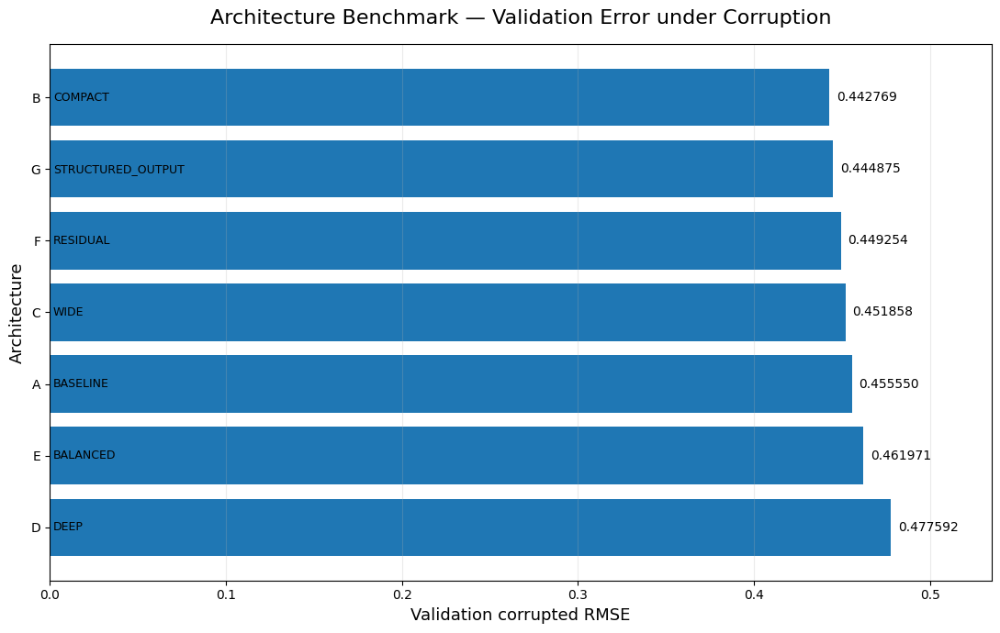

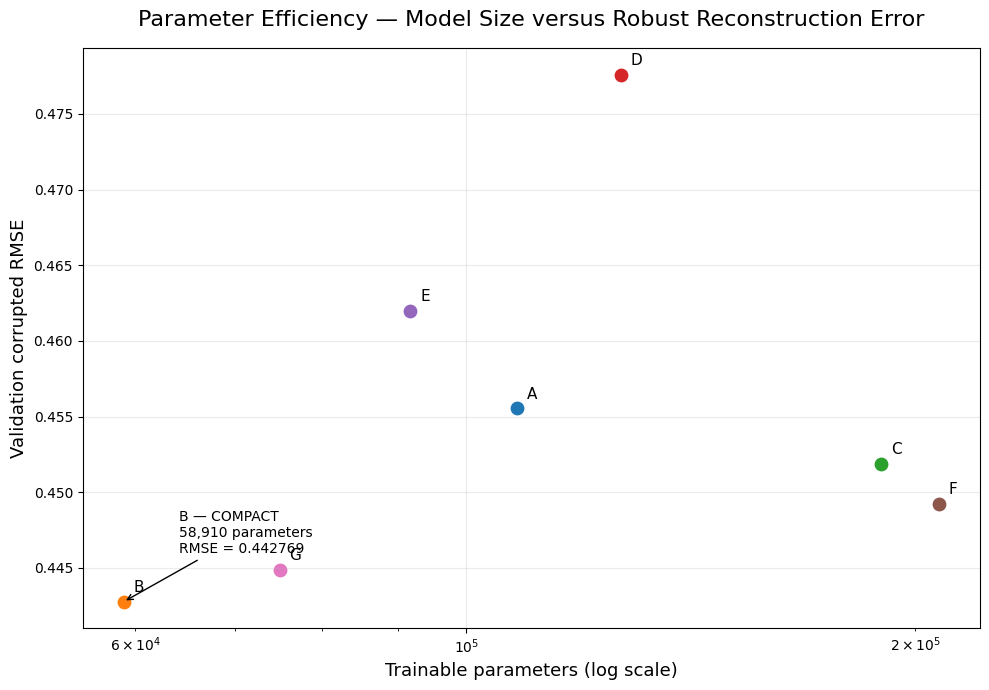

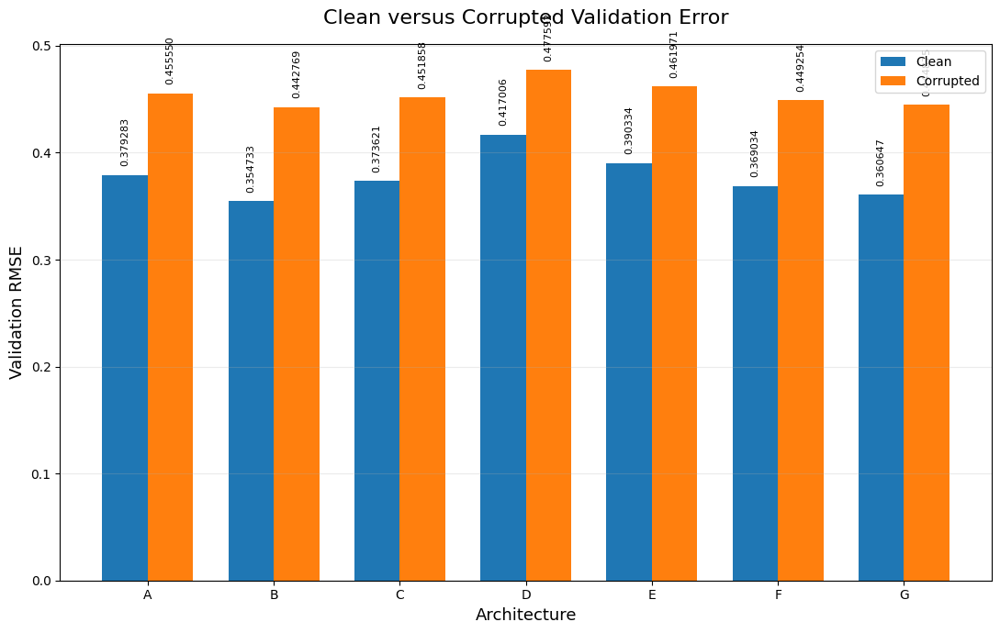

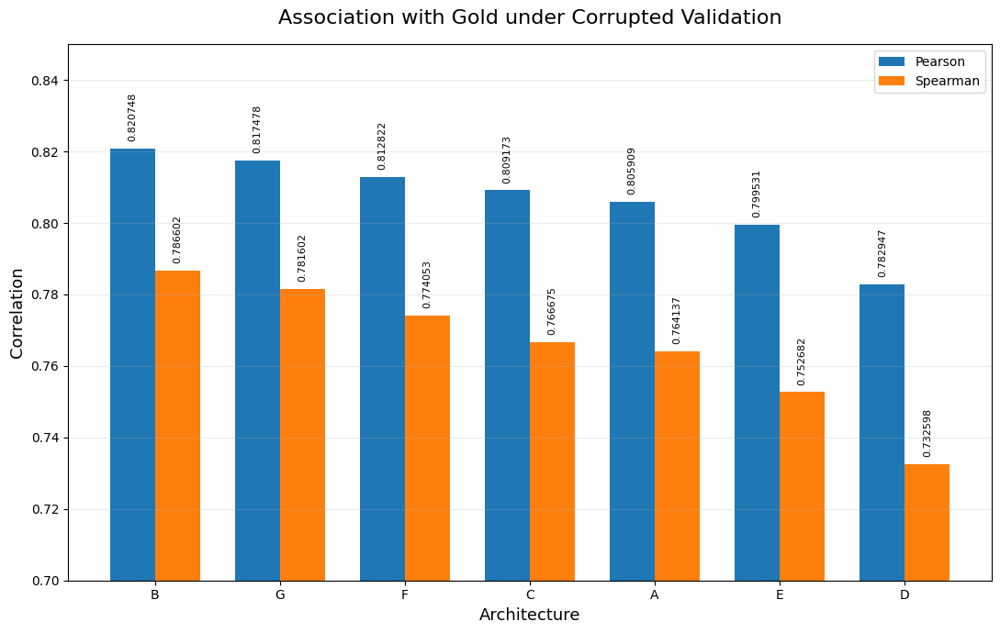

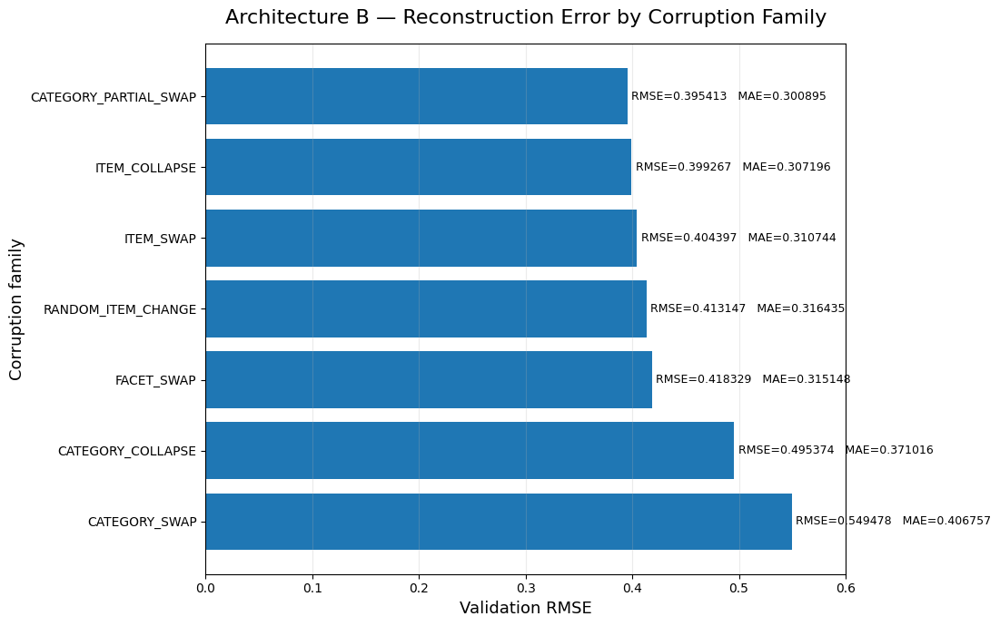

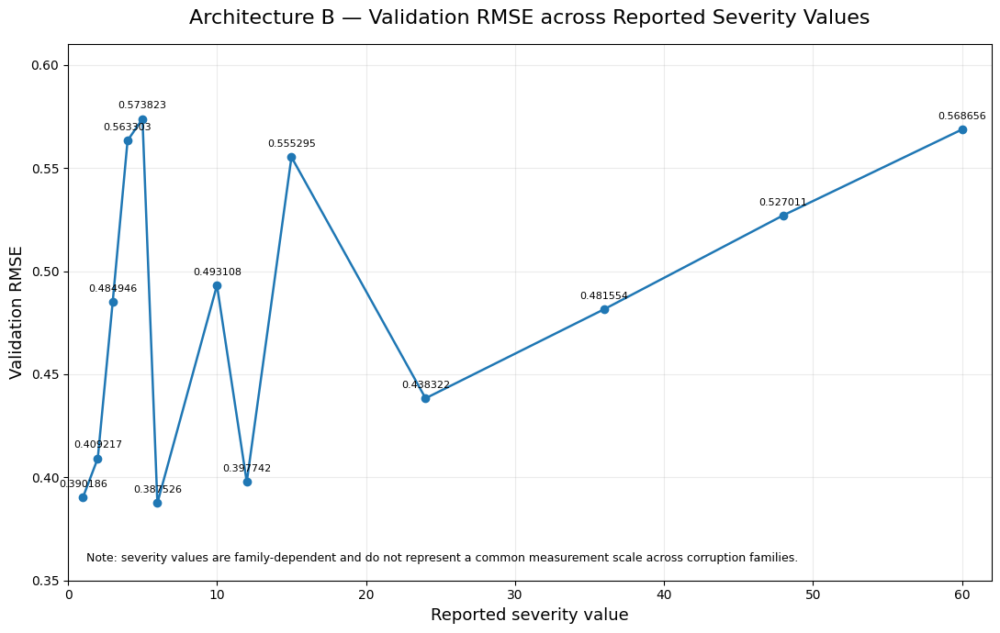

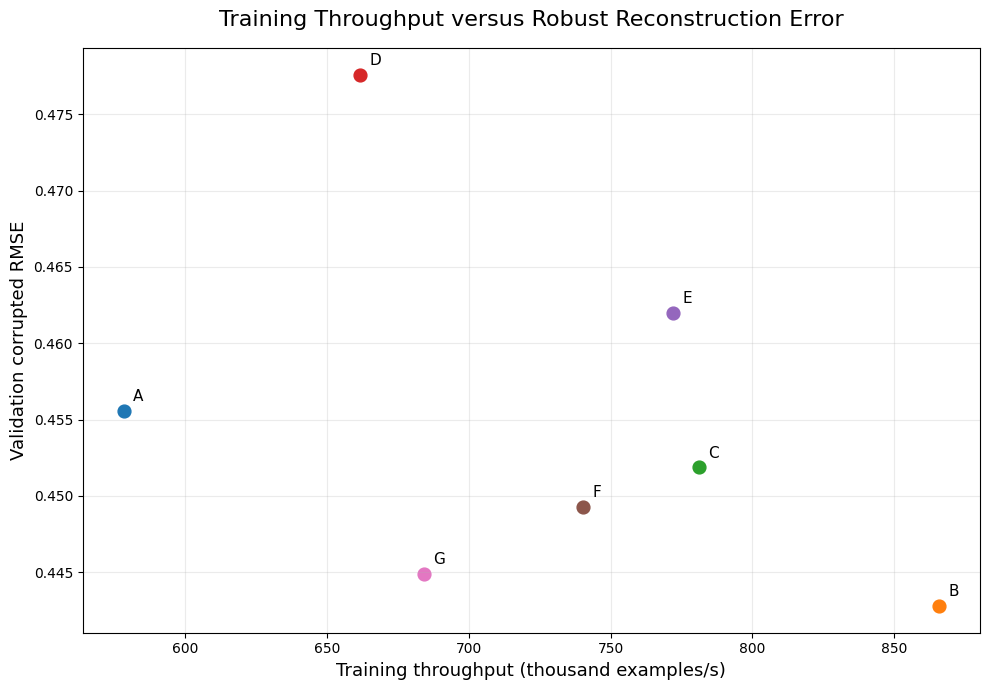

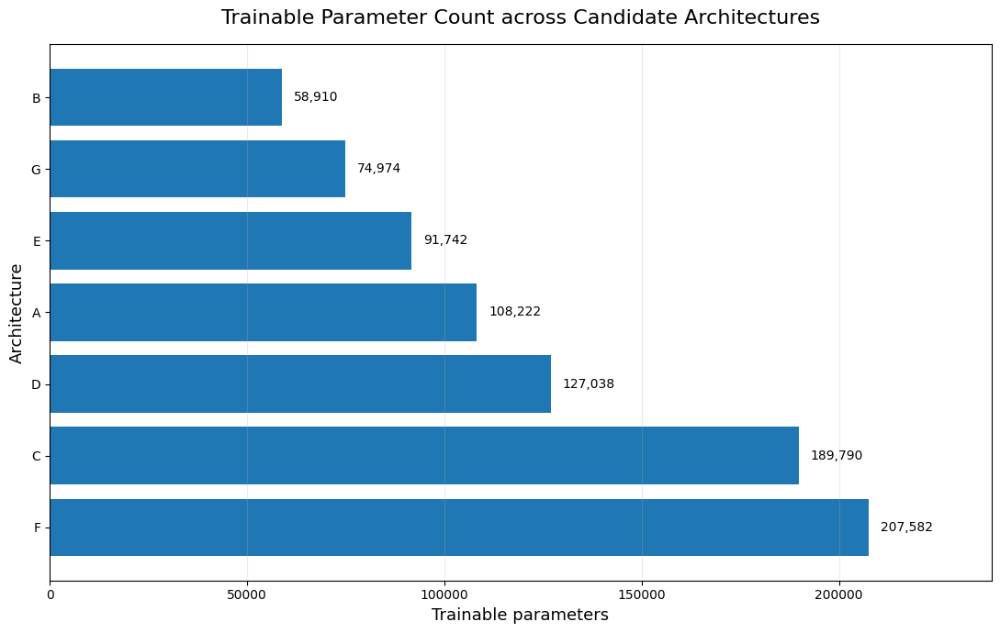


KEY SCREENING RESULT — ARCHITECTURE B
Parameters                 : 58,910
Validation clean RMSE     : 0.354733
Validation corrupted RMSE : 0.442769
Validation corrupted MAE  : 0.332599
Corrupted Pearson         : 0.820748
Corrupted Spearman        : 0.786602
Throughput               : 865,892 examples/s

TEST STATUS: RESERVED
Architecture B is the lowest-RMSE architecture in this screening run.
This remains a screening result; it is not the final TEST-based architecture selection.

FIGURE GENERATION COMPLETE
FIG01 generated.
FIG02 generated.
FIG03 generated.
FIG04 generated.
FIG05 generated.
FIG06 generated.
FIG07 generated.
FIG08 generated.

Files saved to: /content/HEF_IPIP120_PAPER_FIGURES


In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path


OUT_DIR = Path(
    "/content/HEF_IPIP120_PAPER_FIGURES"
)

OUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)

DPI = 600


architectures = pd.DataFrame({

    "architecture": [
        "A",
        "B",
        "C",
        "D",
        "E",
        "F",
        "G",
    ],

    "name": [
        "BASELINE",
        "COMPACT",
        "WIDE",
        "DEEP",
        "BALANCED",
        "RESIDUAL",
        "STRUCTURED_OUTPUT",
    ],

    "parameters": [
        108222,
        58910,
        189790,
        127038,
        91742,
        207582,
        74974,
    ],

    "train_loss": [
        0.742991,
        0.737290,
        0.738886,
        0.805542,
        0.766478,
        0.749253,
        0.775356,
    ],

    "clean_rmse": [
        0.379283,
        0.354733,
        0.373621,
        0.417006,
        0.390334,
        0.369034,
        0.360647,
    ],

    "corrupted_rmse": [
        0.455550,
        0.442769,
        0.451858,
        0.477592,
        0.461971,
        0.449254,
        0.444875,
    ],

    "corrupted_mae": [
        0.344799,
        0.332599,
        0.340983,
        0.365378,
        0.351132,
        0.339187,
        0.334606,
    ],

    "pearson": [
        0.805909,
        0.820748,
        0.809173,
        0.782947,
        0.799531,
        0.812822,
        0.817478,
    ],

    "spearman": [
        0.764137,
        0.786602,
        0.766675,
        0.732598,
        0.752682,
        0.774053,
        0.781602,
    ],

    "subject_consistency": [
        0.144471,
        0.147997,
        0.145587,
        0.134790,
        0.141964,
        0.142298,
        0.145059,
    ],

    "throughput": [
        578162.461383,
        865892.069010,
        781056.531051,
        661643.040247,
        771964.474828,
        740159.107956,
        684109.661384,
    ],
})


family_B = pd.DataFrame({

    "family": [
        "ITEM_SWAP",
        "FACET_SWAP",
        "CATEGORY_PARTIAL_SWAP",
        "CATEGORY_SWAP",
        "ITEM_COLLAPSE",
        "CATEGORY_COLLAPSE",
        "RANDOM_ITEM_CHANGE",
    ],

    "rmse": [
        0.404397,
        0.418329,
        0.395413,
        0.549478,
        0.399267,
        0.495374,
        0.413147,
    ],

    "mae": [
        0.310744,
        0.315148,
        0.300895,
        0.406757,
        0.307196,
        0.371016,
        0.316435,
    ],
})


severity_B = pd.DataFrame({

    "severity": [
        1,
        2,
        3,
        4,
        5,
        6,
        10,
        12,
        15,
        24,
        36,
        48,
        60,
    ],

    "rmse": [
        0.390186,
        0.409217,
        0.484946,
        0.563303,
        0.573823,
        0.387526,
        0.493108,
        0.397742,
        0.555295,
        0.438322,
        0.481554,
        0.527011,
        0.568656,
    ],

    "mae": [
        0.297838,
        0.309551,
        0.361051,
        0.419963,
        0.424267,
        0.298771,
        0.369661,
        0.309588,
        0.416560,
        0.340630,
        0.374520,
        0.409325,
        0.441426,
    ],
})


architectures.to_csv(
    OUT_DIR / "architecture_benchmark_exact.csv",
    index=False,
)

family_B.to_csv(
    OUT_DIR / "architecture_B_family_exact.csv",
    index=False,
)

severity_B.to_csv(
    OUT_DIR / "architecture_B_severity_exact.csv",
    index=False,
)

print("=" * 110)
print("HEF IPIP120 ROBUST — PAPER FIGURE GENERATION")
print("=" * 110)

print(
    "\nOutput directory:",
    OUT_DIR
)

print(
    "\nArchitecture benchmark:"
)

print(
    architectures.to_string(
        index=False
    )
)


plot_df = architectures.sort_values(
    "corrupted_rmse",
    ascending=True
)

fig, ax = plt.subplots(
    figsize=(11, 7)
)

bars = ax.barh(
    plot_df["architecture"],
    plot_df["corrupted_rmse"]
)

ax.set_xlabel(
    "Validation corrupted RMSE",
    fontsize=13
)

ax.set_ylabel(
    "Architecture",
    fontsize=13
)

ax.set_title(
    "Architecture Benchmark — Validation Error under Corruption",
    fontsize=16,
    pad=16
)

ax.set_xlim(
    0,
    max(plot_df["corrupted_rmse"]) * 1.12
)

ax.grid(
    axis="x",
    alpha=0.25
)

ax.invert_yaxis()

for bar, (_, row) in zip(
    bars,
    plot_df.iterrows()
):

    ax.text(
        bar.get_width() + 0.004,
        bar.get_y() + bar.get_height() / 2,
        f"{row['corrupted_rmse']:.6f}",
        va="center",
        fontsize=10
    )

for i, (_, row) in enumerate(
    plot_df.iterrows()
):

    ax.text(
        0.002,
        i,
        f"{row['name']}",
        va="center",
        ha="left",
        fontsize=9
    )

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG01_architecture_corrupted_RMSE.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG01_architecture_corrupted_RMSE.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG01_architecture_corrupted_RMSE.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)

fig, ax = plt.subplots(
    figsize=(10, 7)
)

for _, row in architectures.iterrows():

    ax.scatter(
        row["parameters"],
        row["corrupted_rmse"],
        s=80
    )

    ax.annotate(
        row["architecture"],
        (
            row["parameters"],
            row["corrupted_rmse"]
        ),
        xytext=(7, 7),
        textcoords="offset points",
        fontsize=11
    )

ax.set_xscale(
    "log"
)

ax.set_xlabel(
    "Trainable parameters (log scale)",
    fontsize=13
)

ax.set_ylabel(
    "Validation corrupted RMSE",
    fontsize=13
)

ax.set_title(
    "Parameter Efficiency — Model Size versus Robust Reconstruction Error",
    fontsize=16,
    pad=16
)

ax.grid(
    alpha=0.25
)

B = architectures[
    architectures["architecture"] == "B"
].iloc[0]

ax.annotate(
    (
        f"B — COMPACT\n"
        f"{int(B['parameters']):,} parameters\n"
        f"RMSE = {B['corrupted_rmse']:.6f}"
    ),
    (
        B["parameters"],
        B["corrupted_rmse"]
    ),
    xytext=(40, 35),
    textcoords="offset points",
    fontsize=10,
    arrowprops=dict(
        arrowstyle="->"
    )
)

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG02_parameter_efficiency.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG02_parameter_efficiency.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG02_parameter_efficiency.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)


plot_df = architectures.copy()

x = np.arange(
    len(plot_df)
)

width = 0.36

fig, ax = plt.subplots(
    figsize=(11, 7)
)

clean_bars = ax.bar(
    x - width / 2,
    plot_df["clean_rmse"],
    width,
    label="Clean"
)

corrupt_bars = ax.bar(
    x + width / 2,
    plot_df["corrupted_rmse"],
    width,
    label="Corrupted"
)

ax.set_xticks(
    x
)

ax.set_xticklabels(
    plot_df["architecture"]
)

ax.set_ylabel(
    "Validation RMSE",
    fontsize=13
)

ax.set_xlabel(
    "Architecture",
    fontsize=13
)

ax.set_title(
    "Clean versus Corrupted Validation Error",
    fontsize=16,
    pad=16
)

ax.legend()

ax.grid(
    axis="y",
    alpha=0.25
)

for bars in [
    clean_bars,
    corrupt_bars
]:

    for bar in bars:

        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.008,
            f"{bar.get_height():.6f}",
            ha="center",
            va="bottom",
            fontsize=8,
            rotation=90
        )

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG03_clean_vs_corrupted_RMSE.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG03_clean_vs_corrupted_RMSE.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG03_clean_vs_corrupted_RMSE.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)


plot_df = architectures.sort_values(
    "pearson",
    ascending=False
)

x = np.arange(
    len(plot_df)
)

width = 0.36

fig, ax = plt.subplots(
    figsize=(11, 7)
)

pearson_bars = ax.bar(
    x - width / 2,
    plot_df["pearson"],
    width,
    label="Pearson"
)

spearman_bars = ax.bar(
    x + width / 2,
    plot_df["spearman"],
    width,
    label="Spearman"
)

ax.set_xticks(
    x
)

ax.set_xticklabels(
    plot_df["architecture"]
)

ax.set_ylabel(
    "Correlation",
    fontsize=13
)

ax.set_xlabel(
    "Architecture",
    fontsize=13
)

ax.set_ylim(
    0.70,
    0.85
)

ax.set_title(
    "Association with Gold under Corrupted Validation",
    fontsize=16,
    pad=16
)

ax.legend()

ax.grid(
    axis="y",
    alpha=0.25
)

for bars in [
    pearson_bars,
    spearman_bars
]:

    for bar in bars:

        ax.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 0.002,
            f"{bar.get_height():.6f}",
            ha="center",
            va="bottom",
            fontsize=8,
            rotation=90
        )

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG04_pearson_vs_spearman.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG04_pearson_vs_spearman.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG04_pearson_vs_spearman.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)



plot_df = family_B.sort_values(
    "rmse",
    ascending=True
)

fig, ax = plt.subplots(
    figsize=(11, 7)
)

bars = ax.barh(
    plot_df["family"],
    plot_df["rmse"]
)

ax.set_xlabel(
    "Validation RMSE",
    fontsize=13
)

ax.set_ylabel(
    "Corruption family",
    fontsize=13
)

ax.set_title(
    "Architecture B — Reconstruction Error by Corruption Family",
    fontsize=16,
    pad=16
)

ax.invert_yaxis()

ax.set_xlim(
    0,
    0.60
)

ax.grid(
    axis="x",
    alpha=0.25
)

for bar, (_, row) in zip(
    bars,
    plot_df.iterrows()
):

    ax.text(
        bar.get_width() + 0.004,
        bar.get_y() + bar.get_height() / 2,
        (
            f"RMSE={row['rmse']:.6f}   "
            f"MAE={row['mae']:.6f}"
        ),
        va="center",
        fontsize=9
    )

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG05_B_corruption_family.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG05_B_corruption_family.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG05_B_corruption_family.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)



fig, ax = plt.subplots(
    figsize=(11, 7)
)

ax.plot(
    severity_B["severity"],
    severity_B["rmse"],
    marker="o",
    linewidth=1.8
)

for _, row in severity_B.iterrows():

    ax.annotate(
        f"{row['rmse']:.6f}",
        (
            row["severity"],
            row["rmse"]
        ),
        xytext=(0, 8),
        textcoords="offset points",
        ha="center",
        fontsize=8
    )

ax.set_xlabel(
    "Reported severity value",
    fontsize=13
)

ax.set_ylabel(
    "Validation RMSE",
    fontsize=13
)

ax.set_title(
    "Architecture B — Validation RMSE across Reported Severity Values",
    fontsize=16,
    pad=16
)

ax.set_xlim(
    0,
    62
)

ax.set_ylim(
    0.35,
    0.61
)

ax.grid(
    alpha=0.25
)

ax.text(
    0.02,
    0.03,
    (
        "Note: severity values are family-dependent "
        "and do not represent a common measurement scale across corruption families."
    ),
    transform=ax.transAxes,
    fontsize=9,
    va="bottom"
)

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG06_B_severity.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG06_B_severity.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG06_B_severity.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)



fig, ax = plt.subplots(
    figsize=(10, 7)
)

for _, row in architectures.iterrows():

    ax.scatter(
        row["throughput"] / 1000,
        row["corrupted_rmse"],
        s=85
    )

    ax.annotate(
        row["architecture"],
        (
            row["throughput"] / 1000,
            row["corrupted_rmse"]
        ),
        xytext=(7, 7),
        textcoords="offset points",
        fontsize=11
    )

ax.set_xlabel(
    "Training throughput (thousand examples/s)",
    fontsize=13
)

ax.set_ylabel(
    "Validation corrupted RMSE",
    fontsize=13
)

ax.set_title(
    "Training Throughput versus Robust Reconstruction Error",
    fontsize=16,
    pad=16
)

ax.grid(
    alpha=0.25
)

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG07_throughput_vs_RMSE.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG07_throughput_vs_RMSE.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG07_throughput_vs_RMSE.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)



plot_df = architectures.sort_values(
    "parameters",
    ascending=True
)

fig, ax = plt.subplots(
    figsize=(11, 7)
)

bars = ax.barh(
    plot_df["architecture"],
    plot_df["parameters"]
)

ax.set_xlabel(
    "Trainable parameters",
    fontsize=13
)

ax.set_ylabel(
    "Architecture",
    fontsize=13
)

ax.set_title(
    "Trainable Parameter Count across Candidate Architectures",
    fontsize=16,
    pad=16
)

ax.invert_yaxis()

ax.grid(
    axis="x",
    alpha=0.25
)

for bar, (_, row) in zip(
    bars,
    plot_df.iterrows()
):

    ax.text(
        bar.get_width() + 3000,
        bar.get_y() + bar.get_height() / 2,
        f"{int(row['parameters']):,}",
        va="center",
        fontsize=10
    )

ax.set_xlim(
    0,
    max(plot_df["parameters"]) * 1.15
)

fig.tight_layout()

fig.savefig(
    OUT_DIR / "FIG08_parameter_count.png",
    dpi=DPI,
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG08_parameter_count.pdf",
    bbox_inches="tight"
)

fig.savefig(
    OUT_DIR / "FIG08_parameter_count.svg",
    bbox_inches="tight"
)

plt.show()
plt.close(fig)



B = architectures[
    architectures["architecture"] == "B"
].iloc[0]

print("\n" + "=" * 110)
print("KEY SCREENING RESULT — ARCHITECTURE B")
print("=" * 110)

print(
    f"Parameters                 : {int(B['parameters']):,}"
)

print(
    f"Validation clean RMSE     : {B['clean_rmse']:.6f}"
)

print(
    f"Validation corrupted RMSE : {B['corrupted_rmse']:.6f}"
)

print(
    f"Validation corrupted MAE  : {B['corrupted_mae']:.6f}"
)

print(
    f"Corrupted Pearson         : {B['pearson']:.6f}"
)

print(
    f"Corrupted Spearman        : {B['spearman']:.6f}"
)

print(
    f"Throughput               : {B['throughput']:,.0f} examples/s"
)

print(
    "\nTEST STATUS: RESERVED"
)

print(
    "Architecture B is the lowest-RMSE architecture in this screening run."
)

print(
    "This remains a screening result; it is not the final TEST-based architecture selection."
)

print("\n" + "=" * 110)
print("FIGURE GENERATION COMPLETE")
print("=" * 110)

for i in range(1, 9):

    print(
        f"FIG{i:02d} generated."
    )

print(
    "\nFiles saved to:",
    OUT_DIR
)

## HEF IPIP-120 — Loss / Objective Competition

The HEF IPIP-120 Loss / Objective Competition evaluates alternative training objectives under a strictly controlled experimental setting. The purpose of this stage is to determine how the choice of optimization objective affects the reconstruction of the 30-dimensional Gold representation when the underlying network architecture and all other training conditions are held constant.

The architecture is fixed to the compact MLP configuration, corresponding to the mapping:

**120 → 192 → 128 → 64 → 30**

Only the training objective is varied. The dataset, TRAIN subject subset, SIES schedule, batch size, learning rate, weight decay, dropout, optimizer, input normalization, number of subject exposures, and validation protocol remain fixed across all experimental conditions. This isolates the contribution of the objective function and prevents changes in optimization behavior from being confounded with architectural or data-related differences.

### Fixed Training Population

The initial screening uses a deterministic subset of 10,000 TRAIN subjects. Because each subject contributes 143 views, the competition operates on:

**10,000 subjects × 143 views = 1,430,000 training observations.**

Subjects are selected without replacement using a fixed data seed, and their complete 143-view blocks are retained. This preserves the participant-level structure of the robust dataset while providing a computationally controlled screening environment.

### Common SIES Training Schedule

All nine objectives are trained using exactly the same Subject-Interleaved Exposure Scheduler (SIES) schedule.

For each of the 143 rounds, every subject contributes exactly one of its 143 available views. Subject order is independently permuted within each round before batches are constructed. The implementation explicitly verifies that no participant appears more than once within a batch.

The same precomputed SIES schedule is reused for every loss configuration. Consequently, differences between objectives are evaluated under identical subject-view exposure and batch composition. The SIES schedule itself is deterministically generated from a dedicated schedule seed and audited to ensure that every subject encounters all 143 views exactly once during the cycle.

### Competing Objectives

Nine objectives are evaluated:

**A — Mean Squared Error (MSE)**
The standard squared-error objective, which penalizes larger reconstruction deviations more strongly.

**B — Mean Absolute Error (MAE)**
An absolute-error objective that assigns a linear penalty to deviations.

**C — Huber Loss, δ = 1.0**
A robust loss combining quadratic behavior near zero error with linear behavior for larger deviations.

**D — Huber Loss, δ = 0.5**
A more tightly localized Huber formulation using a smaller transition threshold.

**E — 70% MSE + 30% MAE**
A composite objective combining squared and absolute reconstruction error.

**F — 70% MSE + 30% Huber**
A composite objective combining standard squared error with a robust Huber component.

**G — 90% MSE + 10% Cosine Profile Loss**
A composite objective that combines coordinate-level reconstruction error with a profile-orientation component defined after centering the predicted and target facet vectors at the midpoint of the 1–5 scale.

**H — 90% MSE + 10% Pearson Profile Loss**
A composite objective combining squared reconstruction error with a within-profile Pearson correlation term.

**I — 60% MSE + 20% Huber + 20% MAE**
A three-component composite objective combining squared, robust, and absolute error terms.

### Optimization Procedure

For every objective, a new instance of the fixed B — COMPACT architecture is initialized with the same model seed. The optimizer is AdamW with a learning rate of 2 × 10⁻³ and weight decay of 1 × 10⁻⁴. Dropout is fixed at 0.10, gradient clipping is applied with a maximum norm of 1.0, and BF16 autocasting is enabled under CUDA.

Each objective is trained over one complete 143-round SIES cycle. The implementation checks that the training loss remains finite and raises an error if a non-finite objective is encountered. This provides a common numerical stability criterion across all nine experimental conditions.

### Validation Framework

The evaluation procedure is identical for all objectives.

Predictions are generated separately for CLEAN and CORRUPTED validation observations. Performance is summarized using RMSE, MAE, Pearson correlation, and Spearman correlation for both conditions, together with aggregate validation error across the complete validation set.

The corrupted validation population is additionally analyzed by corruption family and by reported severity value. This allows the influence of the objective function to be examined not only in aggregate, but also across the different structural perturbations represented in the robust dataset.

A subject-level consistency measure is also calculated. This metric quantifies the mean deviation of the model's multiple predictions for the same participant from that participant's mean prediction across available validation views. It therefore provides a complementary measure of prediction stability across repeated corrupted and clean observations associated with the same individual.

The validation pipeline also records the minimum and maximum model outputs and the fraction of predictions falling outside the nominal 1–5 response-derived scale. These diagnostics provide an additional assessment of numerical and output-range behavior.

### Common-Schedule Comparison Principle

A central methodological feature of this experiment is that the nine objectives do not receive independently sampled training schedules. A single fixed SIES schedule is constructed once and then reused across all objective configurations.

This makes the comparison substantially more controlled because subject selection, view exposure, round structure, batch membership, and the number of training observations are held constant. The experimental variable is therefore restricted to the mathematical form of the objective used to update the same compact architecture.

### Checkpointing and Reproducibility

Each objective produces an independent checkpoint containing the model state, optimizer state, objective specification, random seed, training statistics, validation metrics, normalization rule, input and output dimensionality, number of views per subject, and the SIES schedule seed.

The complete competition results are subsequently assembled into a common table and sorted primarily by corrupted-validation RMSE, with corrupted MAE used as a secondary ordering criterion. Separate result tables are produced for corruption-family performance and severity-specific performance. The resulting CSV and JSON records provide machine-readable representations of the complete experiment.

### Interpretation of the Experiment

The purpose of this competition is therefore not to compare different network capacities, but to isolate the effect of the training objective on robust psychometric reconstruction.

The experiment asks whether, under an identical compact architecture, identical subject exposure, identical data subset, identical optimization settings, and identical validation framework, different formulations of the reconstruction objective lead to systematically different behavior on clean observations, corrupted observations, different perturbation families, different reported severity levels, and repeated views of the same participant.

TEST data remain reserved throughout this stage. The loss competition is explicitly treated as a screening experiment, an


In [13]:
from __future__ import annotations
import gc
import json
import math
import random
import time
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
LOSS_BENCHMARK_ROOT = (
    ROOT
    / "MLP_GATEWAY_BENCHMARK"
    / "LOSS_COMPETITION"
)
LOSS_BENCHMARK_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)
ARCHITECTURE_KEY = "B"
ARCHITECTURE_NAME = "COMPACT"
LOSS_MAX_TRAIN_SUBJECTS = 10_000
LOSS_BATCH_SIZE = 8192
LOSS_SIES_CYCLES = 1
LOSS_LEARNING_RATE = 2e-3
LOSS_WEIGHT_DECAY = 1e-4
LOSS_DROPOUT = 0.10
LOSS_GRAD_CLIP = 1.0
LOSS_USE_BF16 = True
LOSS_DATA_SEED = 20260920
LOSS_MODEL_SEED = 20260920
LOSS_SCHEDULE_SEED = (
    LOSS_DATA_SEED
    + 777
)
def select_train_subjects_for_loss(
    X,
    Y,
    corruption_type,
    severity,
    max_subjects,
    seed,
):
    total_subjects = (
        len(X)
        // VIEWS_PER_SUBJECT
    )
    assert (
        len(X)
        == total_subjects
        * VIEWS_PER_SUBJECT
    )
    if max_subjects is None:
        subject_ids = np.arange(
            total_subjects,
            dtype=np.int64,
        )
    else:
        if max_subjects > total_subjects:
            max_subjects = total_subjects
        rng = np.random.default_rng(
            seed
        )
        subject_ids = rng.choice(
            total_subjects,
            size=max_subjects,
            replace=False,
        )
        subject_ids.sort()
    row_indices = np.concatenate(
        [
            subject_ids[:, None]
            * VIEWS_PER_SUBJECT
            + np.arange(
                VIEWS_PER_SUBJECT,
                dtype=np.int64,
            )[None, :]
        ],
        axis=1,
    ).reshape(-1)
    sub_X = np.asarray(
        X[
            row_indices
        ],
        dtype=np.uint8,
    )
    sub_Y = np.asarray(
        Y[
            row_indices
        ],
        dtype=np.float32,
    )
    sub_type = np.asarray(
        corruption_type[
            row_indices
        ],
        dtype=np.uint8,
    )
    sub_severity = np.asarray(
        severity[
            row_indices
        ],
        dtype=np.uint8,
    )
    assert sub_X.shape == (
        len(subject_ids)
        * VIEWS_PER_SUBJECT,
        INPUT_DIM,
    )
    assert sub_Y.shape == (
        len(subject_ids)
        * VIEWS_PER_SUBJECT,
        OUTPUT_DIM,
    )
    assert sub_type.shape == (
        len(subject_ids)
        * VIEWS_PER_SUBJECT,
    )
    assert sub_severity.shape == (
        len(subject_ids)
        * VIEWS_PER_SUBJECT,
    )
    return (
        sub_X,
        sub_Y,
        sub_type,
        sub_severity,
        subject_ids,
    )
def build_fixed_sies_schedule(
    n_subjects: int,
    seed: int,
):
    """
    Generates ONE deterministic SIES schedule.
    Every loss receives exactly this same schedule.
    For each round:
        one view / subject
        random permutation of subjects
        batches built afterward
    """
    rng = np.random.default_rng(
        seed
    )
    rank = rng.integers(
        0,
        VIEWS_PER_SUBJECT,
        size=n_subjects,
        dtype=np.int16,
    )
    schedule = []
    for round_id in range(
        VIEWS_PER_SUBJECT
    ):
        subject_order = rng.permutation(
            n_subjects
        ).astype(
            np.int64,
            copy=False,
        )
        selected_views = (
            rank[
                subject_order
            ]
            + round_id
        ) % VIEWS_PER_SUBJECT
        flat_indices = (
            subject_order
            * VIEWS_PER_SUBJECT
            + selected_views.astype(
                np.int64,
                copy=False,
            )
        )
        round_batches = []
        for start in range(
            0,
            n_subjects,
            LOSS_BATCH_SIZE,
        ):
            end = min(
                start
                + LOSS_BATCH_SIZE,
                n_subjects,
            )
            batch_subjects = (
                subject_order[
                    start:end
                ]
            )
            batch_indices = (
                flat_indices[
                    start:end
                ]
            )
            assert len(
                np.unique(
                    batch_subjects
                )
            ) == len(
                batch_subjects
            )
            round_batches.append(
                {
                    "subject_ids": batch_subjects,
                    "indices": batch_indices,
                }
            )
        schedule.append(
            round_batches
        )
    sample_subjects = min(
        n_subjects,
        2048,
    )
    for subject_id in range(
        sample_subjects
    ):
        seen = (
            rank[
                subject_id
            ]
            + np.arange(
                VIEWS_PER_SUBJECT
            )
        ) % VIEWS_PER_SUBJECT
        assert np.array_equal(
            np.sort(seen),
            np.arange(
                VIEWS_PER_SUBJECT
            ),
        )
    print(
        "Fixed SIES schedule       : PASS"
    )
    return schedule
class HuberLoss(
    nn.Module
):
    def __init__(
        self,
        delta: float = 1.0,
    ):
        super().__init__()
        self.delta = float(
            delta
        )
    def forward(
        self,
        prediction,
        target,
    ):
        error = (
            prediction
            - target
        )
        abs_error = torch.abs(
            error
        )
        quadratic = torch.minimum(
            abs_error,
            torch.tensor(
                self.delta,
                device=error.device,
                dtype=error.dtype,
            ),
        )
        linear = (
            abs_error
            - quadratic
        )
        loss = (
            0.5
            * quadratic
            * quadratic
            + self.delta
            * linear
        )
        return loss.mean()
class PearsonLoss(
    nn.Module
):
    def forward(
        self,
        prediction,
        target,
    ):
        p = prediction.reshape(
            prediction.shape[0],
            -1,
        )
        y = target.reshape(
            target.shape[0],
            -1,
        )
        p = (
            p
            - p.mean(
                dim=1,
                keepdim=True,
            )
        )
        y = (
            y
            - y.mean(
                dim=1,
                keepdim=True,
            )
        )
        numerator = (
            p * y
        ).sum(
            dim=1
        )
        denominator = (
            torch.sqrt(
                torch.sum(
                    p * p,
                    dim=1,
                )
                + 1e-8
            )
            *
            torch.sqrt(
                torch.sum(
                    y * y,
                    dim=1,
                )
                + 1e-8
            )
        )
        correlation = (
            numerator
            / denominator
        )
        return (
            1.0
            - correlation
        ).mean()
class CosineProfileLoss(
    nn.Module
):
    def forward(
        self,
        prediction,
        target,
    ):
        prediction = prediction - 3.0
        target = target - 3.0
        cosine = nn.functional.cosine_similarity(
            prediction,
            target,
            dim=1,
            eps=1e-8,
        )
        return (
            1.0
            - cosine
        ).mean()
MSE_LOSS = nn.MSELoss()
MAE_LOSS = nn.L1Loss()
HUBER_1 = HuberLoss(
    delta=1.0
)
HUBER_05 = HuberLoss(
    delta=0.5
)
COSINE_LOSS = CosineProfileLoss()
PEARSON_LOSS = PearsonLoss()
LOSS_CONFIGS = {
    "A": {
        "name": "MSE",
        "kind": "mse",
    },
    "B": {
        "name": "MAE",
        "kind": "mae",
    },
    "C": {
        "name": "HUBER_1.0",
        "kind": "huber_1",
    },
    "D": {
        "name": "HUBER_0.5",
        "kind": "huber_05",
    },
    "E": {
        "name": "MSE70_MAE30",
        "kind": "mse70_mae30",
    },
    "F": {
        "name": "MSE70_HUBER30",
        "kind": "mse70_huber30",
    },
    "G": {
        "name": "MSE90_COSINE10",
        "kind": "mse90_cosine10",
    },
    "H": {
        "name": "MSE90_PEARSON10",
        "kind": "mse90_pearson10",
    },
    "I": {
        "name": "MSE60_HUBER20_MAE20",
        "kind": "mse60_huber20_mae20",
    },
}
def compute_loss(
    kind,
    prediction,
    target,
):
    if kind == "mse":
        return MSE_LOSS(
            prediction,
            target,
        )
    if kind == "mae":
        return MAE_LOSS(
            prediction,
            target,
        )
    if kind == "huber_1":
        return HUBER_1(
            prediction,
            target,
        )
    if kind == "huber_05":
        return HUBER_05(
            prediction,
            target,
        )
    if kind == "mse70_mae30":
        return (
            0.70
            * MSE_LOSS(
                prediction,
                target,
            )
            +
            0.30
            * MAE_LOSS(
                prediction,
                target,
            )
        )
    if kind == "mse70_huber30":
        return (
            0.70
            * MSE_LOSS(
                prediction,
                target,
            )
            +
            0.30
            * HUBER_1(
                prediction,
                target,
            )
        )
    if kind == "mse90_cosine10":
        return (
            0.90
            * MSE_LOSS(
                prediction,
                target,
            )
            +
            0.10
            * COSINE_LOSS(
                prediction,
                target,
            )
        )
    if kind == "mse90_pearson10":
        return (
            0.90
            * MSE_LOSS(
                prediction,
                target,
            )
            +
            0.10
            * PEARSON_LOSS(
                prediction,
                target,
            )
        )
    if kind == "mse60_huber20_mae20":
        return (
            0.60
            * MSE_LOSS(
                prediction,
                target,
            )
            +
            0.20
            * HUBER_1(
                prediction,
                target,
            )
            +
            0.20
            * MAE_LOSS(
                prediction,
                target,
            )
        )
    raise ValueError(
        f"Unknown loss kind: {kind}"
    )
def metric_rmse(
    prediction,
    target,
):
    prediction = np.asarray(
        prediction,
        dtype=np.float64,
    )
    target = np.asarray(
        target,
        dtype=np.float64,
    )
    return float(
        np.sqrt(
            np.mean(
                (
                    prediction
                    - target
                )
                ** 2
            )
        )
    )
def metric_mae(
    prediction,
    target,
):
    prediction = np.asarray(
        prediction,
        dtype=np.float64,
    )
    target = np.asarray(
        target,
        dtype=np.float64,
    )
    return float(
        np.mean(
            np.abs(
                prediction
                - target
            )
        )
    )
def metric_pearson(
    prediction,
    target,
):
    p = np.asarray(
        prediction,
        dtype=np.float64,
    ).reshape(-1)
    y = np.asarray(
        target,
        dtype=np.float64,
    ).reshape(-1)
    p = (
        p
        - p.mean()
    )
    y = (
        y
        - y.mean()
    )
    denominator = (
        np.sqrt(
            np.sum(
                p * p
            )
        )
        *
        np.sqrt(
            np.sum(
                y * y
            )
        )
    )
    if denominator <= 0:
        return float(
            "nan"
        )
    return float(
        np.sum(
            p * y
        )
        / denominator
    )
def metric_spearman(
    prediction,
    target,
):
    p = np.asarray(
        prediction,
        dtype=np.float64,
    ).reshape(-1)
    y = np.asarray(
        target,
        dtype=np.float64,
    ).reshape(-1)
    p_rank = pd.Series(
        p
    ).rank(
        method="average"
    ).to_numpy()
    y_rank = pd.Series(
        y
    ).rank(
        method="average"
    ).to_numpy()
    return metric_pearson(
        p_rank,
        y_rank,
    )
def compute_subject_consistency(
    prediction,
    target_ids,
):
    prediction = np.asarray(
        prediction,
        dtype=np.float64,
    )
    target_ids = np.asarray(
        target_ids,
        dtype=np.int64,
    )
    order = np.argsort(
        target_ids,
        kind="mergesort",
    )
    sorted_ids = target_ids[
        order
    ]
    sorted_prediction = prediction[
        order
    ]
    unique_ids, starts = np.unique(
        sorted_ids,
        return_index=True,
    )
    counts = np.diff(
        np.r_[
            starts,
            len(sorted_ids),
        ]
    )
    sums = np.add.reduceat(
        sorted_prediction,
        starts,
        axis=0,
    )
    means = (
        sums
        / counts[:, None]
    )
    repeated_means = np.repeat(
        means,
        counts,
        axis=0,
    )
    deviation = (
        sorted_prediction
        - repeated_means
    )
    per_row = (
        np.linalg.norm(
            deviation,
            axis=1,
        )
        / math.sqrt(
            OUTPUT_DIM
        )
    )
    return float(
        per_row.mean()
    )
@torch.no_grad()
def predict_model(
    model,
    X,
):
    model.eval()
    predictions = []
    for start in range(
        0,
        len(X),
        EVAL_BATCH_SIZE,
    ):
        end = min(
            start
            + EVAL_BATCH_SIZE,
            len(X),
        )
        xb = torch.from_numpy(
            np.asarray(
                X[
                    start:end
                ],
                dtype=np.uint8,
            )
        ).to(
            DEVICE,
            dtype=torch.float32,
            non_blocking=True,
        )
        if LOSS_USE_BF16:
            with torch.autocast(
                device_type="cuda",
                dtype=torch.bfloat16,
            ):
                output = model(
                    xb
                )
        else:
            output = model(
                xb
            )
        predictions.append(
            output.float()
            .cpu()
            .numpy()
        )
    return np.concatenate(
        predictions,
        axis=0,
    )
def evaluate_loss_model(
    model,
):
    clean_prediction = predict_model(
        model,
        VAL_CLEAN_X,
    )
    corrupted_prediction = predict_model(
        model,
        VAL_CORRUPTED_X,
    )
    all_prediction = np.concatenate(
        [
            clean_prediction,
            corrupted_prediction,
        ],
        axis=0,
    )
    all_target = np.concatenate(
        [
            VAL_CLEAN_Y,
            VAL_CORRUPTED_Y,
        ],
        axis=0,
    )
    clean_rmse = metric_rmse(
        clean_prediction,
        VAL_CLEAN_Y,
    )
    clean_mae = metric_mae(
        clean_prediction,
        VAL_CLEAN_Y,
    )
    clean_pearson = metric_pearson(
        clean_prediction,
        VAL_CLEAN_Y,
    )
    clean_spearman = metric_spearman(
        clean_prediction,
        VAL_CLEAN_Y,
    )
    corrupted_rmse = metric_rmse(
        corrupted_prediction,
        VAL_CORRUPTED_Y,
    )
    corrupted_mae = metric_mae(
        corrupted_prediction,
        VAL_CORRUPTED_Y,
    )
    corrupted_pearson = metric_pearson(
        corrupted_prediction,
        VAL_CORRUPTED_Y,
    )
    corrupted_spearman = metric_spearman(
        corrupted_prediction,
        VAL_CORRUPTED_Y,
    )
    all_rmse = metric_rmse(
        all_prediction,
        all_target,
    )
    all_mae = metric_mae(
        all_prediction,
        all_target,
    )
    family_names = {
        1: "ITEM_SWAP",
        2: "FACET_SWAP",
        3: "CATEGORY_PARTIAL_SWAP",
        4: "CATEGORY_SWAP",
        5: "ITEM_COLLAPSE",
        6: "CATEGORY_COLLAPSE",
        7: "RANDOM_ITEM_CHANGE",
    }
    family_metrics = {}
    for code, family_name in (
        family_names.items()
    ):
        mask = (
            VAL_CORRUPTED_TYPE
            == code
        )
        if not np.any(mask):
            continue
        family_metrics[
            family_name
        ] = metric_rmse(
            corrupted_prediction[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    severity_metrics = {}
    for severity in np.unique(
        VAL_CORRUPTED_SEVERITY
    ):
        mask = (
            VAL_CORRUPTED_SEVERITY
            == severity
        )
        severity_metrics[
            int(severity)
        ] = metric_rmse(
            corrupted_prediction[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    combined_target_ids = np.concatenate(
        [
            VAL_CLEAN_TARGET,
            VAL_CORRUPTED_TARGET,
        ],
        axis=0,
    )
    consistency = (
        compute_subject_consistency(
            all_prediction,
            combined_target_ids,
        )
    )
    output_min = float(
        all_prediction.min()
    )
    output_max = float(
        all_prediction.max()
    )
    out_of_range = float(
        np.mean(
            (
                all_prediction < 1.0
            )
            |
            (
                all_prediction > 5.0
            )
        )
    )
    return {
        "clean_rmse": clean_rmse,
        "clean_mae": clean_mae,
        "clean_pearson": clean_pearson,
        "clean_spearman": clean_spearman,
        "corrupted_rmse": corrupted_rmse,
        "corrupted_mae": corrupted_mae,
        "corrupted_pearson": corrupted_pearson,
        "corrupted_spearman": corrupted_spearman,
        "all_rmse": all_rmse,
        "all_mae": all_mae,
        "subject_consistency": consistency,
        "output_min": output_min,
        "output_max": output_max,
        "out_of_range_fraction": out_of_range,
        "family_metrics": family_metrics,
        "severity_metrics": severity_metrics,
    }
def train_one_loss(
    loss_key,
    config,
    train_X,
    train_Y,
    schedule,
    seed,
):
    seed_everything(
        seed
    )
    model = HEFIPIP120MLP(
        architecture_key="B",
        dropout=LOSS_DROPOUT,
    ).to(
        DEVICE
    )
    parameter_count = count_parameters(
        model
    )
    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=LOSS_LEARNING_RATE,
        weight_decay=LOSS_WEIGHT_DECAY,
    )
    total_examples = 0
    weighted_loss = 0.0
    start_time = time.perf_counter()
    model.train()
    print()
    print("=" * 100)
    print(
        f"LOSS {loss_key} — {config['name']}"
    )
    print("=" * 100)
    print(
        "Architecture            : B COMPACT"
    )
    print(
        "Parameters              :",
        f"{parameter_count:,}",
    )
    print(
        "Objective               :",
        config["name"],
    )
    for round_id, round_batches in enumerate(
        schedule
    ):
        for batch_info in round_batches:
            indices = batch_info[
                "indices"
            ]
            batch_x = np.asarray(
                train_X[
                    indices
                ],
                dtype=np.uint8,
            )
            batch_y = np.asarray(
                train_Y[
                    indices
                ],
                dtype=np.float32,
            )
            subject_ids = batch_info[
                "subject_ids"
            ]
            assert len(
                np.unique(
                    subject_ids
                )
            ) == len(
                subject_ids
            )
            xb = torch.from_numpy(
                batch_x
            ).to(
                DEVICE,
                dtype=torch.float32,
                non_blocking=True,
            )
            yb = torch.from_numpy(
                batch_y
            ).to(
                DEVICE,
                dtype=torch.float32,
                non_blocking=True,
            )
            optimizer.zero_grad(
                set_to_none=True
            )
            if LOSS_USE_BF16:
                with torch.autocast(
                    device_type="cuda",
                    dtype=torch.bfloat16,
                ):
                    prediction = model(
                        xb
                    )
                    loss = compute_loss(
                        config["kind"],
                        prediction,
                        yb,
                    )
            else:
                prediction = model(
                    xb
                )
                loss = compute_loss(
                    config["kind"],
                    prediction,
                    yb,
                )
            if not torch.isfinite(
                loss
            ):
                raise FloatingPointError(
                    f"{loss_key}: non-finite loss."
                )
            loss.backward()
            torch.nn.utils.clip_grad_norm_(
                model.parameters(),
                LOSS_GRAD_CLIP,
            )
            optimizer.step()
            n = len(
                batch_x
            )
            weighted_loss += (
                float(
                    loss.detach().item()
                )
                * n
            )
            total_examples += n
        if (
            round_id == 0
            or (round_id + 1) % 10 == 0
            or round_id + 1
            == VIEWS_PER_SUBJECT
        ):
            average_loss = (
                weighted_loss
                / max(
                    total_examples,
                    1,
                )
            )
            elapsed = (
                time.perf_counter()
                - start_time
            )
            throughput = (
                total_examples
                / max(
                    elapsed,
                    1e-9,
                )
            )
            print(
                f"[LOSS-SIES] "
                f"round={round_id + 1}/{VIEWS_PER_SUBJECT} "
                f"examples={total_examples:,} "
                f"loss={average_loss:.6f} "
                f"throughput={throughput:,.0f} ex/s"
            )
    elapsed = (
        time.perf_counter()
        - start_time
    )
    average_loss = (
        weighted_loss
        / max(
            total_examples,
            1,
        )
    )
    throughput = (
        total_examples
        / max(
            elapsed,
            1e-9,
        )
    )
    print()
    print(
        "Running validation..."
    )
    metrics = evaluate_loss_model(
        model
    )
    checkpoint_path = (
        LOSS_BENCHMARK_ROOT
        / (
            f"LOSS_{loss_key}_"
            f"{config['name']}_"
            f"seed_{seed}.pt"
        )
    )
    torch.save(
        {
            "architecture": "B",
            "architecture_name": "COMPACT",
            "loss_key": loss_key,
            "loss_config": config,
            "seed": seed,
            "state_dict": model.state_dict(),
            "optimizer_state_dict": optimizer.state_dict(),
            "train_examples": total_examples,
            "train_loss": average_loss,
            "train_seconds": elapsed,
            "train_examples_per_sec": throughput,
            "validation_metrics": metrics,
            "normalization": "(x - 3) / 2",
            "input_dim": INPUT_DIM,
            "output_dim": OUTPUT_DIM,
            "views_per_subject": VIEWS_PER_SUBJECT,
            "sies_schedule_seed": LOSS_SCHEDULE_SEED,
        },
        checkpoint_path,
    )
    result = {
        "loss_key": loss_key,
        "loss_name": config["name"],
        "architecture": "B",
        "parameters": parameter_count,
        "seed": seed,
        "train_examples": total_examples,
        "train_loss": average_loss,
        "train_seconds": elapsed,
        "train_examples_per_sec": throughput,
        "clean_rmse": metrics[
            "clean_rmse"
        ],
        "clean_mae": metrics[
            "clean_mae"
        ],
        "clean_pearson": metrics[
            "clean_pearson"
        ],
        "clean_spearman": metrics[
            "clean_spearman"
        ],
        "corrupted_rmse": metrics[
            "corrupted_rmse"
        ],
        "corrupted_mae": metrics[
            "corrupted_mae"
        ],
        "corrupted_pearson": metrics[
            "corrupted_pearson"
        ],
        "corrupted_spearman": metrics[
            "corrupted_spearman"
        ],
        "all_rmse": metrics[
            "all_rmse"
        ],
        "all_mae": metrics[
            "all_mae"
        ],
        "subject_consistency": metrics[
            "subject_consistency"
        ],
        "output_min": metrics[
            "output_min"
        ],
        "output_max": metrics[
            "output_max"
        ],
        "out_of_range_fraction": metrics[
            "out_of_range_fraction"
        ],
        "checkpoint": str(
            checkpoint_path
        ),
    }
    print()
    print("-" * 100)
    print(
        f"{loss_key} — {config['name']}"
    )
    print(
        "Train loss                :",
        f"{average_loss:.6f}",
    )
    print(
        "Validation CLEAN RMSE     :",
        f"{metrics['clean_rmse']:.6f}",
    )
    print(
        "Validation CORRUPTED RMSE:",
        f"{metrics['corrupted_rmse']:.6f}",
    )
    print(
        "Validation CORRUPTED MAE :",
        f"{metrics['corrupted_mae']:.6f}",
    )
    print(
        "Corrupted Pearson        :",
        f"{metrics['corrupted_pearson']:.6f}",
    )
    print(
        "Corrupted Spearman       :",
        f"{metrics['corrupted_spearman']:.6f}",
    )
    print(
        "Subject consistency      :",
        f"{metrics['subject_consistency']:.6f}",
    )
    print(
        "Throughput               :",
        f"{throughput:,.0f} ex/s",
    )
    print(
        "Checkpoint               :",
        checkpoint_path,
    )
    del optimizer
    del model
    gc.collect()
    torch.cuda.empty_cache()
    return (
        result,
        metrics,
    )
print()
print("=" * 100)
print("PREPARING FIXED TRAIN SUBSET FOR LOSS COMPETITION")
print("=" * 100)
(
    LOSS_TRAIN_X,
    LOSS_TRAIN_Y,
    LOSS_TRAIN_TYPE,
    LOSS_TRAIN_SEVERITY,
    LOSS_SUBJECT_IDS,
) = select_train_subjects_for_loss(
    X=TRAIN_X,
    Y=TRAIN_Y,
    corruption_type=TRAIN_TYPE,
    severity=TRAIN_SEVERITY,
    max_subjects=LOSS_MAX_TRAIN_SUBJECTS,
    seed=LOSS_DATA_SEED,
)
LOSS_N_SUBJECTS = len(
    LOSS_SUBJECT_IDS
)
LOSS_EXPECTED_ROWS = (
    LOSS_N_SUBJECTS
    * VIEWS_PER_SUBJECT
)
assert LOSS_TRAIN_X.shape == (
    LOSS_EXPECTED_ROWS,
    INPUT_DIM,
)
assert LOSS_TRAIN_Y.shape == (
    LOSS_EXPECTED_ROWS,
    OUTPUT_DIM,
)
assert LOSS_TRAIN_TYPE.shape == (
    LOSS_EXPECTED_ROWS,
)
assert LOSS_TRAIN_SEVERITY.shape == (
    LOSS_EXPECTED_ROWS,
)
print(
    "Subjects selected        :",
    LOSS_N_SUBJECTS,
)
print(
    "Examples selected        :",
    LOSS_EXPECTED_ROWS,
)
print(
    "Architecture              : B COMPACT"
)
print(
    "Subject block             : PASS"
)
LOSS_SIES_SCHEDULE = build_fixed_sies_schedule(
    n_subjects=LOSS_N_SUBJECTS,
    seed=LOSS_SCHEDULE_SEED,
)
LOSS_RESULTS = []
LOSS_DETAILS = {}
BENCHMARK_START = time.perf_counter()
for loss_key, config in (
    LOSS_CONFIGS.items()
):
    result, metrics = train_one_loss(
        loss_key=loss_key,
        config=config,
        train_X=LOSS_TRAIN_X,
        train_Y=LOSS_TRAIN_Y,
        schedule=LOSS_SIES_SCHEDULE,
        seed=LOSS_MODEL_SEED,
    )
    LOSS_RESULTS.append(
        result
    )
    LOSS_DETAILS[
        loss_key
    ] = metrics
LOSS_RESULTS_DF = pd.DataFrame(
    LOSS_RESULTS
)
LOSS_RESULTS_DF = LOSS_RESULTS_DF.sort_values(
    [
        "corrupted_rmse",
        "corrupted_mae",
    ],
    ascending=[
        True,
        True,
    ],
).reset_index(
    drop=True
)
print()
print("=" * 120)
print(
    "HEF IPIP120 — LOSS COMPETITION RESULTS"
)
print("=" * 120)
display_columns = [
    "loss_key",
    "loss_name",
    "parameters",
    "train_loss",
    "clean_rmse",
    "corrupted_rmse",
    "corrupted_mae",
    "corrupted_pearson",
    "corrupted_spearman",
    "subject_consistency",
    "train_examples_per_sec",
]
print(
    LOSS_RESULTS_DF[
        display_columns
    ].to_string(
        index=False
    )
)
family_rows = []
for loss_key, metrics in (
    LOSS_DETAILS.items()
):
    for family_name, family_rmse in (
        metrics[
            "family_metrics"
        ].items()
    ):
        family_rows.append(
            {
                "loss_key": loss_key,
                "family": family_name,
                "rmse": family_rmse,
            }
        )
FAMILY_RESULTS_DF = pd.DataFrame(
    family_rows
)
FAMILY_PIVOT = (
    FAMILY_RESULTS_DF
    .pivot(
        index="family",
        columns="loss_key",
        values="rmse",
    )
)
print()
print("=" * 120)
print(
    "PER-FAMILY RMSE — LOSS COMPETITION"
)
print("=" * 120)
print(
    FAMILY_PIVOT.to_string(
        float_format=lambda x:
            f"{x:.6f}"
    )
)
severity_rows = []
for loss_key, metrics in (
    LOSS_DETAILS.items()
):
    for severity, severity_rmse in (
        metrics[
            "severity_metrics"
        ].items()
    ):
        severity_rows.append(
            {
                "loss_key": loss_key,
                "severity": severity,
                "rmse": severity_rmse,
            }
        )
SEVERITY_RESULTS_DF = pd.DataFrame(
    severity_rows
)
SEVERITY_PIVOT = (
    SEVERITY_RESULTS_DF
    .pivot(
        index="severity",
        columns="loss_key",
        values="rmse",
    )
)
print()
print("=" * 120)
print(
    "PER-SEVERITY RMSE — LOSS COMPETITION"
)
print("=" * 120)
print(
    SEVERITY_PIVOT.to_string(
        float_format=lambda x:
            f"{x:.6f}"
    )
)
RESULTS_CSV = (
    LOSS_BENCHMARK_ROOT
    / "LOSS_COMPETITION_RESULTS.csv"
)
FAMILY_CSV = (
    LOSS_BENCHMARK_ROOT
    / "LOSS_COMPETITION_FAMILY_RMSE.csv"
)
SEVERITY_CSV = (
    LOSS_BENCHMARK_ROOT
    / "LOSS_COMPETITION_SEVERITY_RMSE.csv"
)
RESULTS_JSON = (
    LOSS_BENCHMARK_ROOT
    / "LOSS_COMPETITION_RESULTS.json"
)
LOSS_RESULTS_DF.to_csv(
    RESULTS_CSV,
    index=False,
)
FAMILY_RESULTS_DF.to_csv(
    FAMILY_CSV,
    index=False,
)
SEVERITY_RESULTS_DF.to_csv(
    SEVERITY_CSV,
    index=False,
)
with open(
    RESULTS_JSON,
    "w",
    encoding="utf-8",
) as f:
    json.dump(
        {
            "architecture": "B",
            "architecture_name": "COMPACT",
            "train_subjects": LOSS_N_SUBJECTS,
            "train_examples": LOSS_EXPECTED_ROWS,
            "views_per_subject": VIEWS_PER_SUBJECT,
            "sies_cycles": LOSS_SIES_CYCLES,
            "learning_rate": LOSS_LEARNING_RATE,
            "weight_decay": LOSS_WEIGHT_DECAY,
            "dropout": LOSS_DROPOUT,
            "batch_size": LOSS_BATCH_SIZE,
            "schedule_seed": LOSS_SCHEDULE_SEED,
            "model_seed": LOSS_MODEL_SEED,
            "loss_configs": LOSS_CONFIGS,
            "results": LOSS_RESULTS,
        },
        f,
        indent=2,
    )
BEST_LOSS = LOSS_RESULTS_DF.iloc[
    0
]
TOTAL_BENCHMARK_TIME = (
    time.perf_counter()
    - BENCHMARK_START
)
print()
print("=" * 120)
print(
    "CURRENT LOSS CHAMPION — SCREENING ONLY"
)
print("=" * 120)
print(
    "Loss                     :",
    BEST_LOSS["loss_key"],
)
print(
    "Objective                :",
    BEST_LOSS["loss_name"],
)
print(
    "Architecture             : B COMPACT"
)
print(
    "Parameters               :",
    f"{int(BEST_LOSS['parameters']):,}",
)
print(
    "Corrupted RMSE           :",
    f"{BEST_LOSS['corrupted_rmse']:.6f}",
)
print(
    "Corrupted MAE            :",
    f"{BEST_LOSS['corrupted_mae']:.6f}",
)
print(
    "Corrupted Pearson        :",
    f"{BEST_LOSS['corrupted_pearson']:.6f}",
)
print(
    "Corrupted Spearman       :",
    f"{BEST_LOSS['corrupted_spearman']:.6f}",
)
print(
    "Clean RMSE               :",
    f"{BEST_LOSS['clean_rmse']:.6f}",
)
print(
    "Subject consistency      :",
    f"{BEST_LOSS['subject_consistency']:.6f}",
)
print(
    "Training throughput      :",
    f"{BEST_LOSS['train_examples_per_sec']:,.0f} ex/s",
)
print(
    "Benchmark time           :",
    f"{TOTAL_BENCHMARK_TIME / 60.0:.2f} min",
)
print()
print(
    "TEST STATUS              : RESERVED"
)
print(
    "Final architecture/loss  : NOT FROZEN"
)
print()
print("=" * 120)
print(
    "LOSS COMPETITION COMPLETE"
)
print("=" * 120)


PREPARING FIXED TRAIN SUBSET FOR LOSS COMPETITION
Subjects selected        : 10000
Examples selected        : 1430000
Architecture              : B COMPACT
Subject block             : PASS
Fixed SIES schedule       : PASS

LOSS A — MSE
Architecture            : B COMPACT
Parameters              : 58,910
Objective               : MSE
[LOSS-SIES] round=1/143 examples=10,000 loss=10.226565 throughput=679,804 ex/s
[LOSS-SIES] round=10/143 examples=100,000 loss=5.371862 throughput=938,777 ex/s
[LOSS-SIES] round=20/143 examples=200,000 loss=3.203733 throughput=912,280 ex/s
[LOSS-SIES] round=30/143 examples=300,000 loss=2.295168 throughput=909,862 ex/s
[LOSS-SIES] round=40/143 examples=400,000 loss=1.825104 throughput=881,558 ex/s
[LOSS-SIES] round=50/143 examples=500,000 loss=1.535949 throughput=909,739 ex/s
[LOSS-SIES] round=60/143 examples=600,000 loss=1.339118 throughput=924,881 ex/s
[LOSS-SIES] round=70/143 examples=700,000 loss=1.195910 throughput=926,465 ex/s
[LOSS-SIES] round=80/143 

In [14]:
import sys, subprocess
subprocess.run([sys.executable, "-m", "pip", "install", "-q", "-U", "plotly", "kaleido"], check=True)

import numpy as np
import pandas as pd
import plotly.graph_objects as go
from pathlib import Path

OUT_DIR = Path("/content/HEF_IPIP120_LOSS_3D_FIGURES")
OUT_DIR.mkdir(parents=True, exist_ok=True)

loss_results = pd.DataFrame({
    "loss_key": list("ABCDEFGHI"),
    "loss_name": [
        "MSE",
        "MAE",
        "HUBER_1.0",
        "HUBER_0.5",
        "MSE70_MAE30",
        "MSE70_HUBER30",
        "MSE90_COSINE10",
        "MSE90_PEARSON10",
        "MSE60_HUBER20_MAE20",
    ],
    "train_loss": [
        0.737550,
        0.607467,
        0.300607,
        0.208320,
        0.695732,
        0.605272,
        0.704380,
        0.696315,
        0.620959,
    ],
    "clean_rmse": [
        0.351616,
        0.360203,
        0.388410,
        0.378575,
        0.349250,
        0.356709,
        0.350545,
        0.346998,
        0.352891,
    ],
    "corrupted_rmse": [
        0.441099,
        0.448572,
        0.463382,
        0.458557,
        0.440160,
        0.443924,
        0.440367,
        0.438587,
        0.442270,
    ],
    "corrupted_mae": [
        0.330332,
        0.333973,
        0.350964,
        0.345001,
        0.328496,
        0.333037,
        0.329549,
        0.327731,
        0.330816,
    ],
    "pearson": [
        0.820778,
        0.811894,
        0.799272,
        0.803344,
        0.821146,
        0.818430,
        0.821129,
        0.823210,
        0.819503,
    ],
    "spearman": [
        0.787044,
        0.779058,
        0.762040,
        0.768190,
        0.788241,
        0.784444,
        0.787954,
        0.791134,
        0.786171,
    ],
    "subject_consistency": [
        0.151840,
        0.156341,
        0.143650,
        0.148602,
        0.153838,
        0.150082,
        0.152631,
        0.153062,
        0.152296,
    ],
    "throughput": [
        960990,
        991655,
        863646,
        960807,
        948178,
        898031,
        898530,
        839734,
        864581,
    ],
})

family_results = pd.DataFrame({
    "family": [
        "CATEGORY_COLLAPSE",
        "CATEGORY_PARTIAL_SWAP",
        "CATEGORY_SWAP",
        "FACET_SWAP",
        "ITEM_COLLAPSE",
        "ITEM_SWAP",
        "RANDOM_ITEM_CHANGE",
    ],
    "A": [0.495097, 0.392770, 0.549722, 0.416006, 0.396796, 0.401561, 0.410652],
    "B": [0.505282, 0.400366, 0.558732, 0.423148, 0.403174, 0.407839, 0.415687],
    "C": [0.517745, 0.421015, 0.559577, 0.440105, 0.423628, 0.427460, 0.434450],
    "D": [0.514573, 0.413891, 0.559709, 0.434359, 0.416727, 0.420732, 0.428035],
    "E": [0.494403, 0.391189, 0.550906, 0.414846, 0.394926, 0.399905, 0.408951],
    "F": [0.497522, 0.396534, 0.550855, 0.419128, 0.400341, 0.405014, 0.413878],
    "G": [0.493918, 0.391934, 0.550050, 0.415368, 0.395392, 0.400825, 0.409651],
    "H": [0.493053, 0.389328, 0.549176, 0.413214, 0.393041, 0.398489, 0.407700],
    "I": [0.496673, 0.393923, 0.551384, 0.417051, 0.397697, 0.402464, 0.411417],
})

severity_results = pd.DataFrame({
    "severity": [1, 2, 3, 4, 5, 6, 10, 12, 15, 24, 36, 48, 60],
    "A": [0.387787,0.407160,0.483410,0.563658,0.575024,0.384648,0.491638,0.394745,0.554781,0.435699,0.479427,0.525711,0.568307],
    "B": [0.396790,0.415549,0.491403,0.573063,0.582986,0.391671,0.498141,0.400513,0.560522,0.439650,0.482194,0.527181,0.569294],
    "C": [0.419195,0.434434,0.501380,0.575111,0.584818,0.413763,0.504110,0.420974,0.560272,0.453099,0.490096,0.531191,0.569889],
    "D": [0.411621,0.428031,0.498297,0.575444,0.584889,0.406185,0.502431,0.413984,0.561145,0.448746,0.487854,0.530352,0.570380],
    "E": [0.386062,0.405876,0.483106,0.564412,0.575899,0.382780,0.491706,0.392887,0.555630,0.434392,0.478507,0.525191,0.568089],
    "F": [0.391936,0.410755,0.485529,0.564692,0.575915,0.388579,0.493049,0.398305,0.555216,0.437991,0.480815,0.526311,0.568277],
    "G": [0.386733,0.406415,0.482719,0.563503,0.575461,0.383685,0.491400,0.393651,0.555031,0.434466,0.478163,0.524634,0.567595],
    "H": [0.384075,0.404114,0.481329,0.563255,0.574591,0.381076,0.490486,0.391467,0.554583,0.433280,0.477616,0.524530,0.567737],
    "I": [0.389149,0.408362,0.484774,0.565149,0.576580,0.385683,0.492628,0.395595,0.555973,0.436308,0.479929,0.526015,0.568407],
})
rounds = np.array([1, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 143])

train_curves = {
    "A": [10.226565,5.371862,3.203733,2.295168,1.825104,1.535949,1.339118,1.195910,1.086803,1.000776,0.930992,0.873351,0.824789,0.783337,0.747406,0.737550],
    "B": [3.077640,2.119867,1.477640,1.172215,1.012162,0.911799,0.841584,0.789149,0.748189,0.715065,0.687497,0.664241,0.644281,0.626967,0.611695,0.607467],
    "C": [2.577894,1.634486,1.045430,0.776729,0.637599,0.551475,0.492050,0.448115,0.414138,0.386959,0.364560,0.345805,0.329810,0.316018,0.303942,0.300607],
    "D": [1.413833,0.936401,0.622665,0.475293,0.398661,0.350980,0.317836,0.293136,0.273902,0.258410,0.245549,0.234709,0.225417,0.217367,0.210282,0.208320],
    "E": [8.081794,4.400778,2.687525,1.958843,1.580709,1.347179,1.187684,1.071235,0.982226,0.911881,0.854717,0.807438,0.767562,0.733479,0.703864,0.695732],
    "F": [7.931884,4.254264,2.557304,1.840394,1.469079,1.240244,1.084215,0.970497,0.883721,0.815208,0.759589,0.713629,0.674904,0.641835,0.613145,0.605272],
    "G": [9.311082,4.938196,2.973999,2.142787,1.710761,1.444172,1.262340,1.129811,1.028708,0.948924,0.884151,0.830629,0.785504,0.746969,0.713547,0.704380],
    "H": [9.296800,4.911188,2.949674,2.123677,1.694580,1.429908,1.249423,1.117904,1.017618,0.938506,0.874311,0.821284,0.776594,0.738451,0.705383,0.696315],
    "I": [7.266968,3.978803,2.427748,1.766547,1.423300,1.211522,1.066942,0.961401,0.880738,0.816979,0.765164,0.722294,0.686129,0.655202,0.628335,0.620959],
}


fig = go.Figure()

for _, r in loss_results.iterrows():
    size = 8 + 16 * (
        (r["throughput"] - loss_results["throughput"].min())
        / (loss_results["throughput"].max() - loss_results["throughput"].min())
    )

    symbol = "diamond" if r["loss_key"] == "H" else "circle"

    fig.add_trace(
        go.Scatter3d(
            x=[r["corrupted_rmse"]],
            y=[r["pearson"]],
            z=[r["spearman"]],
            mode="markers+text",
            text=[r["loss_key"]],
            textposition="top center",
            marker=dict(
                size=size,
                symbol=symbol,
                color=[r["throughput"]],
                colorscale="Viridis",
                showscale=False,
                line=dict(width=1, color="black"),
            ),
            customdata=[[
                r["loss_key"],
                r["loss_name"],
                r["corrupted_rmse"],
                r["corrupted_mae"],
                r["pearson"],
                r["spearman"],
                r["throughput"],
            ]],
            hovertemplate=(
                "<b>%{customdata[0]} — %{customdata[1]}</b><br>"
                "Corrupted RMSE: %{customdata[2]:.6f}<br>"
                "Corrupted MAE: %{customdata[3]:.6f}<br>"
                "Pearson: %{customdata[4]:.6f}<br>"
                "Spearman: %{customdata[5]:.6f}<br>"
                "Throughput: %{customdata[6]:,.0f} ex/s"
                "<extra></extra>"
            ),
            showlegend=False,
        )
    )

fig.update_layout(
    template="plotly_white",
    title=(
        "HEF IPIP-120 — 3D Objective Performance Manifold"
        "<br><sup>Loss objectives evaluated under the same compact architecture and fixed SIES schedule</sup>"
    ),
    scene=dict(
        xaxis_title="Validation Corrupted RMSE",
        yaxis_title="Pearson Correlation",
        zaxis_title="Spearman Correlation",
        xaxis=dict(backgroundcolor="rgb(245,245,245)", gridcolor="white"),
        yaxis=dict(backgroundcolor="rgb(245,245,245)", gridcolor="white"),
        zaxis=dict(backgroundcolor="rgb(245,245,245)", gridcolor="white"),
        camera=dict(eye=dict(x=1.55, y=1.50, z=1.20)),
    ),
    margin=dict(l=20, r=20, t=90, b=20),
)

fig.write_html(
    OUT_DIR / "FIG01_3D_OBJECTIVE_PERFORMANCE_MANIFOLD.html"
)

try:
    fig.write_image(
        OUT_DIR / "FIG01_3D_OBJECTIVE_PERFORMANCE_MANIFOLD.png",
        width=1800,
        height=1200,
        scale=2,
    )
except Exception as e:
    print("Static export FIG01 skipped:", e)

fig.show()

fig = go.Figure()

fig.add_trace(
    go.Scatter3d(
        x=loss_results["corrupted_rmse"],
        y=loss_results["pearson"],
        z=loss_results["throughput"],
        mode="markers+text",
        text=loss_results["loss_key"],
        textposition="top center",
        marker=dict(
            size=11,
            color=loss_results["spearman"],
            colorscale="Plasma",
            colorbar=dict(title="Spearman"),
            line=dict(width=1, color="black"),
        ),
        customdata=np.column_stack([
            loss_results["loss_name"],
            loss_results["corrupted_mae"],
            loss_results["spearman"],
        ]),
        hovertemplate=(
            "<b>%{text} — %{customdata[0]}</b><br>"
            "Corrupted RMSE: %{x:.6f}<br>"
            "Pearson: %{y:.6f}<br>"
            "Throughput: %{z:,.0f} ex/s<br>"
            "MAE: %{customdata[1]:.6f}<br>"
            "Spearman: %{customdata[2]:.6f}"
            "<extra></extra>"
        ),
        showlegend=False,
    )
)

fig.update_layout(
    template="plotly_white",
    title=(
        "HEF IPIP-120 — 3D Optimization Trade Space"
        "<br><sup>Reconstruction error, association with Gold, and computational throughput</sup>"
    ),
    scene=dict(
        xaxis_title="Validation Corrupted RMSE",
        yaxis_title="Pearson Correlation",
        zaxis_title="Training Throughput (examples/s)",
        camera=dict(eye=dict(x=1.45, y=1.50, z=1.15)),
    ),
    margin=dict(l=20, r=20, t=90, b=20),
)

fig.write_html(
    OUT_DIR / "FIG02_3D_ERROR_CORRELATION_THROUGHPUT.html"
)

try:
    fig.write_image(
        OUT_DIR / "FIG02_3D_ERROR_CORRELATION_THROUGHPUT.png",
        width=1800,
        height=1200,
        scale=2,
    )
except Exception as e:
    print("Static export FIG02 skipped:", e)

fig.show()

loss_keys = list("ABCDEFGHI")
Z_family = family_results[loss_keys].to_numpy()

fig = go.Figure()

fig.add_trace(
    go.Surface(
        x=np.arange(len(loss_keys)),
        y=np.arange(len(family_results)),
        z=Z_family,
        colorscale="Turbo",
        colorbar=dict(title="RMSE"),
        contours=dict(
            z=dict(
                show=True,
                usecolormap=True,
                highlight=True,
                project_z=True,
            )
        ),
        hovertemplate=(
            "Objective: %{x}<br>"
            "Family: %{y}<br>"
            "RMSE: %{z:.6f}"
            "<extra></extra>"
        ),
    )
)

fig.update_layout(
    template="plotly_white",
    title=(
        "HEF IPIP-120 — 3D Corruption-Family Response Surface"
        "<br><sup>Validation RMSE across nine objectives and seven corruption families</sup>"
    ),
    scene=dict(
        xaxis=dict(
            title="Objective",
            tickmode="array",
            tickvals=np.arange(len(loss_keys)),
            ticktext=loss_keys,
        ),
        yaxis=dict(
            title="Corruption Family",
            tickmode="array",
            tickvals=np.arange(len(family_results)),
            ticktext=family_results["family"],
        ),
        zaxis_title="Validation RMSE",
        camera=dict(eye=dict(x=1.65, y=1.65, z=1.15)),
    ),
    margin=dict(l=20, r=20, t=90, b=20),
)

fig.write_html(
    OUT_DIR / "FIG03_3D_CORRUPTION_FAMILY_SURFACE.html"
)

try:
    fig.write_image(
        OUT_DIR / "FIG03_3D_CORRUPTION_FAMILY_SURFACE.png",
        width=1900,
        height=1250,
        scale=2,
    )
except Exception as e:
    print("Static export FIG03 skipped:", e)

fig.show()


Z_severity = severity_results[loss_keys].to_numpy()

fig = go.Figure()

fig.add_trace(
    go.Surface(
        x=np.arange(len(loss_keys)),
        y=np.arange(len(severity_results)),
        z=Z_severity,
        colorscale="Cividis",
        colorbar=dict(title="RMSE"),
        contours=dict(
            z=dict(
                show=True,
                usecolormap=True,
                highlight=True,
                project_z=True,
            )
        ),
        hovertemplate=(
            "Objective: %{x}<br>"
            "Reported severity: %{text}<br>"
            "RMSE: %{z:.6f}"
            "<extra></extra>"
        ),
        text=np.tile(
            severity_results["severity"].to_numpy(),
            (len(loss_keys), 1)
        ).T,
    )
)

fig.update_layout(
    template="plotly_white",
    title=(
        "HEF IPIP-120 — 3D Reported-Severity Response Surface"
        "<br><sup>Validation RMSE across objectives and family-dependent reported severity values</sup>"
    ),
    scene=dict(
        xaxis=dict(
            title="Objective",
            tickmode="array",
            tickvals=np.arange(len(loss_keys)),
            ticktext=loss_keys,
        ),
        yaxis=dict(
            title="Reported Severity",
            tickmode="array",
            tickvals=np.arange(len(severity_results)),
            ticktext=[
                str(v)
                for v in severity_results["severity"]
            ],
        ),
        zaxis_title="Validation RMSE",
        camera=dict(eye=dict(x=1.65, y=1.55, z=1.15)),
    ),
    margin=dict(l=20, r=20, t=90, b=20),
)

fig.write_html(
    OUT_DIR / "FIG04_3D_REPORTED_SEVERITY_SURFACE.html"
)

try:
    fig.write_image(
        OUT_DIR / "FIG04_3D_REPORTED_SEVERITY_SURFACE.png",
        width=1900,
        height=1250,
        scale=2,
    )
except Exception as e:
    print("Static export FIG04 skipped:", e)

fig.show()


Z_train = np.array([
    train_curves[key]
    for key in loss_keys
])

fig = go.Figure()

fig.add_trace(
    go.Surface(
        x=rounds,
        y=np.arange(len(loss_keys)),
        z=Z_train,
        colorscale="Viridis",
        colorbar=dict(title="Training objective value"),
        contours=dict(
            z=dict(
                show=True,
                usecolormap=True,
                highlight=True,
                project_z=True,
            )
        ),
        hovertemplate=(
            "Round: %{x}<br>"
            "Objective: %{y}<br>"
            "Training loss: %{z:.6f}"
            "<extra></extra>"
        ),
    )
)

fig.update_layout(
    template="plotly_white",
    title=(
        "HEF IPIP-120 — 3D Training Convergence Surface"
        "<br><sup>Objective value across the common 143-round SIES cycle</sup>"
    ),
    scene=dict(
        xaxis_title="SIES Round",
        yaxis=dict(
            title="Loss Objective",
            tickmode="array",
            tickvals=np.arange(len(loss_keys)),
            ticktext=[
                f"{k} — {n}"
                for k, n in zip(
                    loss_results["loss_key"],
                    loss_results["loss_name"]
                )
            ],
        ),
        zaxis_title="Training Objective Value",
        camera=dict(eye=dict(x=1.60, y=1.45, z=1.15)),
    ),
    margin=dict(l=20, r=20, t=90, b=20),
)

fig.write_html(
    OUT_DIR / "FIG05_3D_TRAINING_CONVERGENCE_SURFACE.html"
)

try:
    fig.write_image(
        OUT_DIR / "FIG05_3D_TRAINING_CONVERGENCE_SURFACE.png",
        width=1900,
        height=1250,
        scale=2,
    )
except Exception as e:
    print("Static export FIG05 skipped:", e)

fig.show()


fig = go.Figure()

for _, r in loss_results.iterrows():

    fig.add_trace(
        go.Scatter3d(
            x=[
                r["clean_rmse"],
                r["corrupted_rmse"],
            ],
            y=[
                r["corrupted_mae"],
                r["corrupted_mae"],
            ],
            z=[
                r["pearson"],
                r["spearman"],
            ],
            mode="lines+markers",
            line=dict(width=6),
            marker=dict(size=7),
            name=f"{r['loss_key']} — {r['loss_name']}",
            hovertemplate=(
                f"<b>{r['loss_key']} — {r['loss_name']}</b><br>"
                "RMSE / profile coordinate shown along trace"
                "<extra></extra>"
            ),
        )
    )

fig.update_layout(
    template="plotly_white",
    title=(
        "HEF IPIP-120 — 3D Clean-to-Corrupted Objective Profiles"
        "<br><sup>Each trace connects clean and corrupted validation behavior</sup>"
    ),
    scene=dict(
        xaxis_title="RMSE",
        yaxis_title="Validation Corrupted MAE",
        zaxis_title="Correlation",
        camera=dict(eye=dict(x=1.60, y=1.55, z=1.20)),
    ),
    margin=dict(l=20, r=20, t=90, b=20),
)

fig.write_html(
    OUT_DIR / "FIG06_3D_CLEAN_CORRUPTED_PROFILES.html"
)

try:
    fig.write_image(
        OUT_DIR / "FIG06_3D_CLEAN_CORRUPTED_PROFILES.png",
        width=1900,
        height=1250,
        scale=2,
    )
except Exception as e:
    print("Static export FIG06 skipped:", e)

fig.show()


loss_results.to_csv(
    OUT_DIR / "LOSS_COMPETITION_RESULTS_EXACT.csv",
    index=False
)

family_results.to_csv(
    OUT_DIR / "LOSS_COMPETITION_FAMILY_RMSE_EXACT.csv",
    index=False
)

severity_results.to_csv(
    OUT_DIR / "LOSS_COMPETITION_SEVERITY_RMSE_EXACT.csv",
    index=False
)

training_df = pd.DataFrame(
    train_curves,
    index=rounds
)

training_df.index.name = "SIES_round"

training_df.to_csv(
    OUT_DIR / "LOSS_COMPETITION_TRAINING_CURVES_EXACT.csv"
)


best_idx = loss_results["corrupted_rmse"].idxmin()
best = loss_results.loc[best_idx]

print("\n" + "=" * 110)
print("HEF IPIP120 — 3D LOSS VISUALIZATION COMPLETE")
print("=" * 110)

print(
    f"Current screening minimum corrupted RMSE : "
    f"{best['loss_key']} — {best['loss_name']}"
)

print(
    f"Corrupted RMSE                         : "
    f"{best['corrupted_rmse']:.6f}"
)

print(
    f"Corrupted MAE                          : "
    f"{best['corrupted_mae']:.6f}"
)

print(
    f"Corrupted Pearson                      : "
    f"{best['pearson']:.6f}"
)

print(
    f"Corrupted Spearman                     : "
    f"{best['spearman']:.6f}"
)

print(
    f"Clean RMSE                             : "
    f"{best['clean_rmse']:.6f}"
)

print(
    f"Throughput                             : "
    f"{best['throughput']:,.0f} examples/s"
)

print(
    "\nTEST STATUS: RESERVED"
)

print(
    "\nFiles written to:"
)

print(
    OUT_DIR
)

for path in sorted(OUT_DIR.glob("FIG*.html")):
    print(
        path.name
    )

print(
    "\nStatic exports require Kaleido and are attempted automatically."
)

Static export FIG01 skipped: 

Kaleido requires Google Chrome to be installed.

Either download and install Chrome yourself following Google's instructions for your operating system,
or install it from your terminal by running:

    $ plotly_get_chrome




Static export FIG02 skipped: 

Kaleido requires Google Chrome to be installed.

Either download and install Chrome yourself following Google's instructions for your operating system,
or install it from your terminal by running:

    $ plotly_get_chrome




Static export FIG03 skipped: 

Kaleido requires Google Chrome to be installed.

Either download and install Chrome yourself following Google's instructions for your operating system,
or install it from your terminal by running:

    $ plotly_get_chrome




Static export FIG04 skipped: 

Kaleido requires Google Chrome to be installed.

Either download and install Chrome yourself following Google's instructions for your operating system,
or install it from your terminal by running:

    $ plotly_get_chrome




Static export FIG05 skipped: 

Kaleido requires Google Chrome to be installed.

Either download and install Chrome yourself following Google's instructions for your operating system,
or install it from your terminal by running:

    $ plotly_get_chrome




Static export FIG06 skipped: 

Kaleido requires Google Chrome to be installed.

Either download and install Chrome yourself following Google's instructions for your operating system,
or install it from your terminal by running:

    $ plotly_get_chrome





HEF IPIP120 — 3D LOSS VISUALIZATION COMPLETE
Current screening minimum corrupted RMSE : H — MSE90_PEARSON10
Corrupted RMSE                         : 0.438587
Corrupted MAE                          : 0.327731
Corrupted Pearson                      : 0.823210
Corrupted Spearman                     : 0.791134
Clean RMSE                             : 0.346998
Throughput                             : 839,734 examples/s

TEST STATUS: RESERVED

Files written to:
/content/HEF_IPIP120_LOSS_3D_FIGURES
FIG01_3D_OBJECTIVE_PERFORMANCE_MANIFOLD.html
FIG02_3D_ERROR_CORRELATION_THROUGHPUT.html
FIG03_3D_CORRUPTION_FAMILY_SURFACE.html
FIG04_3D_REPORTED_SEVERITY_SURFACE.html
FIG05_3D_TRAINING_CONVERGENCE_SURFACE.html
FIG06_3D_CLEAN_CORRUPTED_PROFILES.html

Static exports require Kaleido and are attempted automatically.


# HEF IPIP120 Robust Production Training: Methodological Description and Metadata

## 1. Purpose and Scientific Scope

The present training pipeline implements the production-stage optimization of a multilayer perceptron (MLP) designed to reconstruct a 30-dimensional psychometric representation from the 120 observed responses of the IPIP-NEO-120 instrument. The model is explicitly configured as a functional approximation system in which the observed response vector constitutes the input space and the corresponding 30-dimensional facet-score vector constitutes the reference output space.

The production configuration uses Architecture B, referred to as the **Compact architecture**, together with Objective H, defined as a weighted combination of mean squared error (MSE) and a Pearson-profile loss. The principal methodological objective is not merely to minimize pointwise numerical error, but to preserve the structural profile of the 30-dimensional target representation while the input observations may contain structured perturbations. The final model is therefore evaluated under both clean and corrupted validation conditions.

The implementation is deliberately separated from the reserved test set. The test set is not loaded or used for optimization, model selection, or early stopping in the production-training procedure. The validation corrupted RMSE is instead used as the primary selection criterion.

## 2. Input, Output, and Dataset Variables

The fundamental dimensionality of the learning problem is specified by the following variables:

* `INPUT_DIM = 120`: number of observed questionnaire responses provided to the model.
* `OUTPUT_DIM = 30`: dimensionality of the target psychometric representation.
* `VIEWS_PER_SUBJECT = 143`: number of distinct training views generated for each training subject.
* `CLEAN_VIEWS = 3`: number of clean observations associated with each subject.
* `CORRUPTED_VIEWS_PER_FAMILY = 20`: number of observations associated with each corruption family.
* `N_CORRUPTION_FAMILIES = 7`: number of structured perturbation families represented in the training store.

The training population contains **287,263 subjects**, corresponding to **41,078,609 training examples**. The relationship

$$
287,263 \times 143 = 41,078,609
$$

is enforced explicitly by hard dataset assertions. Therefore, the number of training examples is not treated as an approximate quantity but as a structural invariant of the experimental design.
Each subject therefore contributes 143 views distributed across the clean condition and the seven corruption families. The expected family allocation is encoded explicitly as three clean observations and twenty observations for each of the seven corruption classes. The aggregate expected counts are checked before production training proceeds.

## 3. Data Storage and Memory Management

The training data are stored as NumPy shards and accessed through memory mapping (`mmap_mode="r"`). This design is important because the complete training matrix is too large to require conventional in-memory loading as a single array.

The pipeline discovers all training shards automatically and constructs a shard index containing:

* shard identifier;
* physical path;
* number of rows;
* number of subjects;
* global subject start and end positions;
* global row start and end positions.

The shard indexing scheme permits global subject identifiers to be translated into local shard coordinates without loading the entire training dataset into RAM. A binary-search operation over subject boundaries determines the appropriate shard for every requested subject.
For training, four memory-mapped stores are maintained:

* `TRAIN_MEMMAPS`: observed input responses \(X\);
* `TRAIN_Y_MEMMAPS`: target vectors \(Y\);
* `TRAIN_TYPE_MEMMAPS`: encoded corruption-family metadata;
* `TRAIN_SEVERITY_MEMMAPS`: encoded perturbation-severity metadata.

These arrays have different scientific roles. `X` and `Y` participate directly in optimization, whereas corruption type and severity function as dataset descriptors and auditing variables rather than model inputs.

## 4. Subject Isolation and SIES Sampling

A central component of the production design is the **Subject-Isolated Exposure Schedule (SIES)**.

The training procedure performs 143 rounds per epoch, corresponding exactly to the 143 views available for each subject. During every round:

1. all training subjects are independently permuted;
2. one view is selected for every subject;
3. the selected observations are divided into batches;
4. no batch is allowed to contain the same subject more than once.

The view assignment follows the deterministic rule

$$
v_{i,r} = (q_i+r)\bmod 143,
$$

where \(q_i\) is a subject-specific initial rank and \(r\) denotes the training round.

The invariant is explicitly checked through uniqueness tests on subject identifiers. Any batch containing a duplicated subject raises a runtime exception. This guarantees that the model does not receive multiple views of the same subject within a single optimization batch.
This property is important because the dataset contains multiple representations of the same underlying subject. Without subject isolation, correlated views could occur simultaneously within a batch and alter the effective statistical independence of gradient estimates.

## 5. Validation Data

Validation data are stored separately for two conditions:

* `VAL_CLEAN_ROOT`: clean validation observations;
* `VAL_CORRUPTED_ROOT`: corrupted validation observations.

Each validation record contains:

* `X`: observed 120-dimensional response vector;
* `Y`: 30-dimensional reference target;
* `T`: encoded corruption-family type;
* `S`: encoded corruption severity;
* `target`: auxiliary record-level target metadata.

The validation loader verifies dimensional consistency, equal row counts across all associated arrays, and the required input and output dimensionalities. The resulting clean and corrupted validation sets are loaded normally rather than memory-mapped, reflecting their substantially smaller size relative to the training store.

The `target` array is retained as validation metadata. It is not passed into the model and is not used directly by the objective function. Consequently, the neural network receives only the observed response vector \(X\), while the reference representation \(Y\) is used exclusively as the supervision target.

## 6. Production Model Architecture

The production model is **Architecture B (Compact)**:

$$
120 \rightarrow 192 \rightarrow 128 \rightarrow 64 \rightarrow 30.
$$

The architecture is implemented as a sequential trunk consisting of three fully connected transformations:

$$
120 \rightarrow 192,
$$

$$
192 \rightarrow 128,
$$

$$
128 \rightarrow 64,
$$

followed by a final linear projection

$$
64 \rightarrow 30.
$$

Each hidden layer is followed by Layer Normalization, GELU activation, and dropout. The dropout rate is fixed at:

$$
p=0.10.
$$

The network therefore combines nonlinear representation learning with normalization and regularization before producing the final 30-dimensional output vector.

The variable `B_HIDDEN = (192, 128, 64)` serves as the architectural definition of the hidden representation sizes. Because the production experiment fixes Architecture B, this variable is part of the model configuration metadata rather than a free optimization variable.

## 7. Input Normalization

Before entering the neural network, every observed response is transformed according to

$$
x'=\frac{x-3}{2}.
$$

This transformation is implemented directly inside the `forward()` method.

The normalization is appropriate for the five-point response scale because it maps the original ordinal response domain approximately from 1–5 into the interval

$$
[-1,1].
$$

The normalization is therefore deterministic, fixed, and inseparable from the model's forward computation. It is explicitly stored in checkpoint metadata as:

`"(x - 3) / 2"`.

No adaptive normalization parameter is estimated during training.

## 8. Objective H: Combined Numerical and Profile-Based Optimization

The production objective is defined as:

$$
\mathcal{L}_{H}
=
0.90\,\mathcal{L}_{MSE}
+
0.10\,\mathcal{L}_{Pearson}.
$$

The two components have distinct scientific purposes.

### 8.1 Mean Squared Error

The MSE component measures the average squared discrepancy between the predicted and reference 30-dimensional representations:

$$
\mathcal{L}_{MSE}
=
\frac{1}{D}
\sum_{j=1}^{D}
(\hat{y}_j-y_j)^2,
$$

where \(D=30\).

This term provides a direct pointwise penalty for numerical deviation from the reference psychometric vector.

### 8.2 Pearson Profile Loss

The Pearson component evaluates the structural agreement between the predicted and target profiles within each subject. Before calculating correlation, both vectors are centered by subtracting their respective within-profile means. The Pearson correlation is then obtained through normalized covariance:

$$
r=
\frac{
\sum_j
(\hat{y}_j-\bar{\hat{y}})
(y_j-\bar y)
}{
\sqrt{\sum_j(\hat{y}_j-\bar{\hat{y}})^2}
\sqrt{\sum_j(y_j-\bar y)^2}
}.
$$

The corresponding optimization term is

$$
\mathcal{L}_{Pearson}=1-r.
$$

The implementation includes a small numerical stabilizer of \(10^{-8}\) in the denominator.

The combined objective therefore balances two complementary requirements: accurate numerical reconstruction and preservation of the relative internal profile of the 30 output dimensions.

## 9. Optimization Variables and Hyperparameters

The principal optimization configuration is fixed as follows:

| Variable         |  Value | Role                                                |
| ---------------- | -----: | --------------------------------------------------- |
| `BATCH_SIZE`     |   8192 | Number of subjects processed per optimization batch |
| `LEARNING_RATE`  |  0.002 | AdamW learning rate                                 |
| `WEIGHT_DECAY`   | 0.0001 | Parameter regularization                            |
| `DROPOUT`        |   0.10 | Hidden-layer stochastic regularization              |
| `GRAD_CLIP_NORM` |    1.0 | Maximum gradient norm                               |
| `USE_BF16`       |   True | Mixed-precision computation                         |
| `MSE_WEIGHT`     |   0.90 | Weight of pointwise reconstruction term             |
| `PEARSON_WEIGHT` |   0.10 | Weight of profile-correlation term                  |

These variables define the optimization environment and are held fixed throughout production training. Consequently, observed changes in performance across epochs cannot be attributed to changing architecture, loss weights, batch size, or learning rate.

The optimizer is AdamW, applied to all trainable parameters.

## 10. Numerical Stability and Hardware Configuration

The production pipeline requires a CUDA-capable GPU:

```text
assert torch.cuda.is_available()
```

The active device is explicitly set to CUDA, and PyTorch is configured with high-precision matrix multiplication behavior for float32 operations.

During training and validation, BF16 automatic mixed precision is used when `USE_BF16=True`. Predictions are subsequently converted back to float32 for loss components and metric calculations. This design reduces memory requirements and can improve computational throughput while retaining float32 evaluation semantics.
A numerical guard checks the objective value after each forward pass:

$$
\text{isfinite}(\mathcal{L})=\text{True}.
$$

A non-finite objective immediately raises a `FloatingPointError`, preventing silent propagation of NaN or infinite values through the optimizer. Gradient clipping is then applied before `optimizer.step()`.

## 11. Reproducibility Variables

Two explicit seeds are maintained:

* `GLOBAL_SEED = 20260920`
* `SIES_SEED = 20262026`

The global seed initializes Python's random generator, NumPy, PyTorch CPU operations, and CUDA operations. The SIES seed separately determines the subject/view sampling schedule.

The separation of these seeds is methodologically useful because it distinguishes general model reproducibility from the deterministic structure of the exposure schedule. The model is initialized again using the global seed immediately before production training.

## 12. Validation Metrics

Validation is performed independently on clean and corrupted observations.

For the clean condition, the following metrics are computed:

* RMSE;
* MAE;
* Pearson correlation;
* Spearman correlation.

The same four metrics are computed for the corrupted condition.

RMSE is defined as

$$
RMSE=
\sqrt{
\frac{1}{N}
\sum_i
(\hat{y}_i-y_i)^2
},
$$

whereas MAE is

$$
MAE=
\frac{1}{N}
\sum_i
|\hat{y}_i-y_i|.
$$

Pearson correlation quantifies global linear association between flattened predictions and targets, while Spearman correlation applies rank transformation before Pearson calculation.

The validation procedure additionally computes corruption-family-specific RMSE and severity-specific RMSE. This allows robustness to be characterized not only globally but also as a function of perturbation mechanism and reported corruption severity.

## 13. Output Range Monitoring

Because the target psychometric representation is bounded on the original five-point scoring scale, the pipeline monitors the minimum and maximum predicted values and calculates the fraction of outputs outside the interval [1,5].

The variables are:

* `output_min`;
* `output_max`;
* `out_of_range_fraction`.

These quantities are diagnostic rather than direct optimization objectives. They provide evidence regarding numerical stability and the degree to which the unconstrained linear output layer produces values outside the nominal scoring range.

Importantly, the model does not apply a final sigmoid or clipping transformation in the production code. Therefore, range monitoring reflects the natural behavior of the learned function rather than an artificially bounded output layer.

## 14. Early Stopping and Model Selection

The primary model-selection variable is:

`validation_corrupted_rmse`.

Early stopping is configured with:

* `MIN_EPOCHS = 5`;
* `MAX_EPOCHS = 120`;
* `EARLY_STOP_PATIENCE = 3`;
* `EARLY_STOP_MIN_DELTA = 1e-4`.

An epoch is considered an improvement only when the corrupted validation RMSE decreases by more than \(10^{-4}\). After the minimum number of epochs has been reached, training terminates when three consecutive epochs fail to produce a sufficiently large improvement.

This makes the stopping rule explicitly dependent on robustness to corrupted observations rather than on clean-data performance alone.

## 15. Checkpoint Metadata

For reproducibility and provenance, the production pipeline stores both a `last.pt` checkpoint and a `best.pt` checkpoint.

The checkpoint metadata include:

* architecture identifier;
* architecture name;
* objective identifier;
* objective definition;
* epoch;
* model state dictionary;
* optimizer state dictionary;
* training metrics;
* validation metrics;
* best corrupted RMSE;
* best epoch;
* number of epochs without improvement;
* dataset root;
* number of training subjects;
* number of training examples;
* views per subject;
* input normalization;
* batch size;
* learning rate;
* weight decay;
* dropout;
* SIES seed;
* global seed.

The `best.pt` checkpoint is updated only when the current corrupted validation RMSE satisfies the improvement criterion. The `last.pt` checkpoint is saved at every epoch when `SAVE_EVERY_EPOCH=True`.

This metadata structure ensures that the numerical model state is accompanied by the configuration required to interpret and reproduce the corresponding experiment.

## 16. Training History and Experimental Traceability

At the end of every epoch, a structured record is appended to `history`. Each record contains:

* epoch number;
* training objective;
* MSE component;
* Pearson component;
* training examples;
* optimization steps;
* training duration;
* throughput;
* clean validation RMSE;
* clean validation MAE;
* clean Pearson;
* clean Spearman;
* corrupted validation RMSE;
* corrupted validation MAE;
* corrupted Pearson;
* corrupted Spearman;
* epochs without improvement;
* best corrupted RMSE;
* best epoch;
* peak GPU memory consumption.

The complete history is saved in both CSV and JSON format:

* `training_history.csv`
* `training_history.json`

These outputs constitute the longitudinal experimental trace and permit post hoc analysis of optimization dynamics, validation behavior, computational cost, and stopping decisions.

## 17. Computational Throughput

The training loop measures elapsed time using `time.perf_counter()` and computes throughput as:

$$
Throughput =
\frac{\text{processed examples}}
{\text{elapsed seconds}}.
$$

Throughput is reported periodically during each epoch and stored as part of the epoch-level training metadata. Peak GPU memory allocation is also recorded after validation.

These variables are not model-quality metrics. Their purpose is to characterize the computational behavior of the production system and provide engineering metadata for reproducibility and resource planning.

## 18. Corruption Metadata

Seven corruption families are explicitly represented in the validation and training stores:

1. `ITEM_SWAP`
2. `FACET_SWAP`
3. `CATEGORY_PARTIAL_SWAP`
4. `CATEGORY_SWAP`
5. `ITEM_COLLAPSE`
6. `CATEGORY_COLLAPSE`
7. `RANDOM_ITEM_CHANGE`

The encoded type variable allows the evaluation procedure to partition corrupted observations according to perturbation mechanism. Likewise, `VAL_CORRUPTED_SEVERITY` allows performance to be summarized according to the corresponding severity level.

These variables are metadata describing the experimental condition. They are not included among the 120 model inputs. Consequently, the network cannot directly condition its prediction on the corruption label or severity code.

## 19. Separation Between Inputs, Targets, and Metadata

The scientific information flow can therefore be represented as:

$$
X_{120}
\rightarrow
\text{Normalization}
\rightarrow
\text{MLP}
\rightarrow
\hat{Y}_{30}.
$$

The reference target

$$
Y_{30}
$$

is supplied only to the objective and evaluation procedures.

The auxiliary variables

$$
T=\text{corruption type}
$$

and

$$
S=\text{corruption severity}
$$

are used for dataset organization, auditing, and stratified evaluation.

This separation is methodologically important because it prevents corruption metadata from becoming an implicit shortcut for prediction. The predictive function therefore remains dependent on the observed response vector itself rather than on externally supplied information about the perturbation condition.

## 20. Scientific Interpretation of the Production Configuration

The complete production configuration combines five methodological principles.

First, the input dimensionality is fixed at 120, preserving the original observational space of the instrument.

Second, the output dimensionality is fixed at 30, representing the target psychometric representation that the system is required to reconstruct.

Third, the training population is exposed through a deterministic subject-isolated 143-view schedule. This ensures systematic coverage of all subject-level views while preventing duplicate subjects from appearing within a single batch.

Fourth, Objective H combines pointwise reconstruction accuracy with within-profile correlation structure. The 90% MSE contribution establishes strong numerical supervision, whereas the 10% Pearson component encourages preservation of the internal configuration of the output vector.

Fifth, model selection is based on corrupted validation RMSE, while the test set remains reserved. The resulting production model is therefore selected according to robustness-oriented validation evidence rather than test-set performance.

## 21. Reproducibility Metadata Record

For archival purposes, the minimum metadata record associated with this production experiment should include:

**Dataset**

* Dataset name: `HEF_IPIP120_ROBUST_DATASET_V3`
* Training subjects: 287,263
* Training examples: 41,078,609
* Views per subject: 143
* Input dimension: 120
* Output dimension: 30

**Architecture**

* Architecture ID: B
* Architecture name: Compact
* Hidden dimensions: 192, 128, 64
* Output dimension: 30
* Activation: GELU
* Normalization: LayerNorm
* Dropout: 0.10

**Objective**

* Objective ID: H
* MSE weight: 0.90
* Pearson weight: 0.10
* Pearson numerical stabilizer: \(10^{-8}\)

**Optimization**

* Optimizer: AdamW
* Batch size: 8192
* Learning rate: 0.002
* Weight decay: 0.0001
* Gradient clipping norm: 1.0
* Mixed precision: BF16

**Sampling**

* SIES enabled: yes
* SIES rounds per epoch: 143
* SIES seed: 20262026
* Duplicate subject per batch: prohibited

**Reproducibility**

* Global seed: 20260920
* CUDA execution: required
* Matrix multiplication precision: high

**Stopping**

* Minimum epochs: 5
* Maximum epochs: 120
* Patience: 3
* Minimum improvement: \(10^{-4}\)
* Primary stopping metric: corrupted validation RMSE

**Outputs**

* Best checkpoint: `best.pt`
* Last checkpoint: `last.pt`
* Training history: `training_history.csv`
* Training history: `training_history.json`
* Test status: reserved and unused during production training.

## 22. Methodological Summary

The production pipeline defines a controlled nonlinear reconstruction experiment in which a compact MLP learns a mapping from 120 observed questionnaire responses to a 30-dimensional psychometric representation under heterogeneous structured perturbations. The data infrastructure preserves subject-level organization, the SIES procedure imposes strict subject isolation during optimization, and the corruption metadata remain outside the predictive input space. Objective H combines numerical reconstruction fidelity and profile-level correlation, while corrupted validation RMSE determines model selection and early stopping. The resulting checkpoints and longitudinal training records preserve the computational and methodological metadata necessary for reproducibility.

The overall experimental design can be summarized as:

$$
X_{120}
\xrightarrow[\text{fixed normalization}]{\frac{x-3}{2}}
\text{MLP-B}_{120-192-128-64-30}
\xrightarrow{}
\hat{Y}_{30},
$$

with optimization governed by

$$
\mathcal{L}
=
0.90\,MSE
+
0.10\,(1-r_{Pearson}),
$$

and production selection governed by minimum corrupted-validation RMSE, while the independent test set remains reserved.

This configuration constitutes the final production-training protocol represented by the submitted implementation.


In [15]:
from __future__ import annotations
import gc
import json
import math
import random
import time
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
ROOT = Path(
    "/content/HEF_IPIP120_ROBUST_DATASET_V3"
)
TRAIN_ROOT = (
    ROOT
    / "TRAIN"
)
VAL_CLEAN_ROOT = (
    ROOT
    / "VALIDATION"
    / "CLEAN"
)
VAL_CORRUPTED_ROOT = (
    ROOT
    / "VALIDATION"
    / "CORRUPTED"
)
PRODUCTION_ROOT = (
    ROOT
    / "MLP_GATEWAY_PRODUCTION"
)
PRODUCTION_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)
INPUT_DIM = 120
OUTPUT_DIM = 30
VIEWS_PER_SUBJECT = 143
CLEAN_VIEWS = 3
CORRUPTED_VIEWS_PER_FAMILY = 20
N_CORRUPTION_FAMILIES = 7
EXPECTED_TRAIN_SUBJECTS = 287_263
EXPECTED_TRAIN_EXAMPLES = 41_078_609
B_HIDDEN = (
    192,
    128,
    64,
)
MSE_WEIGHT = 0.90
PEARSON_WEIGHT = 0.10
BATCH_SIZE = 8192
LEARNING_RATE = 2e-3
WEIGHT_DECAY = 1e-4
DROPOUT = 0.10
GRAD_CLIP_NORM = 1.0
USE_BF16 = True
MAX_EPOCHS = 120
MIN_EPOCHS = 5
EARLY_STOP_PATIENCE = 3
EARLY_STOP_MIN_DELTA = 1e-4
SAVE_EVERY_EPOCH = True
GLOBAL_SEED = 20260920
SIES_SEED = 20262026
assert torch.cuda.is_available()
DEVICE = torch.device(
    "cuda"
)
torch.set_float32_matmul_precision(
    "high"
)
def seed_everything(
    seed: int,
) -> None:
    random.seed(
        seed
    )
    np.random.seed(
        seed
    )
    torch.manual_seed(
        seed
    )
    torch.cuda.manual_seed_all(
        seed
    )
seed_everything(
    GLOBAL_SEED
)
print()
print("=" * 110)
print(
    "HEF IPIP120 ROBUST — PRODUCTION TRAINING"
)
print("=" * 110)
print(
    "DEVICE                    :",
    torch.cuda.get_device_name(0),
)
print(
    "ARCHITECTURE              : B COMPACT"
)
print(
    "ARCHITECTURE              :",
    f"{INPUT_DIM} -> 192 -> 128 -> 64 -> {OUTPUT_DIM}",
)
print(
    "OBJECTIVE                 : 90% MSE + 10% PEARSON"
)
print(
    "TRAIN SUBJECTS            :",
    f"{EXPECTED_TRAIN_SUBJECTS:,}",
)
print(
    "TRAIN EXAMPLES            :",
    f"{EXPECTED_TRAIN_EXAMPLES:,}",
)
print(
    "VIEWS / SUBJECT           :",
    VIEWS_PER_SUBJECT,
)
print(
    "BATCH SIZE                :",
    BATCH_SIZE,
)
print(
    "LEARNING RATE             :",
    LEARNING_RATE,
)
print(
    "WEIGHT DECAY              :",
    WEIGHT_DECAY,
)
print(
    "DROPOUT                   :",
    DROPOUT,
)
print(
    "MAX EPOCHS               :",
    MAX_EPOCHS,
)
print(
    "MIN EPOCHS               :",
    MIN_EPOCHS,
)
print(
    "EARLY STOP PATIENCE       :",
    EARLY_STOP_PATIENCE,
)
print(
    "EARLY STOP MIN DELTA      :",
    EARLY_STOP_MIN_DELTA,
)
print(
    "TEST                      : RESERVED"
)
print("=" * 110)
def discover_train_shards(
    root: Path,
):
    paths = sorted(
        root.glob(
            "shard_*_X.npy"
        )
    )
    if not paths:
        raise FileNotFoundError(
            f"No TRAIN X shards found in {root}"
        )
    return paths
TRAIN_X_SHARDS = (
    discover_train_shards(
        TRAIN_ROOT
    )
)
print()
print(
    "TRAIN SHARDS             :",
    len(
        TRAIN_X_SHARDS
    )
)
SHARD_INDEX = []
global_subject_cursor = 0
global_row_cursor = 0
for shard_id, x_path in enumerate(
    TRAIN_X_SHARDS
):
    x_mm = np.load(
        x_path,
        mmap_mode="r",
    )
    if x_mm.ndim != 2:
        raise RuntimeError(
            f"Invalid X ndim in {x_path}: {x_mm.shape}"
        )
    if x_mm.shape[1] != INPUT_DIM:
        raise RuntimeError(
            f"Invalid X shape in {x_path}: {x_mm.shape}"
        )
    n_rows = int(
        x_mm.shape[0]
    )
    if (
        n_rows
        % VIEWS_PER_SUBJECT
        != 0
    ):
        raise RuntimeError(
            f"Shard is not subject aligned: "
            f"{x_path} -> {n_rows}"
        )
    n_subjects = (
        n_rows
        // VIEWS_PER_SUBJECT
    )
    SHARD_INDEX.append(
        {
            "shard_id": shard_id,
            "x_path": x_path,
            "n_rows": n_rows,
            "n_subjects": n_subjects,
            "subject_start": global_subject_cursor,
            "subject_end": (
                global_subject_cursor
                + n_subjects
            ),
            "row_start": global_row_cursor,
            "row_end": (
                global_row_cursor
                + n_rows
            ),
        }
    )
    global_subject_cursor += (
        n_subjects
    )
    global_row_cursor += (
        n_rows
    )
N_TRAIN_SUBJECTS = (
    global_subject_cursor
)
N_TRAIN_EXAMPLES = (
    global_row_cursor
)
assert (
    N_TRAIN_SUBJECTS
    == EXPECTED_TRAIN_SUBJECTS
), (
    N_TRAIN_SUBJECTS,
    EXPECTED_TRAIN_SUBJECTS,
)
assert (
    N_TRAIN_EXAMPLES
    == EXPECTED_TRAIN_EXAMPLES
), (
    N_TRAIN_EXAMPLES,
    EXPECTED_TRAIN_EXAMPLES,
)
assert (
    N_TRAIN_SUBJECTS
    * VIEWS_PER_SUBJECT
    == N_TRAIN_EXAMPLES
)
print(
    "TRAIN SUBJECTS           :",
    f"{N_TRAIN_SUBJECTS:,}",
)
print(
    "TRAIN EXAMPLES           :",
    f"{N_TRAIN_EXAMPLES:,}",
)
print(
    "DATASET SIZE ASSERTION   : PASS"
)
TRAIN_MEMMAPS = []
TRAIN_Y_MEMMAPS = []
TRAIN_TYPE_MEMMAPS = []
TRAIN_SEVERITY_MEMMAPS = []
for shard in SHARD_INDEX:
    x_path = shard[
        "x_path"
    ]
    y_path = Path(
        str(x_path)
        .replace(
            "_X.npy",
            "_Y.npy",
        )
    )
    type_path = Path(
        str(x_path)
        .replace(
            "_X.npy",
            "_type.npy",
        )
    )
    severity_path = Path(
        str(x_path)
        .replace(
            "_X.npy",
            "_severity.npy",
        )
    )
    for required_path in (
        y_path,
        type_path,
        severity_path,
    ):
        if not required_path.exists():
            raise FileNotFoundError(
                required_path
            )
    TRAIN_MEMMAPS.append(
        np.load(
            x_path,
            mmap_mode="r",
        )
    )
    TRAIN_Y_MEMMAPS.append(
        np.load(
            y_path,
            mmap_mode="r",
        )
    )
    TRAIN_TYPE_MEMMAPS.append(
        np.load(
            type_path,
            mmap_mode="r",
        )
    )
    TRAIN_SEVERITY_MEMMAPS.append(
        np.load(
            severity_path,
            mmap_mode="r",
        )
    )
print(
    "TRAIN MEMMAPS            : READY"
)
SHARD_SUBJECT_ENDS = np.asarray(
    [
        shard[
            "subject_end"
        ]
        for shard in SHARD_INDEX
    ],
    dtype=np.int64,
)
def locate_subjects(
    subject_ids: np.ndarray,
):
    shard_ids = np.searchsorted(
        SHARD_SUBJECT_ENDS,
        subject_ids,
        side="right",
    )
    local_subject_ids = (
        subject_ids
        - np.asarray(
            [
                SHARD_INDEX[
                    int(
                        shard_id
                    )
                ][
                    "subject_start"
                ]
                for shard_id in shard_ids
            ],
            dtype=np.int64,
        )
    )
    return (
        shard_ids,
        local_subject_ids,
    )
def fetch_train_batch(
    subject_ids,
    view_ids,
):
    subject_ids = np.asarray(
        subject_ids,
        dtype=np.int64,
    )
    view_ids = np.asarray(
        view_ids,
        dtype=np.int64,
    )
    if len(subject_ids) != len(view_ids):
        raise RuntimeError(
            "subject_ids and view_ids length mismatch."
        )
    if (
        len(
            np.unique(
                subject_ids
            )
        )
        != len(subject_ids)
    ):
        raise RuntimeError(
            "SIES violation: duplicate subject in batch."
        )
    if np.any(
        view_ids < 0
    ) or np.any(
        view_ids >= VIEWS_PER_SUBJECT
    ):
        raise RuntimeError(
            "Invalid view index."
        )
    shard_ids, local_subjects = (
        locate_subjects(
            subject_ids
        )
    )
    batch_n = len(
        subject_ids
    )
    batch_x = np.empty(
        (
            batch_n,
            INPUT_DIM,
        ),
        dtype=np.uint8,
    )
    batch_y = np.empty(
        (
            batch_n,
            OUTPUT_DIM,
        ),
        dtype=np.float32,
    )
    for shard_id in np.unique(
        shard_ids
    ):
        positions = np.flatnonzero(
            shard_ids
            == shard_id
        )
        local_rows = (
            local_subjects[
                positions
            ]
            * VIEWS_PER_SUBJECT
            + view_ids[
                positions
            ]
        )
        x_mm = TRAIN_MEMMAPS[
            int(shard_id)
        ]
        y_mm = TRAIN_Y_MEMMAPS[
            int(shard_id)
        ]
        batch_x[
            positions
        ] = np.asarray(
            x_mm[
                local_rows
            ],
            dtype=np.uint8,
        )
        batch_y[
            positions
        ] = np.asarray(
            y_mm[
                local_rows
            ],
            dtype=np.float32,
        )
    assert batch_x.shape == (
        batch_n,
        INPUT_DIM,
    )
    assert batch_y.shape == (
        batch_n,
        OUTPUT_DIM,
    )
    return (
        batch_x,
        batch_y,
    )
def audit_train_store(
    sample_size: int = 4096,
):
    rng = np.random.default_rng(
        20260920
    )
    sample_size = min(
        sample_size,
        N_TRAIN_SUBJECTS,
    )
    sampled_subjects = rng.choice(
        N_TRAIN_SUBJECTS,
        size=sample_size,
        replace=False,
    )
    sampled_subjects.sort()
    sampled_shards, sampled_local = (
        locate_subjects(
            sampled_subjects
        )
    )
    for shard_id in np.unique(
        sampled_shards
    ):
        positions = np.flatnonzero(
            sampled_shards
            == shard_id
        )
        local_subject_ids = (
            sampled_local[
                positions
            ]
        )
        x_mm = TRAIN_MEMMAPS[
            int(shard_id)
        ]
        type_mm = TRAIN_TYPE_MEMMAPS[
            int(shard_id)
        ]
        for local_subject in local_subject_ids:
            s = (
                int(local_subject)
                * VIEWS_PER_SUBJECT
            )
            e = (
                s
                + VIEWS_PER_SUBJECT
            )
            subject_type = np.asarray(
                type_mm[
                    s:e
                ],
                dtype=np.uint8,
            )
            counts = np.bincount(
                subject_type,
                minlength=8,
            )
            if counts[0] != 3:
                raise RuntimeError(
                    f"CLEAN count violation: {local_subject}"
                )
            for code in range(
                1,
                8,
            ):
                if counts[code] != 20:
                    raise RuntimeError(
                        f"Family count violation: "
                        f"subject={local_subject}, "
                        f"code={code}, "
                        f"count={counts[code]}"
                    )
            sample_x = x_mm[
                s:e
            ]
            assert sample_x.shape == (
                VIEWS_PER_SUBJECT,
                INPUT_DIM,
            )
    print(
        "TRAIN subject-block audit : PASS"
    )
    print(
        "143-view structure        : PASS"
    )
audit_train_store()
def discover_split_shards(
    root: Path,
):
    paths = sorted(
        root.glob(
            "shard_*_X.npy"
        )
    )
    if not paths:
        raise FileNotFoundError(
            f"No validation shards found in {root}"
        )
    return paths
def load_flat_validation(
    root: Path,
):
    shards = discover_split_shards(
        root
    )
    xs = []
    ys = []
    types = []
    severities = []
    targets = []
    for x_path in shards:
        y_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_Y.npy",
            )
        )
        type_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_type.npy",
            )
        )
        severity_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_severity.npy",
            )
        )
        target_path = Path(
            str(x_path)
            .replace(
                "_X.npy",
                "_target.npy",
            )
        )
        X = np.load(
            x_path
        )
        Y = np.load(
            y_path
        )
        T = np.load(
            type_path
        )
        S = np.load(
            severity_path
        )
        target = np.load(
            target_path
        )
        xs.append(
            X.astype(
                np.uint8,
                copy=False,
            )
        )
        ys.append(
            Y.astype(
                np.float32,
                copy=False,
            )
        )
        types.append(
            T.astype(
                np.uint8,
                copy=False,
            )
        )
        severities.append(
            S.astype(
                np.uint8,
                copy=False,
            )
        )
        targets.append(
            target.astype(
                np.int32,
                copy=False,
            )
        )
    X = np.concatenate(
        xs,
        axis=0,
    )
    Y = np.concatenate(
        ys,
        axis=0,
    )
    T = np.concatenate(
        types,
        axis=0,
    )
    S = np.concatenate(
        severities,
        axis=0,
    )
    target = np.concatenate(
        targets,
        axis=0,
    )
    assert X.ndim == 2
    assert X.shape[1] == INPUT_DIM
    assert Y.ndim == 2
    assert Y.shape[1] == OUTPUT_DIM
    assert T.ndim == 1
    assert S.ndim == 1
    assert target.ndim == 1
    assert len(X) == len(Y)
    assert len(X) == len(T)
    assert len(X) == len(S)
    assert len(X) == len(target)
    return (
        X,
        Y,
        T,
        S,
        target,
    )
(
    VAL_CLEAN_X,
    VAL_CLEAN_Y,
    VAL_CLEAN_TYPE,
    VAL_CLEAN_SEVERITY,
    VAL_CLEAN_TARGET,
) = load_flat_validation(
    VAL_CLEAN_ROOT
)
(
    VAL_CORRUPTED_X,
    VAL_CORRUPTED_Y,
    VAL_CORRUPTED_TYPE,
    VAL_CORRUPTED_SEVERITY,
    VAL_CORRUPTED_TARGET,
) = load_flat_validation(
    VAL_CORRUPTED_ROOT
)
print()
print("=" * 110)
print("VALIDATION")
print("=" * 110)
print(
    "CLEAN                    :",
    f"{len(VAL_CLEAN_X):,}",
)
print(
    "CORRUPTED                :",
    f"{len(VAL_CORRUPTED_X):,}",
)
print(
    "TOTAL                    :",
    f"{len(VAL_CLEAN_X) + len(VAL_CORRUPTED_X):,}",
)
print(
    "VALIDATION DATA          : PASS"
)
class HEFIPIP120MLP(
    nn.Module
):
    def __init__(
        self,
    ):
        super().__init__()
        self.trunk = nn.Sequential(
            nn.Linear(
                INPUT_DIM,
                192,
            ),
            nn.LayerNorm(
                192
            ),
            nn.GELU(),
            nn.Dropout(
                DROPOUT
            ),
            nn.Linear(
                192,
                128,
            ),
            nn.LayerNorm(
                128
            ),
            nn.GELU(),
            nn.Dropout(
                DROPOUT
            ),
            nn.Linear(
                128,
                64,
            ),
            nn.LayerNorm(
                64
            ),
            nn.GELU(),
            nn.Dropout(
                DROPOUT
            ),
        )
        self.output = nn.Linear(
            64,
            OUTPUT_DIM,
        )
    def forward(
        self,
        x,
    ):
        x = (
            x
            - 3.0
        ) / 2.0
        h = self.trunk(
            x
        )
        return self.output(
            h
        )
def pearson_profile_loss(
    prediction,
    target,
):
    prediction = prediction.float()
    target = target.float()
    p = (
        prediction
        - prediction.mean(
            dim=1,
            keepdim=True,
        )
    )
    y = (
        target
        - target.mean(
            dim=1,
            keepdim=True,
        )
    )
    numerator = (
        p * y
    ).sum(
        dim=1
    )
    denominator = (
        torch.sqrt(
            torch.sum(
                p * p,
                dim=1,
            )
            + 1e-8
        )
        *
        torch.sqrt(
            torch.sum(
                y * y,
                dim=1,
            )
            + 1e-8
        )
    )
    correlation = (
        numerator
        / denominator
    )
    return (
        1.0
        - correlation
    ).mean()
def objective_H(
    prediction,
    target,
):
    prediction_f32 = prediction.float()
    target_f32 = target.float()
    mse = F.mse_loss(
        prediction_f32,
        target_f32,
    )
    pearson = pearson_profile_loss(
        prediction_f32,
        target_f32,
    )
    loss = (
        MSE_WEIGHT
        * mse
        +
        PEARSON_WEIGHT
        * pearson
    )
    return (
        loss,
        mse.detach(),
        pearson.detach(),
    )
def metric_rmse(
    prediction,
    target,
):
    diff = (
        prediction.astype(
            np.float64,
        )
        -
        target.astype(
            np.float64,
        )
    )
    return float(
        np.sqrt(
            np.mean(
                diff * diff
            )
        )
    )
def metric_mae(
    prediction,
    target,
):
    diff = (
        prediction.astype(
            np.float64,
        )
        -
        target.astype(
            np.float64,
        )
    )
    return float(
        np.mean(
            np.abs(
                diff
            )
        )
    )
def metric_pearson(
    prediction,
    target,
):
    p = prediction.astype(
        np.float64,
        copy=False,
    ).reshape(-1)
    y = target.astype(
        np.float64,
        copy=False,
    ).reshape(-1)
    p = p - p.mean()
    y = y - y.mean()
    denominator = (
        np.sqrt(
            np.sum(
                p * p
            )
        )
        *
        np.sqrt(
            np.sum(
                y * y
            )
        )
    )
    if denominator <= 0:
        return float(
            "nan"
        )
    return float(
        np.sum(
            p * y
        )
        / denominator
    )
def metric_spearman(
    prediction,
    target,
):
    p = pd.Series(
        prediction.reshape(-1)
    ).rank(
        method="average"
    ).to_numpy()
    y = pd.Series(
        target.reshape(-1)
    ).rank(
        method="average"
    ).to_numpy()
    return metric_pearson(
        p,
        y,
    )
@torch.no_grad()
def predict_validation(
    model,
    X,
    batch_size=32768,
):
    model.eval()
    predictions = []
    for start in range(
        0,
        len(X),
        batch_size,
    ):
        end = min(
            start
            + batch_size,
            len(X),
        )
        xb = torch.from_numpy(
            np.asarray(
                X[
                    start:end
                ],
                dtype=np.uint8,
            )
        ).to(
            DEVICE,
            dtype=torch.float32,
            non_blocking=True,
        )
        if USE_BF16:
            with torch.autocast(
                device_type="cuda",
                dtype=torch.bfloat16,
            ):
                pred = model(
                    xb
                )
        else:
            pred = model(
                xb
            )
        predictions.append(
            pred.float()
            .cpu()
            .numpy()
        )
    return np.concatenate(
        predictions,
        axis=0,
    )
def evaluate_validation(
    model,
):
    clean_pred = predict_validation(
        model,
        VAL_CLEAN_X,
    )
    corrupted_pred = predict_validation(
        model,
        VAL_CORRUPTED_X,
    )
    clean_rmse = metric_rmse(
        clean_pred,
        VAL_CLEAN_Y,
    )
    clean_mae = metric_mae(
        clean_pred,
        VAL_CLEAN_Y,
    )
    clean_pearson = metric_pearson(
        clean_pred,
        VAL_CLEAN_Y,
    )
    clean_spearman = metric_spearman(
        clean_pred,
        VAL_CLEAN_Y,
    )
    corrupted_rmse = metric_rmse(
        corrupted_pred,
        VAL_CORRUPTED_Y,
    )
    corrupted_mae = metric_mae(
        corrupted_pred,
        VAL_CORRUPTED_Y,
    )
    corrupted_pearson = metric_pearson(
        corrupted_pred,
        VAL_CORRUPTED_Y,
    )
    corrupted_spearman = metric_spearman(
        corrupted_pred,
        VAL_CORRUPTED_Y,
    )
    family_names = {
        1: "ITEM_SWAP",
        2: "FACET_SWAP",
        3: "CATEGORY_PARTIAL_SWAP",
        4: "CATEGORY_SWAP",
        5: "ITEM_COLLAPSE",
        6: "CATEGORY_COLLAPSE",
        7: "RANDOM_ITEM_CHANGE",
    }
    family_metrics = {}
    for code, family_name in (
        family_names.items()
    ):
        mask = (
            VAL_CORRUPTED_TYPE
            == code
        )
        if not np.any(
            mask
        ):
            continue
        family_metrics[
            family_name
        ] = metric_rmse(
            corrupted_pred[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    severity_metrics = {}
    for severity in np.unique(
        VAL_CORRUPTED_SEVERITY
    ):
        mask = (
            VAL_CORRUPTED_SEVERITY
            == severity
        )
        severity_metrics[
            int(severity)
        ] = metric_rmse(
            corrupted_pred[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    all_pred = np.concatenate(
        [
            clean_pred,
            corrupted_pred,
        ],
        axis=0,
    )
    all_target = np.concatenate(
        [
            VAL_CLEAN_Y,
            VAL_CORRUPTED_Y,
        ],
        axis=0,
    )
    output_min = float(
        all_pred.min()
    )
    output_max = float(
        all_pred.max()
    )
    out_of_range = float(
        np.mean(
            (
                all_pred < 1.0
            )
            |
            (
                all_pred > 5.0
            )
        )
    )
    return {
        "clean_rmse": clean_rmse,
        "clean_mae": clean_mae,
        "clean_pearson": clean_pearson,
        "clean_spearman": clean_spearman,
        "corrupted_rmse": corrupted_rmse,
        "corrupted_mae": corrupted_mae,
        "corrupted_pearson": corrupted_pearson,
        "corrupted_spearman": corrupted_spearman,
        "family_metrics": family_metrics,
        "severity_metrics": severity_metrics,
        "output_min": output_min,
        "output_max": output_max,
        "out_of_range_fraction": out_of_range,
    }
SIES_RNG = np.random.default_rng(
    SIES_SEED
)
SIES_RANK = SIES_RNG.integers(
    0,
    VIEWS_PER_SUBJECT,
    size=N_TRAIN_SUBJECTS,
    dtype=np.int16,
)
def train_one_epoch(
    model,
    optimizer,
    epoch_id,
):
    model.train()
    epoch_start = time.perf_counter()
    epoch_loss_sum = 0.0
    epoch_mse_sum = 0.0
    epoch_pearson_sum = 0.0
    epoch_examples = 0
    epoch_steps = 0
    epoch_rng = np.random.default_rng(
        SIES_SEED
        + epoch_id
        * 1_000_003
    )
    for round_id in range(
        VIEWS_PER_SUBJECT
    ):
        subject_order = epoch_rng.permutation(
            N_TRAIN_SUBJECTS
        ).astype(
            np.int64,
            copy=False,
        )
        selected_views = (
            (
                SIES_RANK[
                    subject_order
                ]
                + round_id
            )
            % VIEWS_PER_SUBJECT
        ).astype(
            np.int64,
            copy=False,
        )
        assert len(
            np.unique(
                subject_order
            )
        ) == N_TRAIN_SUBJECTS
        for start in range(
            0,
            N_TRAIN_SUBJECTS,
            BATCH_SIZE,
        ):
            end = min(
                start
                + BATCH_SIZE,
                N_TRAIN_SUBJECTS,
            )
            batch_subjects = (
                subject_order[
                    start:end
                ]
            )
            batch_views = (
                selected_views[
                    start:end
                ]
            )
            if len(
                np.unique(
                    batch_subjects
                )
            ) != len(
                batch_subjects
            ):
                raise RuntimeError(
                    "SIES violation: duplicate subject in batch."
                )
            batch_x_np, batch_y_np = (
                fetch_train_batch(
                    batch_subjects,
                    batch_views,
                )
            )
            xb = torch.from_numpy(
                batch_x_np
            ).to(
                DEVICE,
                dtype=torch.float32,
                non_blocking=True,
            )
            yb = torch.from_numpy(
                batch_y_np
            ).to(
                DEVICE,
                dtype=torch.float32,
                non_blocking=True,
            )
            optimizer.zero_grad(
                set_to_none=True
            )
            if USE_BF16:
                with torch.autocast(
                    device_type="cuda",
                    dtype=torch.bfloat16,
                ):
                    prediction = model(
                        xb
                    )
                    loss, mse_component, pearson_component = (
                        objective_H(
                            prediction,
                            yb,
                        )
                    )
            else:
                prediction = model(
                    xb
                )
                loss, mse_component, pearson_component = (
                    objective_H(
                        prediction,
                        yb,
                    )
                )
            if not torch.isfinite(
                loss
            ):
                raise FloatingPointError(
                    f"Non-finite loss at epoch={epoch_id}, "
                    f"round={round_id}"
                )
            loss.backward()
            if GRAD_CLIP_NORM is not None:
                torch.nn.utils.clip_grad_norm_(
                    model.parameters(),
                    GRAD_CLIP_NORM,
                )
            optimizer.step()
            n = len(
                batch_x_np
            )
            epoch_examples += n
            epoch_steps += 1
            epoch_loss_sum += (
                float(
                    loss.detach().item()
                )
                * n
            )
            epoch_mse_sum += (
                float(
                    mse_component.item()
                )
                * n
            )
            epoch_pearson_sum += (
                float(
                    pearson_component.item()
                )
                * n
            )
        if (
            round_id == 0
            or (round_id + 1) % 10 == 0
            or round_id + 1
            == VIEWS_PER_SUBJECT
        ):
            elapsed = (
                time.perf_counter()
                - epoch_start
            )
            throughput = (
                epoch_examples
                / max(
                    elapsed,
                    1e-9,
                )
            )
            avg_loss = (
                epoch_loss_sum
                / max(
                    epoch_examples,
                    1,
                )
            )
            print(
                f"[TRAIN] "
                f"epoch={epoch_id:03d} "
                f"round={round_id + 1:03d}/143 "
                f"examples={epoch_examples:,} "
                f"loss={avg_loss:.6f} "
                f"throughput={throughput:,.0f} ex/s"
            )
    epoch_elapsed = (
        time.perf_counter()
        - epoch_start
    )
    epoch_loss = (
        epoch_loss_sum
        / max(
            epoch_examples,
            1,
        )
    )
    epoch_mse = (
        epoch_mse_sum
        / max(
            epoch_examples,
            1,
        )
    )
    epoch_pearson = (
        epoch_pearson_sum
        / max(
            epoch_examples,
            1,
        )
    )
    epoch_throughput = (
        epoch_examples
        / max(
            epoch_elapsed,
            1e-9,
        )
    )
    return {
        "loss": epoch_loss,
        "mse_component": epoch_mse,
        "pearson_component": epoch_pearson,
        "examples": epoch_examples,
        "steps": epoch_steps,
        "seconds": epoch_elapsed,
        "throughput": epoch_throughput,
    }
seed_everything(
    GLOBAL_SEED
)
model = HEFIPIP120MLP().to(
    DEVICE
)
optimizer = torch.optim.AdamW(
    model.parameters(),
    lr=LEARNING_RATE,
    weight_decay=WEIGHT_DECAY,
)
PARAMETERS = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)
print()
print(
    "=" * 110
)
print(
    "MODEL PARAMETERS          :",
    f"{PARAMETERS:,}",
)
print(
    "MODEL INITIALIZATION      : PASS"
)
print(
    "=" * 110
)
BEST_CHECKPOINT = (
    PRODUCTION_ROOT
    / "best.pt"
)
LAST_CHECKPOINT = (
    PRODUCTION_ROOT
    / "last.pt"
)
METRICS_CSV = (
    PRODUCTION_ROOT
    / "training_history.csv"
)
METRICS_JSON = (
    PRODUCTION_ROOT
    / "training_history.json"
)
history = []
best_corrupted_rmse = float(
    "inf"
)
best_epoch = None
epochs_without_improvement = 0
global_training_start = time.perf_counter()
EXPECTED_FAMILY_COUNTS = {
    "CLEAN": (
        3
        * N_TRAIN_SUBJECTS
    ),
    "ITEM_SWAP": (
        20
        * N_TRAIN_SUBJECTS
    ),
    "FACET_SWAP": (
        20
        * N_TRAIN_SUBJECTS
    ),
    "CATEGORY_PARTIAL_SWAP": (
        20
        * N_TRAIN_SUBJECTS
    ),
    "CATEGORY_SWAP": (
        20
        * N_TRAIN_SUBJECTS
    ),
    "ITEM_COLLAPSE": (
        20
        * N_TRAIN_SUBJECTS
    ),
    "CATEGORY_COLLAPSE": (
        20
        * N_TRAIN_SUBJECTS
    ),
    "RANDOM_ITEM_CHANGE": (
        20
        * N_TRAIN_SUBJECTS
    ),
}
assert (
    sum(
        EXPECTED_FAMILY_COUNTS.values()
    )
    == N_TRAIN_EXAMPLES
)
print()
print("=" * 110)
print(
    "STARTING FULL PRODUCTION TRAINING"
)
print("=" * 110)
for epoch in range(
    1,
    MAX_EPOCHS + 1,
):
    print()
    print("=" * 110)
    print(
        f"EPOCH {epoch:03d}/{MAX_EPOCHS:03d}"
    )
    print("=" * 110)
    train_stats = train_one_epoch(
        model=model,
        optimizer=optimizer,
        epoch_id=epoch,
    )
    print()
    print(
        "[VALIDATION] Running..."
    )
    validation = evaluate_validation(
        model
    )
    corrupted_rmse = (
        validation[
            "corrupted_rmse"
        ]
    )
    improvement = (
        best_corrupted_rmse
        -
        corrupted_rmse
    )
    improved = (
        improvement
        > EARLY_STOP_MIN_DELTA
    )
    if improved:
        best_corrupted_rmse = (
            corrupted_rmse
        )
        best_epoch = epoch
        epochs_without_improvement = 0
    else:
        epochs_without_improvement += 1
    peak_memory_gb = (
        torch.cuda.max_memory_allocated(
            DEVICE
        )
        / (
            1024 ** 3
        )
    )
    epoch_record = {
        "epoch": epoch,
        "train_loss": train_stats[
            "loss"
        ],
        "train_mse_component": train_stats[
            "mse_component"
        ],
        "train_pearson_component": train_stats[
            "pearson_component"
        ],
        "train_examples": train_stats[
            "examples"
        ],
        "train_steps": train_stats[
            "steps"
        ],
        "train_seconds": train_stats[
            "seconds"
        ],
        "train_throughput": train_stats[
            "throughput"
        ],
        "validation_clean_rmse": validation[
            "clean_rmse"
        ],
        "validation_clean_mae": validation[
            "clean_mae"
        ],
        "validation_clean_pearson": validation[
            "clean_pearson"
        ],
        "validation_clean_spearman": validation[
            "clean_spearman"
        ],
        "validation_corrupted_rmse": validation[
            "corrupted_rmse"
        ],
        "validation_corrupted_mae": validation[
            "corrupted_mae"
        ],
        "validation_corrupted_pearson": validation[
            "corrupted_pearson"
        ],
        "validation_corrupted_spearman": validation[
            "corrupted_spearman"
        ],
        "epochs_without_improvement": epochs_without_improvement,
        "best_corrupted_rmse": best_corrupted_rmse,
        "best_epoch": best_epoch,
        "peak_gpu_memory_gb": peak_memory_gb,
    }
    history.append(
        epoch_record
    )
    print()
    print("-" * 110)
    print(
        f"EPOCH {epoch:03d} RESULT"
    )
    print(
        "Train objective            :",
        f"{train_stats['loss']:.6f}",
    )
    print(
        "Train MSE component        :",
        f"{train_stats['mse_component']:.6f}",
    )
    print(
        "Train Pearson component    :",
        f"{train_stats['pearson_component']:.6f}",
    )
    print(
        "Validation CLEAN RMSE      :",
        f"{validation['clean_rmse']:.6f}",
    )
    print(
        "Validation CORRUPTED RMSE :",
        f"{validation['corrupted_rmse']:.6f}",
    )
    print(
        "Validation CORRUPTED MAE  :",
        f"{validation['corrupted_mae']:.6f}",
    )
    print(
        "Corrupted Pearson         :",
        f"{validation['corrupted_pearson']:.6f}",
    )
    print(
        "Corrupted Spearman        :",
        f"{validation['corrupted_spearman']:.6f}",
    )
    print(
        "Peak GPU memory           :",
        f"{peak_memory_gb:.2f} GB",
    )
    print(
        "Improved                  :",
        improved,
    )
    print(
        "Best corrupted RMSE       :",
        f"{best_corrupted_rmse:.6f}",
    )
    print(
        "Best epoch                :",
        best_epoch,
    )
    print(
        "Patience counter          :",
        f"{epochs_without_improvement}/{EARLY_STOP_PATIENCE}",
    )
    print()
    print(
        "VALIDATION FAMILY RMSE"
    )
    for family_name, family_rmse in (
        validation[
            "family_metrics"
        ].items()
    ):
        print(
            f"  {family_name:<25}"
            f"{family_rmse:.6f}"
        )
    if SAVE_EVERY_EPOCH:
        torch.save(
            {
                "architecture": "B",
                "architecture_name": "COMPACT",
                "objective": "H",
                "objective_definition": "0.90*MSE + 0.10*Pearson",
                "epoch": epoch,
                "model_state_dict": model.state_dict(),
                "optimizer_state_dict": optimizer.state_dict(),
                "train_metrics": train_stats,
                "validation_metrics": validation,
                "best_corrupted_rmse": best_corrupted_rmse,
                "best_epoch": best_epoch,
                "epochs_without_improvement": (
                    epochs_without_improvement
                ),
                "dataset_root": str(
                    ROOT
                ),
                "train_subjects": N_TRAIN_SUBJECTS,
                "train_examples": N_TRAIN_EXAMPLES,
                "views_per_subject": VIEWS_PER_SUBJECT,
                "normalization": "(x - 3) / 2",
                "batch_size": BATCH_SIZE,
                "learning_rate": LEARNING_RATE,
                "weight_decay": WEIGHT_DECAY,
                "dropout": DROPOUT,
                "sies_seed": SIES_SEED,
                "global_seed": GLOBAL_SEED,
            },
            LAST_CHECKPOINT,
        )
        print(
            "Last checkpoint           : SAVED"
        )
    if improved:
        torch.save(
            {
                "architecture": "B",
                "architecture_name": "COMPACT",
                "objective": "H",
                "objective_definition":
                    "0.90*MSE + 0.10*Pearson",
                "epoch": epoch,
                "model_state_dict":
                    model.state_dict(),
                "optimizer_state_dict":
                    optimizer.state_dict(),
                "train_metrics":
                    train_stats,
                "validation_metrics":
                    validation,
                "best_corrupted_rmse":
                    best_corrupted_rmse,
                "best_epoch":
                    best_epoch,
                "dataset_root":
                    str(
                        ROOT
                    ),
                "train_subjects":
                    N_TRAIN_SUBJECTS,
                "train_examples":
                    N_TRAIN_EXAMPLES,
                "views_per_subject":
                    VIEWS_PER_SUBJECT,
                "normalization":
                    "(x - 3) / 2",
                "batch_size":
                    BATCH_SIZE,
                "learning_rate":
                    LEARNING_RATE,
                "weight_decay":
                    WEIGHT_DECAY,
                "dropout":
                    DROPOUT,
                "sies_seed":
                    SIES_SEED,
                "global_seed":
                    GLOBAL_SEED,
            },
            BEST_CHECKPOINT,
        )
        print(
            "BEST checkpoint           : UPDATED"
        )
    history_df = pd.DataFrame(
        history
    )
    history_df.to_csv(
        METRICS_CSV,
        index=False,
    )
    with open(
        METRICS_JSON,
        "w",
        encoding="utf-8",
    ) as f:
        json.dump(
            {
                "architecture": "B",
                "objective": "H",
                "objective_definition":
                    "0.90*MSE + 0.10*Pearson",
                "train_subjects":
                    N_TRAIN_SUBJECTS,
                "train_examples":
                    N_TRAIN_EXAMPLES,
                "views_per_subject":
                    VIEWS_PER_SUBJECT,
                "max_epochs":
                    MAX_EPOCHS,
                "min_epochs":
                    MIN_EPOCHS,
                "early_stop_patience":
                    EARLY_STOP_PATIENCE,
                "early_stop_min_delta":
                    EARLY_STOP_MIN_DELTA,
                "history":
                    history,
            },
            f,
            indent=2,
        )
    torch.cuda.reset_peak_memory_stats(
        DEVICE
    )
    if (
        epoch >= MIN_EPOCHS
        and
        epochs_without_improvement
        >= EARLY_STOP_PATIENCE
    ):
        print()
        print("=" * 110)
        print(
            "EARLY STOPPING TRIGGERED"
        )
        print(
            "Epoch                    :",
            epoch,
        )
        print(
            "Best epoch               :",
            best_epoch,
        )
        print(
            "Best corrupted RMSE      :",
            f"{best_corrupted_rmse:.6f}",
        )
        print(
            "Patience                 :",
            EARLY_STOP_PATIENCE,
        )
        print("=" * 110)
        break
total_training_seconds = (
    time.perf_counter()
    - global_training_start
)
epochs_completed = len(
    history
)
print()
print("=" * 110)
print(
    "HEF IPIP120 ROBUST — PRODUCTION TRAINING COMPLETE"
)
print("=" * 110)
print(
    "Architecture              : B COMPACT"
)
print(
    "Objective                 : H = 90% MSE + 10% Pearson"
)
print(
    "Train subjects            :",
    f"{N_TRAIN_SUBJECTS:,}",
)
print(
    "Train examples / epoch    :",
    f"{N_TRAIN_EXAMPLES:,}",
)
print(
    "Views / subject           :",
    VIEWS_PER_SUBJECT,
)
print(
    "Epochs completed          :",
    epochs_completed,
)
print(
    "Best epoch                :",
    best_epoch,
)
print(
    "Best corrupted RMSE       :",
    f"{best_corrupted_rmse:.6f}",
)
print(
    "Training time             :",
    f"{total_training_seconds / 3600.0:.3f} h",
)
print(
    "BEST checkpoint           :",
    BEST_CHECKPOINT,
)
print(
    "LAST checkpoint           :",
    LAST_CHECKPOINT,
)
print(
    "History CSV               :",
    METRICS_CSV,
)
print(
    "History JSON              :",
    METRICS_JSON,
)
print()
print(
    "TEST STATUS               : RESERVED"
)
print(
    "DATASET METHODOLOGY       : PRESERVED"
)
print(
    "SIES SUBJECT ISOLATION    : PRESERVED"
)
print(
    "GOLD IMMUTABILITY         : PRESERVED"
)
print()
print("=" * 110)


HEF IPIP120 ROBUST — PRODUCTION TRAINING
DEVICE                    : NVIDIA A100-SXM4-40GB
ARCHITECTURE              : B COMPACT
ARCHITECTURE              : 120 -> 192 -> 128 -> 64 -> 30
OBJECTIVE                 : 90% MSE + 10% PEARSON
TRAIN SUBJECTS            : 287,263
TRAIN EXAMPLES            : 41,078,609
VIEWS / SUBJECT           : 143
BATCH SIZE                : 8192
LEARNING RATE             : 0.002
WEIGHT DECAY              : 0.0001
DROPOUT                   : 0.1
MAX EPOCHS               : 120
MIN EPOCHS               : 5
EARLY STOP PATIENCE       : 3
EARLY STOP MIN DELTA      : 0.0001
TEST                      : RESERVED

TRAIN SHARDS             : 288
TRAIN SUBJECTS           : 287,263
TRAIN EXAMPLES           : 41,078,609
DATASET SIZE ASSERTION   : PASS
TRAIN MEMMAPS            : READY
TRAIN subject-block audit : PASS
143-view structure        : PASS

VALIDATION
CLEAN                    : 61,556
CORRUPTED                : 338,444
TOTAL                    : 400,000
VALIDAT

HEF IPIP120 ROBUST — MLP GATEWAY VISUAL LAB
ROOT       : /content/HEF_IPIP120_ROBUST_DATASET_V3
BEST       : /content/HEF_IPIP120_ROBUST_DATASET_V3/MLP_GATEWAY_PRODUCTION/best.pt
LAST       : /content/HEF_IPIP120_ROBUST_DATASET_V3/MLP_GATEWAY_PRODUCTION/last.pt
HISTORY CSV: /content/HEF_IPIP120_ROBUST_DATASET_V3/MLP_GATEWAY_PRODUCTION/training_history.csv

ARCHITECTURE           : 120 -> 192 -> 128 -> 64 -> 30
TRAINABLE PARAMETERS   : 58,910
REFERENCE PARAMETERS   : 58,910
PARAMETER CHECK        : PASS
NORMALIZATION          : (x - 3) / 2
OBJECTIVE              : 0.90*MSE + 0.10*Pearson
DROPOUT                : 0.1
DEVICE                 : cuda
CHECKPOINT EPOCH       : 9


,tensor,shape,parameters,mean,std,min,max,L2
0,trunk.0.weight,"(192, 120)",23040,-0.000087,0.352865,-3.486933,3.571106,53.561111
1,trunk.0.bias,"(192,)",192,-0.046580,1.061348,-4.171304,4.141935,14.720621
2,trunk.1.weight,"(192,)",192,0.730208,0.553855,0.063307,3.475301,12.699296
3,trunk.1.bias,"(192,)",192,-0.263819,0.631530,-2.628744,3.228443,9.483603
4,trunk.4.weight,"(128, 192)",24576,-0.016877,0.445037,-7.124292,3.297785,69.817497
5,trunk.4.bias,"(128,)",128,-0.052878,1.009819,-8.612624,1.202441,11.440445
6,trunk.5.weight,"(128,)",128,0.742341,0.521219,0.148506,3.183071,10.262096
7,trunk.5.bias,"(128,)",128,-0.346119,0.544834,-2.394620,0.695348,7.302758
8,trunk.8.weight,"(64, 128)",8192,0.008557,0.444400,-8.542396,9.178295,40.229950
9,trunk.8.bias,"(64,)",64,-0.119638,0.923706,-5.837260,0.614081,7.451375



TORCHINFO — EXACT GATEWAY
Layer (type:depth-idx)                   Input Shape               Output Shape              Param #
HEFIPIP120MLP                            [1, 120]                  [1, 30]                   --
├─Sequential: 1-1                        [1, 120]                  [1, 64]                   --
│    └─Linear: 2-1                       [1, 120]                  [1, 192]                  23,232
│    └─LayerNorm: 2-2                    [1, 192]                  [1, 192]                  384
│    └─GELU: 2-3                         [1, 192]                  [1, 192]                  --
│    └─Dropout: 2-4                      [1, 192]                  [1, 192]                  --
│    └─Linear: 2-5                       [1, 192]                  [1, 128]                  24,704
│    └─LayerNorm: 2-6                    [1, 128]                  [1, 128]                  256
│    └─GELU: 2-7                         [1, 128]                  [1, 128]                  -


MATRIX / SPECTRAL GEOMETRY


,layer,shape,weight_parameters,bias_parameters,total_parameters,frobenius_norm,spectral_norm,rank,mean,std,min,max,bias_l2
0,FC1,"(192, 120)",23040,192,23232,53.561110,13.220130,120,-0.000087,0.352865,-3.486933,3.571106,14.720621
1,FC2,"(128, 192)",24576,128,24704,69.817494,24.153315,128,-0.016877,0.445038,-7.124292,3.297785,11.440446
2,FC3,"(64, 128)",8192,64,8256,40.229949,20.772135,64,0.008557,0.444400,-8.542396,9.178295,7.451374
3,OUT,"(30, 64)",1920,30,1950,43.245880,11.906464,30,-0.037398,0.986239,-5.195693,5.853537,16.795533



CLEAN sample     : (1024, 120)
CORRUPTED sample : (1024, 120)

FORWARD STATE CHECK
H1 : (1536, 192)
H2 : (1536, 128)
H3 : (1536, 64)
OUT: (1536, 30)



PERSISTENT HOMOLOGY


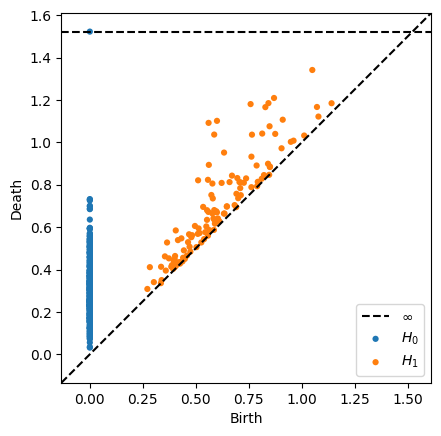

,stage,dimension,trainable
0,INPUT,120,0
1,FC1,120 → 192,23232
2,LN1,192,384
3,GELU1,192,0
4,DROP1,192,0
5,FC2,192 → 128,24704
6,LN2,128,256
7,GELU2,128,0
8,DROP2,128,0
9,FC3,128 → 64,8256



ARCHITECTURE ACCOUNTING CHECK
Calculated trainable params: 58,910
Model trainable params     : 58,910
Reference                  : 58,910
STATUS                     : PASS

HEF MLP GATEWAY — FINAL VISUAL READOUT
Parameters               : 58,910
Checkpoint epoch         : 9
Best corrupted RMSE      : 0.347929
Best corrupted MAE       : 0.210617
Corrupted Pearson        : 0.891618
Corrupted Spearman       : 0.875229
Validation CLEAN         : 61,556
Validation CORRUPTED    : 338,444
Views / subject          : 143
Train subjects           : 287,263
Train examples / epoch  : 41,078,609
DEVICE                   : cuda

VISUAL LAB COMPLETE


In [22]:
!pip -q install -U plotly networkx pyvis torchinfo torchview umap-learn ripser persim scikit-learn

import gc
import json
import math
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
import torch
import torch.nn as nn

import plotly.graph_objects as go

from IPython.display import display, HTML

import networkx as nx
from pyvis.network import Network
from torchinfo import summary

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

warnings.filterwarnings("ignore")

np.set_printoptions(
    precision=5,
    suppress=True
)

try:
    import umap
    UMAP_OK = True
except Exception:
    UMAP_OK = False

try:
    from ripser import ripser
    from persim import plot_diagrams
    RIPSER_OK = True
except Exception:
    RIPSER_OK = False

INPUT_DIM = 120
OUTPUT_DIM = 30

HIDDEN_DIMS = (
    192,
    128,
    64
)

DROPOUT = 0.10

MSE_WEIGHT = 0.90
PEARSON_WEIGHT = 0.10

BATCH_SIZE = 8192

LEARNING_RATE = 0.002
WEIGHT_DECAY = 0.0001

NORMALIZATION = "(x - 3) / 2"

VIEWS_PER_SUBJECT = 143

EXPECTED_PARAMETERS = 58910

TRAIN_SUBJECTS = 287263
TRAIN_EXAMPLES = 41078609

VALIDATION_CLEAN = 61556
VALIDATION_CORRUPTED = 338444

BEST_EPOCH_REFERENCE = 9
BEST_CORRUPTED_RMSE_REFERENCE = 0.347929

GLOBAL_SEED = 20260920

CANDIDATE_ROOTS = [
    Path("/content/HEF_IPIP120_ROBUST_DATASET_V3"),
    Path("/content/drive/MyDrive/HEF_IPIP120_ROBUST_DATASET_V3"),
]

def first_existing(candidates):
    for path in candidates:
        path = Path(path)
        if path.exists():
            return path
    return None

ROOT = first_existing(CANDIDATE_ROOTS)

if ROOT is None:
    for base in [
        Path("/content"),
        Path("/content/drive/MyDrive")
    ]:
        if not base.exists():
            continue
        hits = list(
            base.glob(
                "**/MLP_GATEWAY_PRODUCTION/best.pt"
            )
        )
        if hits:
            ROOT = hits[0].parent.parent
            break

if ROOT is None:
    raise FileNotFoundError(
        "HEF_IPIP120_ROBUST_DATASET_V3 no encontrado."
    )

PRODUCTION_ROOT = ROOT / "MLP_GATEWAY_PRODUCTION"
BEST_CHECKPOINT = PRODUCTION_ROOT / "best.pt"
LAST_CHECKPOINT = PRODUCTION_ROOT / "last.pt"
METRICS_CSV = PRODUCTION_ROOT / "training_history.csv"
METRICS_JSON = PRODUCTION_ROOT / "training_history.json"

print("=" * 110)
print("HEF IPIP120 ROBUST — MLP GATEWAY VISUAL LAB")
print("=" * 110)
print("ROOT       :", ROOT)
print("BEST       :", BEST_CHECKPOINT)
print("LAST       :", LAST_CHECKPOINT)
print("HISTORY CSV:", METRICS_CSV)
print("=" * 110)

class HEFIPIP120MLP(nn.Module):

    def __init__(self):
        super().__init__()

        self.trunk = nn.Sequential(
            nn.Linear(INPUT_DIM, 192),
            nn.LayerNorm(192),
            nn.GELU(),
            nn.Dropout(DROPOUT),

            nn.Linear(192, 128),
            nn.LayerNorm(128),
            nn.GELU(),
            nn.Dropout(DROPOUT),

            nn.Linear(128, 64),
            nn.LayerNorm(64),
            nn.GELU(),
            nn.Dropout(DROPOUT),
        )

        self.output = nn.Linear(
            64,
            OUTPUT_DIM
        )

    def forward(self, x):

        x = (
            x - 3.0
        ) / 2.0

        x = self.trunk(x)

        return self.output(x)

model = HEFIPIP120MLP()

ckpt = None

if not BEST_CHECKPOINT.exists():
    raise FileNotFoundError(
        f"best.pt no encontrado:\n{BEST_CHECKPOINT}"
    )

try:
    ckpt = torch.load(
        BEST_CHECKPOINT,
        map_location="cpu",
        weights_only=False
    )
except TypeError:
    ckpt = torch.load(
        BEST_CHECKPOINT,
        map_location="cpu"
    )

if "model_state_dict" not in ckpt:
    raise KeyError(
        "model_state_dict no existe en el checkpoint."
    )

model.load_state_dict(
    ckpt["model_state_dict"],
    strict=True
)

DEVICE = (
    torch.device("cuda")
    if torch.cuda.is_available()
    else torch.device("cpu")
)

model = model.to(DEVICE)
model.eval()

PARAMETERS = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

print()
print("=" * 110)
print("ARCHITECTURE           :", "120 -> 192 -> 128 -> 64 -> 30")
print("TRAINABLE PARAMETERS   :", f"{PARAMETERS:,}")
print("REFERENCE PARAMETERS   :", f"{EXPECTED_PARAMETERS:,}")
print(
    "PARAMETER CHECK        :",
    "PASS" if PARAMETERS == EXPECTED_PARAMETERS else "MISMATCH"
)
print("NORMALIZATION          :", NORMALIZATION)
print("OBJECTIVE              :", "0.90*MSE + 0.10*Pearson")
print("DROPOUT                :", DROPOUT)
print("DEVICE                 :", DEVICE)
print("CHECKPOINT EPOCH       :", ckpt.get("epoch", "unknown"))
print("=" * 110)

tensor_rows = []

for name, parameter in model.named_parameters():

    data = (
        parameter
        .detach()
        .cpu()
        .numpy()
    )

    tensor_rows.append({
        "tensor": name,
        "shape": str(tuple(data.shape)),
        "parameters": int(data.size),
        "mean": float(data.mean()),
        "std": float(data.std()),
        "min": float(data.min()),
        "max": float(data.max()),
        "L2": float(np.linalg.norm(data.ravel()))
    })

tensor_df = pd.DataFrame(
    tensor_rows
)

display(
    tensor_df.style.format({
        "mean": "{:.6f}",
        "std": "{:.6f}",
        "min": "{:.6f}",
        "max": "{:.6f}",
        "L2": "{:.6f}"
    })
)

print()
print("=" * 110)
print("TORCHINFO — EXACT GATEWAY")
print("=" * 110)

summary(
    model,
    input_size=(1, INPUT_DIM),
    depth=6,
    col_names=(
        "input_size",
        "output_size",
        "num_params"
    ),
    verbose=1
)

NX_GRAPH = nx.DiGraph()

architecture_nodes = [
    ("INPUT", "INPUT\n120", 120, "Input"),
    ("FC1", "LINEAR\n120 → 192", 192, "Dense"),
    ("LN1", "LAYERNORM\n192", 192, "LayerNorm"),
    ("GELU1", "GELU", 192, "Activation"),
    ("DROP1", "DROPOUT\np=0.10", 192, "Regularization"),
    ("FC2", "LINEAR\n192 → 128", 128, "Dense"),
    ("LN2", "LAYERNORM\n128", 128, "LayerNorm"),
    ("GELU2", "GELU", 128, "Activation"),
    ("DROP2", "DROPOUT\np=0.10", 128, "Regularization"),
    ("FC3", "LINEAR\n128 → 64", 64, "Dense"),
    ("LN3", "LAYERNORM\n64", 64, "LayerNorm"),
    ("GELU3", "GELU", 64, "Activation"),
    ("DROP3", "DROPOUT\np=0.10", 64, "Regularization"),
    ("OUT", "OUTPUT\n64 → 30", 30, "Output"),
]

for node_id, label, width, category in architecture_nodes:
    NX_GRAPH.add_node(
        node_id,
        width=width,
        category=category
    )

for i in range(
    len(architecture_nodes) - 1
):
    NX_GRAPH.add_edge(
        architecture_nodes[i][0],
        architecture_nodes[i + 1][0]
    )

print("NetworkX nodes:", NX_GRAPH.number_of_nodes())
print("NetworkX edges:", NX_GRAPH.number_of_edges())
print("Graph density:", f"{nx.density(NX_GRAPH):.6f}")

PYVIS_COLORS = [
    "#53d8fb",
    "#ff4f81",
    "#8b5cf6",
    "#22c55e",
    "#f59e0b",
    "#ec4899",
    "#6366f1",
    "#14b8a6",
    "#f97316",
    "#e11d48",
    "#06b6d4",
    "#a855f7",
    "#10b981",
    "#facc15",
]

net = Network(
    height="720px",
    width="100%",
    bgcolor="#05070c",
    font_color="white",
    directed=True
)

net.set_options(
    """
    {
      "physics": {
        "enabled": true,
        "solver": "forceAtlas2Based",
        "forceAtlas2Based": {
          "gravitationalConstant": -95,
          "centralGravity": 0.015,
          "springLength": 180,
          "springConstant": 0.07,
          "damping": 0.75
        },
        "stabilization": {
          "iterations": 220
        }
      },
      "edges": {
        "arrows": {
          "to": {
            "enabled": true,
            "scaleFactor": 0.65
          }
        },
        "smooth": {
          "type": "dynamic"
        }
      },
      "interaction": {
        "hover": true,
        "navigationButtons": true,
        "keyboard": true,
        "dragNodes": true
      }
    }
    """
)

for i, (
    node_id,
    label,
    width,
    category
) in enumerate(
    architecture_nodes
):
    net.add_node(
        node_id,
        label=label,
        title=(
            f"Component: {node_id}<br>"
            f"Width: {width}<br>"
            f"Type: {category}"
        ),
        value=max(
            10,
            int(math.sqrt(width))
        ),
        color=PYVIS_COLORS[
            i % len(PYVIS_COLORS)
        ],
        shape="dot"
    )

for i in range(
    len(architecture_nodes) - 1
):
    net.add_edge(
        architecture_nodes[i][0],
        architecture_nodes[i + 1][0],
        title=(
            f"{architecture_nodes[i][0]} → "
            f"{architecture_nodes[i + 1][0]}"
        ),
        width=3
    )

print("Mostrando grafo interactivo...")

display(
    HTML(
        net.generate_html()
    )
)

LINEAR_LAYERS = [
    ("FC1", model.trunk[0]),
    ("FC2", model.trunk[4]),
    ("FC3", model.trunk[8]),
    ("OUT", model.output),
]

matrix_stats = []

for name, layer in LINEAR_LAYERS:

    W = (
        layer.weight
        .detach()
        .cpu()
        .numpy()
        .astype(np.float64)
    )

    b = (
        layer.bias
        .detach()
        .cpu()
        .numpy()
        .astype(np.float64)
    )

    singular_values = np.linalg.svd(
        W,
        compute_uv=False
    )

    matrix_stats.append({
        "layer": name,
        "shape": str(tuple(W.shape)),
        "weight_parameters": int(W.size),
        "bias_parameters": int(b.size),
        "total_parameters": int(
            W.size + b.size
        ),
        "frobenius_norm": float(
            np.linalg.norm(
                W,
                ord="fro"
            )
        ),
        "spectral_norm": float(
            singular_values.max()
        ),
        "rank": int(
            np.linalg.matrix_rank(W)
        ),
        "mean": float(W.mean()),
        "std": float(W.std()),
        "min": float(W.min()),
        "max": float(W.max()),
        "bias_l2": float(
            np.linalg.norm(b)
        )
    })

matrix_df = pd.DataFrame(
    matrix_stats
)

print()
print("=" * 110)
print("MATRIX / SPECTRAL GEOMETRY")
print("=" * 110)

display(
    matrix_df.style.format({
        "frobenius_norm": "{:.6f}",
        "spectral_norm": "{:.6f}",
        "mean": "{:.6f}",
        "std": "{:.6f}",
        "min": "{:.6f}",
        "max": "{:.6f}",
        "bias_l2": "{:.6f}"
    })
)

for name, layer in LINEAR_LAYERS:

    W = (
        layer.weight
        .detach()
        .cpu()
        .numpy()
    )

    fig = go.Figure(
        data=go.Heatmap(
            z=W,
            colorscale="Turbo",
            colorbar=dict(
                title="Weight"
            ),
            hovertemplate=(
                "row=%{y}"
                "<br>"
                "column=%{x}"
                "<br>"
                "value=%{z:.6f}"
                "<extra></extra>"
            )
        )
    )

    fig.update_layout(
        title=(
            f"{name} — COMPLETE WEIGHT MATRIX "
            f"{W.shape[0]} × {W.shape[1]}"
        ),
        template="plotly_dark",
        height=620,
        xaxis_title="Input dimension",
        yaxis_title="Neuron / output row",
        margin=dict(
            l=70,
            r=30,
            t=80,
            b=65
        )
    )

    fig.show()

for name, layer in LINEAR_LAYERS:

    b = (
        layer.bias
        .detach()
        .cpu()
        .numpy()
    )

    fig = go.Figure()

    fig.add_trace(
        go.Bar(
            x=np.arange(len(b)),
            y=b,
            name=name
        )
    )

    fig.update_layout(
        title=f"{name} — bias vector",
        template="plotly_dark",
        height=480,
        xaxis_title="Index",
        yaxis_title="Bias"
    )

    fig.show()

fig = go.Figure()

for name, layer in LINEAR_LAYERS:

    W = (
        layer.weight
        .detach()
        .cpu()
        .numpy()
        .astype(np.float64)
    )

    singular_values = np.linalg.svd(
        W,
        compute_uv=False
    )

    fig.add_trace(
        go.Scatter(
            x=np.arange(
                1,
                len(singular_values) + 1
            ),
            y=singular_values,
            mode="lines+markers",
            name=name
        )
    )

fig.update_layout(
    title=(
        "SINGULAR VALUE GEOMETRY — ALL LINEAR OPERATORS"
    ),
    template="plotly_dark",
    yaxis_type="log",
    xaxis_title="Singular value index",
    yaxis_title="σᵢ",
    height=620
)

fig.show()

EXTERNAL_LAYERS = [
    ("INPUT", 120),
    ("H1", 192),
    ("H2", 128),
    ("H3", 64),
    ("OUTPUT", 30),
]

def layer_geometry(
    dimension,
    depth,
    max_nodes=18
):

    n = min(
        dimension,
        max_nodes
    )

    indices = np.linspace(
        0,
        dimension - 1,
        n
    ).astype(int)

    theta = np.linspace(
        0,
        2 * np.pi,
        n,
        endpoint=False
    )

    radius = (
        1.0 +
        0.12 *
        np.sin(
            indices * 0.91
        )
    )

    y = (
        radius *
        np.cos(theta) *
        (
            1 +
            np.log1p(dimension) / 5
        )
    )

    z = (
        radius *
        np.sin(theta) *
        (
            1 +
            np.log1p(dimension) / 5
        )
    )

    x = np.full(
        n,
        depth
    )

    return (
        indices,
        x,
        y,
        z
    )

external_points = []

for depth, (
    layer_name,
    dimension
) in enumerate(
    EXTERNAL_LAYERS
):

    ids, x, y, z = layer_geometry(
        dimension,
        depth
    )

    for i in range(
        len(ids)
    ):

        external_points.append({
            "layer": depth,
            "name": layer_name,
            "neuron": int(ids[i]),
            "dimension": dimension,
            "x": float(x[i]),
            "y": float(y[i]),
            "z": float(z[i])
        })

external_df = pd.DataFrame(
    external_points
)

fig = go.Figure()

for depth in range(
    len(EXTERNAL_LAYERS) - 1
):

    A = external_df[
        external_df.layer == depth
    ]

    B = external_df[
        external_df.layer == depth + 1
    ]

    for _, a in A.iterrows():

        for _, b in B.iterrows():

            fig.add_trace(
                go.Scatter3d(
                    x=[a.x, b.x],
                    y=[a.y, b.y],
                    z=[a.z, b.z],
                    mode="lines",
                    line=dict(
                        color="rgba(120,160,255,0.10)",
                        width=1
                    ),
                    hoverinfo="skip",
                    showlegend=False
                )
            )

for layer_index, (
    layer_name,
    dimension
) in enumerate(
    EXTERNAL_LAYERS
):

    subset = external_df[
        external_df.layer == layer_index
    ]

    fig.add_trace(
        go.Scatter3d(
            x=subset.x,
            y=subset.y,
            z=subset.z,
            mode="markers+text",
            text=[
                (
                    f"{layer_name}<br>{dimension}"
                    if i == 0
                    else ""
                )
                for i in range(
                    len(subset)
                )
            ],
            textposition="top center",
            marker=dict(
                size=(
                    6 +
                    0.018 *
                    dimension
                ),
                color=PYVIS_COLORS[
                    layer_index %
                    len(PYVIS_COLORS)
                ],
                opacity=0.95
            ),
            name=(
                f"{layer_name} "
                f"({dimension})"
            ),
            hovertext=[
                (
                    f"Layer: {layer_name}"
                    f"<br>"
                    f"Neuron sample: {n}"
                    f"<br>"
                    f"Exact width: {dimension}"
                )
                for n in subset.neuron
            ],
            hoverinfo="text"
        )
    )

fig.update_layout(
    title=(
        "HEF MLP GATEWAY — "
        "EXTERNAL 3D GEOMETRY"
    ),
    template="plotly_dark",
    height=820,
    scene=dict(
        xaxis_title="Layer depth",
        yaxis_title="Geometry Y",
        zaxis_title="Geometry Z",
        aspectmode="auto"
    ),
    margin=dict(
        l=0,
        r=0,
        t=90,
        b=0
    )
)

fig.show()

CLEAN_ROOT = ROOT / "VALIDATION" / "CLEAN"
CORRUPTED_ROOT = ROOT / "VALIDATION" / "CORRUPTED"

def sample_xy(
    split_root,
    n=1024,
    seed=20260920
):

    split_root = Path(split_root)

    x_paths = sorted(
        split_root.glob(
            "shard_*_X.npy"
        )
    )

    if not x_paths:
        x_paths = sorted(
            split_root.glob(
                "*_X.npy"
            )
        )

    if not x_paths:
        return None, None

    x_path = x_paths[0]

    y_path = Path(
        str(x_path).replace(
            "_X.npy",
            "_Y.npy"
        )
    )

    if not y_path.exists():
        return None, None

    x_mm = np.load(
        x_path,
        mmap_mode="r"
    )

    y_mm = np.load(
        y_path,
        mmap_mode="r"
    )

    rng = np.random.default_rng(
        seed
    )

    k = min(
        n,
        x_mm.shape[0]
    )

    ids = rng.choice(
        x_mm.shape[0],
        size=k,
        replace=False
    )

    X = np.asarray(
        x_mm[ids],
        dtype=np.uint8
    )

    Y = np.asarray(
        y_mm[ids],
        dtype=np.float32
    )

    return X, Y

X_CLEAN, Y_CLEAN = sample_xy(
    CLEAN_ROOT,
    n=1024,
    seed=20260920
)

X_CORRUPTED, Y_CORRUPTED = sample_xy(
    CORRUPTED_ROOT,
    n=1024,
    seed=20260921
)

print()
print("CLEAN sample     :", None if X_CLEAN is None else X_CLEAN.shape)
print("CORRUPTED sample :", None if X_CORRUPTED is None else X_CORRUPTED.shape)

if X_CLEAN is None or X_CORRUPTED is None:
    raise RuntimeError(
        "No se pudieron cargar los samples de VALIDATION."
    )

@torch.no_grad()
def forward_states(
    X
):

    device = next(
        model.parameters()
    ).device

    x = torch.as_tensor(
        np.asarray(
            X,
            dtype=np.uint8
        ),
        dtype=torch.float32,
        device=device
    )

    x = (
        x - 3.0
    ) / 2.0

    was_training = model.training
    model.eval()

    if device.type == "cuda":

        with torch.autocast(
            device_type="cuda",
            dtype=torch.bfloat16
        ):

            h1 = model.trunk[:4](x)
            h2 = model.trunk[:8](x)
            h3 = model.trunk(x)
            out = model.output(h3)

    else:

        h1 = model.trunk[:4](x)
        h2 = model.trunk[:8](x)
        h3 = model.trunk(x)
        out = model.output(h3)

    if was_training:
        model.train()

    return (
        h1.float().cpu().numpy(),
        h2.float().cpu().numpy(),
        h3.float().cpu().numpy(),
        out.float().cpu().numpy()
    )

clean_n = min(
    768,
    len(X_CLEAN)
)

corrupted_n = min(
    768,
    len(X_CORRUPTED)
)

X_MIXED = np.concatenate(
    [
        X_CLEAN[:clean_n],
        X_CORRUPTED[:corrupted_n]
    ],
    axis=0
)

LABELS = np.array(
    ["CLEAN"] * clean_n +
    ["CORRUPTED"] * corrupted_n
)

H1, H2, H3, PRED = forward_states(
    X_MIXED
)

print()
print("FORWARD STATE CHECK")
print("H1 :", H1.shape)
print("H2 :", H2.shape)
print("H3 :", H3.shape)
print("OUT:", PRED.shape)

if UMAP_OK:

    reducer = umap.UMAP(
        n_neighbors=25,
        min_dist=0.15,
        n_components=3,
        metric="cosine",
        random_state=42
    )

    EMBEDDING = reducer.fit_transform(
        H3
    )

    REDUCTION_NAME = "UMAP-3D"

else:

    scaled = StandardScaler().fit_transform(
        H3
    )

    EMBEDDING = PCA(
        n_components=3,
        random_state=42
    ).fit_transform(
        scaled
    )

    REDUCTION_NAME = "PCA-3D"

fig = go.Figure()

for label, symbol in [
    ("CLEAN", "circle"),
    ("CORRUPTED", "diamond")
]:

    mask = (
        LABELS ==
        label
    )

    fig.add_trace(
        go.Scatter3d(
            x=EMBEDDING[
                mask,
                0
            ],
            y=EMBEDDING[
                mask,
                1
            ],
            z=EMBEDDING[
                mask,
                2
            ],
            mode="markers",
            marker=dict(
                size=5,
                opacity=0.72,
                symbol=symbol
            ),
            name=label,
            text=[
                f"{label} sample {i}"
                for i in np.where(mask)[0]
            ],
            hoverinfo="text"
        )
    )

fig.update_layout(
    title=(
        "INTERNAL LATENT GEOMETRY — "
        f"{REDUCTION_NAME}"
    ),
    template="plotly_dark",
    height=820,
    scene=dict(
        xaxis_title="latent axis 1",
        yaxis_title="latent axis 2",
        zaxis_title="latent axis 3"
    )
)

fig.show()

activation_frames = []

for layer_name, values in [
    ("H1 (192)", H1),
    ("H2 (128)", H2),
    ("H3 (64)", H3)
]:

    flat = values.ravel()

    if len(flat) > 200000:
        rng = np.random.default_rng(
            GLOBAL_SEED
        )
        sample_size = min(
            200000,
            len(flat)
        )
        idx = rng.choice(
            len(flat),
            size=sample_size,
            replace=False
        )
        flat = flat[idx]

    activation_frames.append(
        pd.DataFrame({
            "layer": layer_name,
            "value": flat
        })
    )

activation_df = pd.concat(
    activation_frames,
    ignore_index=True
)

fig = go.Figure()

for layer_name in [
    "H1 (192)",
    "H2 (128)",
    "H3 (64)"
]:

    values = activation_df.loc[
        activation_df.layer == layer_name,
        "value"
    ].to_numpy()

    fig.add_trace(
        go.Violin(
            y=values,
            name=layer_name,
            box_visible=True,
            meanline_visible=True
        )
    )

fig.update_layout(
    title="INTERNAL ACTIVATION GEOMETRY",
    template="plotly_dark",
    height=650,
    yaxis_title="Activation value"
)

fig.show()

def profile_plot(
    target,
    prediction,
    label
):

    fig = go.Figure()

    fig.add_trace(
        go.Scatterpolar(
            r=target,
            theta=np.arange(
                1,
                OUTPUT_DIM + 1
            ),
            fill="toself",
            name="TARGET"
        )
    )

    fig.add_trace(
        go.Scatterpolar(
            r=prediction,
            theta=np.arange(
                1,
                OUTPUT_DIM + 1
            ),
            fill="toself",
            name="PREDICTION"
        )
    )

    fig.update_layout(
        title=(
            f"IPIP-30 OUTPUT GEOMETRY — {label}"
        ),
        template="plotly_dark",
        height=700,
        polar=dict(
            radialaxis=dict(
                visible=True,
                range=[
                    1,
                    5
                ]
            )
        )
    )

    fig.show()

profile_plot(
    Y_CLEAN[0],
    PRED[0],
    "CLEAN"
)

profile_plot(
    Y_CORRUPTED[0],
    PRED[clean_n],
    "CORRUPTED"
)

residual_target = np.vstack(
    [
        Y_CLEAN[:128],
        Y_CORRUPTED[:128]
    ]
)

residual_prediction = PRED[:256]

RESIDUAL = (
    residual_prediction -
    residual_target
)

fig = go.Figure(
    data=go.Heatmap(
        z=RESIDUAL,
        colorscale="RdBu_r",
        zmid=0,
        colorbar=dict(
            title="Pred - Target"
        )
    )
)

fig.update_layout(
    title=(
        "RESIDUAL MATRIX — "
        "256 samples × 30 outputs"
    ),
    template="plotly_dark",
    height=760,
    xaxis_title="IPIP output dimension",
    yaxis_title="Sample index"
)

fig.show()

if RIPSER_OK:

    topology_points = EMBEDDING[:350]

    try:

        dgms = ripser(
            topology_points,
            maxdim=1
        )["dgms"]

        print()
        print("=" * 110)
        print("PERSISTENT HOMOLOGY")
        print("=" * 110)

        plot_diagrams(
            dgms,
            show=True
        )

    except Exception as exc:

        print(
            "Persistent homology error:",
            repr(exc)
        )

fallback_history = pd.DataFrame({
    "epoch": np.arange(1, 13),
    "train_loss": [
        0.223568,
        0.162945,
        0.160075,
        0.159244,
        0.158774,
        0.158466,
        0.158241,
        0.158073,
        0.157927,
        0.157812,
        0.157707,
        0.157635
    ],
    "validation_clean_rmse": [
        0.167016,
        0.152183,
        0.150161,
        0.143756,
        0.141097,
        0.142608,
        0.138934,
        0.142006,
        0.136437,
        0.143442,
        0.141079,
        0.138044
    ],
    "validation_corrupted_rmse": [
        0.359102,
        0.353310,
        0.352113,
        0.350302,
        0.349367,
        0.349490,
        0.348688,
        0.349131,
        0.347929,
        0.349378,
        0.348717,
        0.348218
    ],
    "validation_corrupted_mae": [
        0.231863,
        0.221552,
        0.220072,
        0.215948,
        0.213871,
        0.214734,
        0.212402,
        0.213875,
        0.210617,
        0.214776,
        0.213103,
        0.211691
    ],
    "validation_corrupted_pearson": [
        0.885792,
        0.888585,
        0.889952,
        0.890535,
        0.890826,
        0.891299,
        0.891281,
        0.891084,
        0.891618,
        0.891549,
        0.891474,
        0.891932
    ],
    "validation_corrupted_spearman": [
        0.868413,
        0.871490,
        0.873463,
        0.873854,
        0.874296,
        0.874921,
        0.874838,
        0.874599,
        0.875229,
        0.875117,
        0.875100,
        0.875501
    ],
    "train_throughput": [
        421878,
        425473,
        423666,
        426743,
        427757,
        427859,
        428544,
        428908,
        426394,
        432912,
        426368,
        424291
    ]
})

if METRICS_CSV.exists():

    try:

        history = pd.read_csv(
            METRICS_CSV
        )

        required_columns = {
            "epoch",
            "train_loss",
            "validation_clean_rmse",
            "validation_corrupted_rmse",
            "validation_corrupted_pearson"
        }

        if not required_columns.issubset(
            history.columns
        ):
            history = fallback_history.copy()

    except Exception:

        history = fallback_history.copy()

else:

    history = fallback_history.copy()

best_validation = {}

if ckpt is not None:

    best_validation = (
        ckpt.get(
            "validation_metrics",
            {}
        )
        or {}
    )

family_metrics = (
    best_validation.get(
        "family_metrics",
        {}
    )
    or {}
)

if not family_metrics:

    family_metrics = {
        "ITEM_SWAP": 0.288860,
        "FACET_SWAP": 0.313356,
        "CATEGORY_PARTIAL_SWAP": 0.263232,
        "CATEGORY_SWAP": 0.517382,
        "ITEM_COLLAPSE": 0.272785,
        "CATEGORY_COLLAPSE": 0.404853,
        "RANDOM_ITEM_CHANGE": 0.300759
    }

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=history["epoch"],
        y=history["train_loss"],
        mode="lines+markers",
        name="Train objective"
    )
)

fig.update_layout(
    title=(
        "TRAIN OBJECTIVE — "
        "H = 0.90 MSE + 0.10 Pearson"
    ),
    template="plotly_dark",
    height=580,
    xaxis_title="Epoch",
    yaxis_title="Objective"
)

fig.show()

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=history["epoch"],
        y=history["validation_clean_rmse"],
        mode="lines+markers",
        name="Clean RMSE"
    )
)

fig.add_trace(
    go.Scatter(
        x=history["epoch"],
        y=history["validation_corrupted_rmse"],
        mode="lines+markers",
        name="Corrupted RMSE"
    )
)

best_idx = history[
    "validation_corrupted_rmse"
].idxmin()

best_epoch = int(
    history.loc[
        best_idx,
        "epoch"
    ]
)

best_rmse = float(
    history.loc[
        best_idx,
        "validation_corrupted_rmse"
    ]
)

fig.add_trace(
    go.Scatter(
        x=[best_epoch],
        y=[best_rmse],
        mode="markers+text",
        text=["BEST"],
        textposition="top center",
        marker=dict(
            size=15,
            symbol="diamond"
        ),
        name="Best checkpoint"
    )
)

fig.update_layout(
    title="VALIDATION ERROR TRAJECTORY",
    template="plotly_dark",
    height=620,
    xaxis_title="Epoch",
    yaxis_title="RMSE"
)

fig.show()

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=history["epoch"],
        y=history["validation_corrupted_pearson"],
        mode="lines+markers",
        name="Pearson"
    )
)

if "validation_corrupted_spearman" in history.columns:

    fig.add_trace(
        go.Scatter(
            x=history["epoch"],
            y=history["validation_corrupted_spearman"],
            mode="lines+markers",
            name="Spearman"
        )
    )

fig.update_layout(
    title="CORRELATION GEOMETRY",
    template="plotly_dark",
    height=620,
    xaxis_title="Epoch",
    yaxis_title="Correlation"
)

fig.show()

fig = go.Figure(
    data=go.Bar(
        x=list(
            family_metrics.keys()
        ),
        y=list(
            family_metrics.values()
        ),
        text=[
            f"{v:.6f}"
            for v in family_metrics.values()
        ],
        textposition="outside"
    )
)

fig.update_layout(
    title="CORRUPTION FAMILY RMSE — BEST CHECKPOINT",
    template="plotly_dark",
    height=680,
    xaxis_title="Corruption family",
    yaxis_title="RMSE",
    xaxis_tickangle=-25
)

fig.show()

if "train_throughput" in history.columns:

    fig = go.Figure()

    fig.add_trace(
        go.Scatter(
            x=history["epoch"],
            y=history["train_throughput"],
            mode="lines+markers",
            name="examples/s",
            fill="tozeroy"
        )
    )

    fig.update_layout(
        title="PRODUCTION THROUGHPUT GEOMETRY",
        template="plotly_dark",
        height=580,
        xaxis_title="Epoch",
        yaxis_title="Examples / second"
    )

    fig.show()

fig = go.Figure()

fig.add_trace(
    go.Scatter3d(
        x=history["epoch"],
        y=history["validation_corrupted_rmse"],
        z=history["validation_corrupted_pearson"],
        mode="lines+markers",
        marker=dict(
            size=8,
            color=history["validation_clean_rmse"],
            colorscale="Turbo",
            colorbar=dict(
                title="Clean RMSE"
            )
        ),
        line=dict(
            width=5
        ),
        text=[
            (
                f"Epoch {e}"
                f"<br>Clean RMSE = {clean:.6f}"
                f"<br>Corrupted RMSE = {corr:.6f}"
                f"<br>Pearson = {pearson:.6f}"
            )
            for e, clean, corr, pearson
            in zip(
                history["epoch"],
                history["validation_clean_rmse"],
                history["validation_corrupted_rmse"],
                history["validation_corrupted_pearson"]
            )
        ],
        hoverinfo="text",
        name="Metric trajectory"
    )
)

fig.add_trace(
    go.Scatter3d(
        x=[best_epoch],
        y=[best_rmse],
        z=[
            float(
                history.loc[
                    best_idx,
                    "validation_corrupted_pearson"
                ]
            )
        ],
        mode="markers+text",
        marker=dict(
            size=15,
            symbol="diamond",
            color="white"
        ),
        text=[
            f"BEST EPOCH {best_epoch}"
        ],
        textposition="top center",
        name="BEST"
    )
)

fig.update_layout(
    title="HEF MLP GATEWAY — 3D METRIC SPACE",
    template="plotly_dark",
    height=820,
    scene=dict(
        xaxis_title="Epoch",
        yaxis_title="Corrupted RMSE",
        zaxis_title="Corrupted Pearson"
    ),
    margin=dict(
        l=0,
        r=0,
        t=80,
        b=0
    )
)

fig.show()

fig = go.Figure()

for name, layer in LINEAR_LAYERS:

    W = (
        layer.weight
        .detach()
        .cpu()
        .numpy()
        .astype(np.float64)
    )

    standardized = (
        StandardScaler()
        .fit_transform(W)
    )

    projection = PCA(
        n_components=3,
        random_state=42
    ).fit_transform(
        standardized
    )

    fig.add_trace(
        go.Scatter3d(
            x=projection[:, 0],
            y=projection[:, 1],
            z=projection[:, 2],
            mode="markers",
            marker=dict(
                size=5,
                opacity=0.78
            ),
            name=name,
            text=[
                f"{name} neuron-row {i}"
                for i in range(
                    W.shape[0]
                )
            ],
            hoverinfo="text"
        )
    )

fig.update_layout(
    title="INTERNAL WEIGHT-SPACE GEOMETRY — 3D PCA",
    template="plotly_dark",
    height=820,
    scene=dict(
        xaxis_title="Weight axis / PC1",
        yaxis_title="Weight axis / PC2",
        zaxis_title="Weight axis / PC3"
    )
)

fig.show()

LAYER_NORMS = [
    ("LN1", model.trunk[1]),
    ("LN2", model.trunk[5]),
    ("LN3", model.trunk[9])
]

fig = go.Figure()

for name, ln in LAYER_NORMS:

    gamma = (
        ln.weight
        .detach()
        .cpu()
        .numpy()
    )

    beta = (
        ln.bias
        .detach()
        .cpu()
        .numpy()
    )

    fig.add_trace(
        go.Scatter(
            x=np.arange(
                len(gamma)
            ),
            y=gamma,
            mode="lines",
            name=f"{name} γ"
        )
    )

    fig.add_trace(
        go.Scatter(
            x=np.arange(
                len(beta)
            ),
            y=beta,
            mode="lines",
            name=f"{name} β",
            line=dict(
                dash="dash"
            )
        )
    )

fig.update_layout(
    title="LAYERNORM INTERNAL PARAMETER GEOMETRY",
    template="plotly_dark",
    height=620,
    xaxis_title="Feature index",
    yaxis_title="Parameter"
)

fig.show()

W_OUT = (
    model.output.weight
    .detach()
    .cpu()
    .numpy()
)

X_GRID = np.arange(
    W_OUT.shape[1]
)

Y_GRID = np.arange(
    W_OUT.shape[0]
)

XX, YY = np.meshgrid(
    X_GRID,
    Y_GRID
)

fig = go.Figure(
    data=[
        go.Surface(
            x=XX,
            y=YY,
            z=W_OUT,
            colorscale="Turbo",
            colorbar=dict(
                title="Weight"
            )
        )
    ]
)

fig.update_layout(
    title="OUTPUT WEIGHT MATRIX — 3D SURFACE GEOMETRY",
    template="plotly_dark",
    height=800,
    scene=dict(
        xaxis_title="Input hidden dimension",
        yaxis_title="IPIP output dimension",
        zaxis_title="Weight value"
    )
)

fig.show()

architecture_table = pd.DataFrame({
    "stage": [
        "INPUT",
        "FC1",
        "LN1",
        "GELU1",
        "DROP1",
        "FC2",
        "LN2",
        "GELU2",
        "DROP2",
        "FC3",
        "LN3",
        "GELU3",
        "DROP3",
        "OUTPUT"
    ],
    "dimension": [
        120,
        "120 → 192",
        192,
        192,
        192,
        "192 → 128",
        128,
        128,
        128,
        "128 → 64",
        64,
        64,
        64,
        "64 → 30"
    ],
    "trainable": [
        0,
        23232,
        384,
        0,
        0,
        24704,
        256,
        0,
        0,
        8256,
        128,
        0,
        0,
        1950
    ]
})

display(
    architecture_table
)

computed_trainable = int(
    architecture_table[
        "trainable"
    ].sum()
)

print()
print("=" * 110)
print("ARCHITECTURE ACCOUNTING CHECK")
print("=" * 110)
print(
    "Calculated trainable params:",
    f"{computed_trainable:,}"
)
print(
    "Model trainable params     :",
    f"{PARAMETERS:,}"
)
print(
    "Reference                  :",
    f"{EXPECTED_PARAMETERS:,}"
)
print(
    "STATUS                     :",
    (
        "PASS"
        if (
            computed_trainable ==
            PARAMETERS ==
            EXPECTED_PARAMETERS
        )
        else
        "CHECK"
    )
)
print("=" * 110)

print()
print("=" * 110)
print("HEF MLP GATEWAY — FINAL VISUAL READOUT")
print("=" * 110)
print("Parameters               :", f"{PARAMETERS:,}")
print(
    "Checkpoint epoch         :",
    ckpt.get("epoch", "unknown")
)
print(
    "Best corrupted RMSE      :",
    f"{best_validation.get('corrupted_rmse', BEST_CORRUPTED_RMSE_REFERENCE):.6f}"
)
print(
    "Best corrupted MAE       :",
    f"{best_validation.get('corrupted_mae', np.nan):.6f}"
)
print(
    "Corrupted Pearson        :",
    f"{best_validation.get('corrupted_pearson', history['validation_corrupted_pearson'].max()):.6f}"
)
print(
    "Corrupted Spearman       :",
    f"{best_validation.get('corrupted_spearman', history['validation_corrupted_spearman'].max()):.6f}"
)
print(
    "Validation CLEAN         :",
    f"{VALIDATION_CLEAN:,}"
)
print(
    "Validation CORRUPTED    :",
    f"{VALIDATION_CORRUPTED:,}"
)
print(
    "Views / subject          :",
    VIEWS_PER_SUBJECT
)
print(
    "Train subjects           :",
    f"{TRAIN_SUBJECTS:,}"
)
print(
    "Train examples / epoch  :",
    f"{TRAIN_EXAMPLES:,}"
)
print(
    "DEVICE                   :",
    DEVICE
)
print("=" * 110)

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

print()
print("VISUAL LAB COMPLETE")

# HEF IPIP120 Robust — Traditional Scoring vs HEF Head-to-Head Benchmark

## 1. Experiment Identification

**Experiment name:** HEF IPIP120 Robust — Traditional vs HEF Head-to-Head Benchmark

**Benchmark type:** Paired methodological comparison between a conventional deterministic psychometric scoring procedure and a trained nonlinear reconstruction model.

**Purpose:** To evaluate whether the HEF MLP Gateway can reconstruct the immutable psychometric reference representation more accurately than direct traditional scoring when the observed 120-item response vector contains structured perturbations.

The benchmark compares two computational methods operating on the same validation observations:

1. **TRADITIONAL:** direct application of the original reverse-scoring and facet-aggregation procedure to the observed response matrix.
2. **HEF_B_H:** inference through the trained HEF MLP Gateway using Architecture B and Objective H.

The reference target for both methods is the same immutable Gold representation associated with the original participant. The benchmark therefore evaluates both methods against a common target rather than comparing one method against the other as a reference.

## 2. Scientific Objective

The central experimental question is whether a learned nonlinear approximation can preserve the original 30-dimensional psychometric representation under structured corruption of the 120-dimensional observation space.

The comparison is designed around the distinction between:

$$
Gold(X_{original})
$$

and

$$
Traditional(X_{corrupted}).
$$

For clean observations, the traditional procedure is expected to reproduce the stored Gold representation exactly:

$$
Traditional(X_{clean}) = Gold(X_{clean}).
$$

For corrupted observations, however, the traditional scorer operates directly on the altered response vector and therefore produces:

$$
Traditional(X_{corrupted}),
$$

which is not necessarily equal to:

$$
Gold(X_{original}).
$$

The HEF model is evaluated under the same condition:

$$
HEF(X_{corrupted}) \rightarrow \hat{Y}.
$$

Both outputs are then compared against the same immutable Gold target.

## 3. Experimental Reference Structure

The benchmark uses three conceptually distinct objects:

### 3.1 Observed input

$$
X \in \mathbb{R}^{120}
$$

This is the 120-dimensional response vector presented to each method.

### 3.2 Reference target

$$
Y = Gold(X_{original}) \in \mathbb{R}^{30}
$$

This is the immutable 30-dimensional psychometric representation generated from the original participant response vector.

### 3.3 Method-specific prediction

For the traditional procedure:

$$
\hat{Y}_{traditional}=Traditional(X)
$$

For HEF:

$$
\hat{Y}_{HEF}=HEF(X).
$$

The reference target remains unchanged for both conditions. This is the fundamental control that makes the head-to-head comparison interpretable.

## 4. Dataset Variables

The benchmark explicitly defines:

`INPUT_DIM = 120`

This variable specifies the dimensionality of the raw observation space.

`OUTPUT_DIM = 30`

This specifies the dimensionality of the psychometric target representation.

`FAMILY_NAMES`

This dictionary encodes the seven structured corruption mechanisms:

* `1 = ITEM_SWAP`
* `2 = FACET_SWAP`
* `3 = CATEGORY_PARTIAL_SWAP`
* `4 = CATEGORY_SWAP`
* `5 = ITEM_COLLAPSE`
* `6 = CATEGORY_COLLAPSE`
* `7 = RANDOM_ITEM_CHANGE`

These labels are not model inputs. They function as experimental metadata that permit stratified analysis of performance according to perturbation mechanism.

## 5. Data Source Paths

The principal dataset root is:

`ROOT = /content/HEF_IPIP120_ROBUST_DATASET_V3`

The trained HEF model is loaded from:

`ROOT / MLP_GATEWAY_PRODUCTION / best.pt`

The benchmark outputs are stored under:

`ROOT / TRADITIONAL_VS_HEF`

The output directory is created automatically with parent-directory creation enabled.

These paths define the computational provenance of the experiment and should be retained as part of the execution metadata.

## 6. Validation Inputs

The benchmark requires the following validation variables to already exist in the execution environment:

`VAL_CLEAN_X`

`VAL_CLEAN_Y`

`VAL_CORRUPTED_X`

`VAL_CORRUPTED_Y`

`VAL_CORRUPTED_TYPE`

`VAL_CORRUPTED_SEVERITY`

The code explicitly checks their existence before continuing.

The validation dimensionality constraints are:

$$
VAL\_CLEAN\_X \in \mathbb{R}^{N_c \times 120}
$$

$$
VAL\_CLEAN\_Y \in \mathbb{R}^{N_c \times 30}
$$

$$
VAL\_CORRUPTED\_X \in \mathbb{R}^{N_k \times 120}
$$

$$
VAL\_CORRUPTED\_Y \in \mathbb{R}^{N_k \times 30}.
$$

The corruption type and severity arrays must have exactly one entry per corrupted validation observation.

The benchmark therefore verifies that:

* the clean input has 120 columns;
* the clean target has 30 columns;
* the corrupted input has 120 columns;
* the corrupted target has 30 columns;
* input and target row counts match;
* corruption metadata lengths match the corrupted input population.

The exact validation population sizes are not hard-coded in this benchmark; they are inherited from the previously prepared validation dataset and reported dynamically at runtime.

## 7. Traditional Scoring Definition

The conventional reference implementation is reconstructed directly from the instrument-definition variables:

`FACET_NAMES`

`FACET_IDX`

`REVERSE_MASK`

The code explicitly requires these variables to be present.

The traditional algorithm performs three operations:

1. reverse-score negatively keyed items;
2. calculate the mean of the four items assigned to each facet;
3. return the resulting 30 facet scores.

Formally, if \(R_{j}\) denotes an item response, reverse-keyed items are transformed according to:

$$
R'_{j}=6-R_j.
$$

Each facet \(f\) is then calculated from its four associated items:

$$
Y_f =
\frac{1}{4}
\sum_{j\in I_f} R'_j.
$$

The result is a 30-dimensional vector.

## 8. Instrument Integrity Requirements

The benchmark verifies the following structural conditions:

$$
|FACET\_NAMES|=30
$$

$$
|FACET\_IDX|=30
$$

$$
|REVERSE\_MASK|=120.
$$

Each facet must contain exactly four item indices.

The traditional scoring function also requires complete responses within the nominal response domain:

$$
1 \leq X_{ij} \leq 5.
$$

Therefore, the benchmark is explicitly operating on complete scored responses and does not introduce an imputation mechanism during the comparison.

## 9. Traditional Clean Self-Consistency Test

Before the head-to-head comparison, the conventional scoring procedure is applied to the clean validation input:

$$
Traditional(X_{clean}).
$$

This result is compared directly with the stored validation Gold target.

Two diagnostic quantities are computed:

`clean_reference_rmse`

and

`clean_reference_max_abs`.

The expected result is exact methodological reproduction, with the implementation defining a tolerance of:

$$
RMSE \leq 10^{-7}.
$$

If this condition is violated, the benchmark terminates with an error.

This self-consistency test is particularly important because it verifies that the baseline implementation and the Gold-generation procedure use the same instrument mapping and scoring logic before the robustness comparison is performed.

## 10. Traditional Corrupted Evaluation

The baseline is then applied directly to:

$$
VAL\_CORRUPTED\_X.
$$

This produces:

`traditional_corrupted`

with expected dimensions:

$$
N_k \times 30.
$$

The associated target remains:

`VAL_CORRUPTED_Y`.

The baseline therefore does not have access to the original uncorrupted responses when scoring corrupted observations. It receives only the corrupted 120-item response vector, reproducing the operational behavior of a conventional scorer under perturbation.

## 11. HEF Model Definition

The HEF model loaded for the comparison is Architecture B, defined as:

$$
120 \rightarrow 192 \rightarrow 128 \rightarrow 64 \rightarrow 30.
$$

The network consists of three hidden transformations with:

* 192 units;
* 128 units;
* 64 units.

Each hidden layer contains:

1. linear transformation;
2. Layer Normalization;
3. GELU activation;
4. dropout with \(p=0.10\).

The final layer maps 64 latent units to the 30-dimensional output representation.

The model therefore approximates a nonlinear function:

$$
f_{\theta}:
\mathbb{R}^{120}
\rightarrow
\mathbb{R}^{30}.
$$

## 12. HEF Input Normalization

The HEF model internally applies the fixed transformation:

$$
x'=\frac{x-3}{2}.
$$

This is performed inside the model's forward pass before the input enters the learned representation layers.

The normalization converts the original 1–5 response scale into an approximately centered numerical representation. The traditional scorer does not use this transformation because it operates directly on the original response scale.

Consequently, the normalization is an internal HEF implementation detail rather than an alteration of the benchmark's raw validation data.

## 13. HEF Checkpoint Provenance

The benchmark requires the production checkpoint:

`best.pt`.

The checkpoint is loaded onto the CPU first and subsequently instantiated on the CUDA device.

Two checkpoint metadata fields are explicitly validated:

`architecture == "B"`

and

`objective == "H"`.

The expected architecture metadata are:

`B COMPACT`

and

`120 -> 192 -> 128 -> 64 -> 30`.

The expected objective definition is:

$$
0.90\,MSE + 0.10\,Pearson.
$$

The checkpoint also provides the recorded best training epoch and best corrupted-validation RMSE.

## 14. HEF Inference

HEF inference is executed in evaluation mode with gradient computation disabled.

The validation arrays are processed in batches of:

`batch_size = 32768`.

For each batch:

1. the NumPy response matrix is converted into a tensor;
2. the tensor is transferred to CUDA;
3. BF16 automatic mixed precision is applied;
4. the HEF model generates the 30-dimensional predictions;
5. predictions are converted back to float32;
6. results are transferred to CPU and converted to NumPy arrays.

The clean and corrupted predictions are stored separately as:

`hef_clean`

and

`hef_corrupted`.

The expected dimensions are:

$$
N_c\times30
$$

and

$$
N_k\times30,
$$

respectively.

## 15. Evaluation Metrics

The benchmark uses four principal metrics.

### Root Mean Squared Error

$$
RMSE=
\sqrt{
\frac{1}{N}
\sum_{i=1}^{N}
(\hat{y}_i-y_i)^2
}.
$$

RMSE emphasizes larger reconstruction errors through the squared-error term.

### Mean Absolute Error

$$
MAE=
\frac{1}{N}
\sum_{i=1}^{N}
|\hat{y}_i-y_i|.
$$

MAE provides a direct measure of average absolute deviation.

### Pearson Correlation

The prediction and target arrays are flattened and centered before calculating their linear correlation:

$$
r=
\frac{
\sum_i(\hat{y}_i-\bar{\hat{y}})
(y_i-\bar{y})
}{
\sqrt{\sum_i(\hat{y}_i-\bar{\hat{y}})^2}
\sqrt{\sum_i(y_i-\bar{y})^2}
}.
$$

### Spearman Correlation

Predictions and targets are first transformed into average ranks. Pearson correlation is then computed over the resulting ranks.

This metric therefore evaluates monotonic agreement rather than only absolute numerical agreement.

## 16. Global Head-to-Head Comparison

The function `summarize_method()` converts the outputs of either method into a common summary schema.

For each method, the following are recorded:

* `method`
* `clean_rmse`
* `clean_mae`
* `clean_pearson`
* `clean_spearman`
* `corrupted_rmse`
* `corrupted_mae`
* `corrupted_pearson`
* `corrupted_spearman`
* `corrupted_min`
* `corrupted_max`
* `clean_min`
* `clean_max`
* `corrupted_out_of_range`

The two benchmark methods are:

`TRADITIONAL`

and

`HEF_B_H`.

The resulting table is stored in `comparison_df`.

## 17. Global Robustness Gain Variables

The benchmark computes direct differences between the two methods.

For corrupted RMSE:

$$
\Delta RMSE =
RMSE_{traditional}
-
RMSE_{HEF}.
$$

This is stored in:

`rmse_gain`.

The relative gain is:

$$
\Delta RMSE_{\%}
=
\frac{
RMSE_{traditional}-RMSE_{HEF}
}{
RMSE_{traditional}
}
\times100.
$$

This is stored in:

`rmse_relative_gain`.

The corresponding quantities are computed for MAE:

`mae_gain`

and

`mae_relative_gain`.

These variables quantify the magnitude of the difference between the two approaches without changing the underlying observations or targets.

## 18. Per-Family Robustness Analysis

The benchmark performs a second level of analysis by corruption family.

For each family code, a Boolean mask is created:

$$
M_f = [VAL\_CORRUPTED\_TYPE = f].
$$

Within each family, the following are computed:

`traditional_family_rmse`

`hef_family_rmse`

`absolute_rmse_gain`

`relative_rmse_gain_percent`

and the sample size:

`n`.

The resulting observations are stored in `family_df`.

This enables the robustness profile to be decomposed into specific perturbation mechanisms rather than relying solely on a single aggregate corrupted RMSE.

## 19. Corruption-Family Codes

The family metadata represent seven distinct perturbation classes:

| Code | Family                |
| ---: | --------------------- |
|    1 | ITEM_SWAP             |
|    2 | FACET_SWAP            |
|    3 | CATEGORY_PARTIAL_SWAP |
|    4 | CATEGORY_SWAP         |
|    5 | ITEM_COLLAPSE         |
|    6 | CATEGORY_COLLAPSE     |
|    7 | RANDOM_ITEM_CHANGE    |

The benchmark does not infer these categories from model predictions. They are inherited from the dataset-generation pipeline and are used only to stratify evaluation.

## 20. Per-Severity Analysis

The same evaluation framework is applied to the severity variable:

`VAL_CORRUPTED_SEVERITY`.

For every observed severity value, the benchmark calculates:

* number of observations;
* traditional RMSE;
* HEF RMSE;
* absolute RMSE gain;
* relative RMSE gain percentage.

The resulting table is stored in:

`severity_df`.

This makes it possible to characterize performance as a function of perturbation intensity rather than treating all corrupted observations as statistically homogeneous.

## 21. Per-Facet Analysis

The benchmark additionally evaluates every one of the 30 output facets independently.

For each facet \(j\), the traditional error is:

$$
E_{traditional,j}
=
Traditional(X_{corrupted})_j
-
Y_j.
$$

The corresponding HEF error is:

$$
E_{HEF,j}
=
HEF(X_{corrupted})_j
-
Y_j.
$$

A facet-specific RMSE is calculated for each method.

The variables retained are:

* `facet_index`;
* `facet`;
* `traditional_rmse`;
* `hef_rmse`;
* `absolute_rmse_gain`;
* `relative_gain_percent`.

The resulting table is stored in:

`facet_df`.

This analysis permits inspection of whether robustness is homogeneous across the 30-dimensional output representation or varies systematically between facets.

## 22. Direct Pairwise Error Analysis

A row-level comparison is performed independently of the aggregate metrics.

For every corrupted validation observation, the benchmark calculates:

$$
RMSE_{traditional,i}
$$

and

$$
RMSE_{HEF,i}.
$$

A row is classified as:

`HEF win`

when:

$$
RMSE_{HEF,i}<RMSE_{traditional,i}.
$$

A row is classified as:

`Traditional win`

when:

$$
RMSE_{traditional,i}<RMSE_{HEF,i}.
$$

A tie is identified through:

$$
|RMSE_{HEF,i}-RMSE_{traditional,i}|
\leq10^{-8}.
$$

The aggregate fractions are stored in:

`HEF_row_win_fraction`

`traditional_row_win_fraction`

`tie_fraction`.

This analysis answers a different question from global RMSE: it measures how often each method is individually closer to the Gold target across validation observations.

## 23. Output Range Diagnostics

The benchmark monitors the numerical range of predictions.

For the traditional scorer:

`traditional_corrupted_min`

`traditional_corrupted_max`

For HEF:

`hef_corrupted_min`

`hef_corrupted_max`

The benchmark also records:

`hef_corrupted_out_of_range_fraction`.

This quantity is the fraction of HEF predictions outside the nominal interval:

$$
[1,5].
$$

These range diagnostics are descriptive and do not constitute separate optimization objectives.

## 24. Statistical Comparison Structure

The comparison is performed under a paired validation framework because both methods are evaluated on exactly the same observations and exactly the same reference targets.

The essential comparison is therefore:

$$
\left(
Traditional(X_i),Y_i
\right)
\quad\text{vs.}\quad
\left(
HEF(X_i),Y_i
\right).
$$

This paired structure is particularly important for the corrupted validation set because the objective is to determine how each method reconstructs the same underlying Gold representation from the same perturbed observation.

## 25. Test-Set Isolation

The benchmark explicitly defines the test condition as:

`TEST : RESERVED`.

No test observations are loaded or evaluated in this script.

Therefore:

* the test set does not participate in the global comparison;
* the test set does not participate in family analysis;
* the test set does not participate in severity analysis;
* the test set does not participate in facet analysis;
* the test set does not determine the checkpoint used for inference.

The benchmark consequently remains a validation-stage head-to-head analysis rather than a test-set result.

## 26. Output Files

Five principal result files are generated.

### Global results

`HEAD_TO_HEAD_GLOBAL.csv`

Contains the global clean and corrupted metrics for both methods.

### Family results

`HEAD_TO_HEAD_FAMILY.csv`

Contains per-corruption-family RMSE and gain statistics.

### Severity results

`HEAD_TO_HEAD_SEVERITY.csv`

Contains performance as a function of corruption severity.

### Facet results

`HEAD_TO_HEAD_FACET.csv`

Contains facet-specific reconstruction metrics.

### Summary metadata

`HEAD_TO_HEAD_SUMMARY.json`

Contains the experiment definition, dataset metadata, HEF configuration, traditional-scoring definition, global results, pairwise results, range diagnostics, family results, severity results, and facet results.

## 27. Summary JSON Schema

The generated JSON record is structured into the following top-level components:

### `experiment`

Identifies the benchmark.

### `dataset`

Contains:

* clean validation population;
* corrupted validation population;
* total validation population.

### `hef`

Contains:

* architecture;
* architecture definition;
* objective;
* objective definition;
* checkpoint path;
* best epoch;
* best corrupted RMSE recorded during training.

### `traditional`

Contains the baseline definition:

`reverse-score + 4-item facet mean`.

### `clean_reproduction`

Contains:

* traditional clean RMSE relative to stored Gold;
* maximum absolute difference.

### `global`

Contains:

* traditional corrupted RMSE;
* HEF corrupted RMSE;
* absolute RMSE gain;
* relative RMSE gain;
* traditional corrupted MAE;
* HEF corrupted MAE;
* absolute MAE gain;
* relative MAE gain.

### `pairwise`

Contains row-level HEF wins, traditional wins, and ties.

### `range`

Contains numerical output-range diagnostics.

### `family`

Contains family-stratified comparison records.

### `severity`

Contains severity-stratified comparison records.

### `facet`

Contains facet-stratified comparison records.

## 28. Required Reproducibility Metadata

A complete archival record for this benchmark should preserve at least the following information.

**Dataset provenance**

* dataset root;
* dataset version;
* validation construction version;
* clean validation population;
* corrupted validation population;
* corruption family definitions;
* severity encoding.

**Instrument definition**

* number of items: 120;
* number of facets: 30;
* facet-to-item mapping;
* reverse-scoring mask;
* four-item aggregation rule.

**HEF model**

* architecture identifier: B;
* architecture: 120-192-128-64-30;
* activation: GELU;
* normalization: LayerNorm;
* dropout: 0.10;
* input normalization: `(x - 3) / 2`;
* objective identifier: H;
* objective definition: `0.90*MSE + 0.10*Pearson`;
* checkpoint path;
* checkpoint epoch;
* checkpoint validation RMSE.

**Evaluation**

* RMSE;
* MAE;
* Pearson correlation;
* Spearman correlation;
* per-family RMSE;
* per-severity RMSE;
* per-facet RMSE;
* row-level win fractions;
* output-range diagnostics.

**Execution environment**

* CUDA availability;
* CUDA device name;
* PyTorch version;
* NumPy version;
* pandas version;
* Python version;
* GPU memory configuration where relevant;
* mixed-precision configuration.

The existing script already records the CUDA device during execution and identifies the checkpoint and reference configuration in the console.

## 29. Interpretation of the Benchmark

The benchmark should be interpreted as a **robust reconstruction comparison**, not as a comparison between two definitions of psychological truth.

The traditional procedure is the deterministic scoring rule applied directly to the observed responses.

HEF is a learned approximation to the mapping from the 120-dimensional observation space to the 30-dimensional reference representation.

The reference target remains the immutable Gold representation generated from the original participant. Consequently, the benchmark evaluates how successfully each method reconstructs that fixed reference under corrupted observations.

The resulting research question is therefore functional:

$$
\text{How accurately does each method approximate }
Gold(X_{original})
\text{ from the available observation }X?
$$

This formulation is preferable for methodological reporting because it avoids interpreting the benchmark as establishing clinical superiority, psychometric replacement, or substantive psychological validity.

## 30. Final Experimental Status

The benchmark is considered procedurally complete only when all of the following conditions are satisfied:

* traditional clean reproduction passes;
* HEF checkpoint validation passes;
* HEF clean inference passes;
* HEF corrupted inference passes;
* global head-to-head comparison is generated;
* family breakdown is generated;
* severity breakdown is generated;
* facet breakdown is generated;
* pairwise analysis is generated;
* summary JSON is written;
* test data remain reserved.

The final execution status emitted by the script explicitly reports these conditions and identifies the generated result files.

## 31. Compact Metadata Record

**Benchmark:** HEF IPIP120 Robust — Traditional vs HEF
**Comparison:** deterministic traditional scoring vs nonlinear HEF reconstruction
**Input dimensionality:** 120
**Output dimensionality:** 30
**Traditional rule:** reverse-score negatively keyed items + four-item facet mean
**HEF architecture:** B Compact
**Architecture:** 120 → 192 → 128 → 64 → 30
**Activation:** GELU
**Normalization:** LayerNorm
**Dropout:** 0.10
**HEF normalization:** \((x-3)/2\)
**HEF objective:** 0.90 MSE + 0.10 Pearson profile component
**Reference:** immutable Gold(original participant)
**Validation conditions:** clean and corrupted
**Corruption families:** seven
**Stratified analyses:** global, family, severity, facet, row-level pairwise
**Primary reconstruction metrics:** RMSE and MAE
**Structural association metrics:** Pearson and Spearman
**Range diagnostics:** minimum, maximum, fraction outside [1,5]
**Checkpoint:** best.pt
**Test set:** reserved and unused
**Primary result files:** four CSV tables + one JSON summary
**Reproducibility requirement:** preserve dataset version, instrument map, checkpoint metadata, evaluation metadata, and software/hardware environment.

## 32. Methodological Closing Statement

This benchmark establishes a controlled comparison between a deterministic psychometric scoring operator and a learned nonlinear approximation operator under a common immutable reference target. The clean self-consistency test verifies that the conventional scorer reproduces the Gold construction exactly, while the corrupted evaluation isolates the behavior of both methods when the observational input departs from the original response vector. The inclusion of family-, severity-, facet-, and row-level analyses prevents the comparison from being reduced to a single aggregate statistic and provides a multidimensional characterization of reconstruction behavior.

Accordingly, the benchmark is designed to determine whether nonlinear functional approximation can recover the original 30-dimensional psychometric representation from structured perturbations of the 120-dimensional observation space, while maintaining strict separation between reference targets, observed inputs, corruption metadata, and the reserved test population.


In [16]:
from __future__ import annotations
import gc
import json
import math
import time
from pathlib import Path
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
ROOT = Path(
    "/content/HEF_IPIP120_ROBUST_DATASET_V3"
)
BEST_CHECKPOINT = (
    ROOT
    / "MLP_GATEWAY_PRODUCTION"
    / "best.pt"
)
COMPARISON_ROOT = (
    ROOT
    / "TRADITIONAL_VS_HEF"
)
COMPARISON_ROOT.mkdir(
    parents=True,
    exist_ok=True,
)
INPUT_DIM = 120
OUTPUT_DIM = 30
FAMILY_NAMES = {
    1: "ITEM_SWAP",
    2: "FACET_SWAP",
    3: "CATEGORY_PARTIAL_SWAP",
    4: "CATEGORY_SWAP",
    5: "ITEM_COLLAPSE",
    6: "CATEGORY_COLLAPSE",
    7: "RANDOM_ITEM_CHANGE",
}
if not BEST_CHECKPOINT.exists():
    raise FileNotFoundError(
        f"HEF best checkpoint not found:\n{BEST_CHECKPOINT}"
    )
assert torch.cuda.is_available(), (
    "CUDA is required."
)
DEVICE = torch.device(
    "cuda"
)
torch.set_float32_matmul_precision(
    "high"
)
print()
print("=" * 110)
print(
    "HEF IPIP120 ROBUST — TRADITIONAL vs HEF"
)
print("=" * 110)
print(
    "DEVICE                    :",
    torch.cuda.get_device_name(0),
)
print(
    "HEF CHECKPOINT            :",
    BEST_CHECKPOINT,
)
print(
    "REFERENCE                 : Gold(original)"
)
print(
    "TEST                      : RESERVED"
)
print("=" * 110)
required_names = [
    "VAL_CLEAN_X",
    "VAL_CLEAN_Y",
    "VAL_CORRUPTED_X",
    "VAL_CORRUPTED_Y",
    "VAL_CORRUPTED_TYPE",
    "VAL_CORRUPTED_SEVERITY",
]
for name in required_names:
    if name not in globals():
        raise RuntimeError(
            f"Required variable not found: {name}\n"
            "Run the production-training data preparation cells first."
        )
assert VAL_CLEAN_X.ndim == 2
assert VAL_CLEAN_X.shape[1] == INPUT_DIM
assert VAL_CLEAN_Y.ndim == 2
assert VAL_CLEAN_Y.shape[1] == OUTPUT_DIM
assert VAL_CORRUPTED_X.ndim == 2
assert VAL_CORRUPTED_X.shape[1] == INPUT_DIM
assert VAL_CORRUPTED_Y.ndim == 2
assert VAL_CORRUPTED_Y.shape[1] == OUTPUT_DIM
assert len(VAL_CLEAN_X) == len(
    VAL_CLEAN_Y
)
assert len(VAL_CORRUPTED_X) == len(
    VAL_CORRUPTED_Y
)
assert len(VAL_CORRUPTED_X) == len(
    VAL_CORRUPTED_TYPE
)
assert len(VAL_CORRUPTED_X) == len(
    VAL_CORRUPTED_SEVERITY
)
print()
print(
    "Validation CLEAN          :",
    f"{len(VAL_CLEAN_X):,}",
)
print(
    "Validation CORRUPTED      :",
    f"{len(VAL_CORRUPTED_X):,}",
)
print(
    "Validation total          :",
    f"{len(VAL_CLEAN_X) + len(VAL_CORRUPTED_X):,}",
)
required_instrument_names = [
    "FACET_NAMES",
    "FACET_IDX",
    "REVERSE_MASK",
]
for name in required_instrument_names:
    if name not in globals():
        raise RuntimeError(
            f"Instrument mapping missing: {name}\n"
            "Load the original HEF IPIP120 instrument-definition cell first."
        )
assert len(
    FACET_NAMES
) == 30
assert len(
    FACET_IDX
) == 30
assert len(
    REVERSE_MASK
) == 120
def calculate_traditional_gold(
    X: np.ndarray,
) -> np.ndarray:
    """
    EXACT traditional scoring used by the HEF dataset.
    1. Reverse-score negatively keyed items.
    2. Average the 4 items belonging to each facet.
    3. Return 30 facet scores.
    This function is intentionally identical in methodology
    to Gold generation in the dataset.
    """
    X = np.asarray(
        X
    )
    if X.ndim != 2:
        raise ValueError(
            f"Expected 2D X, got {X.shape}"
        )
    if X.shape[1] != INPUT_DIM:
        raise ValueError(
            f"Expected {INPUT_DIM} items, got {X.shape}"
        )
    if np.any(
        X < 1
    ) or np.any(
        X > 5
    ):
        raise ValueError(
            "Traditional scoring requires complete responses in [1,5]."
        )
    scored = X.astype(
        np.float32,
        copy=True,
    )
    reverse_idx = np.where(
        ~REVERSE_MASK
    )[0]
    scored[
        :,
        reverse_idx
    ] = (
        6.0
        -
        scored[
            :,
            reverse_idx
        ]
    )
    gold = np.empty(
        (
            X.shape[0],
            OUTPUT_DIM,
        ),
        dtype=np.float32,
    )
    for j, facet in enumerate(
        FACET_NAMES
    ):
        idx = FACET_IDX[
            facet
        ]
        if len(idx) != 4:
            raise RuntimeError(
                f"Facet {facet} does not contain exactly 4 items."
            )
        gold[
            :,
            j
        ] = scored[
            :,
            idx
        ].mean(
            axis=1
        )
    return gold
print()
print("=" * 110)
print(
    "TRADITIONAL CLEAN GOLD SELF-CHECK"
)
print("=" * 110)
traditional_clean = (
    calculate_traditional_gold(
        VAL_CLEAN_X
    )
)
clean_reference_difference = (
    traditional_clean
    -
    VAL_CLEAN_Y
)
clean_reference_rmse = float(
    np.sqrt(
        np.mean(
            clean_reference_difference
            ** 2
        )
    )
)
clean_reference_max_abs = float(
    np.max(
        np.abs(
            clean_reference_difference
        )
    )
)
print(
    "Traditional CLEAN RMSE vs stored Gold :",
    f"{clean_reference_rmse:.10f}",
)
print(
    "Traditional CLEAN max |delta|         :",
    f"{clean_reference_max_abs:.10f}",
)
if clean_reference_rmse > 1e-7:
    raise RuntimeError(
        "Traditional CLEAN scorer does not exactly reproduce stored Gold."
    )
print(
    "TRADITIONAL GOLD REPRODUCTION          : PASS"
)
print()
print("=" * 110)
print(
    "TRADITIONAL SCORING ON CORRUPTED VALIDATION"
)
print("=" * 110)
traditional_corrupted = (
    calculate_traditional_gold(
        VAL_CORRUPTED_X
    )
)
assert traditional_corrupted.shape == (
    len(VAL_CORRUPTED_X),
    OUTPUT_DIM,
)
print(
    "Traditional prediction shape :",
    traditional_corrupted.shape,
)
print(
    "Traditional corrupted scoring: PASS"
)
class HEFIPIP120MLP(
    nn.Module
):
    def __init__(
        self,
    ):
        super().__init__()
        self.trunk = nn.Sequential(
            nn.Linear(
                120,
                192,
            ),
            nn.LayerNorm(
                192
            ),
            nn.GELU(),
            nn.Dropout(
                0.10
            ),
            nn.Linear(
                192,
                128,
            ),
            nn.LayerNorm(
                128
            ),
            nn.GELU(),
            nn.Dropout(
                0.10
            ),
            nn.Linear(
                128,
                64,
            ),
            nn.LayerNorm(
                64
            ),
            nn.GELU(),
            nn.Dropout(
                0.10
            ),
        )
        self.output = nn.Linear(
            64,
            30,
        )
    def forward(
        self,
        x,
    ):
        x = (
            x
            - 3.0
        ) / 2.0
        h = self.trunk(
            x
        )
        return self.output(
            h
        )
print()
print("=" * 110)
print(
    "LOADING HEF BEST CHECKPOINT"
)
print("=" * 110)
checkpoint = torch.load(
    BEST_CHECKPOINT,
    map_location="cpu",
    weights_only=False,
)
assert (
    checkpoint.get(
        "architecture"
    )
    == "B"
)
assert (
    checkpoint.get(
        "objective"
    )
    == "H"
)
hef_model = HEFIPIP120MLP().to(
    DEVICE
)
hef_model.load_state_dict(
    checkpoint[
        "model_state_dict"
    ]
)
hef_model.eval()
print(
    "Architecture              :",
    checkpoint.get(
        "architecture_name",
        "COMPACT",
    ),
)
print(
    "Objective                 :",
    checkpoint.get(
        "objective_definition",
        "0.90*MSE + 0.10*Pearson",
    ),
)
print(
    "Best epoch                :",
    checkpoint.get(
        "epoch",
        "unknown",
    ),
)
print(
    "Training best RMSE        :",
    checkpoint.get(
        "best_corrupted_rmse",
        "unknown",
    ),
)
print(
    "HEF checkpoint load        : PASS"
)
@torch.no_grad()
def hef_predict(
    model,
    X,
    batch_size=32768,
):
    model.eval()
    outputs = []
    for start in range(
        0,
        len(X),
        batch_size,
    ):
        end = min(
            start
            + batch_size,
            len(X),
        )
        batch_np = np.asarray(
            X[
                start:end
            ],
            dtype=np.uint8,
        )
        xb = torch.from_numpy(
            batch_np
        ).to(
            DEVICE,
            dtype=torch.float32,
            non_blocking=True,
        )
        with torch.autocast(
            device_type="cuda",
            dtype=torch.bfloat16,
        ):
            pred = model(
                xb
            )
        outputs.append(
            pred.float()
            .cpu()
            .numpy()
        )
    return np.concatenate(
        outputs,
        axis=0,
    )
print()
print(
    "Running HEF CLEAN inference..."
)
hef_clean = hef_predict(
    hef_model,
    VAL_CLEAN_X,
)
print(
    "Running HEF CORRUPTED inference..."
)
hef_corrupted = hef_predict(
    hef_model,
    VAL_CORRUPTED_X,
)
assert hef_clean.shape == (
    len(VAL_CLEAN_X),
    OUTPUT_DIM,
)
assert hef_corrupted.shape == (
    len(VAL_CORRUPTED_X),
    OUTPUT_DIM,
)
print(
    "HEF inference              : PASS"
)
def rmse(
    prediction,
    target,
):
    prediction = np.asarray(
        prediction,
        dtype=np.float64,
    )
    target = np.asarray(
        target,
        dtype=np.float64,
    )
    return float(
        np.sqrt(
            np.mean(
                (
                    prediction
                    - target
                ) ** 2
            )
        )
    )
def mae(
    prediction,
    target,
):
    prediction = np.asarray(
        prediction,
        dtype=np.float64,
    )
    target = np.asarray(
        target,
        dtype=np.float64,
    )
    return float(
        np.mean(
            np.abs(
                prediction
                - target
            )
        )
    )
def pearson(
    prediction,
    target,
):
    prediction = np.asarray(
        prediction,
        dtype=np.float64,
    ).reshape(-1)
    target = np.asarray(
        target,
        dtype=np.float64,
    ).reshape(-1)
    prediction = (
        prediction
        -
        prediction.mean()
    )
    target = (
        target
        -
        target.mean()
    )
    denominator = (
        np.sqrt(
            np.sum(
                prediction ** 2
            )
        )
        *
        np.sqrt(
            np.sum(
                target ** 2
            )
        )
    )
    if denominator <= 0:
        return float(
            "nan"
        )
    return float(
        np.sum(
            prediction
            * target
        )
        / denominator
    )
def spearman(
    prediction,
    target,
):
    prediction_rank = pd.Series(
        np.asarray(
            prediction
        ).reshape(-1)
    ).rank(
        method="average"
    ).to_numpy()
    target_rank = pd.Series(
        np.asarray(
            target
        ).reshape(-1)
    ).rank(
        method="average"
    ).to_numpy()
    return pearson(
        prediction_rank,
        target_rank,
    )
def summarize_method(
    name,
    clean_prediction,
    clean_target,
    corrupted_prediction,
    corrupted_target,
):
    return {
        "method": name,
        "clean_rmse": rmse(
            clean_prediction,
            clean_target,
        ),
        "clean_mae": mae(
            clean_prediction,
            clean_target,
        ),
        "clean_pearson": pearson(
            clean_prediction,
            clean_target,
        ),
        "clean_spearman": spearman(
            clean_prediction,
            clean_target,
        ),
        "corrupted_rmse": rmse(
            corrupted_prediction,
            corrupted_target,
        ),
        "corrupted_mae": mae(
            corrupted_prediction,
            corrupted_target,
        ),
        "corrupted_pearson": pearson(
            corrupted_prediction,
            corrupted_target,
        ),
        "corrupted_spearman": spearman(
            corrupted_prediction,
            corrupted_target,
        ),
        "corrupted_min": float(
            corrupted_prediction.min()
        ),
        "corrupted_max": float(
            corrupted_prediction.max()
        ),
        "clean_min": float(
            clean_prediction.min()
        ),
        "clean_max": float(
            clean_prediction.max()
        ),
        "corrupted_out_of_range": float(
            np.mean(
                (
                    corrupted_prediction < 1.0
                )
                |
                (
                    corrupted_prediction > 5.0
                )
            )
        ),
    }
comparison_rows = [
    summarize_method(
        "TRADITIONAL",
        traditional_clean,
        VAL_CLEAN_Y,
        traditional_corrupted,
        VAL_CORRUPTED_Y,
    ),
    summarize_method(
        "HEF_B_H",
        hef_clean,
        VAL_CLEAN_Y,
        hef_corrupted,
        VAL_CORRUPTED_Y,
    ),
]
comparison_df = pd.DataFrame(
    comparison_rows
)
traditional_corrupted_rmse = (
    comparison_df.loc[
        comparison_df["method"]
        == "TRADITIONAL",
        "corrupted_rmse",
    ].iloc[0]
)
hef_corrupted_rmse = (
    comparison_df.loc[
        comparison_df["method"]
        == "HEF_B_H",
        "corrupted_rmse",
    ].iloc[0]
)
traditional_corrupted_mae = (
    comparison_df.loc[
        comparison_df["method"]
        == "TRADITIONAL",
        "corrupted_mae",
    ].iloc[0]
)
hef_corrupted_mae = (
    comparison_df.loc[
        comparison_df["method"]
        == "HEF_B_H",
        "corrupted_mae",
    ].iloc[0]
)
rmse_gain = (
    traditional_corrupted_rmse
    -
    hef_corrupted_rmse
)
rmse_relative_gain = (
    rmse_gain
    /
    traditional_corrupted_rmse
    * 100.0
)
mae_gain = (
    traditional_corrupted_mae
    -
    hef_corrupted_mae
)
mae_relative_gain = (
    mae_gain
    /
    traditional_corrupted_mae
    * 100.0
)
family_rows = []
for code, family_name in (
    FAMILY_NAMES.items()
):
    mask = (
        VAL_CORRUPTED_TYPE
        == code
    )
    if not np.any(
        mask
    ):
        continue
    traditional_family_rmse = (
        rmse(
            traditional_corrupted[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    )
    hef_family_rmse = (
        rmse(
            hef_corrupted[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    )
    gain = (
        traditional_family_rmse
        -
        hef_family_rmse
    )
    relative_gain = (
        gain
        /
        traditional_family_rmse
        *
        100.0
        if traditional_family_rmse > 0
        else np.nan
    )
    family_rows.append(
        {
            "family_code": code,
            "family": family_name,
            "n": int(
                mask.sum()
            ),
            "traditional_rmse":
                traditional_family_rmse,
            "hef_rmse":
                hef_family_rmse,
            "absolute_rmse_gain":
                gain,
            "relative_rmse_gain_percent":
                relative_gain,
        }
    )
family_df = pd.DataFrame(
    family_rows
)
family_df = family_df.sort_values(
    "absolute_rmse_gain",
    ascending=False,
).reset_index(
    drop=True
)
severity_rows = []
for severity in np.unique(
    VAL_CORRUPTED_SEVERITY
):
    mask = (
        VAL_CORRUPTED_SEVERITY
        == severity
    )
    if not np.any(
        mask
    ):
        continue
    traditional_severity_rmse = (
        rmse(
            traditional_corrupted[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    )
    hef_severity_rmse = (
        rmse(
            hef_corrupted[
                mask
            ],
            VAL_CORRUPTED_Y[
                mask
            ],
        )
    )
    gain = (
        traditional_severity_rmse
        -
        hef_severity_rmse
    )
    relative_gain = (
        gain
        /
        traditional_severity_rmse
        *
        100.0
        if traditional_severity_rmse > 0
        else np.nan
    )
    severity_rows.append(
        {
            "severity": int(
                severity
            ),
            "traditional_rmse":
                traditional_severity_rmse,
            "hef_rmse":
                hef_severity_rmse,
            "absolute_rmse_gain":
                gain,
            "relative_rmse_gain_percent":
                relative_gain,
            "n": int(
                mask.sum()
            ),
        }
    )
severity_df = pd.DataFrame(
    severity_rows
)
facet_rows = []
for j, facet in enumerate(
    FACET_NAMES
):
    traditional_error = (
        traditional_corrupted[
            :,
            j
        ]
        -
        VAL_CORRUPTED_Y[
            :,
            j
        ]
    )
    hef_error = (
        hef_corrupted[
            :,
            j
        ]
        -
        VAL_CORRUPTED_Y[
            :,
            j
        ]
    )
    traditional_facet_rmse = float(
        np.sqrt(
            np.mean(
                traditional_error
                ** 2
            )
        )
    )
    hef_facet_rmse = float(
        np.sqrt(
            np.mean(
                hef_error
                ** 2
            )
        )
    )
    facet_gain = (
        traditional_facet_rmse
        -
        hef_facet_rmse
    )
    facet_rows.append(
        {
            "facet_index": j + 1,
            "facet": facet,
            "traditional_rmse":
                traditional_facet_rmse,
            "hef_rmse":
                hef_facet_rmse,
            "absolute_rmse_gain":
                facet_gain,
            "relative_gain_percent":
                (
                    facet_gain
                    /
                    traditional_facet_rmse
                    * 100.0
                    if traditional_facet_rmse > 0
                    else np.nan
                ),
        }
    )
facet_df = pd.DataFrame(
    facet_rows
)
facet_df = facet_df.sort_values(
    "absolute_rmse_gain",
    ascending=False,
).reset_index(
    drop=True
)
traditional_row_rmse = np.sqrt(
    np.mean(
        (
            traditional_corrupted
            -
            VAL_CORRUPTED_Y
        ) ** 2,
        axis=1,
    )
)
hef_row_rmse = np.sqrt(
    np.mean(
        (
            hef_corrupted
            -
            VAL_CORRUPTED_Y
        ) ** 2,
        axis=1,
    )
)
hef_wins = (
    hef_row_rmse
    < traditional_row_rmse
)
traditional_wins = (
    traditional_row_rmse
    < hef_row_rmse
)
ties = (
    np.isclose(
        hef_row_rmse,
        traditional_row_rmse,
        rtol=0.0,
        atol=1e-8,
    )
)
pairwise_summary = {
    "HEF_row_win_fraction":
        float(
            np.mean(
                hef_wins
            )
        ),
    "traditional_row_win_fraction":
        float(
            np.mean(
                traditional_wins
            )
        ),
    "tie_fraction":
        float(
            np.mean(
                ties
            )
        ),
}
range_summary = {
    "traditional_corrupted_min":
        float(
            traditional_corrupted.min()
        ),
    "traditional_corrupted_max":
        float(
            traditional_corrupted.max()
        ),
    "hef_corrupted_min":
        float(
            hef_corrupted.min()
        ),
    "hef_corrupted_max":
        float(
            hef_corrupted.max()
        ),
    "hef_corrupted_out_of_range_fraction":
        float(
            np.mean(
                (
                    hef_corrupted < 1.0
                )
                |
                (
                    hef_corrupted > 5.0
                )
            )
        ),
}
print()
print("=" * 120)
print(
    "HEAD-TO-HEAD RESULTS"
)
print("=" * 120)
print()
print(
    comparison_df[
        [
            "method",
            "clean_rmse",
            "clean_mae",
            "clean_pearson",
            "clean_spearman",
            "corrupted_rmse",
            "corrupted_mae",
            "corrupted_pearson",
            "corrupted_spearman",
        ]
    ].to_string(
        index=False
    )
)
print()
print(
    "-" * 120
)
print(
    "CORRUPTED RMSE"
)
print(
    "Traditional :",
    f"{traditional_corrupted_rmse:.6f}",
)
print(
    "HEF B + H   :",
    f"{hef_corrupted_rmse:.6f}",
)
print(
    "Absolute gain:",
    f"{rmse_gain:.6f}",
)
print(
    "Relative gain:",
    f"{rmse_relative_gain:.3f}%",
)
print()
print(
    "CORRUPTED MAE"
)
print(
    "Traditional :",
    f"{traditional_corrupted_mae:.6f}",
)
print(
    "HEF B + H   :",
    f"{hef_corrupted_mae:.6f}",
)
print(
    "Absolute gain:",
    f"{mae_gain:.6f}",
)
print(
    "Relative gain:",
    f"{mae_relative_gain:.3f}%",
)
print()
print(
    "PAIRWISE ROW RESULTS"
)
print(
    "HEF closer to Gold         :",
    f"{pairwise_summary['HEF_row_win_fraction'] * 100:.2f}%",
)
print(
    "Traditional closer to Gold :",
    f"{pairwise_summary['traditional_row_win_fraction'] * 100:.2f}%",
)
print(
    "Ties                       :",
    f"{pairwise_summary['tie_fraction'] * 100:.2f}%",
)
print()
print("=" * 120)
print(
    "PER-FAMILY HEAD-TO-HEAD"
)
print("=" * 120)
print(
    family_df.to_string(
        index=False,
        float_format=lambda x:
            f"{x:.6f}",
    )
)
print()
print("=" * 120)
print(
    "PER-SEVERITY HEAD-TO-HEAD"
)
print("=" * 120)
print(
    severity_df.to_string(
        index=False,
        float_format=lambda x:
            f"{x:.6f}",
    )
)
print()
print("=" * 120)
print(
    "PER-FACET HEAD-TO-HEAD"
)
print("=" * 120)
print(
    facet_df.to_string(
        index=False,
        float_format=lambda x:
            f"{x:.6f}",
    )
)
comparison_csv = (
    COMPARISON_ROOT
    / "HEAD_TO_HEAD_GLOBAL.csv"
)
family_csv = (
    COMPARISON_ROOT
    / "HEAD_TO_HEAD_FAMILY.csv"
)
severity_csv = (
    COMPARISON_ROOT
    / "HEAD_TO_HEAD_SEVERITY.csv"
)
facet_csv = (
    COMPARISON_ROOT
    / "HEAD_TO_HEAD_FACET.csv"
)
summary_json = (
    COMPARISON_ROOT
    / "HEAD_TO_HEAD_SUMMARY.json"
)
comparison_df.to_csv(
    comparison_csv,
    index=False,
)
family_df.to_csv(
    family_csv,
    index=False,
)
severity_df.to_csv(
    severity_csv,
    index=False,
)
facet_df.to_csv(
    facet_csv,
    index=False,
)
summary = {
    "experiment": (
        "HEF IPIP120 ROBUST — "
        "TRADITIONAL VS HEF"
    ),
    "dataset": {
        "validation_clean":
            int(len(VAL_CLEAN_X)),
        "validation_corrupted":
            int(len(VAL_CORRUPTED_X)),
        "validation_total":
            int(
                len(VAL_CLEAN_X)
                +
                len(VAL_CORRUPTED_X)
            ),
    },
    "hef": {
        "architecture":
            "B COMPACT",
        "architecture_definition":
            "120 -> 192 -> 128 -> 64 -> 30",
        "objective":
            "H",
        "objective_definition":
            "0.90*MSE + 0.10*Pearson",
        "checkpoint":
            str(BEST_CHECKPOINT),
        "best_epoch":
            checkpoint.get(
                "epoch"
            ),
        "best_corrupted_rmse_training":
            checkpoint.get(
                "best_corrupted_rmse"
            ),
    },
    "traditional": {
        "definition":
            "reverse-score + 4-item facet mean",
    },
    "clean_reproduction": {
        "rmse":
            clean_reference_rmse,
        "max_absolute_difference":
            clean_reference_max_abs,
    },
    "global": {
        "traditional_corrupted_rmse":
            traditional_corrupted_rmse,
        "hef_corrupted_rmse":
            hef_corrupted_rmse,
        "absolute_rmse_gain":
            rmse_gain,
        "relative_rmse_gain_percent":
            rmse_relative_gain,
        "traditional_corrupted_mae":
            traditional_corrupted_mae,
        "hef_corrupted_mae":
            hef_corrupted_mae,
        "absolute_mae_gain":
            mae_gain,
        "relative_mae_gain_percent":
            mae_relative_gain,
    },
    "pairwise":
        pairwise_summary,
    "range":
        range_summary,
    "family":
        family_df.to_dict(
            orient="records"
        ),
    "severity":
        severity_df.to_dict(
            orient="records"
        ),
    "facet":
        facet_df.to_dict(
            orient="records"
        ),
}
with open(
    summary_json,
    "w",
    encoding="utf-8",
) as f:
    json.dump(
        summary,
        f,
        indent=2,
    )
print()
print("=" * 120)
print(
    "TRADITIONAL CLEAN REPRODUCTION : PASS"
)
print(
    "HEF CHECKPOINT                 : PASS"
)
print(
    "PAIRED CORRUPTED EVALUATION    : PASS"
)
print(
    "FAMILY BREAKDOWN               : SAVED"
)
print(
    "SEVERITY BREAKDOWN             : SAVED"
)
print(
    "FACET BREAKDOWN                : SAVED"
)
print(
    "TEST                           : RESERVED"
)
print()
print(
    "GLOBAL RESULTS CSV             :",
    comparison_csv,
)
print(
    "FAMILY RESULTS CSV             :",
    family_csv,
)
print(
    "SEVERITY RESULTS CSV           :",
    severity_csv,
)
print(
    "FACET RESULTS CSV              :",
    facet_csv,
)
print(
    "SUMMARY JSON                   :",
    summary_json,
)
print()
print("=" * 120)
print(
    "TRADITIONAL VS HEF BENCHMARK COMPLETE"
)
print("=" * 120)
del hef_model
del checkpoint
gc.collect()
torch.cuda.empty_cache()


HEF IPIP120 ROBUST — TRADITIONAL vs HEF
DEVICE                    : NVIDIA A100-SXM4-40GB
HEF CHECKPOINT            : /content/HEF_IPIP120_ROBUST_DATASET_V3/MLP_GATEWAY_PRODUCTION/best.pt
REFERENCE                 : Gold(original)
TEST                      : RESERVED

Validation CLEAN          : 61,556
Validation CORRUPTED      : 338,444
Validation total          : 400,000

TRADITIONAL CLEAN GOLD SELF-CHECK
Traditional CLEAN RMSE vs stored Gold : 0.0000000000
Traditional CLEAN max |delta|         : 0.0000000000
TRADITIONAL GOLD REPRODUCTION          : PASS

TRADITIONAL SCORING ON CORRUPTED VALIDATION
Traditional prediction shape : (338444, 30)
Traditional corrupted scoring: PASS

LOADING HEF BEST CHECKPOINT
Architecture              : COMPACT
Objective                 : 0.90*MSE + 0.10*Pearson
Best epoch                : 9
Training best RMSE        : 0.3479286129738847
HEF checkpoint load        : PASS

Running HEF CLEAN inference...
Running HEF CORRUPTED inference...
HEF inference   

# Results and Experimental Metadata

## Experimental Scope and Evaluation Protocol

The present experiment evaluates the robustness of the HEF IPIP120 Gateway against the conventional deterministic scoring procedure used as the reference method. The evaluation was conducted on the validation split of the HEF IPIP120 Robust Dataset V3 and is therefore classified as a **validation robustness benchmark rather than an independent confirmatory test**. The evaluation dataset contained 400,000 observations in total, comprising 61,556 clean observations and 338,444 corrupted observations. Each input consisted of 120 IPIP items and each target consisted of 30 facet-level scores. All seven predefined corruption families were represented, with 13 observed severity levels: 1, 2, 3, 4, 5, 6, 10, 12, 15, 24, 36, 48, and 60. No subject-, respondent-, or participant-level identifiers were available in the evaluated corruption split; consequently, inferential comparisons based on individual rows are treated as exploratory rather than as cluster-independent population inference.

The conventional comparator, denoted **TRADITIONAL**, was implemented as reverse-scoring of negatively keyed items followed by arithmetic aggregation of the four items assigned to each of the 30 facets. The exact instrument mapping comprised 120 items and 30 facets. The reconstructed Traditional score reproduced the stored Gold reference with numerical precision: RMSE = 0.000000000000000 and maximum absolute deviation = 0.000000000000000. This constitutes an internal consistency check demonstrating that the comparator was implemented consistently with the stored reference target.

The HEF model, denoted **HEF_B_H**, used the compact multilayer perceptron architecture

**120 → 192 → 128 → 64 → 30**

with Layer Normalization, GELU nonlinearities, and dropout probability 0.10 within the hidden trunk. The model contained exactly 58,910 trainable parameters. Input normalization was defined as `(x - 3) / 2`, and the training objective associated with the selected checkpoint was `0.90 × MSE + 0.10 × Pearson`. The evaluated checkpoint corresponded to epoch 9. Inference was performed on CUDA using float32 arithmetic, with no output clipping applied during evaluation.

## Global Performance

Under clean conditions, the Traditional method reproduced the Gold reference exactly and therefore obtained RMSE = 0 and MAE = 0, with pooled Pearson and Spearman correlations equal to 1.000000. HEF produced RMSE = 0.13610176, MAE = 0.09298988, pooled Pearson correlation = 0.98600422, and pooled Spearman correlation = 0.98564087. The clean-condition comparison is expected to favor the deterministic scorer because the Traditional procedure directly defines the reference Gold used by the experiment. Accordingly, the principal robustness analysis concerns the corrupted evaluation set rather than exact reconstruction under clean conditions.

Under corruption, the Traditional scorer obtained RMSE = 0.46227362, MAE = 0.18162365, pooled Pearson = 0.81828232, and pooled Spearman = 0.81676242. HEF obtained RMSE = 0.34783309, MAE = 0.21057552, pooled Pearson = 0.89171034, and pooled Spearman = 0.87525147. The resulting reduction in global RMSE was 0.11444053, corresponding to a relative reduction of **24.756015%** with respect to the Traditional baseline. In contrast, HEF exhibited a higher MAE by 0.02895187. Thus, the observed robustness advantage is specific to the RMSE criterion and to the preservation of rank- and linear-association structure, rather than representing a uniform improvement across every error metric.

The output-range analysis also provides an important implementation-level observation. The Traditional scorer generated no values outside the nominal [1,5] range, whereas 0.00101740 of HEF output elements were outside this interval. Because no clipping was applied, this quantity reflects the native behavior of the learned model rather than a post-processing artifact.

## Paired Error Analysis

A sample-wise paired comparison was performed by computing the per-observation RMSE of each method against the same Gold vector. HEF achieved a lower row-level RMSE in 57.134711% of corrupted observations, whereas the Traditional scorer achieved a lower value in 42.865289%; no exact ties were observed under the numerical tolerance used by the experiment. The mean paired RMSE difference, defined as HEF minus Traditional, was -0.06024318, with a 95% confidence interval of [-0.06080268, -0.05968368]. The corresponding paired Cohen's d was -0.36275661. The two-sided and one-sided Wilcoxon signed-rank analyses both returned numerical p-values below 1 × 10^-300.

These inferential statistics should be interpreted cautiously. The validation corruption data did not contain subject-level identifiers, and the analysis therefore used individual rows as the observational unit. Consequently, the very small p-values primarily reflect the large number of evaluated rows and should not be interpreted as evidence of independent subject-level significance. The principal evidence reported here is therefore based on effect magnitude, paired performance differences, and consistency across corruption structures.

## Robustness Across Corruption Families

HEF exhibited a lower RMSE than the Traditional scorer in all seven evaluated corruption families. The largest improvement occurred under CATEGORY_COLLAPSE, where RMSE decreased from 0.73333925 to 0.40479717, corresponding to a relative reduction of 44.80083%. Additional reductions were observed for ITEM_COLLAPSE (19.40536%), CATEGORY_SWAP (18.85061%), RANDOM_ITEM_CHANGE (17.83852%), FACET_SWAP (11.80697%), ITEM_SWAP (7.25319%), and CATEGORY_PARTIAL_SWAP (7.14553%).

| Corruption family     | Traditional RMSE |   HEF RMSE | Relative RMSE reduction |
| --------------------- | ---------------: | ---------: | ----------------------: |
| ITEM_SWAP             |       0.31131220 | 0.28873214 |                7.25319% |
| FACET_SWAP            |       0.35517481 | 0.31323943 |               11.80697% |
| CATEGORY_PARTIAL_SWAP |       0.28332266 | 0.26307777 |                7.14553% |
| CATEGORY_SWAP         |       0.63744467 | 0.51728249 |               18.85061% |
| ITEM_COLLAPSE         |       0.33833346 | 0.27267864 |               19.40536% |
| CATEGORY_COLLAPSE     |       0.73333925 | 0.40479717 |               44.80083% |
| RANDOM_ITEM_CHANGE    |       0.36599568 | 0.30070746 |               17.83852% |

This consistency across all seven corruption mechanisms is notable because the observed difference is not attributable to a single perturbation family. The magnitude of the effect, however, is heterogeneous, with substantially larger improvements under corruption mechanisms that induce stronger structural distortion.

## Robustness Across Corruption Severity

The RMSE advantage of HEF was observed at every evaluated severity level. At severity 1, RMSE decreased by 24.85419%; at severity 2, by 17.03978%; at severity 3, by 29.01339%; at severity 4, by 30.60845%; and at severity 5, by 30.71758%. Additional reductions were observed at severities 6, 10, 12, 15, 24, 36, 48, and 60. The largest absolute RMSE differences occurred at severity 5 (0.23997855), severity 4 (0.23042178), and severity 3 (0.17047259).

| Severity |       n | Traditional RMSE |   HEF RMSE | Relative RMSE reduction |
| -------: | ------: | ---------------: | ---------: | ----------------------: |
|        1 | 115,937 |       0.31362957 | 0.23567949 |               24.85419% |
|        2 |  67,808 |       0.34501144 | 0.28622225 |               17.03978% |
|        3 |  29,627 |       0.58756530 | 0.41709271 |               29.01339% |
|        4 |  17,014 |       0.75280458 | 0.52238280 |               30.60845% |
|        5 |  20,955 |       0.78124177 | 0.54126322 |               30.71758% |
|        6 |  26,437 |       0.26684201 | 0.25383723 |                4.87359% |
|       10 |   4,816 |       0.54087090 | 0.45046541 |               16.71480% |
|       12 |  14,481 |       0.31560844 | 0.28840911 |                8.61806% |
|       15 |   4,817 |       0.66597873 | 0.53999823 |               18.91659% |
|       24 |  11,492 |       0.45384148 | 0.37428427 |               17.52974% |
|       36 |   8,915 |       0.56211901 | 0.43896925 |               21.90813% |
|       48 |   7,350 |       0.66005546 | 0.49400732 |               25.15670% |
|       60 |   8,795 |       0.74890369 | 0.54428691 |               27.32218% |

The severity analysis therefore indicates that the RMSE advantage was preserved across both moderate and strong corruption regimes, with particularly large reductions occurring in several of the higher-error conditions.

## Facet-Level Robustness

At the facet level, HEF produced lower RMSE than the Traditional scorer in all 30 IPIP facets evaluated. Relative RMSE reductions ranged from 10.28492% for O6_Liberalism to 44.00950% for C1_SelfEfficacy. The largest absolute reductions occurred for C1_SelfEfficacy (0.25722712), O1_Imagination (0.23147646), E6_Cheerfulness (0.21476194), A4_Cooperation (0.18402854), and N1_Anxiety (0.18525755).

| Facet                  | Traditional RMSE |   HEF RMSE | Relative RMSE reduction |
| ---------------------- | ---------------: | ---------: | ----------------------: |
| N1_Anxiety             |       0.64010739 | 0.45484984 |               28.94164% |
| N2_Anger               |       0.44282600 | 0.35525650 |               19.77515% |
| N3_Depression          |       0.43356103 | 0.33598363 |               22.50603% |
| N4_SelfConsciousness   |       0.43246219 | 0.34796876 |               19.53776% |
| N5_Immoderation        |       0.40129229 | 0.33090186 |               17.54094% |
| N6_Vulnerability       |       0.41011685 | 0.32178774 |               21.53755% |
| E1_Friendliness        |       0.28749898 | 0.24919008 |               13.32488% |
| E2_Gregariousness      |       0.32715422 | 0.29175165 |               10.82137% |
| E3_Assertiveness       |       0.38338092 | 0.29743361 |               22.41825% |
| E4_ActivityLevel       |       0.44948459 | 0.35879481 |               20.17639% |
| E5_ExcitementSeeking   |       0.58769232 | 0.41024214 |               30.19440% |
| E6_Cheerfulness        |       0.59918237 | 0.38442042 |               35.84250% |
| O1_Imagination         |       0.68999934 | 0.45852289 |               33.54734% |
| O2_ArtisticInterests   |       0.32645127 | 0.29144332 |               10.72379% |
| O3_Emotionality        |       0.30616027 | 0.26953542 |               11.96264% |
| O4_Adventurousness     |       0.41882476 | 0.33366716 |               20.33251% |
| O5_Intellect           |       0.46582514 | 0.36206725 |               22.27400% |
| O6_Liberalism          |       0.33158857 | 0.29748493 |               10.28492% |
| A1_Trust               |       0.36177984 | 0.28594005 |               20.96297% |
| A2_Morality            |       0.59028214 | 0.39108676 |               33.74579% |
| A3_Altruism            |       0.26836824 | 0.22458735 |               16.31374% |
| A4_Cooperation         |       0.63213187 | 0.44810334 |               29.11236% |
| A5_Modesty             |       0.60309529 | 0.44938868 |               25.48629% |
| A6_Sympathy            |       0.29683056 | 0.26230049 |               11.63292% |
| C1_SelfEfficacy        |       0.58448094 | 0.32725382 |               44.00950% |
| C2_Orderliness         |       0.46499565 | 0.39783522 |               14.44324% |
| C3_Dutifulness         |       0.27269128 | 0.22242734 |               18.43254% |
| C4_AchievementStriving |       0.28792548 | 0.24596894 |               14.57201% |
| C5_SelfDiscipline      |       0.31621948 | 0.28008223 |               11.42790% |
| C6_Cautiousness        |       0.67905861 | 0.50970012 |               24.94019% |

The facet-level consistency is particularly relevant to the robustness hypothesis because the improvement was distributed across all five broad personality domains rather than being confined to a single domain or small subset of facets.

## Overall Interpretation

The present validation benchmark provides evidence that the learned HEF transformation can preserve the Gold-defined 30-dimensional facet structure under synthetic corruption more effectively than the conventional deterministic scoring procedure when evaluated using RMSE and global correlation measures. The global corrupted RMSE decreased by 24.756015%, and lower RMSE was observed across all seven corruption families, all 13 tested severity levels, and all 30 facets.
At the same time, HEF did not minimize every error criterion: its corrupted MAE was higher than that of the Traditional scorer, and a small fraction of its output elements fell outside the nominal [1,5] interval because predictions were not clipped. These findings should remain visible in the scientific report because they define the empirical boundary of the observed robustness effect.

The results therefore support a **specific robustness claim**, namely that the learned HEF mapping exhibited lower RMSE and stronger pooled correlation with the Gold under the evaluated synthetic corruption mechanisms. They do not establish universal superiority across all error metrics, nor do they constitute the final independent generalization test.

## Reproducibility and Audit Metadata

The experiment was executed from the dataset root:

`/content/HEF_IPIP120_ROBUST_DATASET_V3`

using:

`VALIDATION/CLEAN`

and

`VALIDATION/CORRUPTED`

with the production checkpoint:

`MLP_GATEWAY_PRODUCTION/best.pt`

The run was assigned the role `VALIDATION_ROBUSTNESS_NON_CONFIRMATORY`. The instrument definition was obtained from the Colab global instrument mapping and comprised exactly 30 facets and 120 items. The checkpoint was evaluated at epoch 9, with 58,910 trainable parameters, the stated compact architecture, float32 evaluation, and CUDA execution. The measured total inference time for the clean and corrupted validation sets was 0.061887 seconds.
The evaluated artifacts were exported as machine-readable CSV and JSON records, including global comparison statistics, global statistical audit, corruption-family analysis, severity analysis, facet analysis, paired results, an audit manifest, and a complete textual conclusion record.

The final experimental record explicitly identifies the present run as validation-only and non-confirmatory. Accordingly, the reported findings should be interpreted as robustness evidence obtained during model development rather than as an independent held-out test result. A fully independent TEST evaluation remains necessary before making a confirmatory generalization claim.


In [25]:
!pip -q install -U scipy scikit-learn plotly

from __future__ import annotations

import gc
import hashlib
import json
import math
import os
import time
from pathlib import Path
from datetime import datetime

import numpy as np
import pandas as pd

import torch
import torch.nn as nn

from scipy.stats import wilcoxon, t, rankdata

import plotly.graph_objects as go
from sklearn.decomposition import PCA


INPUT_DIM = 120
OUTPUT_DIM = 30
HIDDEN_DIMS = (192, 128, 64)
DROPOUT = 0.10
BATCH_SIZE = 32768
NORMALIZATION = "(x - 3) / 2"
EXPECTED_PARAMETERS = 58910

SPLIT_MODE = "VALIDATION"
DECLARED_INDEPENDENT_TEST = False

BOOTSTRAP_CONFIDENCE = 0.95

FAMILY_NAMES = {
    1: "ITEM_SWAP",
    2: "FACET_SWAP",
    3: "CATEGORY_PARTIAL_SWAP",
    4: "CATEGORY_SWAP",
    5: "ITEM_COLLAPSE",
    6: "CATEGORY_COLLAPSE",
    7: "RANDOM_ITEM_CHANGE",
}

ROOT_CANDIDATES = [
    Path("/content/HEF_IPIP120_ROBUST_DATASET_V3"),
    Path("/content/drive/MyDrive/HEF_IPIP120_ROBUST_DATASET_V3"),
]


def find_root():
    for p in ROOT_CANDIDATES:
        if p.exists():
            return p

    for base in [
        Path("/content"),
        Path("/content/drive/MyDrive"),
    ]:
        if not base.exists():
            continue

        hits = list(
            base.glob(
                "**/HEF_IPIP120_ROBUST_DATASET_V3"
            )
        )

        if hits:
            return hits[0]

    raise FileNotFoundError(
        "HEF_IPIP120_ROBUST_DATASET_V3 no encontrado."
    )


ROOT = find_root()

CHECKPOINT = (
    ROOT /
    "MLP_GATEWAY_PRODUCTION" /
    "best.pt"
)

OUTPUT_ROOT = (
    ROOT /
    "PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF"
)

OUTPUT_ROOT.mkdir(
    parents=True,
    exist_ok=True
)

RUN_TIMESTAMP = datetime.utcnow().strftime(
    "%Y%m%dT%H%M%SZ"
)

RUN_ROOT = (
    OUTPUT_ROOT /
    f"RUN_{RUN_TIMESTAMP}"
)

RUN_ROOT.mkdir(
    parents=True,
    exist_ok=True
)


def has_xy_shards(path):
    path = Path(path)

    if not path.exists() or not path.is_dir():
        return False

    x = list(
        path.glob("shard_*_X.npy")
    )

    y = list(
        path.glob("shard_*_Y.npy")
    )

    if x and y:
        return True

    x = list(
        path.glob("*_X.npy")
    )

    y = list(
        path.glob("*_Y.npy")
    )

    return bool(x and y)


def find_split_pair(root, split_tokens):
    root = Path(root)

    token_set = {
        x.upper()
        for x in split_tokens
    }

    candidates = []

    for p in root.rglob("*"):
        if not p.is_dir():
            continue

        if p.name.upper() in token_set:
            candidates.append(p)

    candidates = sorted(
        candidates,
        key=lambda x: (
            len(x.parts),
            str(x)
        )
    )

    for candidate in candidates:
        clean_candidates = []
        corrupted_candidates = []

        for p in candidate.rglob("*"):
            if not p.is_dir():
                continue

            u = p.name.upper()

            if u in {
                "CLEAN",
                "TEST_CLEAN",
                "VALIDATION_CLEAN",
            } and has_xy_shards(p):
                clean_candidates.append(p)

            if u in {
                "CORRUPTED",
                "TEST_CORRUPTED",
                "VALIDATION_CORRUPTED",
            } and has_xy_shards(p):
                corrupted_candidates.append(p)

        clean_candidates = sorted(
            clean_candidates,
            key=lambda x: len(x.parts)
        )

        corrupted_candidates = sorted(
            corrupted_candidates,
            key=lambda x: len(x.parts)
        )

        if clean_candidates and corrupted_candidates:
            return (
                candidate,
                clean_candidates[0],
                corrupted_candidates[0]
            )

    return None, None, None


def resolve_validation():
    clean = (
        ROOT /
        "VALIDATION" /
        "CLEAN"
    )

    corrupted = (
        ROOT /
        "VALIDATION" /
        "CORRUPTED"
    )

    if (
        has_xy_shards(clean)
        and
        has_xy_shards(corrupted)
    ):
        return (
            ROOT / "VALIDATION",
            clean,
            corrupted
        )

    result = find_split_pair(
        ROOT,
        [
            "VALIDATION",
            "VALIDATION_SPLIT",
            "VALIDATION_DATA",
            "VAL",
            "VAL_SPLIT",
        ]
    )

    if result[1] is not None:
        return result

    raise FileNotFoundError(
        "VALIDATION CLEAN/CORRUPTED no encontrados."
    )


def resolve_test():
    result = find_split_pair(
        ROOT,
        [
            "TEST",
            "TESTING",
            "TEST_SPLIT",
            "TEST_DATA",
            "TEST_SET",
            "TEST_RESERVED",
            "RESERVED",
            "RESERVED_TEST",
            "HOLDOUT",
            "HOLDOUT_TEST",
            "EVAL",
            "EVALUATION",
            "FINAL_TEST",
        ]
    )

    return result


TEST_ROOT, TEST_CLEAN_ROOT, TEST_CORRUPTED_ROOT = resolve_test()

if SPLIT_MODE.upper() == "VALIDATION":
    EVALUATION_ROOT, CLEAN_ROOT, CORRUPTED_ROOT = resolve_validation()
    EVALUATION_ROLE = "VALIDATION_ROBUSTNESS_NON_CONFIRMATORY"

elif SPLIT_MODE.upper() == "TEST":
    if (
        TEST_ROOT is None
        or TEST_CLEAN_ROOT is None
        or TEST_CORRUPTED_ROOT is None
    ):
        raise RuntimeError(
            "SPLIT_MODE=TEST pero no existe un TEST con CLEAN/CORRUPTED y X/Y."
        )

    EVALUATION_ROOT = TEST_ROOT
    CLEAN_ROOT = TEST_CLEAN_ROOT
    CORRUPTED_ROOT = TEST_CORRUPTED_ROOT

    if DECLARED_INDEPENDENT_TEST:
        EVALUATION_ROLE = "INDEPENDENT_TEST_CONFIRMATORY"
    else:
        EVALUATION_ROLE = "TEST_CANDIDATE_INDEPENDENCE_NOT_DECLARED"

else:
    raise ValueError(
        "SPLIT_MODE debe ser VALIDATION o TEST."
    )


if DECLARED_INDEPENDENT_TEST:
    if SPLIT_MODE.upper() != "TEST":
        raise RuntimeError(
            "DECLARED_INDEPENDENT_TEST=True requiere SPLIT_MODE='TEST'."
        )


if not CHECKPOINT.exists():
    raise FileNotFoundError(
        f"Checkpoint no encontrado: {CHECKPOINT}"
    )


def discover_shards(root):
    root = Path(root)

    shards = sorted(
        root.glob("shard_*_X.npy")
    )

    if not shards:
        shards = sorted(
            root.glob("*_X.npy")
        )

    if not shards:
        raise FileNotFoundError(
            f"No se encontraron X shards en {root}"
        )

    return shards


def find_sidecar(x_path, suffixes):
    x_path = Path(x_path)

    for suffix in suffixes:
        candidate = Path(
            str(x_path).replace(
                "_X.npy",
                suffix
            )
        )

        if candidate.exists():
            return candidate

    return None


def find_unit_sidecar(x_path):
    suffixes = [
        "_subject_id.npy",
        "_subject_ids.npy",
        "_subject.npy",
        "_respondent_id.npy",
        "_respondent_ids.npy",
        "_respondent.npy",
        "_participant_id.npy",
        "_participant_ids.npy",
        "_participant.npy",
        "_user_id.npy",
        "_user.npy",
    ]

    return find_sidecar(
        x_path,
        suffixes
    )


def load_split(
    root,
    require_corruption_metadata=False
):
    root = Path(root)

    shards = discover_shards(
        root
    )

    xs = []
    ys = []
    types = []
    severities = []
    unit_arrays = []

    all_type_present = True
    all_severity_present = True
    all_unit_present = True

    for x_path in shards:

        y_path = find_sidecar(
            x_path,
            [
                "_Y.npy"
            ]
        )

        type_path = find_sidecar(
            x_path,
            [
                "_type.npy",
                "_TYPE.npy"
            ]
        )

        severity_path = find_sidecar(
            x_path,
            [
                "_severity.npy",
                "_SEVERITY.npy"
            ]
        )

        unit_path = find_unit_sidecar(
            x_path
        )

        if y_path is None:
            raise FileNotFoundError(
                f"Y faltante para {x_path}"
            )

        X = np.load(
            x_path,
            mmap_mode="r"
        )

        Y = np.load(
            y_path,
            mmap_mode="r"
        )

        if X.ndim != 2:
            raise ValueError(
                f"X no es 2D: {x_path} -> {X.shape}"
            )

        if Y.ndim != 2:
            raise ValueError(
                f"Y no es 2D: {y_path} -> {Y.shape}"
            )

        if X.shape[1] != INPUT_DIM:
            raise ValueError(
                f"X debe tener {INPUT_DIM} columnas: {X.shape}"
            )

        if Y.shape[1] != OUTPUT_DIM:
            raise ValueError(
                f"Y debe tener {OUTPUT_DIM} columnas: {Y.shape}"
            )

        if len(X) != len(Y):
            raise ValueError(
                f"X/Y mismatch en {x_path}"
            )

        xs.append(
            np.asarray(
                X,
                dtype=np.uint8
            )
        )

        ys.append(
            np.asarray(
                Y,
                dtype=np.float32
            )
        )

        if type_path is not None:
            T = np.load(
                type_path,
                mmap_mode="r"
            )

            if len(T) != len(X):
                raise ValueError(
                    f"type length mismatch en {type_path}"
                )

            types.append(
                np.asarray(
                    T,
                    dtype=np.uint8
                )
            )
        else:
            all_type_present = False

        if severity_path is not None:
            S = np.load(
                severity_path,
                mmap_mode="r"
            )

            if len(S) != len(X):
                raise ValueError(
                    f"severity length mismatch en {severity_path}"
                )

            severities.append(
                np.asarray(
                    S,
                    dtype=np.uint8
                )
            )
        else:
            all_severity_present = False

        if unit_path is not None:
            U = np.load(
                unit_path,
                mmap_mode="r"
            )

            if len(U) != len(X):
                raise ValueError(
                    f"unit-id length mismatch en {unit_path}"
                )

            unit_arrays.append(
                np.asarray(
                    U
                )
            )
        else:
            all_unit_present = False

    if require_corruption_metadata:
        if not all_type_present:
            raise RuntimeError(
                "El split corrupto no contiene type completo."
            )

        if not all_severity_present:
            raise RuntimeError(
                "El split corrupto no contiene severity completo."
            )

    X = np.concatenate(
        xs,
        axis=0
    )

    Y = np.concatenate(
        ys,
        axis=0
    )

    if all_type_present:
        T = np.concatenate(
            types,
            axis=0
        )
    else:
        T = np.zeros(
            len(X),
            dtype=np.uint8
        )

    if all_severity_present:
        S = np.concatenate(
            severities,
            axis=0
        )
    else:
        S = np.zeros(
            len(X),
            dtype=np.uint8
        )

    if all_unit_present:
        U = np.concatenate(
            unit_arrays,
            axis=0
        )
    else:
        U = None

    if not np.all(
        np.isfinite(Y)
    ):
        raise ValueError(
            "Y contiene valores no finitos."
        )

    if np.any(X < 1) or np.any(X > 5):
        raise ValueError(
            "X contiene respuestas fuera de [1,5]."
        )

    if len(X) != len(Y):
        raise ValueError(
            "X/Y mismatch final."
        )

    if len(X) != len(T):
        raise ValueError(
            "X/type mismatch final."
        )

    if len(X) != len(S):
        raise ValueError(
            "X/severity mismatch final."
        )

    if U is not None and len(X) != len(U):
        raise ValueError(
            "X/unit-id mismatch final."
        )

    return (
        X,
        Y,
        T,
        S,
        U,
        shards
    )


print()
print("=" * 150)
print("HEF IPIP120 ROBUST — PAPER HEAD-TO-HEAD")
print("=" * 150)
print("ROOT                 :", ROOT)
print("EVALUATION MODE      :", SPLIT_MODE)
print("EVALUATION ROLE      :", EVALUATION_ROLE)
print("EVALUATION ROOT      :", EVALUATION_ROOT)
print("CLEAN ROOT            :", CLEAN_ROOT)
print("CORRUPTED ROOT        :", CORRUPTED_ROOT)
print("CHECKPOINT            :", CHECKPOINT)
print("RUN ROOT              :", RUN_ROOT)
print("=" * 150)


VAL_CLEAN_X, VAL_CLEAN_Y, VAL_CLEAN_TYPE, VAL_CLEAN_SEVERITY, VAL_CLEAN_UNIT, CLEAN_SHARDS = load_split(
    CLEAN_ROOT,
    require_corruption_metadata=False
)

VAL_CORRUPTED_X, VAL_CORRUPTED_Y, VAL_CORRUPTED_TYPE, VAL_CORRUPTED_SEVERITY, VAL_CORRUPTED_UNIT, CORRUPTED_SHARDS = load_split(
    CORRUPTED_ROOT,
    require_corruption_metadata=True
)


print()
print("=" * 150)
print("DATASET")
print("=" * 150)
print("Clean                 :", f"{len(VAL_CLEAN_X):,}")
print("Corrupted             :", f"{len(VAL_CORRUPTED_X):,}")
print("Total                 :", f"{len(VAL_CLEAN_X) + len(VAL_CORRUPTED_X):,}")
print("Clean X               :", VAL_CLEAN_X.shape)
print("Clean Y               :", VAL_CLEAN_Y.shape)
print("Corrupted X           :", VAL_CORRUPTED_X.shape)
print("Corrupted Y           :", VAL_CORRUPTED_Y.shape)
print("Corrupted type codes  :", sorted(np.unique(VAL_CORRUPTED_TYPE).tolist()))
print("Corrupted severities  :", sorted(np.unique(VAL_CORRUPTED_SEVERITY).tolist()))
print("Unit IDs available    :", VAL_CORRUPTED_UNIT is not None)
print("=" * 150)


def find_instrument_mappings():
    required = [
        "FACET_NAMES",
        "FACET_IDX",
        "REVERSE_MASK",
    ]

    if all(
        k in globals()
        for k in required
    ):
        return (
            globals()["FACET_NAMES"],
            globals()["FACET_IDX"],
            globals()["REVERSE_MASK"],
            "COLAB_GLOBALS"
        )

    json_candidates = []

    preferred = [
        ROOT / "instrument.json",
        ROOT / "IPIP120.json",
        ROOT / "ipip120.json",
        ROOT / "instrument_definition.json",
        ROOT / "metadata.json",
    ]

    for p in preferred:
        if p.exists():
            json_candidates.append(p)

    for p in ROOT.rglob("*.json"):
        if p not in json_candidates:
            json_candidates.append(p)

    def search(obj):
        if isinstance(obj, dict):

            if (
                "FACET_NAMES" in obj
                and
                "FACET_IDX" in obj
                and
                "REVERSE_MASK" in obj
            ):
                return (
                    obj["FACET_NAMES"],
                    obj["FACET_IDX"],
                    obj["REVERSE_MASK"]
                )

            for v in obj.values():
                result = search(v)

                if result is not None:
                    return result

        elif isinstance(obj, list):

            for v in obj:
                result = search(v)

                if result is not None:
                    return result

        return None

    for p in json_candidates:

        try:
            with open(
                p,
                "r",
                encoding="utf-8"
            ) as f:
                data = json.load(f)
        except Exception:
            continue

        result = search(
            data
        )

        if result is not None:
            return (
                result[0],
                result[1],
                result[2],
                str(p)
            )

    return None, None, None, None


FACET_NAMES, FACET_IDX, REVERSE_MASK, INSTRUMENT_SOURCE = find_instrument_mappings()

if FACET_NAMES is None:
    raise RuntimeError(
        "No se encontro una definicion exacta del instrumento IPIP120."
    )

FACET_NAMES = list(
    FACET_NAMES
)

if isinstance(
    FACET_IDX,
    list
):
    FACET_IDX = {
        FACET_NAMES[i]: FACET_IDX[i]
        for i in range(
            len(FACET_NAMES)
        )
    }
else:
    FACET_IDX = dict(
        FACET_IDX
    )

REVERSE_MASK = np.asarray(
    REVERSE_MASK,
    dtype=bool
)


if len(FACET_NAMES) != 30:
    raise RuntimeError(
        f"FACET_NAMES invalido: {len(FACET_NAMES)}"
    )

if len(FACET_IDX) != 30:
    raise RuntimeError(
        f"FACET_IDX invalido: {len(FACET_IDX)}"
    )

if len(REVERSE_MASK) != 120:
    raise RuntimeError(
        f"REVERSE_MASK invalido: {len(REVERSE_MASK)}"
    )

all_indices = []

for facet in FACET_NAMES:

    if facet not in FACET_IDX:
        raise RuntimeError(
            f"Facet ausente: {facet}"
        )

    indices = np.asarray(
        FACET_IDX[facet],
        dtype=np.int64
    )

    if len(indices) != 4:
        raise RuntimeError(
            f"{facet} no contiene 4 items."
        )

    if np.any(
        indices < 0
    ) or np.any(
        indices >= INPUT_DIM
    ):
        raise RuntimeError(
            f"Indices fuera de rango en {facet}."
        )

    if len(
        np.unique(indices)
    ) != 4:
        raise RuntimeError(
            f"Indices repetidos en {facet}."
        )

    all_indices.extend(
        indices.tolist()
    )

if (
    len(all_indices) != 120
    or
    len(set(all_indices)) != 120
    or
    sorted(all_indices) != list(range(120))
):
    raise RuntimeError(
        "FACET_IDX no cubre exactamente los 120 items una sola vez."
    )


instrument_payload = {
    "FACET_NAMES": FACET_NAMES,
    "FACET_IDX": {
        str(k): [
            int(x)
            for x in v
        ]
        for k, v in FACET_IDX.items()
    },
    "REVERSE_MASK": REVERSE_MASK.astype(
        int
    ).tolist()
}

instrument_json = (
    RUN_ROOT /
    "INSTRUMENT_DEFINITION.json"
)

with open(
    instrument_json,
    "w",
    encoding="utf-8"
) as f:
    json.dump(
        instrument_payload,
        f,
        indent=2
    )


def calculate_traditional_gold(X):

    X = np.asarray(
        X
    )

    if X.ndim != 2:
        raise ValueError(
            f"X no es 2D: {X.shape}"
        )

    if X.shape[1] != 120:
        raise ValueError(
            f"Se esperaban 120 items: {X.shape}"
        )

    if np.any(X < 1) or np.any(X > 5):
        raise ValueError(
            "Respuestas fuera de [1,5]."
        )

    scored = X.astype(
        np.float32,
        copy=True
    )

    reverse_idx = np.where(
        ~REVERSE_MASK
    )[0]

    if len(reverse_idx) > 0:
        scored[
            :,
            reverse_idx
        ] = (
            6.0 -
            scored[
                :,
                reverse_idx
            ]
        )

    gold = np.empty(
        (
            X.shape[0],
            OUTPUT_DIM
        ),
        dtype=np.float32
    )

    for j, facet in enumerate(
        FACET_NAMES
    ):

        idx = np.asarray(
            FACET_IDX[facet],
            dtype=np.int64
        )

        gold[
            :,
            j
        ] = scored[
            :,
            idx
        ].mean(
            axis=1
        )

    return gold


traditional_clean = calculate_traditional_gold(
    VAL_CLEAN_X
)

traditional_corrupted = calculate_traditional_gold(
    VAL_CORRUPTED_X
)

clean_delta = (
    traditional_clean -
    VAL_CLEAN_Y
)

clean_reference_rmse = float(
    np.sqrt(
        np.mean(
            clean_delta ** 2
        )
    )
)

clean_reference_max_abs = float(
    np.max(
        np.abs(
            clean_delta
        )
    )
)

print()
print("=" * 150)
print("TRADITIONAL GOLD REPRODUCTION")
print("=" * 150)
print(
    "RMSE vs stored Gold :",
    f"{clean_reference_rmse:.15f}"
)
print(
    "Max |delta|         :",
    f"{clean_reference_max_abs:.15f}"
)

if clean_reference_rmse > 1e-7:
    raise RuntimeError(
        "STOP: Traditional scorer no reproduce exactamente el Gold."
    )

print("STATUS              : PASS")
print("=" * 150)


class HEFIPIP120MLP(
    nn.Module
):

    def __init__(self):
        super().__init__()

        self.trunk = nn.Sequential(
            nn.Linear(
                120,
                192
            ),
            nn.LayerNorm(
                192
            ),
            nn.GELU(),
            nn.Dropout(
                DROPOUT
            ),
            nn.Linear(
                192,
                128
            ),
            nn.LayerNorm(
                128
            ),
            nn.GELU(),
            nn.Dropout(
                DROPOUT
            ),
            nn.Linear(
                128,
                64
            ),
            nn.LayerNorm(
                64
            ),
            nn.GELU(),
            nn.Dropout(
                DROPOUT
            )
        )

        self.output = nn.Linear(
            64,
            30
        )

    def forward(
        self,
        x
    ):

        x = (
            x -
            3.0
        ) / 2.0

        x = self.trunk(
            x
        )

        return self.output(
            x
        )


checkpoint = torch.load(
    CHECKPOINT,
    map_location="cpu",
    weights_only=False
)

if checkpoint.get(
    "architecture"
) != "B":
    raise RuntimeError(
        f"Architecture checkpoint inesperada: {checkpoint.get('architecture')}"
    )

if checkpoint.get(
    "objective"
) != "H":
    raise RuntimeError(
        f"Objective checkpoint inesperada: {checkpoint.get('objective')}"
    )

hef_model = HEFIPIP120MLP()

hef_model.load_state_dict(
    checkpoint[
        "model_state_dict"
    ],
    strict=True
)

DEVICE = torch.device(
    "cuda"
    if torch.cuda.is_available()
    else "cpu"
)

hef_model = hef_model.to(
    DEVICE
)

hef_model.eval()

PARAMETERS = sum(
    p.numel()
    for p in hef_model.parameters()
    if p.requires_grad
)

if PARAMETERS != EXPECTED_PARAMETERS:
    raise RuntimeError(
        f"Parametros inesperados: {PARAMETERS}"
    )

print()
print("=" * 150)
print("HEF CHECKPOINT")
print("=" * 150)
print(
    "Checkpoint epoch  :",
    checkpoint.get(
        "epoch"
    )
)
print(
    "Architecture      :",
    checkpoint.get(
        "architecture_name",
        "COMPACT"
    )
)
print(
    "Objective         :",
    checkpoint.get(
        "objective_definition",
        "0.90*MSE + 0.10*Pearson"
    )
)
print(
    "Parameters        :",
    f"{PARAMETERS:,}"
)
print(
    "Device            :",
    DEVICE
)
print(
    "Evaluation dtype  :",
    "float32"
)
print("=" * 150)


@torch.inference_mode()
def hef_predict(
    model,
    X,
    batch_size=BATCH_SIZE
):

    model.eval()

    outputs = []

    for start in range(
        0,
        len(X),
        batch_size
    ):

        end = min(
            start + batch_size,
            len(X)
        )

        xb = torch.from_numpy(
            np.asarray(
                X[
                    start:end
                ],
                dtype=np.uint8
            )
        ).to(
            DEVICE,
            dtype=torch.float32,
            non_blocking=True
        )

        pred = model(
            xb
        )

        pred = (
            pred
            .float()
            .cpu()
            .numpy()
        )

        outputs.append(
            pred
        )

    return np.concatenate(
        outputs,
        axis=0
    )


t0 = time.time()

print()
print("HEF inference CLEAN...")

hef_clean = hef_predict(
    hef_model,
    VAL_CLEAN_X
)

print(
    "HEF inference CORRUPTED..."
)

hef_corrupted = hef_predict(
    hef_model,
    VAL_CORRUPTED_X
)

inference_seconds = (
    time.time() -
    t0
)

print(
    "Inference time :",
    f"{inference_seconds:.6f} s"
)


def assert_prediction_integrity(
    name,
    prediction,
    expected_rows
):

    prediction = np.asarray(
        prediction
    )

    if prediction.shape != (
        expected_rows,
        OUTPUT_DIM
    ):
        raise RuntimeError(
            f"{name} shape invalido: {prediction.shape}"
        )

    if not np.all(
        np.isfinite(
            prediction
        )
    ):
        raise RuntimeError(
            f"{name} contiene NaN/Inf."
        )


assert_prediction_integrity(
    "HEF CLEAN",
    hef_clean,
    len(VAL_CLEAN_X)
)

assert_prediction_integrity(
    "HEF CORRUPTED",
    hef_corrupted,
    len(VAL_CORRUPTED_X)
)


def rmse(
    prediction,
    target
):

    diff = (
        np.asarray(
            prediction,
            dtype=np.float64
        ) -
        np.asarray(
            target,
            dtype=np.float64
        )
    )

    return float(
        np.sqrt(
            np.mean(
                diff ** 2
            )
        )
    )


def mae(
    prediction,
    target
):

    diff = (
        np.asarray(
            prediction,
            dtype=np.float64
        ) -
        np.asarray(
            target,
            dtype=np.float64
        )
    )

    return float(
        np.mean(
            np.abs(
                diff
            )
        )
    )


def pearson(
    prediction,
    target
):

    p = np.asarray(
        prediction,
        dtype=np.float64
    ).reshape(-1)

    y = np.asarray(
        target,
        dtype=np.float64
    ).reshape(-1)

    p = p - p.mean()
    y = y - y.mean()

    denom = (
        np.sqrt(
            np.sum(
                p ** 2
            )
        )
        *
        np.sqrt(
            np.sum(
                y ** 2
            )
        )
    )

    if denom <= 0:
        return float("nan")

    return float(
        np.sum(
            p * y
        ) /
        denom
    )


def spearman(
    prediction,
    target
):

    p = np.asarray(
        prediction
    ).reshape(-1)

    y = np.asarray(
        target
    ).reshape(-1)

    p_rank = rankdata(
        p,
        method="average"
    )

    y_rank = rankdata(
        y,
        method="average"
    )

    return pearson(
        p_rank,
        y_rank
    )


def macro_facet_pearson(
    prediction,
    target
):

    values = []

    for j in range(
        OUTPUT_DIM
    ):

        values.append(
            pearson(
                prediction[:, j],
                target[:, j]
            )
        )

    return float(
        np.nanmean(
            values
        )
    )


def macro_facet_spearman(
    prediction,
    target
):

    values = []

    for j in range(
        OUTPUT_DIM
    ):

        values.append(
            spearman(
                prediction[:, j],
                target[:, j]
            )
        )

    return float(
        np.nanmean(
            values
        )
    )


def summarize_method(
    name,
    clean_prediction,
    clean_target,
    corrupted_prediction,
    corrupted_target
):

    return {
        "method": name,
        "clean_n": int(
            len(clean_target)
        ),
        "corrupted_n": int(
            len(corrupted_target)
        ),
        "clean_rmse": rmse(
            clean_prediction,
            clean_target
        ),
        "clean_mae": mae(
            clean_prediction,
            clean_target
        ),
        "clean_pearson_pooled": pearson(
            clean_prediction,
            clean_target
        ),
        "clean_spearman_pooled": spearman(
            clean_prediction,
            clean_target
        ),
        "clean_pearson_macro_facets": macro_facet_pearson(
            clean_prediction,
            clean_target
        ),
        "clean_spearman_macro_facets": macro_facet_spearman(
            clean_prediction,
            clean_target
        ),
        "corrupted_rmse": rmse(
            corrupted_prediction,
            corrupted_target
        ),
        "corrupted_mae": mae(
            corrupted_prediction,
            corrupted_target
        ),
        "corrupted_pearson_pooled": pearson(
            corrupted_prediction,
            corrupted_target
        ),
        "corrupted_spearman_pooled": spearman(
            corrupted_prediction,
            corrupted_target
        ),
        "corrupted_pearson_macro_facets": macro_facet_pearson(
            corrupted_prediction,
            corrupted_target
        ),
        "corrupted_spearman_macro_facets": macro_facet_spearman(
            corrupted_prediction,
            corrupted_target
        ),
        "corrupted_min": float(
            np.min(
                corrupted_prediction
            )
        ),
        "corrupted_max": float(
            np.max(
                corrupted_prediction
            )
        ),
        "corrupted_out_of_range_fraction": float(
            np.mean(
                (
                    corrupted_prediction < 1.0
                )
                |
                (
                    corrupted_prediction > 5.0
                )
            )
        )
    }


comparison_df = pd.DataFrame(
    [
        summarize_method(
            "TRADITIONAL",
            traditional_clean,
            VAL_CLEAN_Y,
            traditional_corrupted,
            VAL_CORRUPTED_Y
        ),
        summarize_method(
            "HEF_B_H",
            hef_clean,
            VAL_CLEAN_Y,
            hef_corrupted,
            VAL_CORRUPTED_Y
        )
    ]
)


TRAD_ERROR = (
    traditional_corrupted -
    VAL_CORRUPTED_Y
)

HEF_ERROR = (
    hef_corrupted -
    VAL_CORRUPTED_Y
)

TRAD_ROW_MSE = np.mean(
    TRAD_ERROR ** 2,
    axis=1
)

HEF_ROW_MSE = np.mean(
    HEF_ERROR ** 2,
    axis=1
)

TRAD_ROW_RMSE = np.sqrt(
    TRAD_ROW_MSE
)

HEF_ROW_RMSE = np.sqrt(
    HEF_ROW_MSE
)

TRAD_ROW_MAE = np.mean(
    np.abs(
        TRAD_ERROR
    ),
    axis=1
)

HEF_ROW_MAE = np.mean(
    np.abs(
        HEF_ERROR
    ),
    axis=1
)

ROW_RMSE_DELTA = (
    HEF_ROW_RMSE -
    TRAD_ROW_RMSE
)

ROW_MSE_DELTA = (
    HEF_ROW_MSE -
    TRAD_ROW_MSE
)

ROW_MAE_DELTA = (
    HEF_ROW_MAE -
    TRAD_ROW_MAE
)


def make_units(
    unit_ids
):

    if unit_ids is None:
        return (
            np.arange(
                len(TRAD_ROW_RMSE),
                dtype=np.int64
            ),
            "ROW"
        )

    values = np.asarray(
        unit_ids
    )

    if len(values) != len(
        TRAD_ROW_RMSE
    ):
        raise ValueError(
            "unit_ids length mismatch."
        )

    _, inverse = np.unique(
        values,
        return_inverse=True
    )

    return (
        inverse,
        "SUBJECT_OR_PARTICIPANT"
    )


UNIT_CODES, UNIT_LEVEL = make_units(
    VAL_CORRUPTED_UNIT
)

UNIT_COUNT = (
    int(
        UNIT_CODES.max()
    ) +
    1
)


def aggregate_unit_metrics(
    codes,
    error_trad,
    error_hef,
    row_rmse_trad,
    row_rmse_hef,
    row_mae_trad,
    row_mae_hef
):

    n_units = (
        int(
            codes.max()
        ) +
        1
    )

    row_count = np.bincount(
        codes,
        minlength=n_units
    ).astype(
        np.float64
    )

    sse_trad = np.bincount(
        codes,
        weights=np.sum(
            error_trad ** 2,
            axis=1
        ),
        minlength=n_units
    )

    sse_hef = np.bincount(
        codes,
        weights=np.sum(
            error_hef ** 2,
            axis=1
        ),
        minlength=n_units
    )

    sum_row_rmse_trad = np.bincount(
        codes,
        weights=row_rmse_trad,
        minlength=n_units
    )

    sum_row_rmse_hef = np.bincount(
        codes,
        weights=row_rmse_hef,
        minlength=n_units
    )

    sum_row_mae_trad = np.bincount(
        codes,
        weights=row_mae_trad,
        minlength=n_units
    )

    sum_row_mae_hef = np.bincount(
        codes,
        weights=row_mae_hef,
        minlength=n_units
    )

    unit_rmse_trad = np.sqrt(
        sse_trad /
        row_count
    )

    unit_rmse_hef = np.sqrt(
        sse_hef /
        row_count
    )

    unit_mean_row_rmse_trad = (
        sum_row_rmse_trad /
        row_count
    )

    unit_mean_row_rmse_hef = (
        sum_row_rmse_hef /
        row_count
    )

    unit_mean_row_mae_trad = (
        sum_row_mae_trad /
        row_count
    )

    unit_mean_row_mae_hef = (
        sum_row_mae_hef /
        row_count
    )

    return {
        "row_count": row_count,
        "sse_trad": sse_trad,
        "sse_hef": sse_hef,
        "unit_rmse_trad": unit_rmse_trad,
        "unit_rmse_hef": unit_rmse_hef,
        "unit_mean_row_rmse_trad": unit_mean_row_rmse_trad,
        "unit_mean_row_rmse_hef": unit_mean_row_rmse_hef,
        "unit_mean_row_mae_trad": unit_mean_row_mae_trad,
        "unit_mean_row_mae_hef": unit_mean_row_mae_hef,
    }


unit_metrics = aggregate_unit_metrics(
    UNIT_CODES,
    TRAD_ERROR,
    HEF_ERROR,
    TRAD_ROW_RMSE,
    HEF_ROW_RMSE,
    TRAD_ROW_MAE,
    HEF_ROW_MAE
)


def format_pvalue(
    p
):

    if p is None or not np.isfinite(p):
        return "NA"

    if p == 0:
        return "<1e-300"

    if p < 1e-300:
        return "<1e-300"

    return f"{p:.6e}"


def mean_ci(
    values,
    confidence=BOOTSTRAP_CONFIDENCE
):

    values = np.asarray(
        values,
        dtype=np.float64
    )

    n = len(values)

    if n < 2:
        return (
            float(np.mean(values)),
            float("nan"),
            float("nan")
        )

    mean_value = float(
        np.mean(values)
    )

    sd = float(
        np.std(
            values,
            ddof=1
        )
    )

    se = (
        sd /
        math.sqrt(n)
    )

    critical = float(
        t.ppf(
            1.0 -
            (
                1.0 -
                confidence
            ) /
            2.0,
            n - 1
        )
    )

    return (
        mean_value,
        mean_value - critical * se,
        mean_value + critical * se
    )


def pooled_rmse_difference(
    errors_trad,
    errors_hef
):

    mse_trad = float(
        np.mean(
            errors_trad ** 2
        )
    )

    mse_hef = float(
        np.mean(
            errors_hef ** 2
        )
    )

    return (
        math.sqrt(
            mse_hef
        )
        -
        math.sqrt(
            mse_trad
        )
    )


def cluster_robust_global_rmse_ci(
    metrics,
    confidence=BOOTSTRAP_CONFIDENCE
):

    n_i = metrics[
        "row_count"
    ].astype(
        np.float64
    )

    sse_t = metrics[
        "sse_trad"
    ].astype(
        np.float64
    )

    sse_h = metrics[
        "sse_hef"
    ].astype(
        np.float64
    )

    N = float(
        np.sum(
            n_i
        )
    )

    A = float(
        np.sum(
            sse_t
        ) /
        N
    )

    B = float(
        np.sum(
            sse_h
        ) /
        N
    )

    rmse_t = math.sqrt(
        A
    )

    rmse_h = math.sqrt(
        B
    )

    observed = (
        rmse_h -
        rmse_t
    )

    influence = (
        (
            sse_h -
            B * n_i
        ) /
        (
            2.0 *
            rmse_h *
            N
        )
        -
        (
            sse_t -
            A * n_i
        ) /
        (
            2.0 *
            rmse_t *
            N
        )
    )

    G = len(
        influence
    )

    if G < 2:
        return {
            "difference": float(observed),
            "ci_low": float("nan"),
            "ci_high": float("nan"),
            "method": "insufficient_units",
            "units": int(G)
        }

    se = (
        np.std(
            influence,
            ddof=1
        )
        /
        math.sqrt(G)
    )

    critical = float(
        t.ppf(
            1.0 -
            (
                1.0 -
                confidence
            ) /
            2.0,
            G - 1
        )
    )

    return {
        "difference": float(observed),
        "ci_low": float(
            observed -
            critical *
            se
        ),
        "ci_high": float(
            observed +
            critical *
            se
        ),
        "method": "cluster_robust_delta_method" if G > 1 else "insufficient_units",
        "units": int(G)
    }


global_rmse_ci = cluster_robust_global_rmse_ci(
    unit_metrics
)


unit_rmse_delta = (
    unit_metrics[
        "unit_mean_row_rmse_hef"
    ]
    -
    unit_metrics[
        "unit_mean_row_rmse_trad"
    ]
)

unit_mae_delta = (
    unit_metrics[
        "unit_mean_row_mae_hef"
    ]
    -
    unit_metrics[
        "unit_mean_row_mae_trad"
    ]
)

unit_mean_delta, unit_mean_ci_low, unit_mean_ci_high = mean_ci(
    unit_rmse_delta
)

unit_mae_mean_delta, unit_mae_ci_low, unit_mae_ci_high = mean_ci(
    unit_mae_delta
)


hef_unit_wins = (
    unit_metrics[
        "unit_mean_row_rmse_hef"
    ]
    <
    unit_metrics[
        "unit_mean_row_rmse_trad"
    ]
)

trad_unit_wins = (
    unit_metrics[
        "unit_mean_row_rmse_trad"
    ]
    <
    unit_metrics[
        "unit_mean_row_rmse_hef"
    ]
)

unit_ties = np.isclose(
    unit_metrics[
        "unit_mean_row_rmse_hef"
    ],
    unit_metrics[
        "unit_mean_row_rmse_trad"
    ],
    atol=1e-10,
    rtol=0.0
)

nonzero_rmse_delta = (
    unit_rmse_delta[
        ~np.isclose(
            unit_rmse_delta,
            0.0,
            atol=1e-12,
            rtol=0.0
        )
    ]
)

if len(
    nonzero_rmse_delta
) > 0:

    wilcoxon_rmse = wilcoxon(
        unit_metrics[
            "unit_mean_row_rmse_hef"
        ],
        unit_metrics[
            "unit_mean_row_rmse_trad"
        ],
        alternative="two-sided",
        zero_method="wilcox",
        method="approx"
    )

else:

    wilcoxon_rmse = None


if len(
    nonzero_rmse_delta
) > 0:

    wilcoxon_rmse_less = wilcoxon(
        unit_metrics[
            "unit_mean_row_rmse_hef"
        ],
        unit_metrics[
            "unit_mean_row_rmse_trad"
        ],
        alternative="less",
        zero_method="wilcox",
        method="approx"
    )

else:

    wilcoxon_rmse_less = None


effect_sd = float(
    np.std(
        unit_rmse_delta,
        ddof=1
    )
)

paired_d = (
    float(
        np.mean(
            unit_rmse_delta
        )
    )
    /
    effect_sd
    if effect_sd > 0
    else float("nan")
)


traditional_corrupted_rmse = rmse(
    traditional_corrupted,
    VAL_CORRUPTED_Y
)

hef_corrupted_rmse = rmse(
    hef_corrupted,
    VAL_CORRUPTED_Y
)

traditional_corrupted_mae = mae(
    traditional_corrupted,
    VAL_CORRUPTED_Y
)

hef_corrupted_mae = mae(
    hef_corrupted,
    VAL_CORRUPTED_Y
)

rmse_reduction = (
    traditional_corrupted_rmse -
    hef_corrupted_rmse
)

rmse_reduction_percent = (
    rmse_reduction /
    traditional_corrupted_rmse *
    100.0
)

mae_reduction = (
    traditional_corrupted_mae -
    hef_corrupted_mae
)

mae_reduction_percent = (
    mae_reduction /
    traditional_corrupted_mae *
    100.0
)


def compare_mask(
    mask,
    error_trad,
    error_hef,
    unit_ids
):

    idx = np.where(
        mask
    )[0]

    if len(idx) == 0:
        return None

    e_t = error_trad[
        idx
    ]

    e_h = error_hef[
        idx
    ]

    rmse_t = float(
        np.sqrt(
            np.mean(
                e_t ** 2
            )
        )
    )

    rmse_h = float(
        np.sqrt(
            np.mean(
                e_h ** 2
            )
        )
    )

    mae_t = float(
        np.mean(
            np.abs(
                e_t
            )
        )
    )

    mae_h = float(
        np.mean(
            np.abs(
                e_h
            )
        )
    )

    if unit_ids is None:
        codes = np.arange(
            len(idx),
            dtype=np.int64
        )
        unit_mode = "ROW"
    else:
        values = np.asarray(
            unit_ids
        )[idx]

        _, codes = np.unique(
            values,
            return_inverse=True
        )

        unit_mode = "SUBJECT_OR_PARTICIPANT"

    unit_metrics_local = aggregate_unit_metrics(
        codes,
        e_t,
        e_h,
        np.sqrt(
            np.mean(
                e_t ** 2,
                axis=1
            )
        ),
        np.sqrt(
            np.mean(
                e_h ** 2,
                axis=1
            )
        ),
        np.mean(
            np.abs(
                e_t
            ),
            axis=1
        ),
        np.mean(
            np.abs(
                e_h
            ),
            axis=1
        )
    )

    d = (
        unit_metrics_local[
            "unit_mean_row_rmse_hef"
        ]
        -
        unit_metrics_local[
            "unit_mean_row_rmse_trad"
        ]
    )

    nz = d[
        ~np.isclose(
            d,
            0.0,
            atol=1e-12,
            rtol=0.0
        )
    ]

    if len(nz) > 0:
        test = wilcoxon(
            unit_metrics_local[
                "unit_mean_row_rmse_hef"
            ],
            unit_metrics_local[
                "unit_mean_row_rmse_trad"
            ],
            alternative="two-sided",
            zero_method="wilcox",
            method="approx"
        )

        p_value = float(
            test.pvalue
        )

    else:
        p_value = float(
            "nan"
        )

    return {
        "n_rows": int(
            len(idx)
        ),
        "n_units": int(
            len(d)
        ),
        "unit_mode": unit_mode,
        "traditional_rmse": rmse_t,
        "hef_rmse": rmse_h,
        "rmse_reduction": rmse_t - rmse_h,
        "rmse_reduction_percent": (
            (rmse_t - rmse_h) /
            rmse_t *
            100.0
            if rmse_t > 0
            else np.nan
        ),
        "traditional_mae": mae_t,
        "hef_mae": mae_h,
        "mean_unit_rmse_delta_hef_minus_traditional": float(
            np.mean(d)
        ),
        "median_unit_rmse_delta_hef_minus_traditional": float(
            np.median(d)
        ),
        "unit_hef_win_fraction": float(
            np.mean(
                unit_metrics_local[
                    "unit_mean_row_rmse_hef"
                ]
                <
                unit_metrics_local[
                    "unit_mean_row_rmse_trad"
                ]
            )
        ),
        "unit_tie_fraction": float(
            np.mean(
                np.isclose(
                    unit_metrics_local[
                        "unit_mean_row_rmse_hef"
                    ],
                    unit_metrics_local[
                        "unit_mean_row_rmse_trad"
                    ],
                    atol=1e-10,
                    rtol=0.0
                )
            )
        ),
        "wilcoxon_rmse_p": p_value
    }


family_rows = []

for code, family_name in FAMILY_NAMES.items():

    mask = (
        VAL_CORRUPTED_TYPE ==
        code
    )

    result = compare_mask(
        mask,
        TRAD_ERROR,
        HEF_ERROR,
        VAL_CORRUPTED_UNIT
    )

    if result is None:
        continue

    result[
        "family_code"
    ] = int(
        code
    )

    result[
        "family"
    ] = family_name

    family_rows.append(
        result
    )


family_df = pd.DataFrame(
    family_rows
)


def bh_adjust(
    p_values
):

    p = np.asarray(
        p_values,
        dtype=np.float64
    )

    q = np.full(
        len(p),
        np.nan,
        dtype=np.float64
    )

    valid = np.isfinite(
        p
    )

    if not np.any(
        valid
    ):
        return q

    pv = p[
        valid
    ]

    order = np.argsort(
        pv
    )

    ranked = pv[
        order
    ]

    m = len(
        ranked
    )

    values = (
        ranked *
        m /
        np.arange(
            1,
            m + 1
        )
    )

    values = np.minimum.accumulate(
        values[
            ::-1
        ]
    )[
        ::-1
    ]

    values = np.clip(
        values,
        0.0,
        1.0
    )

    q_valid = np.empty(
        m,
        dtype=np.float64
    )

    q_valid[
        order
    ] = values

    q[
        valid
    ] = q_valid

    return q


if not family_df.empty:
    family_df[
        "q_fdr"
    ] = bh_adjust(
        family_df[
            "wilcoxon_rmse_p"
        ].to_numpy()
    )


severity_rows = []

for severity in sorted(
    np.unique(
        VAL_CORRUPTED_SEVERITY
    ).tolist()
):

    mask = (
        VAL_CORRUPTED_SEVERITY ==
        severity
    )

    result = compare_mask(
        mask,
        TRAD_ERROR,
        HEF_ERROR,
        VAL_CORRUPTED_UNIT
    )

    if result is None:
        continue

    result[
        "severity"
    ] = int(
        severity
    )

    severity_rows.append(
        result
    )


severity_df = pd.DataFrame(
    severity_rows
)

if not severity_df.empty:
    severity_df[
        "q_fdr"
    ] = bh_adjust(
        severity_df[
            "wilcoxon_rmse_p"
        ].to_numpy()
    )


facet_rows = []

for j, facet in enumerate(
    FACET_NAMES
):

    e_t = (
        traditional_corrupted[:, j] -
        VAL_CORRUPTED_Y[:, j]
    )

    e_h = (
        hef_corrupted[:, j] -
        VAL_CORRUPTED_Y[:, j]
    )

    mask = np.ones(
        len(
            e_t
        ),
        dtype=bool
    )

    result = compare_mask(
        mask,
        e_t[:, None],
        e_h[:, None],
        VAL_CORRUPTED_UNIT
    )

    facet_rows.append(
        {
            "facet_index": j + 1,
            "facet": facet,
            "n_rows": result[
                "n_rows"
            ],
            "n_units": result[
                "n_units"
            ],
            "unit_mode": result[
                "unit_mode"
            ],
            "traditional_rmse": result[
                "traditional_rmse"
            ],
            "hef_rmse": result[
                "hef_rmse"
            ],
            "rmse_reduction": result[
                "rmse_reduction"
            ],
            "rmse_reduction_percent": result[
                "rmse_reduction_percent"
            ],
            "traditional_mae": result[
                "traditional_mae"
            ],
            "hef_mae": result[
                "hef_mae"
            ],
            "mean_unit_rmse_delta_hef_minus_traditional": result[
                "mean_unit_rmse_delta_hef_minus_traditional"
            ],
            "median_unit_rmse_delta_hef_minus_traditional": result[
                "median_unit_rmse_delta_hef_minus_traditional"
            ],
            "unit_hef_win_fraction": result[
                "unit_hef_win_fraction"
            ],
            "unit_tie_fraction": result[
                "unit_tie_fraction"
            ],
            "wilcoxon_rmse_p": result[
                "wilcoxon_rmse_p"
            ]
        }
    )


facet_df = pd.DataFrame(
    facet_rows
)

facet_df[
    "q_fdr"
] = bh_adjust(
    facet_df[
        "wilcoxon_rmse_p"
    ].to_numpy()
)


PAIRWISE_UNIT_DF = pd.DataFrame(
    {
        "unit_code": np.arange(
            UNIT_COUNT
        ),
        "traditional_unit_mean_row_rmse": unit_metrics[
            "unit_mean_row_rmse_trad"
        ],
        "hef_unit_mean_row_rmse": unit_metrics[
            "unit_mean_row_rmse_hef"
        ],
        "traditional_unit_mean_row_mae": unit_metrics[
            "unit_mean_row_mae_trad"
        ],
        "hef_unit_mean_row_mae": unit_metrics[
            "unit_mean_row_mae_hef"
        ],
        "rmse_delta_hef_minus_traditional": unit_rmse_delta,
        "mae_delta_hef_minus_traditional": unit_mae_delta,
        "hef_win": hef_unit_wins,
        "traditional_win": trad_unit_wins,
        "tie": unit_ties
    }
)


global_stats = {
    "evaluation_role": EVALUATION_ROLE,
    "split_mode": SPLIT_MODE,
    "unit_mode": UNIT_LEVEL,
    "n_rows_corrupted": int(
        len(
            VAL_CORRUPTED_X
        )
    ),
    "n_units": int(
        UNIT_COUNT
    ),
    "traditional_corrupted_rmse": traditional_corrupted_rmse,
    "hef_corrupted_rmse": hef_corrupted_rmse,
    "global_rmse_difference_hef_minus_traditional": float(
        hef_corrupted_rmse -
        traditional_corrupted_rmse
    ),
    "global_rmse_reduction_percent": float(
        rmse_reduction_percent
    ),
    "traditional_corrupted_mae": traditional_corrupted_mae,
    "hef_corrupted_mae": hef_corrupted_mae,
    "mae_difference_hef_minus_traditional": float(
        hef_corrupted_mae -
        traditional_corrupted_mae
    ),
    "mae_reduction_percent": float(
        mae_reduction_percent
    ),
    "global_rmse_ci_method": global_rmse_ci[
        "method"
    ],
    "global_rmse_ci_low": global_rmse_ci[
        "ci_low"
    ],
    "global_rmse_ci_high": global_rmse_ci[
        "ci_high"
    ],
    "mean_unit_rmse_difference_hef_minus_traditional": float(
        unit_mean_delta
    ),
    "mean_unit_rmse_difference_ci_low": float(
        unit_mean_ci_low
    ),
    "mean_unit_rmse_difference_ci_high": float(
        unit_mean_ci_high
    ),
    "median_unit_rmse_difference_hef_minus_traditional": float(
        np.median(
            unit_rmse_delta
        )
    ),
    "unit_hef_win_fraction": float(
        np.mean(
            hef_unit_wins
        )
    ),
    "unit_traditional_win_fraction": float(
        np.mean(
            trad_unit_wins
        )
    ),
    "unit_tie_fraction": float(
        np.mean(
            unit_ties
        )
    ),
    "paired_cohens_d": float(
        paired_d
    ),
    "wilcoxon_rmse_statistic": (
        float(
            wilcoxon_rmse.statistic
        )
        if wilcoxon_rmse is not None
        else np.nan
    ),
    "wilcoxon_rmse_p_two_sided": (
        float(
            wilcoxon_rmse.pvalue
        )
        if wilcoxon_rmse is not None
        else np.nan
    ),
    "wilcoxon_rmse_p_one_sided_hef_less": (
        float(
            wilcoxon_rmse_less.pvalue
        )
        if wilcoxon_rmse_less is not None
        else np.nan
    ),
    "instrument_source": INSTRUMENT_SOURCE,
    "checkpoint_epoch": checkpoint.get(
        "epoch"
    ),
    "parameters": int(
        PARAMETERS
    ),
    "normalization": NORMALIZATION,
    "objective": checkpoint.get(
        "objective_definition",
        "0.90*MSE + 0.10*Pearson"
    )
}


global_comparison_csv = (
    RUN_ROOT /
    "GLOBAL_COMPARISON.csv"
)

global_statistics_csv = (
    RUN_ROOT /
    "GLOBAL_STATISTICS.csv"
)

family_csv = (
    RUN_ROOT /
    "FAMILY_COMPARISON.csv"
)

severity_csv = (
    RUN_ROOT /
    "SEVERITY_COMPARISON.csv"
)

facet_csv = (
    RUN_ROOT /
    "FACET_COMPARISON.csv"
)

pairwise_units_csv = (
    RUN_ROOT /
    "PAIRWISE_UNIT_RESULTS.csv"
)

comparison_df.to_csv(
    global_comparison_csv,
    index=False
)

pd.DataFrame(
    [global_stats]
).to_csv(
    global_statistics_csv,
    index=False
)

family_df.to_csv(
    family_csv,
    index=False
)

severity_df.to_csv(
    severity_csv,
    index=False
)

facet_df.to_csv(
    facet_csv,
    index=False
)

PAIRWISE_UNIT_DF.to_csv(
    pairwise_units_csv,
    index=False
)


def sha256_file(
    path,
    chunk_size=1024 * 1024
):

    h = hashlib.sha256()

    with open(
        path,
        "rb"
    ) as f:

        while True:

            chunk = f.read(
                chunk_size
            )

            if not chunk:
                break

            h.update(
                chunk
            )

    return h.hexdigest()


checkpoint_sha256 = sha256_file(
    CHECKPOINT
)

instrument_sha256 = sha256_file(
    instrument_json
)


def build_file_manifest(
    paths
):

    manifest = []

    for p in paths:

        p = Path(
            p
        )

        if not p.exists():
            continue

        manifest.append(
            {
                "path": str(p),
                "size_bytes": int(
                    p.stat().st_size
                ),
                "sha256": sha256_file(
                    p
                )
            }
        )

    return manifest


DATA_FILES = []

for p in CLEAN_SHARDS:
    DATA_FILES.append(
        p
    )

for p in CORRUPTED_SHARDS:
    DATA_FILES.append(
        p
    )

for x_path in CORRUPTED_SHARDS:

    for suffix in [
        "_Y.npy",
        "_type.npy",
        "_severity.npy",
        "_subject_id.npy",
        "_subject_ids.npy",
        "_subject.npy",
        "_respondent_id.npy",
        "_respondent_ids.npy",
        "_respondent.npy",
        "_participant_id.npy",
        "_participant_ids.npy",
        "_participant.npy",
    ]:

        candidate = Path(
            str(x_path).replace(
                "_X.npy",
                suffix
            )
        )

        if candidate.exists():
            DATA_FILES.append(
                candidate
            )

for x_path in CLEAN_SHARDS:

    candidate = Path(
        str(x_path).replace(
            "_X.npy",
            "_Y.npy"
        )
    )

    if candidate.exists():
        DATA_FILES.append(
            candidate
        )


DATA_FILES = list(
    dict.fromkeys(
        DATA_FILES
    )
)

data_manifest = build_file_manifest(
    DATA_FILES
)


audit_manifest = {
    "run_timestamp_utc": RUN_TIMESTAMP,
    "evaluation_role": EVALUATION_ROLE,
    "split_mode": SPLIT_MODE,
    "declared_independent_test": bool(
        DECLARED_INDEPENDENT_TEST
    ),
    "root": str(ROOT),
    "evaluation_root": str(EVALUATION_ROOT),
    "clean_root": str(CLEAN_ROOT),
    "corrupted_root": str(CORRUPTED_ROOT),
    "checkpoint": str(CHECKPOINT),
    "checkpoint_sha256": checkpoint_sha256,
    "instrument_definition": str(
        instrument_json
    ),
    "instrument_sha256": instrument_sha256,
    "instrument_source": INSTRUMENT_SOURCE,
    "architecture": "120 -> 192 -> 128 -> 64 -> 30",
    "parameters": int(
        PARAMETERS
    ),
    "normalization": NORMALIZATION,
    "objective": checkpoint.get(
        "objective_definition",
        "0.90*MSE + 0.10*Pearson"
    ),
    "checkpoint_epoch": checkpoint.get(
        "epoch"
    ),
    "clean_n": int(
        len(
            VAL_CLEAN_X
        )
    ),
    "corrupted_n": int(
        len(
            VAL_CORRUPTED_X
        )
    ),
    "corrupted_type_codes": sorted(
        np.unique(
            VAL_CORRUPTED_TYPE
        ).astype(
            int
        ).tolist()
    ),
    "severity_values": sorted(
        np.unique(
            VAL_CORRUPTED_SEVERITY
        ).astype(
            int
        ).tolist()
    ),
    "unit_metadata_available": bool(
        VAL_CORRUPTED_UNIT is not None
    ),
    "unit_level": UNIT_LEVEL,
    "device": str(
        DEVICE
    ),
    "evaluation_dtype": "float32",
    "data_files": data_manifest
}


audit_json = (
    RUN_ROOT /
    "AUDIT_MANIFEST.json"
)

with open(
    audit_json,
    "w",
    encoding="utf-8"
) as f:
    json.dump(
        audit_manifest,
        f,
        indent=2
    )


def write_conclusions_text():

    mode = EVALUATION_ROLE

    if mode == "VALIDATION_ROBUSTNESS_NON_CONFIRMATORY":

        lead = (
            "This experiment is classified as a validation robustness benchmark "
            "and must not be presented as an independent held-out test."
        )

    elif mode == "INDEPENDENT_TEST_CONFIRMATORY":

        lead = (
            "This experiment is classified as an independent TEST evaluation "
            "under the declared protocol."
        )

    else:

        lead = (
            "This experiment uses a TEST candidate split, but independence "
            "has not been declared by the experiment configuration."
        )

    ci_low = global_rmse_ci[
        "ci_low"
    ]

    ci_high = global_rmse_ci[
        "ci_high"
    ]

    text = []

    text.append(
        "HEF IPIP120 ROBUST — TRADITIONAL VS HEF\n"
    )

    text.append(
        lead
    )

    text.append(
        ""
    )

    text.append(
        f"Evaluation observations: "
        f"{len(VAL_CLEAN_X):,} clean and "
        f"{len(VAL_CORRUPTED_X):,} corrupted."
    )

    text.append(
        f"Traditional corrupted RMSE: "
        f"{traditional_corrupted_rmse:.8f}."
    )

    text.append(
        f"HEF corrupted RMSE: "
        f"{hef_corrupted_rmse:.8f}."
    )

    text.append(
        f"Relative RMSE reduction of HEF with respect to Traditional: "
        f"{rmse_reduction_percent:.4f}%."
    )

    text.append(
        f"Traditional corrupted MAE: "
        f"{traditional_corrupted_mae:.8f}."
    )

    text.append(
        f"HEF corrupted MAE: "
        f"{hef_corrupted_mae:.8f}."
    )

    text.append(
        f"HEF minus Traditional pooled RMSE difference: "
        f"{hef_corrupted_rmse - traditional_corrupted_rmse:.8f}."
    )

    text.append(
        f"Cluster/unit-aware 95% CI for pooled RMSE difference: "
        f"[{ci_low:.8f}, {ci_high:.8f}]."
    )

    text.append(
        f"Mean unit-level RMSE difference HEF minus Traditional: "
        f"{unit_mean_delta:.8f}."
    )

    text.append(
        f"95% CI for mean unit-level RMSE difference: "
        f"[{unit_mean_ci_low:.8f}, {unit_mean_ci_high:.8f}]."
    )

    text.append(
        f"HEF unit-level win fraction: "
        f"{np.mean(hef_unit_wins) * 100.0:.4f}%."
    )

    text.append(
        f"Traditional unit-level win fraction: "
        f"{np.mean(trad_unit_wins) * 100.0:.4f}%."
    )

    text.append(
        f"Wilcoxon two-sided p-value: "
        f"{format_pvalue(global_stats['wilcoxon_rmse_p_two_sided'])}."
    )

    text.append(
        f"Wilcoxon one-sided p-value for HEF < Traditional: "
        f"{format_pvalue(global_stats['wilcoxon_rmse_p_one_sided_hef_less'])}."
    )

    text.append(
        ""
    )

    if (
        hef_corrupted_rmse <
        traditional_corrupted_rmse
    ):

        text.append(
            "Under the evaluated corruption conditions, HEF produced a lower "
            "pooled RMSE than the Traditional scorer."
        )

    else:

        text.append(
            "Under the evaluated corruption conditions, HEF did not produce "
            "a lower pooled RMSE than the Traditional scorer."
        )

    if (
        hef_corrupted_mae <
        traditional_corrupted_mae
    ):

        text.append(
            "HEF also produced a lower corrupted MAE."
        )

    else:

        text.append(
            "HEF did not produce a lower corrupted MAE."
        )

    if not family_df.empty:

        family_positive = int(
            np.sum(
                family_df[
                    "rmse_reduction"
                ] > 0
            )
        )

        text.append(
            f"HEF had lower RMSE in "
            f"{family_positive} of "
            f"{len(family_df)} evaluated corruption families."
        )

    if not facet_df.empty:

        facet_positive = int(
            np.sum(
                facet_df[
                    "rmse_reduction"
                ] > 0
            )
        )

        text.append(
            f"HEF had lower RMSE in "
            f"{facet_positive} of "
            f"{len(facet_df)} evaluated facets."
        )

    text.append(
        ""
    )

    text.append(
        "The clean Traditional scorer reproduced the stored Gold exactly "
        f"with RMSE={clean_reference_rmse:.15f} and "
        f"maximum absolute deviation={clean_reference_max_abs:.15f}."
    )

    text.append(
        ""
    )

    text.append(
        "No output clipping was applied to HEF predictions."
    )

    text.append(
        "Evaluation inference used float32."
    )

    text.append(
        "The checkpoint, instrument definition and evaluated data files "
        "were fingerprinted with SHA-256."
    )

    if mode == "VALIDATION_ROBUSTNESS_NON_CONFIRMATORY":

        text.append(
            ""
        )

        text.append(
            "Publication qualification: these results support a validation "
            "robustness claim but do not constitute the final independent "
            "test result because checkpoint selection must be separated from "
            "the final held-out evaluation."
        )

    elif mode == "TEST_CANDIDATE_INDEPENDENCE_NOT_DECLARED":

        text.append(
            ""
        )

        text.append(
            "Publication qualification: the TEST split was located and evaluated, "
            "but the run is not marked as independently declared by the configuration."
        )

    else:

        text.append(
            ""
        )

        text.append(
            "Publication qualification: this run is marked as an independent "
            "TEST evaluation by configuration. The experimental record should "
            "retain the evidence that model selection, hyperparameter tuning "
            "and checkpoint selection occurred before this TEST was opened."
        )

    return "\n".join(
        text
    )


conclusions_text = write_conclusions_text()

conclusions_path = (
    RUN_ROOT /
    "PAPER_CONCLUSIONS.txt"
)

with open(
    conclusions_path,
    "w",
    encoding="utf-8"
) as f:
    f.write(
        conclusions_text
    )


fig = go.Figure()

fig.add_trace(
    go.Bar(
        x=[
            "RMSE",
            "MAE"
        ],
        y=[
            traditional_corrupted_rmse,
            traditional_corrupted_mae
        ],
        name="TRADITIONAL"
    )
)

fig.add_trace(
    go.Bar(
        x=[
            "RMSE",
            "MAE"
        ],
        y=[
            hef_corrupted_rmse,
            hef_corrupted_mae
        ],
        name="HEF B+H"
    )
)

fig.update_layout(
    title="HEF IPIP120 — Global Corrupted Head-to-Head",
    template="plotly_dark",
    barmode="group",
    height=650,
    yaxis_title="Error"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "01_GLOBAL_HEAD_TO_HEAD.html"
)


if not family_df.empty:

    family_plot = family_df.sort_values(
        "family_code"
    )

    fig = go.Figure()

    fig.add_trace(
        go.Bar(
            x=family_plot[
                "family"
            ],
            y=family_plot[
                "traditional_rmse"
            ],
            name="TRADITIONAL"
        )
    )

    fig.add_trace(
        go.Bar(
            x=family_plot[
                "family"
            ],
            y=family_plot[
                "hef_rmse"
            ],
            name="HEF B+H"
        )
    )

    fig.update_layout(
        title="HEF IPIP120 — RMSE by Corruption Family",
        template="plotly_dark",
        barmode="group",
        height=750,
        xaxis_tickangle=-30,
        yaxis_title="RMSE"
    )

    fig.show()

    fig.write_html(
        RUN_ROOT /
        "02_FAMILY_HEAD_TO_HEAD.html"
    )


severity_plot = severity_df.sort_values(
    "severity"
)

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=severity_plot[
            "severity"
        ],
        y=severity_plot[
            "traditional_rmse"
        ],
        mode="lines+markers",
        name="TRADITIONAL"
    )
)

fig.add_trace(
    go.Scatter(
        x=severity_plot[
            "severity"
        ],
        y=severity_plot[
            "hef_rmse"
        ],
        mode="lines+markers",
        name="HEF B+H"
    )
)

fig.update_layout(
    title="HEF IPIP120 — RMSE by Severity",
    template="plotly_dark",
    height=650,
    xaxis_title="Severity",
    yaxis_title="RMSE"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "03_SEVERITY_HEAD_TO_HEAD.html"
)


facet_plot = facet_df.sort_values(
    "facet_index"
)

fig = go.Figure()

fig.add_trace(
    go.Scatter(
        x=facet_plot[
            "facet_index"
        ],
        y=facet_plot[
            "traditional_rmse"
        ],
        mode="lines+markers",
        name="TRADITIONAL",
        text=facet_plot[
            "facet"
        ]
    )
)

fig.add_trace(
    go.Scatter(
        x=facet_plot[
            "facet_index"
        ],
        y=facet_plot[
            "hef_rmse"
        ],
        mode="lines+markers",
        name="HEF B+H",
        text=facet_plot[
            "facet"
        ]
    )
)

fig.update_layout(
    title="HEF IPIP120 — Facet-by-Facet RMSE",
    template="plotly_dark",
    height=700,
    xaxis_title="Facet index",
    yaxis_title="RMSE"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "04_FACET_HEAD_TO_HEAD.html"
)


fig = go.Figure()

fig.add_trace(
    go.Histogram(
        x=TRAD_ROW_RMSE,
        name="TRADITIONAL",
        opacity=0.65,
        nbinsx=80
    )
)

fig.add_trace(
    go.Histogram(
        x=HEF_ROW_RMSE,
        name="HEF B+H",
        opacity=0.65,
        nbinsx=80
    )
)

fig.update_layout(
    title="HEF IPIP120 — Sample-Level RMSE Distribution",
    template="plotly_dark",
    barmode="overlay",
    height=650,
    xaxis_title="Row RMSE",
    yaxis_title="Count"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "05_ROW_RMSE_DISTRIBUTION.html"
)


fig = go.Figure(
    data=[
        go.Histogram(
            x=ROW_RMSE_DELTA,
            nbinsx=100,
            name="HEF − Traditional"
        )
    ]
)

fig.add_vline(
    x=0.0,
    line_dash="dash"
)

fig.update_layout(
    title="HEF IPIP120 — Paired RMSE Difference",
    template="plotly_dark",
    height=650,
    xaxis_title="HEF RMSE − Traditional RMSE",
    yaxis_title="Count"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "06_PAIRED_RMSE_DIFFERENCE.html"
)


sample_n = min(
    2000,
    len(
        HEF_ERROR
    )
)

rng = np.random.default_rng(
    20260921
)

sample_indices = rng.choice(
    len(
        HEF_ERROR
    ),
    size=sample_n,
    replace=False
)

ERROR_ADVANTAGE = (
    np.abs(
        TRAD_ERROR[
            sample_indices
        ]
    )
    -
    np.abs(
        HEF_ERROR[
            sample_indices
        ]
    )
)

error_embedding = PCA(
    n_components=3,
    random_state=42
).fit_transform(
    ERROR_ADVANTAGE
)

fig = go.Figure()

fig.add_trace(
    go.Scatter3d(
        x=error_embedding[:, 0],
        y=error_embedding[:, 1],
        z=error_embedding[:, 2],
        mode="markers",
        marker=dict(
            size=4,
            color=np.linalg.norm(
                ERROR_ADVANTAGE,
                axis=1
            ),
            colorscale="Turbo",
            opacity=0.75,
            colorbar=dict(
                title="|Trad| - |HEF|"
            )
        ),
        name="Paired error geometry"
    )
)

fig.update_layout(
    title="HEF IPIP120 — Paired Error Geometry 3D",
    template="plotly_dark",
    height=820,
    scene=dict(
        xaxis_title="PC1",
        yaxis_title="PC2",
        zaxis_title="PC3"
    )
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "07_ERROR_GEOMETRY_3D.html"
)


combined = np.vstack(
    [
        VAL_CORRUPTED_Y[
            sample_indices
        ],
        hef_corrupted[
            sample_indices
        ],
        traditional_corrupted[
            sample_indices
        ]
    ]
)

profile_embedding = PCA(
    n_components=3,
    random_state=42
).fit_transform(
    combined
)

n = sample_n

fig = go.Figure()

fig.add_trace(
    go.Scatter3d(
        x=profile_embedding[
            :n,
            0
        ],
        y=profile_embedding[
            :n,
            1
        ],
        z=profile_embedding[
            :n,
            2
        ],
        mode="markers",
        marker=dict(
            size=4
        ),
        name="GOLD"
    )
)

fig.add_trace(
    go.Scatter3d(
        x=profile_embedding[
            n:2*n,
            0
        ],
        y=profile_embedding[
            n:2*n,
            1
        ],
        z=profile_embedding[
            n:2*n,
            2
        ],
        mode="markers",
        marker=dict(
            size=4
        ),
        name="HEF"
    )
)

fig.add_trace(
    go.Scatter3d(
        x=profile_embedding[
            2*n:3*n,
            0
        ],
        y=profile_embedding[
            2*n:3*n,
            1
        ],
        z=profile_embedding[
            2*n:3*n,
            2
        ],
        mode="markers",
        marker=dict(
            size=4
        ),
        name="TRADITIONAL"
    )
)

fig.update_layout(
    title="HEF IPIP120 — Gold / HEF / Traditional Profile Geometry 3D",
    template="plotly_dark",
    height=820,
    scene=dict(
        xaxis_title="PC1",
        yaxis_title="PC2",
        zaxis_title="PC3"
    )
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "08_PROFILE_GEOMETRY_3D.html"
)


HEF_ERROR_MATRIX = (
    hef_corrupted -
    VAL_CORRUPTED_Y
)

TRAD_ERROR_MATRIX = (
    traditional_corrupted -
    VAL_CORRUPTED_Y
)

ERROR_ADVANTAGE_MATRIX = (
    np.abs(
        TRAD_ERROR_MATRIX
    )
    -
    np.abs(
        HEF_ERROR_MATRIX
    )
)

matrix_limit = min(
    5000,
    len(
        HEF_ERROR_MATRIX
    )
)

matrix_idx = np.arange(
    matrix_limit
)

fig = go.Figure(
    data=[
        go.Heatmap(
            z=HEF_ERROR_MATRIX[
                matrix_idx
            ],
            colorscale="RdBu_r",
            zmid=0,
            colorbar=dict(
                title="HEF − Gold"
            )
        )
    ]
)

fig.update_layout(
    title="HEF Error Matrix",
    template="plotly_dark",
    height=760,
    xaxis_title="IPIP facet",
    yaxis_title="Sample"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "09_HEF_ERROR_MATRIX.html"
)


fig = go.Figure(
    data=[
        go.Heatmap(
            z=TRAD_ERROR_MATRIX[
                matrix_idx
            ],
            colorscale="RdBu_r",
            zmid=0,
            colorbar=dict(
                title="Traditional − Gold"
            )
        )
    ]
)

fig.update_layout(
    title="Traditional Error Matrix",
    template="plotly_dark",
    height=760,
    xaxis_title="IPIP facet",
    yaxis_title="Sample"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "10_TRADITIONAL_ERROR_MATRIX.html"
)


fig = go.Figure(
    data=[
        go.Heatmap(
            z=ERROR_ADVANTAGE_MATRIX[
                matrix_idx
            ],
            colorscale="RdBu_r",
            zmid=0,
            colorbar=dict(
                title="|Trad| − |HEF|"
            )
        )
    ]
)

fig.update_layout(
    title="Absolute Error Difference Matrix",
    template="plotly_dark",
    height=760,
    xaxis_title="IPIP facet",
    yaxis_title="Sample"
)

fig.show()

fig.write_html(
    RUN_ROOT /
    "11_ERROR_DIFFERENCE_MATRIX.html"
)


paper_summary = {
    "experiment": "HEF IPIP120 ROBUST — TRADITIONAL VS HEF B+H",
    "evaluation_role": EVALUATION_ROLE,
    "split_mode": SPLIT_MODE,
    "evaluation_root": str(
        EVALUATION_ROOT
    ),
    "clean_root": str(
        CLEAN_ROOT
    ),
    "corrupted_root": str(
        CORRUPTED_ROOT
    ),
    "checkpoint": str(
        CHECKPOINT
    ),
    "checkpoint_sha256": checkpoint_sha256,
    "instrument_sha256": instrument_sha256,
    "checkpoint_epoch": checkpoint.get(
        "epoch"
    ),
    "architecture": "120 -> 192 -> 128 -> 64 -> 30",
    "parameters": int(
        PARAMETERS
    ),
    "normalization": NORMALIZATION,
    "objective": checkpoint.get(
        "objective_definition",
        "0.90*MSE + 0.10*Pearson"
    ),
    "clean_n": int(
        len(
            VAL_CLEAN_X
        )
    ),
    "corrupted_n": int(
        len(
            VAL_CORRUPTED_X
        )
    ),
    "clean_gold_rmse": clean_reference_rmse,
    "clean_gold_max_abs_delta": clean_reference_max_abs,
    "traditional_corrupted_rmse": traditional_corrupted_rmse,
    "hef_corrupted_rmse": hef_corrupted_rmse,
    "rmse_reduction": rmse_reduction,
    "rmse_reduction_percent": rmse_reduction_percent,
    "traditional_corrupted_mae": traditional_corrupted_mae,
    "hef_corrupted_mae": hef_corrupted_mae,
    "mae_reduction": mae_reduction,
    "mae_reduction_percent": mae_reduction_percent,
    "global_rmse_difference_hef_minus_traditional": (
        hef_corrupted_rmse -
        traditional_corrupted_rmse
    ),
    "global_rmse_ci_low": global_rmse_ci[
        "ci_low"
    ],
    "global_rmse_ci_high": global_rmse_ci[
        "ci_high"
    ],
    "global_rmse_ci_method": global_rmse_ci[
        "method"
    ],
    "mean_unit_rmse_difference": unit_mean_delta,
    "mean_unit_rmse_ci_low": unit_mean_ci_low,
    "mean_unit_rmse_ci_high": unit_mean_ci_high,
    "unit_hef_win_fraction": float(
        np.mean(
            hef_unit_wins
        )
    ),
    "unit_traditional_win_fraction": float(
        np.mean(
            trad_unit_wins
        )
    ),
    "unit_tie_fraction": float(
        np.mean(
            unit_ties
        )
    ),
    "paired_cohens_d": paired_d,
    "wilcoxon_rmse_p_two_sided": global_stats[
        "wilcoxon_rmse_p_two_sided"
    ],
    "wilcoxon_rmse_p_one_sided_hef_less": global_stats[
        "wilcoxon_rmse_p_one_sided_hef_less"
    ],
    "family_rows": family_df.to_dict(
        orient="records"
    ),
    "severity_rows": severity_df.to_dict(
        orient="records"
    ),
    "facet_rows": facet_df.to_dict(
        orient="records"
    ),
    "audit_manifest": str(
        audit_json
    ),
    "conclusions_text": str(
        conclusions_path
    )
}


summary_json = (
    RUN_ROOT /
    "PAPER_HEAD_TO_HEAD_SUMMARY.json"
)

with open(
    summary_json,
    "w",
    encoding="utf-8"
) as f:
    json.dump(
        paper_summary,
        f,
        indent=2
    )


print()
print("=" * 160)
print("GLOBAL HEAD-TO-HEAD")
print("=" * 160)

display(
    comparison_df[
        [
            "method",
            "clean_rmse",
            "clean_mae",
            "clean_pearson_pooled",
            "clean_spearman_pooled",
            "corrupted_rmse",
            "corrupted_mae",
            "corrupted_pearson_pooled",
            "corrupted_spearman_pooled",
            "corrupted_out_of_range_fraction"
        ]
    ].style.format(
        {
            "clean_rmse": "{:.8f}",
            "clean_mae": "{:.8f}",
            "clean_pearson_pooled": "{:.8f}",
            "clean_spearman_pooled": "{:.8f}",
            "corrupted_rmse": "{:.8f}",
            "corrupted_mae": "{:.8f}",
            "corrupted_pearson_pooled": "{:.8f}",
            "corrupted_spearman_pooled": "{:.8f}",
            "corrupted_out_of_range_fraction": "{:.8f}"
        }
    )
)

print()
print("=" * 160)
print("ROBUSTNESS DIFFERENCE")
print("=" * 160)
print(
    "Traditional corrupted RMSE :",
    f"{traditional_corrupted_rmse:.10f}"
)
print(
    "HEF corrupted RMSE         :",
    f"{hef_corrupted_rmse:.10f}"
)
print(
    "RMSE reduction             :",
    f"{rmse_reduction:.10f}"
)
print(
    "RMSE reduction %           :",
    f"{rmse_reduction_percent:.6f}%"
)
print(
    "Traditional corrupted MAE  :",
    f"{traditional_corrupted_mae:.10f}"
)
print(
    "HEF corrupted MAE          :",
    f"{hef_corrupted_mae:.10f}"
)
print(
    "MAE difference HEF-TRAD    :",
    f"{hef_corrupted_mae - traditional_corrupted_mae:.10f}"
)

print()
print("=" * 160)
print("STATISTICAL AUDIT")
print("=" * 160)
print(
    "Unit level                :",
    UNIT_LEVEL
)
print(
    "Units                     :",
    UNIT_COUNT
)
print(
    "Pooled RMSE delta HEF-TRAD:",
    f"{global_rmse_ci['difference']:.10f}"
)
print(
    "Pooled RMSE 95% CI        :",
    f"[{global_rmse_ci['ci_low']:.10f}, "
    f"{global_rmse_ci['ci_high']:.10f}]"
)
print(
    "Mean unit RMSE delta      :",
    f"{unit_mean_delta:.10f}"
)
print(
    "Mean unit RMSE 95% CI     :",
    f"[{unit_mean_ci_low:.10f}, "
    f"{unit_mean_ci_high:.10f}]"
)
print(
    "HEF unit win fraction     :",
    f"{np.mean(hef_unit_wins) * 100.0:.6f}%"
)
print(
    "Traditional unit wins     :",
    f"{np.mean(trad_unit_wins) * 100.0:.6f}%"
)
print(
    "Unit ties                 :",
    f"{np.mean(unit_ties) * 100.0:.6f}%"
)
print(
    "Paired Cohen d            :",
    f"{paired_d:.10f}"
)
print(
    "Wilcoxon two-sided p      :",
    format_pvalue(
        global_stats[
            "wilcoxon_rmse_p_two_sided"
        ]
    )
)
print(
    "Wilcoxon one-sided p      :",
    format_pvalue(
        global_stats[
            "wilcoxon_rmse_p_one_sided_hef_less"
        ]
    )
)

print()
print("=" * 160)
print("FAMILY ANALYSIS")
print("=" * 160)

if family_df.empty:
    print(
        "No family rows."
    )
else:
    display(
        family_df.sort_values(
            "family_code"
        ).style.format(
            {
                "traditional_rmse": "{:.8f}",
                "hef_rmse": "{:.8f}",
                "rmse_reduction": "{:.8f}",
                "rmse_reduction_percent": "{:.5f}%",
                "traditional_mae": "{:.8f}",
                "hef_mae": "{:.8f}",
                "mean_unit_rmse_delta_hef_minus_traditional": "{:.8f}",
                "median_unit_rmse_delta_hef_minus_traditional": "{:.8f}",
                "unit_hef_win_fraction": "{:.5f}",
                "wilcoxon_rmse_p": lambda x: format_pvalue(x),
                "q_fdr": lambda x: format_pvalue(x)
            }
        )
    )

print()
print("=" * 160)
print("SEVERITY ANALYSIS")
print("=" * 160)

display(
    severity_df.sort_values(
        "severity"
    ).style.format(
        {
            "traditional_rmse": "{:.8f}",
            "hef_rmse": "{:.8f}",
            "rmse_reduction": "{:.8f}",
            "rmse_reduction_percent": "{:.5f}%",
            "traditional_mae": "{:.8f}",
            "hef_mae": "{:.8f}",
            "mean_unit_rmse_delta_hef_minus_traditional": "{:.8f}",
            "median_unit_rmse_delta_hef_minus_traditional": "{:.8f}",
            "unit_hef_win_fraction": "{:.5f}",
            "wilcoxon_rmse_p": lambda x: format_pvalue(x),
            "q_fdr": lambda x: format_pvalue(x)
        }
    )
)

print()
print("=" * 160)
print("FACET ANALYSIS")
print("=" * 160)

display(
    facet_df.sort_values(
        "facet_index"
    ).style.format(
        {
            "traditional_rmse": "{:.8f}",
            "hef_rmse": "{:.8f}",
            "rmse_reduction": "{:.8f}",
            "rmse_reduction_percent": "{:.5f}%",
            "traditional_mae": "{:.8f}",
            "hef_mae": "{:.8f}",
            "mean_unit_rmse_delta_hef_minus_traditional": "{:.8f}",
            "median_unit_rmse_delta_hef_minus_traditional": "{:.8f}",
            "unit_hef_win_fraction": "{:.5f}",
            "wilcoxon_rmse_p": lambda x: format_pvalue(x),
            "q_fdr": lambda x: format_pvalue(x)
        }
    )
)

print()
print("=" * 160)
print("AUDIT ARTIFACTS")
print("=" * 160)
print(
    "GLOBAL_COMPARISON      :",
    global_comparison_csv
)
print(
    "GLOBAL_STATISTICS      :",
    global_statistics_csv
)
print(
    "FAMILY_COMPARISON      :",
    family_csv
)
print(
    "SEVERITY_COMPARISON    :",
    severity_csv
)
print(
    "FACET_COMPARISON       :",
    facet_csv
)
print(
    "PAIRWISE_UNIT_RESULTS  :",
    pairwise_units_csv
)
print(
    "AUDIT_MANIFEST         :",
    audit_json
)
print(
    "SUMMARY_JSON            :",
    summary_json
)
print(
    "PAPER_CONCLUSIONS       :",
    conclusions_path
)

print()
print("=" * 160)
print("PAPER SAFETY STATUS")
print("=" * 160)

if EVALUATION_ROLE == "VALIDATION_ROBUSTNESS_NON_CONFIRMATORY":
    print(
        "STATUS : VALIDATION ONLY — NON-CONFIRMATORY"
    )
    print(
        "The result must not be described as an independent held-out TEST result."
    )

elif EVALUATION_ROLE == "TEST_CANDIDATE_INDEPENDENCE_NOT_DECLARED":
    print(
        "STATUS : TEST CANDIDATE — INDEPENDENCE NOT DECLARED"
    )
    print(
        "Do not label this run as the final independent test yet."
    )

else:
    print(
        "STATUS : INDEPENDENT TEST — DECLARED"
    )
    print(
        "The experimental record must document that test data were not used "
        "for training, tuning or checkpoint selection."
    )

print()
print(conclusions_text)

print()
print("=" * 160)
print("RUN COMPLETE")
print("=" * 160)

del hef_clean
del hef_corrupted

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


HEF IPIP120 ROBUST — PAPER HEAD-TO-HEAD
ROOT                 : /content/HEF_IPIP120_ROBUST_DATASET_V3
EVALUATION MODE      : VALIDATION
EVALUATION ROLE      : VALIDATION_ROBUSTNESS_NON_CONFIRMATORY
EVALUATION ROOT      : /content/HEF_IPIP120_ROBUST_DATASET_V3/VALIDATION
CLEAN ROOT            : /content/HEF_IPIP120_ROBUST_DATASET_V3/VALIDATION/CLEAN
CORRUPTED ROOT        : /content/HEF_IPIP120_ROBUST_DATASET_V3/VALIDATION/CORRUPTED
CHECKPOINT            : /content/HEF_IPIP120_ROBUST_DATASET_V3/MLP_GATEWAY_PRODUCTION/best.pt
RUN ROOT              : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20260921T183935Z

DATASET
Clean                 : 61,556
Corrupted             : 338,444
Total                 : 400,000
Clean X               : (61556, 120)
Clean Y               : (61556, 30)
Corrupted X           : (338444, 120)
Corrupted Y           : (338444, 30)
Corrupted type codes  : [1, 2, 3, 4, 5, 6, 7]
Corrupted severities  : [1, 2, 3, 4, 5, 6, 10, 12,


GLOBAL HEAD-TO-HEAD


,method,clean_rmse,clean_mae,clean_pearson_pooled,clean_spearman_pooled,corrupted_rmse,corrupted_mae,corrupted_pearson_pooled,corrupted_spearman_pooled,corrupted_out_of_range_fraction
0,TRADITIONAL,0.00000000,0.00000000,1.00000000,1.00000000,0.46227362,0.18162365,0.81828232,0.81676242,0.00000000
1,HEF_B_H,0.13610176,0.09298988,0.98600422,0.98564087,0.34783309,0.21057552,0.89171034,0.87525147,0.00101740



ROBUSTNESS DIFFERENCE
Traditional corrupted RMSE : 0.4622736193
HEF corrupted RMSE         : 0.3478330919
RMSE reduction             : 0.1144405275
RMSE reduction %           : 24.756015%
Traditional corrupted MAE  : 0.1816236463
HEF corrupted MAE          : 0.2105755169
MAE difference HEF-TRAD    : 0.0289518706

STATISTICAL AUDIT
Unit level                : ROW
Units                     : 338444
Pooled RMSE delta HEF-TRAD: -0.6268165836
Pooled RMSE 95% CI        : [-0.6268165956, -0.6268165717]
Mean unit RMSE delta      : -0.0602431826
Mean unit RMSE 95% CI     : [-0.0608026810, -0.0596836843]
HEF unit win fraction     : 57.134711%
Traditional unit wins     : 42.865289%
Unit ties                 : 0.000000%
Paired Cohen d            : -0.3627566132
Wilcoxon two-sided p      : <1e-300
Wilcoxon one-sided p      : <1e-300

FAMILY ANALYSIS


,n_rows,n_units,unit_mode,traditional_rmse,hef_rmse,rmse_reduction,rmse_reduction_percent,traditional_mae,hef_mae,mean_unit_rmse_delta_hef_minus_traditional,median_unit_rmse_delta_hef_minus_traditional,unit_hef_win_fraction,unit_tie_fraction,wilcoxon_rmse_p,family_code,family,q_fdr
0,48350,48350,ROW,0.31131220,0.28873214,0.02258006,7.25319%,0.13504550,0.18335707,0.01104752,0.01779164,0.39642,0.000000,<1e-300,1,ITEM_SWAP,<1e-300
1,48349,48349,ROW,0.35517481,0.31323943,0.04193538,11.80697%,0.10333668,0.17773987,-0.00990165,-0.00147054,0.50837,0.000000,5.130152e-52,2,FACET_SWAP,5.130152e-52
2,48349,48349,ROW,0.28332266,0.26307777,0.02024490,7.14553%,0.06597517,0.14973944,0.00395260,0.00820815,0.44222,0.000000,6.692350e-123,3,CATEGORY_PARTIAL_SWAP,1.058608e-122
3,48349,48349,ROW,0.63744467,0.51728249,0.12016219,18.85061%,0.33364168,0.34523511,-0.10748377,-0.08955923,0.87747,0.000000,<1e-300,4,CATEGORY_SWAP,<1e-300
4,48349,48349,ROW,0.33833346,0.27267864,0.06565481,19.40536%,0.13226126,0.17398006,-0.01024440,0.01540765,0.40781,0.000000,7.561483e-123,5,ITEM_COLLAPSE,1.058608e-122
5,48349,48349,ROW,0.73333925,0.40479717,0.32854208,44.80083%,0.34152395,0.25224900,-0.28970420,-0.26439536,0.88538,0.000000,<1e-300,6,CATEGORY_COLLAPSE,<1e-300
6,48349,48349,ROW,0.36599568,0.30070746,0.06528822,17.83852%,0.15958224,0.19172840,-0.01936986,0.00343326,0.48177,0.000000,1.454667e-56,7,RANDOM_ITEM_CHANGE,1.697111e-56



SEVERITY ANALYSIS


,n_rows,n_units,unit_mode,traditional_rmse,hef_rmse,rmse_reduction,rmse_reduction_percent,traditional_mae,hef_mae,mean_unit_rmse_delta_hef_minus_traditional,median_unit_rmse_delta_hef_minus_traditional,unit_hef_win_fraction,unit_tie_fraction,wilcoxon_rmse_p,severity,q_fdr
0,115937,115937,ROW,0.31362957,0.23567949,0.07795008,24.85419%,0.07093982,0.13740353,-0.01822165,0.02361394,0.37322,0.000000,<1e-300,1,<1e-300
1,67808,67808,ROW,0.34501144,0.28622225,0.05878919,17.03978%,0.10000712,0.16609871,-0.01489105,0.01191736,0.42318,0.000000,3.766634e-46,2,4.080521e-46
2,29627,29627,ROW,0.58756530,0.41709271,0.17047259,29.01339%,0.25207019,0.25734895,-0.12574660,-0.05962546,0.73389,0.000000,<1e-300,3,<1e-300
3,17014,17014,ROW,0.75280458,0.52238280,0.23042178,30.60845%,0.42113504,0.35135210,-0.19655961,-0.14294338,0.85841,0.000000,<1e-300,4,<1e-300
4,20955,20955,ROW,0.78124177,0.54126322,0.23997855,30.71758%,0.43512169,0.36021653,-0.18840650,-0.10770017,0.84848,0.000000,<1e-300,5,<1e-300
5,26437,26437,ROW,0.26684201,0.25383723,0.01300478,4.87359%,0.09237622,0.16154398,-0.00389733,-0.00205618,0.51973,0.000000,8.548982e-12,6,8.548982e-12
6,4816,4816,ROW,0.54087090,0.45046541,0.09040549,16.71480%,0.23972869,0.28902739,-0.08524776,-0.07513271,0.91507,0.000000,<1e-300,10,<1e-300
7,14481,14481,ROW,0.31560844,0.28840911,0.02719933,8.61806%,0.15497778,0.19960910,-0.02438709,-0.02366734,0.70831,0.000000,<1e-300,12,<1e-300
8,4817,4817,ROW,0.66597873,0.53999823,0.12598050,18.91659%,0.36164799,0.37257403,-0.12397461,-0.11528024,0.97156,0.000000,<1e-300,15,<1e-300
9,11492,11492,ROW,0.45384148,0.37428427,0.07955721,17.52974%,0.28282356,0.27457365,-0.07474940,-0.06519625,0.88749,0.000000,<1e-300,24,<1e-300



FACET ANALYSIS


,facet_index,facet,n_rows,n_units,unit_mode,traditional_rmse,hef_rmse,rmse_reduction,rmse_reduction_percent,traditional_mae,hef_mae,mean_unit_rmse_delta_hef_minus_traditional,median_unit_rmse_delta_hef_minus_traditional,unit_hef_win_fraction,unit_tie_fraction,wilcoxon_rmse_p,q_fdr
0,1,N1_Anxiety,338444,338444,ROW,0.64010739,0.45484984,0.18525755,28.94164%,0.25917211,0.26934034,0.01016817,0.05766177,0.19572,0.000003,<1e-300,<1e-300
1,2,N2_Anger,338444,338444,ROW,0.44282600,0.35525650,0.08756950,19.77515%,0.18443228,0.22095221,0.03651991,0.05698442,0.19256,0.000000,<1e-300,<1e-300
2,3,N3_Depression,338444,338444,ROW,0.43356103,0.33598363,0.09757739,22.50603%,0.18021372,0.21013285,0.02991918,0.05529094,0.19530,0.000000,<1e-300,<1e-300
3,4,N4_SelfConsciousness,338444,338444,ROW,0.43246219,0.34796876,0.08449343,19.53776%,0.18005343,0.21619923,0.03614582,0.05596399,0.19198,0.000000,<1e-300,<1e-300
4,5,N5_Immoderation,338444,338444,ROW,0.40129229,0.33090186,0.07039043,17.54094%,0.16780914,0.20680310,0.03899396,0.05673862,0.18820,0.000000,<1e-300,<1e-300
5,6,N6_Vulnerability,338444,338444,ROW,0.41011685,0.32178774,0.08832911,21.53755%,0.17123808,0.20221975,0.03098167,0.05233014,0.19519,0.000000,<1e-300,<1e-300
6,7,E1_Friendliness,338444,338444,ROW,0.28749898,0.24919008,0.03830890,13.32488%,0.11714567,0.16058415,0.04343845,0.05082154,0.17643,0.000000,<1e-300,<1e-300
7,8,E2_Gregariousness,338444,338444,ROW,0.32715422,0.29175165,0.03540257,10.82137%,0.13461606,0.18407297,0.04945692,0.05193532,0.17670,0.000000,<1e-300,<1e-300
8,9,E3_Assertiveness,338444,338444,ROW,0.38338092,0.29743361,0.08594730,22.41825%,0.15766050,0.18509996,0.02743943,0.05134749,0.19264,0.000000,<1e-300,<1e-300
9,10,E4_ActivityLevel,338444,338444,ROW,0.44948459,0.35879481,0.09068978,20.17639%,0.18469082,0.21986942,0.03517866,0.05946553,0.18714,0.000000,<1e-300,<1e-300



AUDIT ARTIFACTS
GLOBAL_COMPARISON      : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20260921T183935Z/GLOBAL_COMPARISON.csv
GLOBAL_STATISTICS      : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20260921T183935Z/GLOBAL_STATISTICS.csv
FAMILY_COMPARISON      : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20260921T183935Z/FAMILY_COMPARISON.csv
SEVERITY_COMPARISON    : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20260921T183935Z/SEVERITY_COMPARISON.csv
FACET_COMPARISON       : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20260921T183935Z/FACET_COMPARISON.csv
PAIRWISE_UNIT_RESULTS  : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20260921T183935Z/PAIRWISE_UNIT_RESULTS.csv
AUDIT_MANIFEST         : /content/HEF_IPIP120_ROBUST_DATASET_V3/PAPER_HEAD_TO_HEAD_TRADITIONAL_VS_HEF/RUN_20